In [ ]:
# Install a conda package in the current Jupyter kernel
import sys
!{sys.executable} -m pip install opencv-python

In [ ]:
# Get all the imports.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.animation as animation
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import networkx as nx
import itertools
import cv2 as cv
import datetime

# Set the matplotlib settings to notebook mode.
%matplotlib notebook
%matplotlib notebook

In [ ]:
# Emergency map class used to generate a emergency space
# polulated with randomized emergencies.
class EmergencyMap:
    
    def __init__( self, width, height , maxEmergencySize, minEmergencySize ):
        self.width = width
        self.height = height
        self.maxEmergencySize = maxEmergencySize
        self.minEmergencySize = minEmergencySize
        self.emergencies = []
        self.currentMap = np.zeros( ( height, width ), np.float ) * 255
        self.mapStack = []

    # Function to limit values between a min and max.
    def limitValues( self, value, limit):

        if ( value > ( limit - 1 ) ):

            value = ( limit - 1 )

        elif ( value < 0 ):

            value = 0

        return value

    # Function to udpate map, creating and generating emergencies
    # according to emergency locations.         
    def updateMap( self ):
        
        self.currentMap = np.zeros( (self.height, self.width ), np.float ) * 255
        
        if ( len( self.emergencies ) > 0 ):
            
            for emergency in self.emergencies:

                emergencyLowY = int( emergency.get( 'y' ) - \
                ( ( self.maxEmergencySize - self.minEmergencySize ) * emergency.get( 'intensity' ) + self.minEmergencySize ) )
                emergencyLowY = self.limitValues( emergencyLowY, self.height )
                
                emergencyHighY = int( emergency.get( 'y' ) + \
                ( ( self.maxEmergencySize - self.minEmergencySize ) * emergency.get( 'intensity' ) + self.minEmergencySize ) )
                emergencyHighY = self.limitValues( emergencyHighY, self.height )
                
                emergencyLowX = int( emergency.get( 'x' ) - \
                ( ( self.maxEmergencySize - self.minEmergencySize ) * emergency.get( 'intensity' ) + self.minEmergencySize ) )
                emergencyLowX = self.limitValues( emergencyLowX, self.width )
                
                emergencyHighX = int( emergency.get( 'x' ) + \
                ( ( self.maxEmergencySize - self.minEmergencySize ) * emergency.get( 'intensity' ) + self.minEmergencySize ) )
                emergencyHighX = self.limitValues( emergencyHighX, self.width )
                
                for y in range( emergencyLowY, emergencyHighY ):

                    for x in range( emergencyLowX, emergencyHighX ):

                        self.currentMap[ y ][ x ] = 255 * emergency.get( 'intensity' )
                        
        self.mapStack.append( self.currentMap )

In [ ]:
# Communication nework map class used to populate a space
# with communication network nodes according to incident parameters.
class CommNetworkMap:
    
    def __init__( self, width, height , nodeSize, minNodeIntensity ):
        self.width = width
        self.height = height
        self.nodeSize = nodeSize
        self.minNodeIntensity = minNodeIntensity
        self.nodes = []
        self.currentMap = np.zeros( ( height, width ), np.float ) * 255
        self.mapStack = []

    # Function to limit values between a min and max.
    def limitNum( self, num, limitNum ):
        
        if ( num > ( limitNum - 1 ) ):
            
            num = limitNum - 1
            
        elif ( num < 0 ):
            
            num = 0
            
        return num

    # Function to update the communications network map
    # according to node locations.            
    def updateMap( self ):
        
        self.currentMap = np.zeros( (self.height, self.width ), np.float ) * 255
        
        if ( len( self.nodes ) > 0 ):
            
            for node in self.nodes:
                
                x = node.get( 'x' )
                x = self.limitNum( x, self.width )
                
                y = node.get( 'y' )
                y = self.limitNum( y, self.height )

                nodeLowY = int( node.get( 'y' ) - self.nodeSize )
                nodeLowY = self.limitNum( nodeLowY, self.height )

                nodeHighY = int( node.get( 'y' ) + self.nodeSize ) 
                nodeHighY = self.limitNum( nodeHighY, self.height )

                nodeLowX = int( node.get( 'x' ) - self.nodeSize ) 
                nodeLowX = self.limitNum( nodeLowX, self.width )

                nodeHighX = int( node.get( 'x' ) + self.nodeSize )
                nodeHighX = self.limitNum( nodeHighX, self.width )

                for y in range( nodeLowY, nodeHighY ):

                    for x in range( nodeLowX, nodeHighX ):

                        self.currentMap[ y ][ x ] = int( 255 * \
                                                        ( node.get( 'deployedTimeLeft' ) / node.get( 'deployedTime' ) ) \
                                                        + self.minNodeIntensity )

                        
        self.mapStack.append( self.currentMap )

In [ ]:
# Field agent map class used to populate a space with 
# field agents according to incident parameters.
class FieldAgentMap:
    
    def __init__( self, width, height, agentSize ):
        
        self.width = width
        self.height = height
        self.agentSize = agentSize
        self.companies = []
        self.currentMap = np.zeros( ( height, width ), np.float ) * 255
        self.mapStack = []
    
    # Function to limit values between a min and max.
    def limitNum( self, num, limitNum ):

        if ( num > ( limitNum - 1 ) ):

            num = limitNum - 1

        elif ( num < 0 ):

            num = 0

        return num
    
    # Function to update the field agent map according to agent locations.    
    def updateMap( self ):
        
        self.currentMap = np.zeros( (self.height, self.width ), np.float ) * 255
        
        if ( len( self.companies ) > 0 ):
            
            for company in self.companies:
                
                x = company.get( 'x' )
                x = self.limitNum( x, self.width )

                y = company.get( 'y' )
                y = self.limitNum( y, self.height )

                lowY = int( y - self.agentSize * 4 )
                lowY = self.limitNum( lowY, self.height )

                highY = int( y + self.agentSize * 4 ) 
                highY = self.limitNum( highY, self.height )

                lowX = int( x - self.agentSize * 4 ) 
                lowX = self.limitNum( lowX, self.width )

                highX = int( x + self.agentSize * 4 )
                highX = self.limitNum( highX, self.width )

                for i in range( lowY, highY ):

                    for j in range( lowX, highX ):

                        self.currentMap[ i ][ j ] = 255
                
                for platoon in company.get( 'company' ):
                    
                    x = platoon.get( 'x' )
                    x = self.limitNum( x, self.width )

                    y = platoon.get( 'y' )
                    y = self.limitNum( y, self.height )

                    lowY = int( y - self.agentSize * 3 )
                    lowY = self.limitNum( lowY, self.height )

                    highY = int( y + self.agentSize * 3 ) 
                    highY = self.limitNum( highY, self.height )

                    lowX = int( x - self.agentSize * 3 ) 
                    lowX = self.limitNum( lowX, self.width )

                    highX = int( x + self.agentSize * 3 )
                    highX = self.limitNum( highX, self.width )

                    for i in range( lowY, highY ):

                        for j in range( lowX, highX ):

                            self.currentMap[ i ][ j ] = 255 / 2
        
                    for squad in platoon.get( 'platoon' ):
                
                        x = squad.get( 'x' )
                        x = self.limitNum( x, self.width )

                        y = squad.get( 'y' )
                        y = self.limitNum( y, self.height )

                        lowY = int( y - self.agentSize * 2 )
                        lowY = self.limitNum( lowY, self.height )

                        highY = int( y + self.agentSize * 2 ) 
                        highY = self.limitNum( highY, self.height )

                        lowX = int( x - self.agentSize * 2 ) 
                        lowX = self.limitNum( lowX, self.width )

                        highX = int( x + self.agentSize * 2 )
                        highX = self.limitNum( highX, self.width )

                        for i in range( lowY, highY ):

                            for j in range( lowX, highX ):

                                self.currentMap[ i ][ j ] = 255 / 3

                        for fieldAgent in squad.get( 'squad' ):
                
                            x = fieldAgent.get( 'x' )
                            x = self.limitNum( x, self.width )

                            y = fieldAgent.get( 'y' )
                            y = self.limitNum( y, self.height )

                            agentLowY = int( y - self.agentSize )
                            agentLowY = self.limitNum( agentLowY, self.height )

                            agentHighY = int( y + self.agentSize ) 
                            agentHighY = self.limitNum( agentHighY, self.height )

                            agentLowX = int( x - self.agentSize ) 
                            agentLowX = self.limitNum( agentLowX, self.width )

                            agentHighX = int( x + self.agentSize )
                            agentHighX = self.limitNum( agentHighX, self.width )

                            for i in range( agentLowY, agentHighY ):

                                for j in range( agentLowX, agentHighX ):

                                    self.currentMap[ i ][ j ] = 255 / 4

                        
        self.mapStack.append( self.currentMap )
        

In [ ]:
# Incident class that generates and resolves emergencies
# in a given space according to incident parameters.
class Incident:
    
    def __init__( self, incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, \
                 emergencyIntensityAvg, maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight):
        
        self.incidentEpicenter = incidentEpicenter
        self.emergencyCreationAvgRate = emergencyCreationAvgRate
        self.emergencySpatialAvg = emergencySpatialAvg
        self.emergencyIntensityAvg = emergencyIntensityAvg
        self.maxNumEmergencies = maxNumEmergencies
        self.maxEmergencyInteractionDist = maxEmergencyInteractionDist
        self.maxFieldAgentEffect = maxFieldAgentEffect
        self.mapWidth = mapWidth
        self.mapHeight = mapHeight
        self.totalNumEmergencies = 0
        self.currentNumEmergencies = 0
        self.numEmergenciesEnded = 0
        self.lastEmergencyTime = 0
        self.nextEmergencyTime = np.random.exponential( emergencyCreationAvgRate )
        self.emergencies = []
        self.companies = []
        self.totalNumEmergenciesStack = []
        self.currentNumEmergenciesStack = []
        self.numEmergenciesEndedStack = []
    
    # Funciton to limite values between a min and max.
    def limitValues( self, value, limit):

        if ( value > ( limit - 1 ) ):

            value = limit - 1

        elif ( value < 0 ):

            value = 0

        return value

    # Function to add a new randomized emergency.
    def addNewEmegency( self ):
        
        if ( self.totalNumEmergencies < self.maxNumEmergencies ):
            
            name = np.random.rand( 1 )[0]
            
            if ( np.random.rand( 1 ) > 0.5 ):
                
                x = self.incidentEpicenter.get( 'x' ) + np.random.exponential( self.emergencySpatialAvg )
                x = self.limitValues( x, self.mapWidth )
                
            else:
                
                x = self.incidentEpicenter.get( 'x' ) - np.random.exponential( self.emergencySpatialAvg )
                x = self.limitValues( x, self.mapWidth )
                
            
            if ( np.random.rand( 1) > 0.5 ):
                
                y = self.incidentEpicenter.get( 'y' ) + np.random.exponential( self.emergencySpatialAvg )
                y = self.limitValues( y, self.mapHeight )
                
            else:
                
                y = self.incidentEpicenter.get( 'y' ) - np.random.exponential( self.emergencySpatialAvg )
                y = self.limitValues( y, self.mapHeight )
                
            intensity = np.random.exponential( self.emergencyIntensityAvg )
            
            emergency = { 'name: ' : name , 'x' : x, 'y' : y, 'intensity' : intensity }
            
            self.emergencies.append( emergency )
            
            self.totalNumEmergencies += 1
            
    # Funciton to end emergencies in the incident according to parameters.
    def endEmergencies( self ):
        
        for emergency in self.emergencies:
            
            if ( emergency.get( 'intensity' ) <= 0 ):
                
                self.emergencies.remove( emergency )
                
                self.numEmergenciesEnded += 1

    # Function to update all emergencies in the incident according to parameters.           
    def updateEmergencies( self, thisTime ):
        
        for emergency in self.emergencies:
            
            for company in self.companies:

                for platoon in company.get( 'company' ):

                    for squad in platoon.get( 'platoon' ):

                        for fieldAgent in squad.get( 'squad' ):

                            fieldAgentLoc = np.array( ( fieldAgent.get( 'y' ), fieldAgent.get( 'x' ) ) )
                            emergencyLoc = np.array( ( emergency.get( 'y' ), emergency.get( 'x' ) ) )

                            fieldAgentDist = np.linalg.norm(fieldAgentLoc - emergencyLoc)

                            if ( fieldAgentDist < self.maxEmergencyInteractionDist ):

                                emergency[ 'intensity' ] = emergency.get( 'intensity' ) - \
                                ( self.maxFieldAgentEffect - ( self.maxFieldAgentEffect * ( fieldAgentDist / self.maxEmergencyInteractionDist ) ) ) 

        if ( ( thisTime - self.lastEmergencyTime ) >= self.nextEmergencyTime ):
            
            self.lastEmergencyTime = thisTime
            self.nextEmergencyTime = np.random.exponential( self.emergencyCreationAvgRate )
            self.addNewEmegency()
            
        self.endEmergencies()
        
        self.totalNumEmergenciesStack.append( self.totalNumEmergencies )
        self.currentNumEmergenciesStack.append( len( self.emergencies ) )
        self.numEmergenciesEndedStack.append( self.numEmergenciesEnded )

    # Function to reset the incident if needed.    
    def resetIncident():
        
        self.totalNumEmergencies = 0
        self.currentNumEmergencies = 0
        self.lastEmergencyTime = 0
        self.nextEmergencyTime = np.random.exponential( emergencyCreationAvgRate )
        self.emergencies = []
        self.fieldAgents = []
        
        

In [ ]:
# Communicaiton network class used to direct a dirrected communicaitons network
# composed of mobile network nodes and emergency response agents.
class CommNetwork:
    
    def __init__( self, numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum ):
        
        self.numTotalNodes = numTotalNodes
        self.numDeployedNodes = numDeployedNodes
        self.nodeDeploymentSpeedAvg = nodeDeploymentSpeedAvg
        self.nodeDeploymentSpeedMax = nodeDeploymentSpeedMax
        self.nodeDeploymentSpeedMin = nodeDeploymentSpeedMin
        self.nodeDeployedTimeAvg = nodeDeployedTimeAvg
        self.nodeChargeTimeAvg = nodeChargeTimeAvg
        self.linkPricePerDist = linkPricePerDist
        self.incidentEpicenter = incidentEpicenter
        self.incidentSize = incidentSize
        self.numTransfersPerStepAvg = numTransfersPerStepAvg
        self.minNumTransfersPerStep = minNumTransfersPerStep
        self.innerNodeNum = innerNodeNum
        self.middleNodeNum = middleNodeNum
        self.outerNodeNum = outerNodeNum
        self.companies = None
        self.lastTime = 0
        self.commandNodeLoc = { 'x' : 0, 'y' : 0 }
        self.nodes = []
        self.nodesLoc = []
        self.targetNodeLoc = []
        self.directedNework = nx.DiGraph()
        self.networkStack = []
        
        numNodesMade = 0
        numTargetsMade = 0
        
        for node in range( self.numTotalNodes ):
            
            x = 0
            y = 0
            deployed = False
            charging = False
            charged = True
            deployedTime = np.random.exponential( self.nodeDeployedTimeAvg )
            chargeTime = np.random.exponential( self.nodeChargeTimeAvg )
            deploymentSpeed = np.random.exponential( self.nodeDeploymentSpeedAvg )
            numTransfersPerStep = int( np.random.exponential( self.numTransfersPerStepAvg ) )
            
            if ( numTransfersPerStep < self.minNumTransfersPerStep ):
                
                numTransfersPerStep = self.minNumTransfersPerStep
            
            if ( deploymentSpeed > self.nodeDeploymentSpeedMax ):
                
                deploymentSpeed = self.nodeDeploymentSpeedMax
                
            elif ( deploymentSpeed < self.nodeDeploymentSpeedMin ):
                
                deploymentSpeed = self.nodeDeploymentSpeedMin
            
            newNode = { 'name' : numNodesMade, 'x' : x, 'y' : y, 'deployed' : deployed, 'charging' : charging, 'charged' : charged, \
                       'deployedTime' : deployedTime, 'chargeTime' : chargeTime, 'deploymentSpeed' : deploymentSpeed, \
                       'deployedTimeLeft' : deployedTime, 'lastDeployedTime' : 0, 'chargeTimeLeft' : 0, 'lastChargingTime' : 0, \
                       'target' : { 'x' : 0, 'y' : 0 }, 'occupying' : -1, 'numDeployed' : 0, 'numReturned' : 0, \
                       'numTransfersPerStep' : numTransfersPerStep, 'numTransferedThisStep' : 0 }
            
            self.nodes.append( newNode )
            
            numNodesMade += 1
        
        numToDeploy = 0
        
        for node in range( self.numDeployedNodes ):
            
            targetRadius = 0
            
            if ( numToDeploy < self.innerNodeNum ):
                
                targetRadius = self.incidentSize / 4
                
                nodeCylinderLoc = { 'radius' : targetRadius, 'angle' : (node * ( 2 * np.pi / self.innerNodeNum ) ) }
            
            elif ( numToDeploy < self.middleNodeNum ):
                
                targetRadius = self.incidentSize / 2
                
                nodeCylinderLoc = { 'radius' : targetRadius, 'angle' : (node * ( 2 * np.pi / self.middleNodeNum ) ) }
                
            else:
                
                targetRadius = self.incidentSize
                
                nodeCylinderLoc = { 'radius' : targetRadius, 'angle' : (node * ( 2 * np.pi / self.outerNodeNum ) ) }

            nodeRectLoc = { 'name' : numTargetsMade, 'x' : int( ( nodeCylinderLoc.get( 'radius' ) * np.cos( nodeCylinderLoc.get( 'angle' ) ) + self.incidentEpicenter.get( 'x' ) ) ), \
                           'y' : int( ( nodeCylinderLoc.get( 'radius' ) * np.sin( nodeCylinderLoc.get( 'angle' ) ) + self.incidentEpicenter.get( 'y' ) ) ), \
                          'occupied' : False, 'occupiedBy' : -1 }

            self.targetNodeLoc.append( nodeRectLoc )
            
            numTargetsMade += 1
            numToDeploy += 1

    # Function to deploy nodes according to communication network parameters.    
    def deployNodes( self, thisTime ): 
        
        for nodeTarget in self.targetNodeLoc:
            
            shuffledNodeList = self.nodes.copy()
            
            np.random.shuffle( shuffledNodeList )
                
            for node in shuffledNodeList:
                
                if ( not( nodeTarget.get( 'occupied' ) ) ):

                    if ( node.get( 'charged' ) and not( node.get( 'deployed' ) ) ):

                        node[ 'deployed' ] = True
                        node[ 'lastDeployedTime'] = thisTime
                        node[ 'charging' ] = False
                        node[ 'charged' ] = False
                        node[ 'target' ][ 'x' ] = nodeTarget.get( 'x' )
                        node[ 'target' ][ 'y' ] = nodeTarget.get( 'y' )
                        node[ 'occupying' ] = nodeTarget.get( 'name' )
                        node[ 'numDeployed' ] = node.get( 'numDeployed' ) + 1

                        nodeTarget[ 'occupied' ] = True
                        nodeTarget[ 'occupiedBy' ] = node.get( 'name' )
                
                else:
                    
                    break
                    
    # Function to return nodes according to communication network parameters.
    def returnNodes( self ):
        
        for node in self.nodes:
            
            if ( node.get( 'deployed' ) and ( node.get( 'deployedTimeLeft' ) <= 0 ) ):
                
                    for nodeTarget in self.targetNodeLoc:
                        
                        if ( nodeTarget.get( 'name' ) == node.get( 'occupying' ) ):
                            
                            nodeTarget[ 'occupied' ] = False
                            nodeTarget[ 'occupiedBy' ] = -1
                
                    node[ 'deployed' ] = False
                    node[ 'target' ][ 'x' ] = self.commandNodeLoc.get( 'x' )
                    node[ 'target' ][ 'y' ] = self.commandNodeLoc.get( 'y' )
                    node[ 'occupying' ] = -2
                    node[ 'numReturned' ] = node.get( 'numReturned' ) + 1
                    
    # Function to move nodes according to communication network parameters.                
    def moveNodes( self, thisTime ):
        
        for node in self.nodes:
            
            if ( node.get( 'occupying' ) == -2 ):
                
                target = node.get( 'target' )
                
                x = node.get( 'x' )
                y = node.get( 'y' )
                targetX = target.get( 'x' )
                targetY = target.get( 'y' )
                
                nodeLoc = np.array( ( y, x ) )
                targetLoc = np.array( ( targetY, targetX ) )

                targetDist = np.linalg.norm( nodeLoc - targetLoc )
            
            if ( not( node.get( 'occupying' ) == -1 ) ):

                target = node.get( 'target' )

                x = node.get( 'x' )
                y = node.get( 'y' )
                targetX = target.get( 'x' )
                targetY = target.get( 'y' )
                
                nodeLoc = np.array( ( y, x ) )
                targetLoc = np.array( ( targetY, targetX ) )

                targetDist = np.linalg.norm( nodeLoc - targetLoc )
                
                velocity = 0
                
                if ( targetDist >= 40 ):
                    
                    velocity = node.get( 'deploymentSpeed' )
                    
                elif ( targetDist >= 20 ):
                    
                    velocity = node.get( 'deploymentSpeed' ) / 2
                    
                elif ( targetDist >= 10 ):
                    
                    velocity = node.get( 'deploymentSpeed' ) / 4
                    
                elif ( targetDist >= 5 ):
                    
                    velocity = node.get( 'deploymentSpeed' ) / 8
                    
                elif ( targetDist >= 2.5 ):
                    
                    velocity = node.get( 'deploymentSpeed' ) / 16
                    
                else:
                    
                    velocity = 0
                    
                    if ( ( targetX == self.commandNodeLoc.get( 'x' ) ) and ( targetY == self.commandNodeLoc.get( 'y' ) ) ):
                        
                        node[ 'charging' ] = True
                        node[ 'lastChargingTime' ] = thisTime
                        node[ 'occupying' ] = -1

                deltaX = targetX - x;
                deltaY = targetY - y;
                targetAngle = np.arctan2( deltaY, deltaX )

                x += velocity * (thisTime - self.lastTime) * np.cos( targetAngle )
                y += velocity * (thisTime - self.lastTime) * np.sin( targetAngle )
                
                node[ 'x' ] = x
                node[ 'y' ] = y        
                    

    # Function to update node charge according to node parameters.                
    def updateNodeCharge( self, thisTime ):
        
        for node in self.nodes:
            
            if ( node.get( 'charging' ) ):
                
                node[ 'chargeTimeLeft' ] = node.get( 'chargeTime' ) - ( thisTime - node.get( 'lastChargingTime' ) )
                
                if ( node.get( 'chargeTimeLeft' ) <= 0):
                    
                    node[ 'chargeTimeLeft' ] = 0
                    
                    node[ 'charged' ] = True
                    
                    node[ 'deployedTimeLeft' ] = node.get( 'deployedTime' )
            
            if ( node.get( 'deployed' ) ):
                
                node[ 'deployedTimeLeft' ] = node.get( 'deployedTime' ) - ( thisTime - node.get( 'lastDeployedTime' ) )
                
                if ( node.get( 'deployedTimeLeft' ) <= 0 ):
                    
                    node[ 'deployedTimeLeft' ] = 0
                    
                    node[ 'chargeTimeLeft' ] = node.get( 'chargeTimeLeft' )
            
    # Function to update node locatoin according to node and comm. network parameters.            
    def updateNodeLoc( self, thisTime ):
            
        self.updateNodeCharge( thisTime )
        self.returnNodes()
        self.deployNodes( thisTime )
        self.moveNodes( thisTime )
        
        currentNodesLoc = {}
        
        for node in self.nodes:
            
            currentNodesLoc[ str( node.get( 'name' ) ) ] = ( node.get( 'x' ), node.get( 'y' ) )
                                 
        
        self.lastTime = thisTime
        
        self.nodesLoc.append( currentNodesLoc )

    # Function to update the directed communications network links accoridng to
    # communications network, emergency reponse agent, and incident parameters.        
    def updateDirectedCommNetwork( self ):
        
        self.directedNetwork = nx.DiGraph()
        
        commandName = 'commandNode'
        commandX = self.commandNodeLoc.get( 'x' )
        commandY = self.commandNodeLoc.get( 'y' )
        
        self.directedNetwork.add_node( commandName , pos = ( commandX, commandY ) )
        
        deployedNodes = []
        undeployedNodes = []
        
        for node in self.nodes:
            
            if ( node.get( 'deployed' ) ):
                
                name = node.get( 'name' )
                x = node.get( 'x' )
                y = node.get( 'y' )
                
                self.directedNetwork.add_node( name, pos = ( y, x ) )
                
                nodeLoc = np.array( ( y, x ) )
                commandLoc = np.array( ( commandY, commandX ) )

                commandDist = np.linalg.norm( nodeLoc - commandLoc ) * self.linkPricePerDist
                
                self.directedNetwork.add_edge( name, commandName, weight = commandDist )
                self.directedNetwork.add_edge( commandName, name, weight = commandDist )
                
                deployedNodes.append( node )
                
            else:
                
                undeployedNodes.append( node )
        
        for node in deployedNodes:
            
            name = node.get( 'name' )
            x = node.get( 'x' )
            y = node.get( 'y' )
            
            for otherNode in deployedNodes:
                
                otherName = otherNode.get( 'name' )
                
                if( not( name == otherName ) ):
                    
                    otherX = otherNode.get( 'x' )
                    otherY = otherNode.get( 'y' )

                    nodeLoc = np.array( ( y, x ) )
                    otherLoc = np.array( ( otherY, otherX ) )

                    otherDist = np.linalg.norm( nodeLoc - otherLoc ) * self.linkPricePerDist

                    self.directedNetwork.add_edge( name, otherName, weight = otherDist )             

        for company in self.companies:
            
            companyNum = company.get( 'name' )
            companyName = 'company_' + str( companyNum )
            companyX = company.get( 'x' )
            companyY = company.get( 'y' )
            
            self.directedNetwork.add_node( companyName, pos = ( companyY, companyX ) )
            
            minNodeName = None
            minNodeX = 0
            minNodeY = 0
            minNodeDist = 99999
            
            for node in deployedNodes:
                
                nodeLoc = np.array( ( node.get( 'x' ) , node.get( 'y' ) ) )
                companyLoc = np.array( ( commandX, commandY ) )

                nodeDist = np.linalg.norm( nodeLoc - companyLoc ) * self.linkPricePerDist
                
                if ( nodeDist < minNodeDist ):
                    
                    minNodeName = node.get( 'name' )
                    minNodeX = node.get( 'x' )
                    minNodeY = node.get( 'y' )
                    minNodeDist = nodeDist
            
            self.directedNetwork.add_edge( companyName, minNodeName, weight = minNodeDist )
            self.directedNetwork.add_edge( minNodeName, companyName, weight = minNodeDist )

            for platoon in company.get( 'company' ):
                
                platoonNum = platoon.get( 'name' )
                platoonName = 'platoon_' + str( companyNum ) + '_' + str( platoonNum )
                platoonX = platoon.get( 'x' )
                platoonY = platoon.get( 'y' )
                
                self.directedNetwork.add_node( platoonName, pos = ( platoonY, platoonX ) )

                minNodeName = None
                minNodeX = 0
                minNodeY = 0
                minNodeDist = 99999

                for node in deployedNodes:

                    nodeLoc = np.array( ( node.get( 'x' ) , node.get( 'y' ) ) )
                    platoonLoc = np.array( ( platoonX, platoonY ) )

                    nodeDist = np.linalg.norm( nodeLoc - platoonLoc ) * self.linkPricePerDist

                    if ( nodeDist < minNodeDist ):

                        minNodeName = node.get( 'name' )
                        minNodeX = node.get( 'x' )
                        minNodeY = node.get( 'y' )
                        minNodeDist = nodeDist

                self.directedNetwork.add_edge( platoonName, minNodeName, weight = minNodeDist )
                self.directedNetwork.add_edge( minNodeName, platoonName, weight = minNodeDist )

                for squad in platoon.get( 'platoon' ):
                    
                    squadNum = squad.get( 'name' )
                    squadName = 'squad_' + str( companyNum ) + '_' + str( platoonNum ) + '_' + str( squadNum )
                    squadX = squad.get( 'x' )
                    squadY = squad.get( 'y' )

                    self.directedNetwork.add_node( squadName, pos = ( squadY, squadX ) )

                    minNodeName = None
                    minNodeX = 0
                    minNodeY = 0
                    minNodeDist = 99999

                    for node in deployedNodes:

                        nodeLoc = np.array( ( node.get( 'x' ) , node.get( 'y' ) ) )
                        squadLoc = np.array( ( squadX, squadY ) )

                        nodeDist = np.linalg.norm( nodeLoc - squadLoc ) * self.linkPricePerDist

                        if ( nodeDist < minNodeDist ):

                            minNodeName = node.get( 'name' )
                            minNodeX = node.get( 'x' )
                            minNodeY = node.get( 'y' )
                            minNodeDist = nodeDist

                    self.directedNetwork.add_edge( squadName, minNodeName, weight = minNodeDist )
                    self.directedNetwork.add_edge( minNodeName, squadName, weight = minNodeDist )
                    
                    
        self.networkStack.append( self.directedNetwork )

In [ ]:
# Field agent class for generating and organizing emergency response agents
# in the context of a paticular incident.
class FieldAgents:
    
    def __init__( self, reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, squadSize, platoonSize, companySize, mapWidth, mapHeight ):
        
        self.reliabilityAvg = reliabilityAvg
        self.moveSpeedAvg = moveSpeedAvg
        self.tokenDistanceAvg = tokenDistanceAvg
        self.tokenNoiseStdAvg = tokenNoiseStdAvg
        self.maxAgentDist = maxAgentDist
        self.squadSize = squadSize
        self.platoonSize = platoonSize
        self.companySize = companySize
        self.mapWidth = mapWidth
        self.mapHeight = mapHeight
        self.emergencyMap = np.zeros( ( mapHeight, mapWidth ) )
        self.visMap = np.zeros( ( mapHeight, mapWidth ) )
        self.orderMap = np.zeros( ( mapHeight, mapWidth ) )
        self.commNetwork = None
        self.commCosts = 0
        self.lastCommCosts = 0
        self.commCostStack = []
        self.commCostRate = 0
        self.commCostRateStack =[]
        self.numFieldAgents = 0
        self.numSquads = 0
        self.numPlatoons = 0
        self.companies = []
        self.visMapStack = []
        self.commNodes = None

    # Function to create randomized field agents.   
    def createFieldAgent( self ):
        
        agentReliability = np.random.exponential( self.reliabilityAvg )
        agentMoveSpeed = np.random.exponential( self.moveSpeedAvg ) 
        agentTokenDistance = int( np.random.exponential( self.tokenDistanceAvg ) )
        agentTokenNoiseStd = np.random.exponential( self.tokenNoiseStdAvg ) 
        agentName = self.numFieldAgents - ( self.squadSize * self.numSquads )
    
        if ( agentTokenDistance <= 0 ):
            
            agentTokenDistance = 1
            
        agentToken = np.zeros( ( agentTokenDistance, agentTokenDistance ) )
        
        fieldAgent = { 'name' : agentName, 'x': 0, 'y' : 0, 'token' : agentToken, 'reliability' : agentReliability, 'moveSpeed' : agentMoveSpeed, 'tokenDistance' : agentTokenDistance,\
                      'tokenNoiseStd' : agentTokenNoiseStd }
        
        self.numFieldAgents += 1
    
        return fieldAgent
    
    # Function to create randomized squads.
    def createSquad( self ):
        
        squadReliability = np.random.exponential( self.reliabilityAvg )
        squadMoveSpeed = np.random.exponential( self.moveSpeedAvg ) 
        squadMembers = []
        
        for i in range( self.squadSize ):
            
            squadMembers.append( self.createFieldAgent() )
          
        squadName = self.numSquads - ( self.platoonSize * self.numPlatoons )
        
        squad = { 'name' : squadName, 'x' : 0, 'y' : 0, 'token' : None, 'reliability' : squadReliability, 'moveSpeed' : squadMoveSpeed, \
                 'squad' : squadMembers }
        
        self.numSquads += 1
            
        return squad
    
    # Function to create randomized platoons.
    def createPlatoon( self ):
        
        platoonReliability = np.random.exponential( self.reliabilityAvg )
        platoonMoveSpeed = np.random.exponential( self.moveSpeedAvg )  
        platoonMembers = []
        
        for i in range( self.platoonSize ):
            
            platoonMembers.append( self.createSquad() )
            
        platoonName = self.numPlatoons - ( self.companySize * len( self.companies ) )
        
        platoon = { 'name' : platoonName, 'x' : 0, 'y' : 0, 'token' : None, 'reliability' : platoonReliability, 'moveSpeed' : platoonMoveSpeed, \
                   'platoon' : platoonMembers }
        
        self.numPlatoons += 1
            
        return platoon
    
    # Function to create randomized companies.
    def createCompany( self ):
        
        companyReliability = np.random.exponential( self.reliabilityAvg )
        companyMoveSpeed = np.random.exponential( self.moveSpeedAvg ) 
        companyMembers = []
        
        for i in range( self.companySize ):
            
            companyMembers.append( self.createPlatoon() )
        
        companyName = len( self.companies )
        
        company = { 'name' : companyName, 'x' : 0, 'y' : 0, 'token' : None, 'reliability' : companyReliability, 'moveSpeed' : companyMoveSpeed, \
                   'company' : companyMembers }
            
        self.companies.append( company )
    
    # Function to limit values between a min and max.
    def limitValues( self, value, limit):
        
        if ( value > ( limit - 1 ) ):
            
            value = ( limit - 1)
            
        elif ( value < 0 ):
            
            value = 0
            
        return value
    
    # Function to generate squad visibility semantic tokens.
    def generateSquadTokens( self ):
        
        for company in self.companies:
            
            for platoon in company.get( 'company' ):
                
                for squad in platoon.get( 'platoon' ):

                    squadX = int( squad.get( 'x' ) )
                    squadY = int( squad.get( 'y' ) )
                    
                    squadVisDict = {}
                    
                    for fieldAgent in squad.get( 'squad' ):
                        
                        tokenDistance = int( fieldAgent.get( 'tokenDistance' ) )
                        
                        agentToken = np.zeros( ( tokenDistance, tokenDistance ) )
                        
                        fieldAgent[ 'token' ] = agentToken

                        agentX = int( fieldAgent.get( 'x' ) )
                        agentY = int( fieldAgent.get( 'y' ) )
                        
                        if ( ( agentX <= self.mapWidth ) and ( agentY <= self.mapHeight ) ):

                            agentVisXHigh = agentX + tokenDistance
                            agentVisXHigh = int( self.limitValues( agentVisXHigh, self.mapWidth ) )
                            agentVisXLow = agentX - tokenDistance
                            agentVisXLow = int( self.limitValues( agentVisXLow, self.mapWidth ) )
                            agentVisYHigh = agentY + tokenDistance
                            agentVisYHigh = int( self.limitValues( agentVisYHigh, self.mapHeight ) )
                            agentVisYLow = agentY - tokenDistance
                            agentVisYLow = int( self.limitValues( agentVisYLow, self.mapHeight ) )

                            agentTokenNoNoise = self.emergencyMap[ agentVisYLow:agentVisYHigh, agentVisXLow:agentVisXHigh ]

                            agentNoiseStd = fieldAgent.get( 'tokenNoiseStd' )
                            noise = np.random.normal( 0, .1, agentTokenNoNoise.shape )
                            agentToken = agentTokenNoNoise + noise
                            
                            for loopY, loopX in np.ndindex( agentToken.shape ):
               
                                pixIntensity = agentToken[ loopY, loopX ]
                       
                                if ( pixIntensity > 0 ):

                                    pixXSquadLocal = ( loopX + agentVisXLow ) - squadX
                                    pixYSquadLocal = ( loopY + agentVisYLow ) - squadY 
                            
                                    pixList = []
    
                                    pixListSecondRound = False

                                    if ( pixYSquadLocal in squadVisDict ):
                                    
                                        if ( pixXSquadLocal in squadVisDict.get( pixYSquadLocal ) ):

                                            pixList = squadVisDict.get( pixYSquadLocal ).get( pixXSquadLocal )
                            
                                        pixList.append( { 'intensity' : pixIntensity, 'reliability' : fieldAgent.get( 'reliability' ) } )
                                      
                                        squadVisDict[ pixYSquadLocal ].update( { pixXSquadLocal : pixList } )
                                        
                                    else:
                                        
                                        pixList.append( { 'intensity' : pixIntensity, 'reliability' : fieldAgent.get( 'reliability' ) } )
                                    
                                        squadVisDict[ pixYSquadLocal ] = { pixXSquadLocal : pixList }

                            fieldAgent[ 'token' ] = agentToken
       
                    if ( len( squadVisDict ) > 0 ):
            
                        for keyY in squadVisDict:

                            for keyX in squadVisDict.get( keyY ):

                                pixList = squadVisDict.get( keyY ).get( keyX )

                                if ( len( pixList ) > 1 ):

                                    reliabilityTotal = 0

                                    for pixSeen in pixList:

                                        reliabilityTotal += pixSeen.get( 'reliability' )  

                                    pixSeenWeightedAvg = 0

                                    for pixSeen in pixList:

                                        pixSeenWeightedAvg += pixSeen.get( 'intensity' ) * ( pixSeen.get( 'reliability' ) / reliabilityTotal )

                                else:

                                    pixSeenWeightedAvg  = pixList[ 0 ].get( 'intensity' )

                                squadVisDict[ keyY ].update( { keyX : pixSeenWeightedAvg } )

                        squad[ 'token' ] = squadVisDict
            
                    else:
                    
                        squad[ 'token' ] = None
            
    # Function to generate platoon visibility semantic tokens.
    def generatePlatoonTokens( self ):
        
        for company in self.companies:
            
            companyName = str( company.get( 'name' ) )
            
            for platoon in company.get( 'company' ):
                
                platoonName = str( platoon.get( 'name' ) )
                platoonNameFull = 'platoon_' + companyName + '_' + platoonName

                platoonX = int( platoon.get( 'x' ) )
                platoonY = int( platoon.get( 'y' ) )

                platoonVisDict = {}
        
                for squad in platoon.get( 'platoon' ):
                
                    squadNameFull = 'squad_' + companyName + '_' + platoonName + '_' + str( squad.get( 'name' ) )
                   
                    commCost = nx.dijkstra_path_length( self.commNetwork, squadNameFull, platoonNameFull )
                    
                    hopNodes = nx.dijkstra_path( commNetwork.directedNetwork, squadNameFull, platoonNameFull )
                    hopNodes = hopNodes[ 1:-1 ]
                   
                    canTransfer = False

                    for node in self.commNodes:

                        if node.get( 'name' ) in hopNodes:
                             
                            node[ 'numTransferedThisStep' ] = node.get( 'numTransferedThisStep' ) + 1
                            
                            if ( node.get( 'numTransferedThisStep' ) <= node.get( 'numTransfersPerStep' ) ):
                                
                                canTransfer = True
                            
                            else:
                                
                                canTransfer = False
                                
                                break

                    squadX = int( squad.get( 'x' ) )
                    squadY = int( squad.get( 'y' ) )

                    squadVisDict = squad.get( 'token' )
                      
                    if ( squadVisDict is not None ):
            
                        if ( canTransfer ):
                
                            for keyY in squadVisDict:

                                for keyX in squadVisDict.get( keyY ):

                                    self.commCosts += commCost

                                    pixX = keyX + squadX
                                    pixY = keyY + squadY

                                    pixXPlatoonLocal = pixX - platoonX
                                    pixYPlatoonLocal = pixY - platoonY

                                    pixSeenWeightedAvg = squadVisDict.get( keyY ).get( keyX )

                                    pixList = []

                                    if ( pixYPlatoonLocal in platoonVisDict ):

                                        if ( pixXPlatoonLocal in platoonVisDict.get( pixYPlatoonLocal ) ):

                                            pixList = platoonVisDict.get( pixYPlatoonLocal ).get( pixXPlatoonLocal )

                                        pixList.append( { 'intensity' : pixSeenWeightedAvg, 'reliability' : squad.get( 'reliability' ) } )

                                        platoonVisDict[ pixYPlatoonLocal ].update( { pixXPlatoonLocal : pixList } )

                                    else:

                                        pixList.append( { 'intensity' : pixSeenWeightedAvg, 'reliability' : squad.get( 'reliability' ) } )

                                        platoonVisDict[ pixYPlatoonLocal ] = { pixXPlatoonLocal : pixList } 

                        else:
                            
                            self.commCosts += commCost
                            
                            print('cannot transfer!')
            
                if ( len( platoonVisDict ) > 0 ):
        
                    for keyY in platoonVisDict:

                        for keyX in platoonVisDict.get( keyY ):

                            pixList = platoonVisDict.get( keyY ).get( keyX )

                            if ( len( pixList ) > 1 ):

                                reliabilityTotal = 0

                                for pixSeen in pixList:

                                    reliabilityTotal += pixSeen.get( 'reliability' )  

                                pixSeenWeightedAvg = 0

                                for pixSeen in pixList:

                                    pixSeenWeightedAvg += pixSeen.get( 'intensity' ) * ( pixSeen.get( 'reliability' ) / reliabilityTotal )

                            else:

                                pixSeenWeightedAvg  = pixList[ 0 ].get( 'intensity' )

                            platoonVisDict[ keyY ].update( { keyX : pixSeenWeightedAvg } )

                    platoon[ 'token' ] = platoonVisDict
                
                else:
                    
                    platoon[ 'token' ] = None
            
    # Function to generate company visibility semantic tokens.        
    def generateCompanyTokens( self ):
        
        for company in self.companies:
            
            companyName = str( company.get( 'name' ) )
            companyNameFull = 'company_' + companyName
            
            companyNameFull = 'company_' + str( company.get( 'name' ) )
            
            companyX = int( company.get( 'x' ) )
            companyY = int( company.get( 'y' ) )

            companyVisDict = {}

            for platoon in company.get( 'company' ):
                
                platoonNameFull = 'platoon_' + companyName + '_' + str( platoon.get( 'name' ) )
                               
                commCost = nx.dijkstra_path_length( self.commNetwork, platoonNameFull, companyNameFull )

                hopNodes = nx.dijkstra_path( commNetwork.directedNetwork, platoonNameFull, companyNameFull )
                hopNodes = hopNodes[ 1:-1 ]

                canTransfer = False

                for node in self.commNodes:

                    if node.get( 'name' ) in hopNodes:

                        node[ 'numTransferedThisStep' ] = node.get( 'numTransferedThisStep' ) + 1

                        if ( node.get( 'numTransferedThisStep' ) <= node.get( 'numTransfersPerStep' ) ):

                            canTransfer = True

                        else:

                            canTransfer = False

                            break

                platoonX = int( platoon.get( 'x' ) )
                platoonY = int( platoon.get( 'y' ) )

                platoonVisDict = platoon.get( 'token' )
                
                if ( platoonVisDict is not None ):
                    
                    if ( canTransfer ):
                    
                        for keyY in platoonVisDict:

                            for keyX in platoonVisDict.get( keyY ):

                                self.commCosts += commCost

                                pixX = keyX + platoonX
                                pixY = keyY + platoonY

                                pixXCompanyLocal = pixX - companyX
                                pixYCompanyLocal = pixY - companyY

                                pixSeenWeightedAvg = platoonVisDict.get( keyY ).get( keyX )

                                pixList = []

                                if ( pixYCompanyLocal in companyVisDict ):

                                    if ( pixXCompanyLocal in companyVisDict.get( pixYCompanyLocal ) ):

                                        pixList = companyVisDict.get( pixYCompanyLocal ).get( pixXCompanyLocal )

                                    pixList.append( { 'intensity' : pixSeenWeightedAvg, 'reliability' : platoon.get( 'reliability' ) } )

                                    companyVisDict[ pixYCompanyLocal ].update( { pixXCompanyLocal : pixList } )

                                else:

                                    pixList.append( { 'intensity' : pixSeenWeightedAvg, 'reliability' : platoon.get( 'reliability' ) } )

                                    companyVisDict[ pixYCompanyLocal ] = { pixXCompanyLocal : pixList } 
                                
                    else:
                        
                        self.commCosts += commCost
                        
                        print('cannot transfer!')
            
            if ( len( companyVisDict ) > 0 ):
                
                for keyY in companyVisDict:

                    for keyX in companyVisDict.get( keyY ):

                        pixList = companyVisDict.get( keyY ).get( keyX )

                        if ( len( pixList ) > 1 ):

                            reliabilityTotal = 0

                            for pixSeen in pixList:

                                reliabilityTotal += pixSeen.get( 'reliability' )  

                            pixSeenWeightedAvg = 0

                            for pixSeen in pixList:

                                pixSeenWeightedAvg += pixSeen.get( 'intensity' ) * ( pixSeen.get( 'reliability' ) / reliabilityTotal )

                        else:

                            pixSeenWeightedAvg  = pixList[ 0 ].get( 'intensity' )

                        companyVisDict[ keyY ].update( { keyX : pixSeenWeightedAvg } )

                company[ 'token' ] = companyVisDict
            
            else:
                
                company[ 'token' ] = None
                                                                          
    # Function to generate the emergency response agent visibility map
    # based on field agent visibility semantic tokens.                            
    def generateVisMap( self ):
        
        self.visMap = np.zeros( ( mapWidth, mapHeight ) )
        
        visDict = {}
        
        self.generateSquadTokens()
        self.generatePlatoonTokens()
        self.generateCompanyTokens()
        
        commandName = 'commandNode'
        
        for company in self.companies:
            
            companyNameFull = 'company_' + str( company.get( 'name' ) )
                        
            commCost = nx.dijkstra_path_length( self.commNetwork, companyNameFull, commandName )

            hopNodes = nx.dijkstra_path( commNetwork.directedNetwork, companyNameFull, commandName )
            hopNodes = hopNodes[ 1:-1 ]

            canTransfer = False

            for node in self.commNodes:

                if node.get( 'name' ) in hopNodes:

                    node[ 'numTransferedThisStep' ] = node.get( 'numTransferedThisStep' ) + 1

                    if ( node.get( 'numTransferedThisStep' ) <= node.get( 'numTransfersPerStep' ) ):

                        canTransfer = True

                    else:

                        canTransfer = False

                        break
            
            companyX = int( company.get( 'x' ) )
            companyY = int( company.get( 'y' ) )
            
            companyVisDict = company.get( 'token' )

            if ( companyVisDict is not None ):
                
                if ( canTransfer ):

                    for keyY in companyVisDict:

                        for keyX in companyVisDict.get( keyY ):

                            self.commCosts += commCost

                            pixX = keyX + companyX
                            pixY = keyY + companyY

                            pixSeenWeightedAvg = companyVisDict.get( keyY ).get( keyX )

                            pixList = []

                            if ( pixY in visDict ):

                                if ( pixX in visDict.get( pixY ) ):

                                    pixList = visDict.get( pixY ).get( pixX )

                                pixList.append( { 'intensity' : pixSeenWeightedAvg, 'reliability' : company.get( 'reliability' ) } )

                                visDict[ pixY ].update( { pixX : pixList } )

                            else:

                                pixList.append( { 'intensity' : pixSeenWeightedAvg, 'reliability' : company.get( 'reliability' ) } )

                                visDict[ pixY ] =  { pixX : pixList }     
                        
                else:
                    
                    self.commCosts += commCost
                        
        
        for keyY in visDict:

            for keyX in visDict.get( keyY ):

                pixList = visDict.get( keyY ).get( keyX )

                if ( len( pixList ) > 1 ):

                    reliabilityTotal = 0

                    for pixSeen in pixList:

                        reliabilityTotal += pixSeen.get( 'reliability' )  

                    pixSeenWeightedAvg = 0

                    for pixSeen in pixList:

                        pixSeenWeightedAvg += pixSeen.get( 'intensity' ) * ( pixSeen.get( 'reliability' ) / reliabilityTotal )

                else:

                    pixSeenWeightedAvg  = pixList[ 0 ].get( 'intensity' )

                keyXLimited = self.limitValues( keyX, mapWidth )
                keyYLimited = self.limitValues( keyY, mapHeight )
        
                self.visMap[ keyYLimited ][ keyXLimited ] = pixSeenWeightedAvg
        
        visMapCopyForStack = np.copy( self.visMap )
        self.visMapStack.append( visMapCopyForStack )
        
        self.emergencyMap = np.zeros( ( mapHeight, mapWidth ) )
        
        self.commCostRate = self.commCosts - self.lastCommCosts
        self.lastCommCosts = self.commCosts
        self.commCostStack.append( self.commCosts )
        self.commCostRateStack.append( self.commCostRate )
        
        for node in self.commNodes:

            node[ 'numTransferedThisStep' ] = 0

    # Function to move a single agent in a gradient.
    def moveAgent( self, y, x, deltaList, moveSpeed ):
        
        maxDelta = max( deltaList )

        maxDeltaIndex = deltaList.index( maxDelta )
        
        newX = x
        newY = y
        
        if ( maxDeltaIndex == 0 ):
            
            newY = y + moveSpeed
            
        elif ( maxDeltaIndex == 1 ):
            
            newX = x + moveSpeed
            
        elif ( maxDeltaIndex == 2 ):
            
            newY = y - moveSpeed
            
        elif ( maxDeltaIndex == 3 ):
            
            newX = x - moveSpeed
            
        newX = self.limitValues( newX, self.mapWidth )
        newY = self.limitValues( newY, self.mapHeight )
            
        return newY, newX
    
    # Function to move agents according to the gradient map issued by 
    # commander agents based on the vis map generated by officer agents. 
    def moveAgents( self ):
        
        for company in self.companies:
            
            companyX = int( company.get( 'x' ) )
            companyX = self.limitValues( companyX, self.mapWidth ) 
            companyY = int( company.get( 'y' ) )
            companyY = self.limitValues( companyY, self.mapWidth )
            moveSpeed = int( company.get( 'moveSpeed' ) )
            
            upPoint = companyY + moveSpeed
            rightPoint = companyX + moveSpeed
            downPoint = companyY - moveSpeed
            leftPoint = companyX - moveSpeed
            
            upPoint = self.limitValues( upPoint, self.mapHeight )
            rightPoint = self.limitValues( rightPoint, self.mapWidth )
            downPoint = self.limitValues( downPoint, self.mapHeight )
            leftPoint = self.limitValues( leftPoint, self.mapWidth )
            
            deltaUp = self.orderMap[ upPoint, companyX ] - self.orderMap[ companyY, companyX ] 
            deltaRight = self.orderMap[ companyY, rightPoint ] - self.orderMap[ companyY, companyX ] 
            deltaDown = self.orderMap[ downPoint, companyX ] - self.orderMap[ companyY, companyX ]
            deltaLeft = self.orderMap[ companyY, leftPoint ] - self.orderMap[ companyY, companyX ]
            
            deltaList = [ deltaUp, deltaRight, deltaDown, deltaLeft ]
            
            newY, newX = self.moveAgent( companyY, companyX, deltaList, moveSpeed )
            
            newX = self.limitValues( newX, self.mapWidth )
            newY = self.limitValues( newY, self.mapHeight )
            
            company[ 'x' ] = newX
            company[ 'y' ] = newY
            
            deltaX = newX - companyX
            deltaY = newY - companyY
            
            companyLoc = np.array( ( newY, newX ) )
            
            for platoon in company.get( 'company' ):
                
                platoonX = platoon.get( 'x' )
                platoonY = platoon.get( 'y' )
                
                platoonLoc = np.array( ( platoonY, platoonX ) )

                platoonDist = np.linalg.norm( companyLoc - platoonLoc )
                
                if ( platoonDist > self.maxAgentDist ):
                    
                    newX = platoonX + deltaX
                    newY = platoonY + deltaY
                    
                    newX = self.limitValues( newX, self.mapWidth )
                    newY = self.limitValues( newY, self.mapHeight )
                    
                    platoon[ 'x' ] = newX
                    platoon[ 'y' ] = newY
                    
                platoonX = int( platoon.get( 'x' ) )
                platoonX = self.limitValues( platoonX, self.mapWidth )
                platoonY = int( platoon.get( 'y' ) )
                platoonY = self.limitValues( platoonY, self.mapHeight )
                moveSpeed = int( platoon.get( 'moveSpeed' ) )

                upPoint = platoonY + moveSpeed
                rightPoint = platoonX + moveSpeed
                downPoint = platoonY - moveSpeed
                leftPoint = platoonX - moveSpeed
                
                upPoint = self.limitValues( upPoint, self.mapHeight )
                rightPoint = self.limitValues( rightPoint, self.mapWidth )
                downPoint = self.limitValues( downPoint, self.mapHeight )
                leftPoint = self.limitValues( leftPoint, self.mapWidth )
                
                deltaUp = self.orderMap[ upPoint, platoonX ] - self.orderMap[ platoonY, platoonX ]
                deltaRight = self.orderMap[ platoonY, rightPoint ] - self.orderMap[ platoonY, platoonX ]
                deltaDown = self.orderMap[ downPoint, platoonX ] - self.orderMap[ platoonY, platoonX ]
                deltaLeft = self.orderMap[ platoonY, leftPoint ] - self.orderMap[ platoonY, platoonX ]

                deltaList = [ deltaUp, deltaRight, deltaDown, deltaLeft ]

                newY, newX = self.moveAgent( platoonY, platoonX, deltaList, moveSpeed )

                newX = self.limitValues( newX, self.mapWidth )
                newY = self.limitValues( newY, self.mapHeight )

                platoon[ 'x' ] = newX
                platoon[ 'y' ] = newY

                deltaX = newX - platoonX
                deltaY = newY - platoonY

                platoonLoc = np.array( ( newY, newX ) )

                for squad in platoon.get( 'platoon' ):

                    squadX = squad.get( 'x' )
                    squadY = squad.get( 'y' )

                    squadLoc = np.array( ( squadY, squadX ) )

                    squadDist = np.linalg.norm( platoonLoc - squadLoc )

                    if ( squadDist > self.maxAgentDist ):

                        newX = squadX + deltaX
                        newY = squadY + deltaY
                        
                        newX = self.limitValues( newX, self.mapWidth )
                        newY = self.limitValues( newY, self.mapHeight )
                        
                        squad[ 'x' ] = newX
                        squad[ 'y' ] = newY
                    
                    squadX = int( squad.get( 'x' ) )
                    squadX = self.limitValues( squadX, self.mapWidth )
                    squadY = int( squad.get( 'y' ) )
                    squadY = self.limitValues( squadY, self.mapHeight )
                    moveSpeed = int( squad.get( 'moveSpeed' ) )

                    upPoint = squadY + moveSpeed
                    rightPoint = squadX + moveSpeed
                    downPoint = squadY - moveSpeed
                    leftPoint = squadX - moveSpeed
                    
                    upPoint = self.limitValues( upPoint, self.mapHeight )
                    rightPoint = self.limitValues( rightPoint, self.mapWidth )
                    downPoint = self.limitValues( downPoint, self.mapHeight )
                    leftPoint = self.limitValues( leftPoint, self.mapWidth )
                    
                    deltaUp = self.orderMap[ upPoint, squadX ] - self.orderMap[ squadY, squadX ]
                    deltaRight = self.orderMap[ squadY, rightPoint ] - self.orderMap[ squadY, squadX ]
                    deltaDown = self.orderMap[ downPoint, squadX ] - self.orderMap[ squadY, squadX ]
                    deltaLeft = self.orderMap[ squadY, leftPoint ] - self.orderMap[ squadY, squadX ]

                    deltaList = [ deltaUp, deltaRight, deltaDown, deltaLeft ]

                    newY, newX = self.moveAgent( squadY, squadX, deltaList, moveSpeed )

                    newX = self.limitValues( newX, self.mapWidth )
                    newY = self.limitValues( newY, self.mapHeight )

                    squad[ 'x' ] = newX
                    squad[ 'y' ] = newY

                    deltaX = newX - squadX
                    deltaY = newY - squadY

                    squadLoc = np.array( ( newY, newX ) )

                    for fieldAgent in squad.get( 'squad' ):

                        fieldAgentX = fieldAgent.get( 'x' )
                        fieldAgentY = fieldAgent.get( 'y' )

                        fieldAgentLoc = np.array( ( fieldAgentY, fieldAgentX ) )

                        fieldAgentDist = np.linalg.norm( squadLoc - fieldAgentLoc )

                        if ( fieldAgentDist > self.maxAgentDist ):

                            newX = fieldAgentX + deltaX
                            newY = fieldAgentY + deltaY
                            
                            newX = self.limitValues( newX, self.mapWidth )
                            newY = self.limitValues( newY, self.mapHeight )
                            
                            fieldAgent[ 'x' ] = newX
                            fieldAgent[ 'y' ] = newY
            
                        fieldAgentX = int( fieldAgent.get( 'x' ) )
                        fieldAgentX = self.limitValues( fieldAgentX, self.mapWidth )
                        fieldAgentY = int( fieldAgent.get( 'y' ) )
                        fieldAgentY = self.limitValues( fieldAgentY, self.mapHeight )
                        moveSpeed = int( fieldAgent.get( 'moveSpeed' ) )

                        upPoint = fieldAgentY + moveSpeed
                        rightPoint = fieldAgentX + moveSpeed
                        downPoint = fieldAgentY - moveSpeed
                        leftPoint = fieldAgentX - moveSpeed
                        
                        upPoint = self.limitValues( upPoint, self.mapHeight )
                        rightPoint = self.limitValues( rightPoint, self.mapWidth )
                        downPoint = self.limitValues( downPoint, self.mapHeight )
                        leftPoint = self.limitValues( leftPoint, self.mapWidth )
                        
                        deltaUp = self.orderMap[ upPoint, fieldAgentX ] - self.orderMap[ fieldAgentY, fieldAgentX ]
                        deltaRight = self.orderMap[ fieldAgentY, rightPoint ] - self.orderMap[ fieldAgentY, fieldAgentX ]
                        deltaDown = self.orderMap[ downPoint, fieldAgentX ] - self.orderMap[ fieldAgentY, fieldAgentX ]
                        deltaLeft = self.orderMap[ fieldAgentY, leftPoint ] - self.orderMap[ fieldAgentY, fieldAgentX ]

                        deltaList = [ deltaUp, deltaRight, deltaDown, deltaLeft ]

                        newY, newX = self.moveAgent( fieldAgentY, fieldAgentX, deltaList, moveSpeed )

                        newX = self.limitValues( newX, self.mapWidth )
                        newY = self.limitValues( newY, self.mapHeight )

                        fieldAgent[ 'x' ] = newX
                        fieldAgent[ 'y' ] = newY
                        
    # Function to set random field agent locations.        
    def setRandomLocs( self ):
        
        for company in self.companies:
            
            randX = np.random.rand( 1 )
            randX = randX[ 0 ]
            randY = np.random.rand( 1 )
            randY = randY[ 0 ]
            
            company[ 'x' ] = randX * self.mapWidth
            company[ 'y' ] = randY * self.mapHeight

            for platoon in company.get( 'company' ):
                
                randX = np.random.rand( 1 )
                randX = randX[ 0 ]
                randY = np.random.rand( 1 )
                randY = randY[ 0 ]

                newX = company.get( 'x' ) + ( ( 1 - 2 * randX ) * self.maxAgentDist ) 
                newY = company.get( 'y' ) + ( ( 1 - 2 * randY ) * self.maxAgentDist ) 
                
                newX = self.limitValues( newX, mapWidth )
                newY = self.limitValues( newY, mapHeight )
                
                platoon[ 'x' ] = newX 
                platoon[ 'y' ] = newY

                for squad in platoon.get( 'platoon' ):
                    
                    randX = np.random.rand( 1 )
                    randX = randX[ 0 ]
                    randY = np.random.rand( 1 )
                    randY = randY[ 0 ]

                    newX = platoon.get( 'x' ) + ( ( 1 - 2 * randX ) * self.maxAgentDist ) 
                    newY = platoon.get( 'y' ) + ( ( 1 - 2 * randY ) * self.maxAgentDist )
                    
                    newX = self.limitValues( newX, mapWidth )
                    newY = self.limitValues( newY, mapHeight )
                    
                    squad[ 'x' ] = newX
                    squad[ 'y' ] = newY

                    for fieldAgent in squad.get( 'squad' ):
                        
                        randX = np.random.rand( 1 )
                        randX = randX[ 0 ]
                        randY = np.random.rand( 1 )
                        randY = randY[ 0 ]

                        newX = squad.get( 'x' ) + ( ( 1 - 2 * randX ) * self.maxAgentDist ) 
                        newY = squad.get( 'y' ) + ( ( 1 - 2 * randY ) * self.maxAgentDist )
                        
                        newX = self.limitValues( newX, mapWidth )
                        newY = self.limitValues( newY, mapHeight )
                        
                        fieldAgent[ 'x' ] = squad.get( 'x' ) + ( ( 1 - 2 * randX ) * self.maxAgentDist ) 
                        fieldAgent[ 'y' ] = squad.get( 'y' ) + ( ( 1 - 2 * randY ) * self.maxAgentDist )

In [ ]:
# Officer agent class, which reviews the emergency response agent visibility map
# and adds priorities before passing the map to the commander agent.
class OfficerAgents:
    
    def __init__( self, numOfficers, interferenceProbAvg, interferenceIntensityAvg, underspendingRateAvg, overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, mapWidth ):
    
        self.numOfficers = numOfficers
        self.interferenceProbAvg = interferenceProbAvg
        self.interferenceIntensityAvg = interferenceIntensityAvg
        self.underspendingRateAvg = underspendingRateAvg
        self.overspendingRateAvg = overspendingRateAvg
        self.objectiveSizeAvg = objectiveSizeAvg
        self.maxObjectiveSize = maxObjectiveSize
        self.minObjectiveSize = minObjectiveSize
        self.underspendingRate = np.random.exponential( underspendingRateAvg )
        self.overspendingRate = np.random.exponential( overspendingRateAvg )
        self.interferenceProb = np.random.exponential( interferenceRateAvg )

        while ( self.interferenceProb > 1 ):

            self.interferenceProb = np.random.exponential( interferenceProbAvg )

        self.underspending = False
        self.overspending = False
        self.spendingRate = 0
        self.visMap = np.zeros( ( mapHeight, mapWidth ) )
        self.alteredVisMap = np.zeros( ( mapHeight, mapWidth ) )
        self.visMapStack = []
        self.alteredVisMapStack = []
    
    # Function to limit values between a min and max.
    def limitNum( self, num, maxLimitNum, minLimitNum ):

        if ( num > maxLimitNum ):

            num = maxLimitNum

        elif ( num < minLimitNum ):

            num = minLimitNum

        return num
    
    # Function to update randomized objectives in the augmented vis map.
    def updateObjectives( self ):
        
        alteredVisMap = np.zeros( ( mapHeight, mapWidth ) )
        visMapCopyForStack = np.zeros( ( mapHeight, mapWidth ) )
        alteredVisMapCopyForStack = np.zeros( ( mapHeight, mapWidth ) )
        
        visMapCopyForStack = np.copy( self.visMap )
        self.visMapStack.append( visMapCopyForStack )
        
        alteredVisMap = np.copy( self.visMap )
        
        self.visMap = np.zeros( ( mapHeight, mapWidth ) )
        self.alteredVisMap = np.zeros( ( mapHeight, mapWidth ) )
        
        for officers in range( 0, self.numOfficers ):

            randNum = np.random.rand( 1 )

            if ( randNum < self.interferenceProb ):

                objSize = np.random.exponential( self.objectiveSizeAvg )
                objSize = int( self.limitNum( objSize, self.maxObjectiveSize, self.minObjectiveSize ) )

                objX = int( mapWidth * np.random.rand( 1 ) )
                objXHigh = objX + objSize

                objY = int( mapHeight * np.random.rand( 1 ) )
                objYHigh = objY + objSize

                objIntensity = np.random.exponential( self.interferenceIntensityAvg )

                alteredVisMap[ objX:objXHigh, objY:objYHigh ] = objIntensity
    
        self.alteredVisMap = np.copy( alteredVisMap ) 
        alteredVisMapCopyForStack = np.copy( alteredVisMap )
        self.alteredVisMapStack.append( alteredVisMapCopyForStack )

    # Function to check the spending rates of communicating semiotic tokens
    # through the incident communicaiton network.           
    def checkSpending( self ):
        
        if ( self.spendingRate > self.overspendingRate ):
            
            self.overspending = True
            
        elif ( self.spendingRate < self.underspendingRate ):
            
            self.underspending = True

In [ ]:
# Commander agent class that evaluates the vis map after it is augmented
# by officer agents and outputs a gradient order map that is used by 
# the emergency response agents to determine their movement.
class CommanderAgent:
    
    def __init__( self ):
        
        self.visMap = None
        self.orderMap = None
        self.visMapStack = []
        self.orderMapStack = []
        
    # Function to create a new order map.    
    def updateOrderMap( self ):
        
        visMapCopyForStack = np.copy( self.visMap )
        self.visMapStack.append( visMapCopyForStack )
        
        mapImg = np.copy( self.visMap )

        kernel = np.ones( ( 5, 5 ), 'uint8' )
        dst = np.zeros( shape = ( 5, 2 ) )

        alteredMapImg = cv.dilate( mapImg, kernel, iterations = 3 )
        alteredMapImg = cv.GaussianBlur( alteredMapImg, ( 9, 9 ), cv.BORDER_DEFAULT )
        alteredMapImg = cv.normalize( alteredMapImg, None, alpha = 0, beta = 1, norm_type = cv.NORM_MINMAX, dtype = cv.CV_32F )

        for i in range( 0, 10 ):

            alteredMapImg = cv.GaussianBlur( alteredMapImg, ( 9, 9 ), cv.BORDER_DEFAULT )
            alteredMapImg = cv.normalize( alteredMapImg, None, alpha = 0, beta = 1, norm_type = cv.NORM_MINMAX, dtype = cv.CV_32F )

        self.orderMap = np.copy( alteredMapImg )     
        self.orderMapStack.append( alteredMapImg )
    
    

In [ ]:
# Function to get the difference between two images
# used to tell the difference between the ground truth
# emergency map and the vis map generated by emergency response agents.
def imageDiff( image1, image2, imageWidth, imageHeight ):
    
    norm1 = np.linalg.norm( image1 )
    normImage1 = image1 / norm1
    
    norm2 = np.linalg.norm( image2 )
    normImage2 = image2 / norm2
    
    imageDiffPixList = []
    
    for i in range( 0, imageHeight ):
        
        for j in range( 0, imageWidth ):
            
            imageDiffPixList.append( abs( normImage1[ i ][ j ] - normImage2[ i ][ j ] ) )
            
    return ( sum( imageDiffPixList ) / len( imageDiffPixList ) )

In [ ]:
numSims = 30

In [ ]:
timeToEndIncidentStack = []
avgFieldAgentVisImageDiffStack = []
avgCommanderAgentVisImageDiffStack = []
avgCostStack = []
avgCostRateStack = []
# numSims = 30

for i in range( 0, numSims ):
    
    mapWidth = 125
    mapHeight = 125

    incidentEpicenter = { 'x' : 60, 'y' : 60 }
    emergencyCreationAvgRate = 1 
    emergencySpatialAvg = 5
    emergencyIntensityAvg = 0.5 
    maxNumEmergencies = 30 
    maxEmergencyInteractionDist = 5 
    maxFieldAgentEffect = 0.1

    emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
    incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                        maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

    fieldAgentSize = 1
    reliabilityAvg = 0.5
    moveSpeedAvg = 3 
    tokenDistanceAvg = 10 
    tokenNoiseStdAvg = 0.01 
    maxAgentDist = 10 
    squadSize = 10
    platoonSize = 5 
    companySize = 3

    fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
    fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                              squadSize, platoonSize, companySize, mapWidth, mapHeight )
    fieldAgents.createCompany()
    fieldAgents.setRandomLocs()


    # nodeSize = 1 
    # minNodeIntensity = 15
    # numTotalNodes = 30
    # numDeployedNodes = 10
    # nodeDeploymentSpeedAvg = 100 
    # nodeDeploymentSpeedMax = 200 
    # nodeDeploymentSpeedMin = 50 
    # nodeDeployedTimeAvg = 200 
    # nodeChargeTimeAvg = 5 
    # linkPricePerDist = 0.000001 
    # incidentSize = 50
    # numTransfersPerStepAvg = 35
    # minNumTransfersPerStep = 20
    # innerNodeNum = 2 
    # middleNodeNum = 3 
    # outerNodeNum = 5

    nodeSize = 1 
    minNodeIntensity = 15
    numTotalNodes = 500
    numDeployedNodes = 200
    nodeDeploymentSpeedAvg = 100 
    nodeDeploymentSpeedMax = 200 
    nodeDeploymentSpeedMin = 50 
    nodeDeployedTimeAvg = 200 
    nodeChargeTimeAvg = 5 
    linkPricePerDist = 0.000001 
    incidentSize = 50
    numTransfersPerStepAvg = 35
    minNumTransfersPerStep = 20
    innerNodeNum = 30 
    middleNodeNum = 70 
    outerNodeNum = 100

    commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

    commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                              nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                              nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                              numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

    fieldAgents.commNodes = commNetwork.nodes

    numOfficers = 4
    interferenceRateAvg = 0.99
    interferenceIntensityAvg = 100
    underspendingRateAvg = 10
    overspendingRateAvg = 1000
    objectiveSizeAvg = 2
    maxObjectiveSize = 5
    minObjectiveSize = 1

    officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                                  overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                                  mapWidth )

    commanderAgent = CommanderAgent()

    simDivider = 10
    simTime = 20
    bigThisTime = 0


    fieldAgentVisImageDiffStack = []
    commanderAgentVisImageDiffStack = []

    while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

        bigThisTime += 1

        thisTime = bigThisTime / simDivider

        incident.companies = fieldAgents.companies

        incident.updateEmergencies( thisTime )

        emergencyMap.emergencies = incident.emergencies

        emergencyMap.updateMap()

        commNetwork.companies = fieldAgents.companies

        commNetwork.updateNodeLoc( thisTime )

        commNetwork.updateDirectedCommNetwork()

        commNetworkMap.nodes = commNetwork.nodes

        commNetworkMap.updateMap()

        fieldAgentMap.companies = fieldAgents.companies

        fieldAgentMap.updateMap()

        fieldAgents.emergencyMap = emergencyMap.currentMap 

        fieldAgents.commNetwork = commNetwork.directedNetwork

        fieldAgents.generateVisMap()

        fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

        officerAgents.visMap = fieldAgents.visMap

        officerAgents.updateObjectives()

        commanderAgent.visMap = officerAgents.alteredVisMap

        commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

        commanderAgent.updateOrderMap()

        fieldAgents.orderMap = commanderAgent.orderMap

        fieldAgents.moveAgents()

        print('thisSim: ', i,', thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

    fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
    commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]
    
    timeToEndIncidentStack.append( thisTime )
    avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
    avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
    avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
    avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

<ipython-input-11-d3ae80301edf>:7: RuntimeWarning: invalid value encountered in true_divide
  normImage2 = image2 / norm2


thisSim:  0 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  0 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  0 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  0 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  0 , thisT

thisSim:  0 , thisTime:  7.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  7.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  7.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  8.0 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  8.1 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  8.2 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  8.3 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  8.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  8.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  0

thisSim:  0 , thisTime:  15.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  15.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  15.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  15.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  15.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  15.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  15.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  15.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  0 , thisTime:  15.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisT

thisSim:  1 , thisTime:  7.8 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  1 , thisTime:  7.9 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  1 , thisTime:  8.0 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  1 , thisTime:  8.1 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  1 , thisTime:  8.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  8.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  8.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  8.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  8.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisT

thisSim:  1 , thisTime:  15.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  15.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  15.5 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  15.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  15.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  15.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  15.9 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  16.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  1 , thisTime:  16.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  22.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  1 , thisTime:  22.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  1 , thisTime:  22.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  1 , thisTime:  23.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  1 , thisTime:  23.1 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  1 , thisTime:  23.2 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  1 , thisTime:  23.3 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  1 , thisTime:  23.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  23.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  2 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  2 , thisTime:  1.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  2 , thisTime:  1.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  2 , thisT

thisSim:  2 , thisTime:  7.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  8.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  8.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  8.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  8.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  8.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  8.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  8.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  8.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisT

thisSim:  2 , thisTime:  15.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  15.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  15.6 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  15.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  15.8 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  15.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  2 , thisTime:  16.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  2 , thisTime:  16.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  2 , thisTime:  16.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  2 , thisTime:  22.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  22.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  23.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  23.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  23.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  23.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  23.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  23.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  23.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  3 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisT

thisSim:  3 , thisTime:  7.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  7.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  7.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  3 , thisT

thisSim:  3 , thisTime:  15.1 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  15.2 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  3 , thisTime:  15.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  3 , thisTime:  15.4 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  3 , thisTime:  15.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  3 , thisTime:  15.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  3 , thisTime:  15.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  3 , thisTime:  15.8 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  3 , thisTime:  15.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  3 , thisTime:  22.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  22.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  22.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  22.8 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  3 , thisTime:  23.0 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  3 , thisTime:  23.1 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  3 , thisTime:  23.2 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  3 , thisTime:  23.3 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  3 , thisTime:  29.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  3 , thisTime:  30.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  3 , thisTime:  30.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  3 , thisTime:  30.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  3 , thisTime:  30.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  3 , thisTime:  30.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  3 , thisTime:  30.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  3 , thisTime:  30.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  3 , thisTime:  30.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  4 , thisTime:  5.6 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  4 , thisTime:  5.7 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  4 , thisTime:  5.8 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  4 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  4 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  4 , thisTime:  6.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  4 , thisTime:  6.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  4 , thisTime:  6.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  4 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  4 , thisT

thisSim:  4 , thisTime:  13.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  

thisSim:  4 , thisTime:  20.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  4 , thisTime:  20.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  4 , thisTime:  20.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  4 , thisTime:  20.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  4 , thisTime:  20.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  4 , thisTime:  21.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  4 , thisTime:  21.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  4 , thisTime:  21.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  4 , thisTime:  21.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  27.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  28.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  28.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  28.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  28.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  28.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  28.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  28.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  28.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  5 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisT

thisSim:  5 , thisTime:  7.8 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  7.9 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  8.0 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  8.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  8.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  8.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  8.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisT

thisSim:  5 , thisTime:  15.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  15.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  15.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  15.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  15.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  15.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  15.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  5 , thisTime:  15.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  5 , thisTime:  16.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  5 , thisTime:  22.6 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  5 , thisTime:  22.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  5 , thisTime:  22.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  22.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  23.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  23.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  23.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  23.3 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  23.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  5 , thisTime:  30.0 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  30.1 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  30.2 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  30.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  5 , thisTime:  30.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  5 , thisTime:  30.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  5 , thisTime:  30.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  5 , thisTime:  30.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  5 , thisTime:  30.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  6 , thisTime:  4.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  4.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  4.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  4.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  4.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  4.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  5.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  5.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  5.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisT

thisSim:  6 , thisTime:  11.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  12.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  12.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  12.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  12.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  12.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  12.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  12.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  12.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  6 , thisTime:  19.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  19.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  19.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  19.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  19.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  19.8 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  19.9 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  20.0 , totalNumEmergencies:  26 , currentNumEmergencies:  3 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  20.1 , totalNumEmergencies:  27 , currentNumEmergencies:  4 , numEmergenciesEnd

thisSim:  7 , thisTime:  3.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  3.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  3.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  3.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  3.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  3.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  3.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  3.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  4.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisT

thisSim:  7 , thisTime:  10.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  10.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  11.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  11.1 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  11.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  11.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  11.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  11.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  11.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  

thisSim:  7 , thisTime:  18.2 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  18.3 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  18.4 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  18.5 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  18.6 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  18.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  18.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  18.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  19.0 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  8 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  1.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  8 , thisT

thisSim:  8 , thisTime:  8.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  8.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  8.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  8.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  8.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  8.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  8.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  8.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  8.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisT

thisSim:  8 , thisTime:  15.4 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  8 , thisTime:  15.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  15.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  8 , thisTime:  15.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  8 , thisTime:  15.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  8 , thisTime:  15.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  8 , thisTime:  16.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  8 , thisTime:  16.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  8 , thisTime:  16.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  8 , thisTime:  22.8 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  8 , thisTime:  22.9 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  8 , thisTime:  23.0 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  8 , thisTime:  23.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  8 , thisTime:  23.2 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  8 , thisTime:  23.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  8 , thisTime:  23.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  8 , thisTime:  23.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  8 , thisTime:  23.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  8 , thisTime:  30.2 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  8 , thisTime:  30.3 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  30.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  30.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  30.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  30.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  30.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  30.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  31.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  9 , thisTime:  5.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  9 , thisTime:  5.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  9 , thisTime:  5.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  9 , thisTime:  6.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  9 , thisTime:  6.1 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  9 , thisTime:  6.2 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  9 , thisTime:  6.3 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  9 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  9 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  9 , thisT

thisSim:  9 , thisTime:  13.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  13.3 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  13.4 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  13.5 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  13.6 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  13.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  9 , thisTime:  13.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  9 , thisTime:  13.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  9 , thisTime:  14.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  9 , thisTime:  20.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  9 , thisTime:  20.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  9 , thisTime:  20.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  9 , thisTime:  20.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  9 , thisTime:  21.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  9 , thisTime:  21.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  9 , thisTime:  21.2 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  21.3 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  21.4 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  10 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  

thisSim:  10 , thisTime:  8.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  8.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  8.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  8.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  8.7 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  8.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  8.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  9.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  9.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10


thisSim:  10 , thisTime:  15.6 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  10 , thisTime:  15.7 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  10 , thisTime:  15.8 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  10 , thisTime:  15.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  10 , thisTime:  16.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  10 , thisTime:  16.1 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  10 , thisTime:  16.2 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  10 , thisTime:  16.3 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  10 , thisTime:  16.4 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmerg

thisSim:  10 , thisTime:  22.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  23.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  23.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  23.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  23.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  23.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  23.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  23.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  23.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmerg

thisSim:  10 , thisTime:  30.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  30.3 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  30.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  30.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  30.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  30.7 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  30.8 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  30.9 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  31.0 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmerg

thisSim:  10 , thisTime:  37.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  10 , thisTime:  37.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  10 , thisTime:  37.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  10 , thisTime:  37.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  37.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.3 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmerg

thisSim:  11 , thisTime:  6.7 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  6.8 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  6.9 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  7.0 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  7.1 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  7.2 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  7.3 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  7.4 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  7.5 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  

thisSim:  11 , thisTime:  14.1 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  11 , thisTime:  14.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  14.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  14.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  14.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  14.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  14.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  14.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  14.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmerg

thisSim:  11 , thisTime:  21.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  21.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  21.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  21.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  21.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  21.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  22.0 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  11 , thisTime:  22.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  11 , thisTime:  22.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  2.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  2.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  2.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  2.9 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  3.0 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  

thisSim:  12 , thisTime:  9.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  9.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  9.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  10.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  10.1 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  10.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  12 , thisTime:  10.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  12 , thisTime:  10.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  12 , thisTime:  10.5 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenc

thisSim:  12 , thisTime:  17.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  12 , thisTime:  17.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  12 , thisTime:  17.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  12 , thisTime:  17.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  12 , thisTime:  17.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  12 , thisTime:  17.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  12 , thisTime:  17.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  12 , thisTime:  17.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  12 , thisTime:  17.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  1.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  

thisSim:  13 , thisTime:  9.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.6 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  10.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  10.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  10.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim

thisSim:  13 , thisTime:  16.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  16.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  16.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  17.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  17.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  17.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  17.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  17.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  17.5 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  24.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  24.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  24.2 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  24.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  24.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  24.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  24.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  24.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  24.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  31.3 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  31.4 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  31.5 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  13 , thisTime:  31.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  31.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  31.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  31.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  32.0 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  32.1 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmerg

thisSim:  14 , thisTime:  3.8 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  14 , thisTime:  3.9 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  14 , thisTime:  4.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  4.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  14 , thisTime:  4.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  14 , thisTime:  4.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  14 , thisTime:  4.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  14 , thisTime:  4.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  14 , thisTime:  4.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  

thisSim:  14 , thisTime:  11.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  11.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  11.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  11.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  11.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  11.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  11.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  11.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  12.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmerg

thisSim:  14 , thisTime:  18.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  18.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  18.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  18.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  18.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  14 , thisTime:  25.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  14 , thisTime:  25.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  14 , thisTime:  26.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  14 , thisTime:  26.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  14 , thisTime:  26.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  14 , thisTime:  26.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  14 , thisTime:  26.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  14 , thisTime:  26.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  14 , thisTime:  26.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmerg

thisSim:  14 , thisTime:  33.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmerg

thisSim:  15 , thisTime:  6.1 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  15 , thisTime:  6.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  15 , thisTime:  6.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  15 , thisTime:  6.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  15 , thisTime:  6.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  15 , thisTime:  6.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  15 , thisTime:  6.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  15 , thisTime:  6.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  15 , thisTime:  6.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  

thisSim:  15 , thisTime:  13.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  15 , thisTime:  13.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  15 , thisTime:  13.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  15 , thisTime:  13.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  15 , thisTime:  13.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  15 , thisTime:  14.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  15 , thisTime:  14.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  15 , thisTime:  14.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  15 , thisTime:  14.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmerg

thisSim:  15 , thisTime:  20.8 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  15 , thisTime:  20.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  15 , thisTime:  21.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  15 , thisTime:  21.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  15 , thisTime:  21.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  15 , thisTime:  21.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  15 , thisTime:  21.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  15 , thisTime:  21.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  15 , thisTime:  21.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  16 , thisTime:  2.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  16 , thisTime:  2.9 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  16 , thisTime:  3.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  3.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  3.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  3.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  3.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  3.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  3.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  

thisSim:  16 , thisTime:  10.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  10.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  10.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  10.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  10.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  10.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  10.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  10.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  11.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  16 , thisTime:  17.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  16 , thisTime:  17.6 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  16 , thisTime:  17.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  16 , thisTime:  17.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  16 , thisTime:  17.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  16 , thisTime:  18.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  16 , thisTime:  18.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  16 , thisTime:  18.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  16 , thisTime:  18.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  17 , thisTime:  3.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  3.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  3.6 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  3.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  3.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  3.9 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  4.0 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  4.1 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  4.2 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  

thisSim:  17 , thisTime:  10.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  17 , thisTime:  11.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  17 , thisTime:  11.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  17 , thisTime:  11.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  17 , thisTime:  11.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  17 , thisTime:  11.4 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  17 , thisTime:  11.5 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  17 , thisTime:  11.6 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  17 , thisTime:  11.7 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
t

thisSim:  17 , thisTime:  18.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  18.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  18.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  18.6 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  18.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  18.8 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  18.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  19.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  19.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmerg

thisSim:  17 , thisTime:  25.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  25.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  25.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  25.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  26.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  26.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  26.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  26.3 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  26.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmerg

thisSim:  17 , thisTime:  32.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  33.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  33.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  33.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  33.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  33.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  33.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  33.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  33.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  18 , thisTime:  3.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  3.8 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  3.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  4.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  4.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  4.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  4.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  4.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  4.5 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  

thisSim:  18 , thisTime:  11.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  11.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  11.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  11.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  11.5 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  11.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  11.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  11.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  11.9 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmerg

thisSim:  18 , thisTime:  18.4 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  18 , thisTime:  18.5 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  18 , thisTime:  18.6 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  18 , thisTime:  18.7 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  18 , thisTime:  18.8 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  18 , thisTime:  18.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  19.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  19.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  19.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmerg

thisSim:  19 , thisTime:  1.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  2.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  2.1 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  2.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  

thisSim:  19 , thisTime:  9.2 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  9.3 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  9.4 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  9.5 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  9.6 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  9.7 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  9.8 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  9.9 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  10.0 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim: 

thisSim:  19 , thisTime:  16.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  19 , thisTime:  16.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  19 , thisTime:  16.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  19 , thisTime:  16.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  19 , thisTime:  16.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  19 , thisTime:  17.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  19 , thisTime:  17.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  19 , thisTime:  17.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  19 , thisTime:  17.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmerg

thisSim:  19 , thisTime:  23.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  19 , thisTime:  23.9 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  19 , thisTime:  24.0 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  19 , thisTime:  24.1 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  19 , thisTime:  24.2 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  19 , thisTime:  24.3 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  19 , thisTime:  24.4 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  19 , thisTime:  24.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  24.6 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmerg

thisSim:  19 , thisTime:  31.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  31.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  31.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  31.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  31.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  31.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  31.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  31.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  31.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  20 , thisTime:  6.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  20 , thisTime:  6.3 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  20 , thisTime:  6.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  20 , thisTime:  6.5 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  20 , thisTime:  6.6 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  20 , thisTime:  6.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  20 , thisTime:  6.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  20 , thisTime:  6.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  20 , thisTime:  7.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  

thisSim:  20 , thisTime:  13.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  13.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  13.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  14.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  14.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  14.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  14.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  14.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  14.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
t

thisSim:  20 , thisTime:  21.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  21.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  21.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  21.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  21.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  21.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  21.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  21.8 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  21.9 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmerg

thisSim:  20 , thisTime:  28.4 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  28.5 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  28.6 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  28.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  28.8 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  28.9 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  29.0 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  29.1 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  29.2 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmerg

thisSim:  20 , thisTime:  35.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  35.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  35.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  36.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  36.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  36.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  36.3 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  36.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  36.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmerg

thisSim:  21 , thisTime:  0.7 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  0.8 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  0.9 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.1 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.3 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  21 , thisTime:  1.4 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  21 , thisTime:  1.5 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  

thisSim:  21 , thisTime:  8.2 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  8.3 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  8.4 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  8.5 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  8.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  8.7 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  8.8 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  8.9 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  9.0 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
t

thisSim:  21 , thisTime:  15.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  15.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  15.7 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  15.8 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  15.9 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  16.0 , totalNumEmergencies:  22 , currentNumEmergencies:  3 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  16.1 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
thisSim:  21 , thisTime:  16.2 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
thisSim:  21 , thisTime:  16.3 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmerg

thisSim:  21 , thisTime:  22.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  22.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  23.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  23.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  23.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  23.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  23.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  23.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  23.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  4.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  4.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  4.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  4.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  5.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  5.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  5.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  5.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  5.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  

thisSim:  22 , thisTime:  12.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  22 , thisTime:  12.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  22 , thisTime:  12.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  22 , thisTime:  12.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  22 , thisTime:  12.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  22 , thisTime:  12.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  22 , thisTime:  12.7 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  22 , thisTime:  12.8 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  22 , thisTime:  12.9 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
t

thisSim:  22 , thisTime:  19.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  19.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  19.7 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  19.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  19.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  20.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  20.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  20.2 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  20.3 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenci

thisSim:  22 , thisTime:  26.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  26.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  27.0 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  27.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  22 , thisTime:  27.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  22 , thisTime:  27.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  22 , thisTime:  27.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  22 , thisTime:  27.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  22 , thisTime:  27.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmerg

thisSim:  22 , thisTime:  34.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  34.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  34.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  34.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  34.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  34.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  34.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  34.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  34.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  41.4 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  22 , thisTime:  41.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  41.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  41.7 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  41.8 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  41.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  22 , thisTime:  42.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  22 , thisTime:  42.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  22 , thisTime:  42.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  4.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  23 , thisTime:  4.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  23 , thisTime:  4.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  23 , thisTime:  4.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  23 , thisTime:  4.6 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  23 , thisTime:  4.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  23 , thisTime:  4.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  23 , thisTime:  4.9 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  23 , thisTime:  5.0 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  

thisSim:  23 , thisTime:  11.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  11.8 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  11.9 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  12.0 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  12.1 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  12.2 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  23 , thisTime:  12.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  23 , thisTime:  12.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  23 , thisTime:  12.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  19.0 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  23 , thisTime:  19.1 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  23 , thisTime:  19.2 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  23 , thisTime:  19.3 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  23 , thisTime:  19.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  19.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  19.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  19.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  19.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  26.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  23 , thisTime:  26.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  23 , thisTime:  26.5 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  23 , thisTime:  26.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  23 , thisTime:  26.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  26.8 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  24 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEn

thisSim:  24 , thisTime:  7.0 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  7.1 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  7.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  7.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  7.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  7.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  7.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  7.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  7.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  

thisSim:  24 , thisTime:  14.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  24 , thisTime:  14.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  24 , thisTime:  14.6 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  24 , thisTime:  14.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  24 , thisTime:  14.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  24 , thisTime:  14.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  24 , thisTime:  15.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  24 , thisTime:  15.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  24 , thisTime:  15.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  21.7 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  21.8 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  21.9 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  22.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  24 , thisTime:  22.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  24 , thisTime:  22.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  24 , thisTime:  22.3 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  24 , thisTime:  22.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  24 , thisTime:  22.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmerg

thisSim:  25 , thisTime:  1.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  

thisSim:  25 , thisTime:  9.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  9.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  9.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  9.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  9.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  9.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  10.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  10.1 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  10.2 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim

thisSim:  25 , thisTime:  16.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  25 , thisTime:  16.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  25 , thisTime:  17.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  25 , thisTime:  17.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  25 , thisTime:  17.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  25 , thisTime:  17.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  25 , thisTime:  17.4 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  25 , thisTime:  17.5 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  25 , thisTime:  17.6 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  24.1 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  25 , thisTime:  24.2 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
thisSim:  25 , thisTime:  24.3 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
thisSim:  25 , thisTime:  24.4 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  25 , thisTime:  24.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  24.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  24.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  24.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  24.9 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmerg

thisSim:  26 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  26 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  26 , thisTime:  2.4 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  26 , thisTime:  2.5 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  26 , thisTime:  2.6 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  26 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  26 , thisTime:  2.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  2.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  3.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  

thisSim:  26 , thisTime:  9.7 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  26 , thisTime:  9.8 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  26 , thisTime:  9.9 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  26 , thisTime:  10.0 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  26 , thisTime:  10.1 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  26 , thisTime:  10.2 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  26 , thisTime:  10.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  26 , thisTime:  10.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  26 , thisTime:  10.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
this

thisSim:  26 , thisTime:  17.1 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  26 , thisTime:  17.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  26 , thisTime:  17.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  26 , thisTime:  17.4 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  26 , thisTime:  17.5 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  26 , thisTime:  17.6 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  26 , thisTime:  17.7 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  26 , thisTime:  17.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  26 , thisTime:  17.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmerg

thisSim:  26 , thisTime:  24.4 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  24.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  24.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  24.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  24.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  24.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  25.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  25.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  25.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  26 , thisTime:  31.7 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  31.8 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  31.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  32.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  32.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  32.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  32.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  32.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  32.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmerg

thisSim:  27 , thisTime:  1.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  27 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  

thisSim:  27 , thisTime:  9.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  27 , thisTime:  9.5 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  27 , thisTime:  9.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  27 , thisTime:  9.7 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  27 , thisTime:  9.8 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  27 , thisTime:  9.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  27 , thisTime:  10.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  27 , thisTime:  10.1 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  27 , thisTime:  10.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim

thisSim:  27 , thisTime:  16.7 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenciesEnded:  17
thisSim:  27 , thisTime:  16.8 , totalNumEmergencies:  20 , currentNumEmergencies:  3 , numEmergenciesEnded:  17
thisSim:  27 , thisTime:  16.9 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  27 , thisTime:  17.0 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  27 , thisTime:  17.1 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  27 , thisTime:  17.2 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  27 , thisTime:  17.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  27 , thisTime:  17.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  27 , thisTime:  17.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmerg

thisSim:  27 , thisTime:  24.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  24.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  24.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  24.3 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  24.4 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  24.5 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  24.6 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  24.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  27 , thisTime:  24.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  28 , thisTime:  6.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  6.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  6.7 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  6.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  6.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  7.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  7.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  

thisSim:  28 , thisTime:  13.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  28 , thisTime:  13.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  28 , thisTime:  13.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  28 , thisTime:  14.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  28 , thisTime:  14.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  28 , thisTime:  14.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  28 , thisTime:  14.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  28 , thisTime:  14.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  28 , thisTime:  14.5 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmerg

thisSim:  28 , thisTime:  21.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  28 , thisTime:  21.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  28 , thisTime:  21.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  28 , thisTime:  21.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  28 , thisTime:  21.4 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  28 , thisTime:  21.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  28 , thisTime:  21.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  28 , thisTime:  21.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  28 , thisTime:  21.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmerg

thisSim:  28 , thisTime:  28.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  28.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  28.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  28.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  28.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  28.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  28.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  29.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  29.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmerg

thisSim:  29 , thisTime:  6.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  6.6 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  6.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  6.8 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  6.9 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  7.0 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  7.1 , totalNumEmergencies:  8 , currentNumEmergencies:  3 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  7.2 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  

thisSim:  29 , thisTime:  13.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  14.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  14.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  14.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  14.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  14.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  14.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  14.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  14.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmerg

thisSim:  29 , thisTime:  21.2 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  29 , thisTime:  21.3 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  29 , thisTime:  21.4 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmergenciesEnded:  22
thisSim:  29 , thisTime:  21.5 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmergenciesEnded:  22
thisSim:  29 , thisTime:  21.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  29 , thisTime:  21.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  29 , thisTime:  21.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  21.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  22.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  29 , thisTime:  28.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  28.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  28.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  28.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  28.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  29.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  29.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  29.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  29.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmerg

<IPython.core.display.Javascript object>


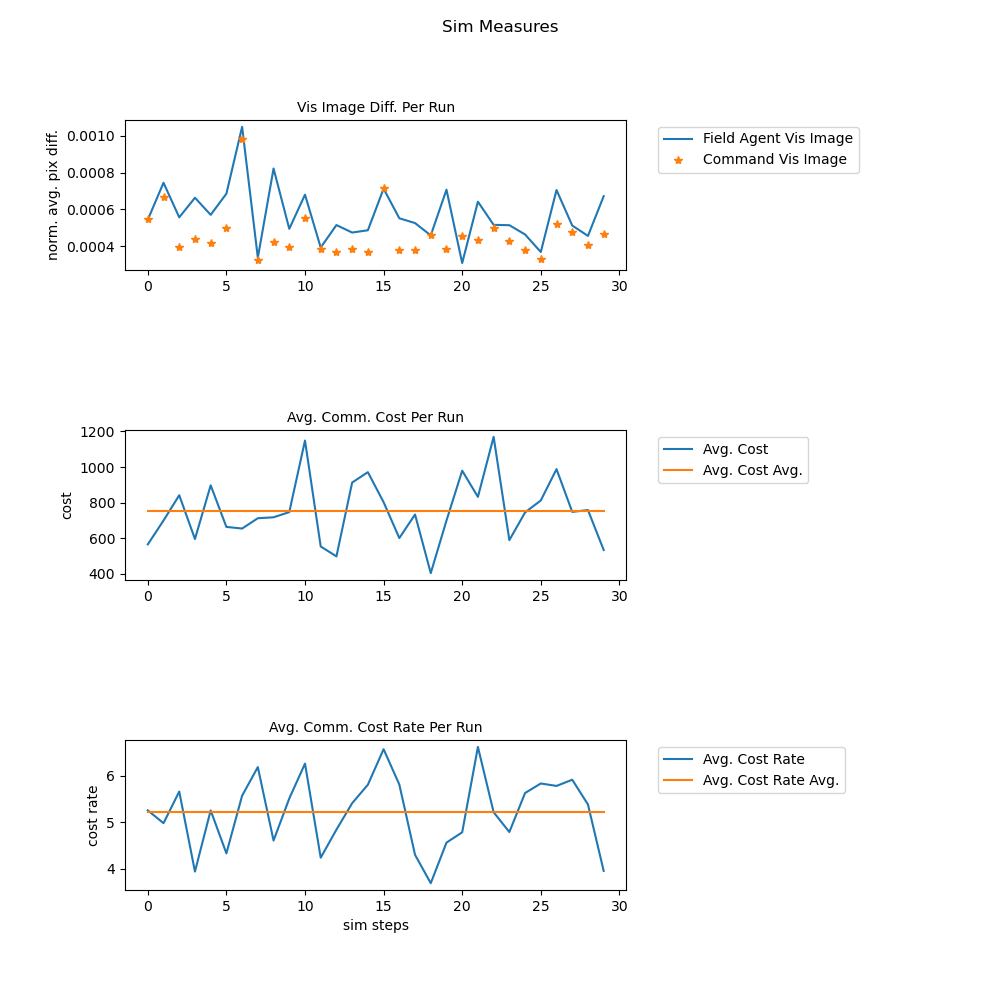

In [ ]:
plt.rcParams[ 'figure.figsize' ] = 10, 10

myFontsize = 10

timeToEndIncidentStackRun1 = timeToEndIncidentStack
avgFieldAgentVisImageDiffStackRun1 = avgFieldAgentVisImageDiffStack
avgCommanderAgentVisImageDiffStackRun1 = avgCommanderAgentVisImageDiffStack
avgCostStackRun1 = avgCostStack
avgCostStackRun1Avg = [ ( sum( avgCostStackRun1 ) / len( avgCostStackRun1 ) ) for x in avgCostStackRun1 ]
avgCostRateStackRun1 = avgCostRateStack
avgCostRateStackRun1Avg = [ ( sum( avgCostRateStackRun1 ) / len( avgCostRateStackRun1 ) ) for x in avgCostRateStackRun1 ]

measFig = plt.figure()
measGs = measFig.add_gridspec( 25, 3 )
measFig.suptitle( 'Sim Measures' )

imageDiffAx = measFig.add_subplot( measGs[ 0:5, 0:2 ] )
imageDiffDiv = make_axes_locatable( imageDiffAx )

costAx = measFig.add_subplot( measGs[ 10:15, 0:2 ] )
costDiv = make_axes_locatable( costAx )

costRateAx = measFig.add_subplot( measGs[ 20:25, 0:2 ] )
costRateDiv = make_axes_locatable( costRateAx )

imageDiffPlot = imageDiffAx.plot( avgFieldAgentVisImageDiffStackRun1, label = 'Field Agent Vis Image' )
imageDiffPlot = imageDiffAx.plot( avgCommanderAgentVisImageDiffStackRun1, '*', label = 'Command Vis Image' )
imageDiffPlotTitle = imageDiffAx.set_title( 'Vis Image Diff. Per Run', fontsize = myFontsize )
imageDiffAx.set_ylabel( 'norm. avg. pix diff.' )
imageDiffAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costPlot = costAx.plot( avgCostStackRun1, label = 'Avg. Cost' )
costPlot = costAx.plot( avgCostStackRun1Avg, label = 'Avg. Cost Avg.' )
costPlotTitle = costAx.set_title( 'Avg. Comm. Cost Per Run', fontsize = myFontsize )
costAx.set_ylabel( 'cost' )
costAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costRatePlot = costRateAx.plot( avgCostRateStackRun1, label = 'Avg. Cost Rate' )
costRatePlot = costRateAx.plot( avgCostRateStackRun1Avg, label = 'Avg. Cost Rate Avg.' )
costRatePlotTitle = costRateAx.set_title( 'Avg. Comm. Cost Rate Per Run', fontsize = myFontsize )
costRateAx.set_ylabel( 'cost rate' )
costRateAx.set_xlabel( 'sim steps' )
costRateAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

In [ ]:
timeToEndIncidentStack = []
avgFieldAgentVisImageDiffStack = []
avgCommanderAgentVisImageDiffStack = []
avgCostStack = []
avgCostRateStack = []
# numSims = 30

for i in range( 0, numSims ):
    
    mapWidth = 125
    mapHeight = 125

    incidentEpicenter = { 'x' : 60, 'y' : 60 }
    emergencyCreationAvgRate = 1 
    emergencySpatialAvg = 5
    emergencyIntensityAvg = 0.5 
    maxNumEmergencies = 30 
    maxEmergencyInteractionDist = 5 
    maxFieldAgentEffect = 0.1

    emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
    incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                        maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

    fieldAgentSize = 1
    reliabilityAvg = 0.5
    moveSpeedAvg = 3 
    tokenDistanceAvg = 10 
    tokenNoiseStdAvg = 0.01 
    maxAgentDist = 10 
    squadSize = 10
    platoonSize = 5 
    companySize = 3

    fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
    fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                              squadSize, platoonSize, companySize, mapWidth, mapHeight )
    fieldAgents.createCompany()
    fieldAgents.setRandomLocs()


#     nodeSize = 1 
#     minNodeIntensity = 15
#     numTotalNodes = 30
#     numDeployedNodes = 10
#     nodeDeploymentSpeedAvg = 100 
#     nodeDeploymentSpeedMax = 200 
#     nodeDeploymentSpeedMin = 50 
#     nodeDeployedTimeAvg = 200 
#     nodeChargeTimeAvg = 5 
#     linkPricePerDist = 0.000001 
#     incidentSize = 50
#     numTransfersPerStepAvg = 35
#     minNumTransfersPerStep = 20
#     innerNodeNum = 2 
#     middleNodeNum = 3 
#     outerNodeNum = 5

    nodeSize = 1 
    minNodeIntensity = 15
    numTotalNodes = 50
    numDeployedNodes = 20
    nodeDeploymentSpeedAvg = 100 
    nodeDeploymentSpeedMax = 200 
    nodeDeploymentSpeedMin = 50 
    nodeDeployedTimeAvg = 200 
    nodeChargeTimeAvg = 5 
    linkPricePerDist = 0.000001 
    incidentSize = 50
    numTransfersPerStepAvg = 35
    minNumTransfersPerStep = 20
    innerNodeNum = 3 
    middleNodeNum = 7 
    outerNodeNum = 10

    commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

    commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                              nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                              nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                              numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

    fieldAgents.commNodes = commNetwork.nodes

    numOfficers = 4
    interferenceRateAvg = 0.99
    interferenceIntensityAvg = 100
    underspendingRateAvg = 10
    overspendingRateAvg = 1000
    objectiveSizeAvg = 2
    maxObjectiveSize = 5
    minObjectiveSize = 1

    officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                                  overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                                  mapWidth )

    commanderAgent = CommanderAgent()

    simDivider = 10
    simTime = 20
    bigThisTime = 0


    fieldAgentVisImageDiffStack = []
    commanderAgentVisImageDiffStack = []

    while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

        bigThisTime += 1

        thisTime = bigThisTime / simDivider

        incident.companies = fieldAgents.companies

        incident.updateEmergencies( thisTime )

        emergencyMap.emergencies = incident.emergencies

        emergencyMap.updateMap()

        commNetwork.companies = fieldAgents.companies

        commNetwork.updateNodeLoc( thisTime )

        commNetwork.updateDirectedCommNetwork()

        commNetworkMap.nodes = commNetwork.nodes

        commNetworkMap.updateMap()

        fieldAgentMap.companies = fieldAgents.companies

        fieldAgentMap.updateMap()

        fieldAgents.emergencyMap = emergencyMap.currentMap 

        fieldAgents.commNetwork = commNetwork.directedNetwork

        fieldAgents.generateVisMap()

        fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

        officerAgents.visMap = fieldAgents.visMap

        officerAgents.updateObjectives()

        commanderAgent.visMap = officerAgents.alteredVisMap

        commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

        commanderAgent.updateOrderMap()

        fieldAgents.orderMap = commanderAgent.orderMap

        fieldAgents.moveAgents()

        print('thisSim: ', i,', thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

    fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
    commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]
    
    timeToEndIncidentStack.append( thisTime )
    avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
    avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
    avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
    avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

<ipython-input-11-d3ae80301edf>:7: RuntimeWarning: invalid value encountered in true_divide
  normImage2 = image2 / norm2


thisSim:  0 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisT

thisSim:  0 , thisTime:  7.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  0 , thisTime:  7.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  0 , thisTime:  7.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  0 , thisTime:  8.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  0 , thisTime:  8.1 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  0 , thisTime:  8.2 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  0 , thisTime:  8.3 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  0 , thisTime:  8.4 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  0 , thisTime:  8.5 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  0 , thisT

thisSim:  0 , thisTime:  15.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  0 , thisTime:  22.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  0 , thisTime:  22.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  0 , thisTime:  22.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  0 , thisTime:  22.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  0 , thisTime:  22.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  0 , thisTime:  23.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  0 , thisTime:  23.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  0 , thisTime:  23.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  0 , thisTime:  23.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  0 , thisTime:  29.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  0 , thisTime:  30.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  0 , thisTime:  30.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  0 , thisTime:  30.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  0 , thisTime:  30.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  0 , thisTime:  30.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  0 , thisTime:  30.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  0 , thisTime:  30.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  0 , thisTime:  30.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  4.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  4.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  4.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  4.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  5.0 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  5.1 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  1 , thisTime:  5.2 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  1 , thisTime:  5.3 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  1 , thisTime:  5.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  1 , thisT

thisSim:  1 , thisTime:  12.1 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  1 , thisTime:  12.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  1 , thisTime:  12.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  1 , thisTime:  12.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  1 , thisTime:  12.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  1 , thisTime:  12.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  1 , thisTime:  12.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  1 , thisTime:  12.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  1 , thisTime:  12.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  19.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  19.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  19.7 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  19.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  19.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  20.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  20.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  20.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  20.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  26.9 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  1 , thisTime:  27.0 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  1 , thisTime:  27.1 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  1 , thisTime:  27.2 , totalNumEmergencies:  27 , currentNumEmergencies:  3 , numEmergenciesEnded:  24
thisSim:  1 , thisTime:  27.3 , totalNumEmergencies:  27 , currentNumEmergencies:  3 , numEmergenciesEnded:  24
thisSim:  1 , thisTime:  27.4 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  1 , thisTime:  27.5 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  1 , thisTime:  27.6 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  1 , thisTime:  27.7 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  4.9 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  2 , thisTime:  5.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  5.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  5.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  5.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  5.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  5.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  5.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  5.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisT

thisSim:  2 , thisTime:  12.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  12.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  12.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  12.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  12.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  12.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  13.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  13.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  13.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  2 , thisTime:  19.8 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  2 , thisTime:  19.9 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  2 , thisTime:  20.0 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  2 , thisTime:  20.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  20.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  20.3 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  20.4 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  20.5 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  2 , thisTime:  20.6 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  2 , thisTime:  27.2 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  27.3 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  27.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  27.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  27.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  27.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  27.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  27.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  28.0 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  2 , thisTime:  34.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  34.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  34.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  34.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  35.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  35.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  35.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  35.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  35.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  3 , thisTime:  5.2 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  3 , thisTime:  5.3 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  3 , thisTime:  5.4 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  3 , thisTime:  5.5 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  3 , thisTime:  5.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  3 , thisTime:  5.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  3 , thisTime:  5.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  3 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  3 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  3 , thisT

thisSim:  3 , thisTime:  12.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  12.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  12.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  13.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  13.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  13.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  13.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  13.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  3 , thisTime:  13.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  3 , thisTime:  20.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  3 , thisTime:  27.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  27.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  27.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  27.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  27.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  28.0 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  28.1 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  28.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  3 , thisTime:  28.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  3 , thisTime:  34.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  3 , thisTime:  35.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  3 , thisTime:  35.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  3 , thisTime:  35.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  3 , thisTime:  35.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  3 , thisTime:  35.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  3 , thisTime:  35.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  3 , thisTime:  35.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  3 , thisTime:  35.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  4 , thisTime:  6.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  4 , thisTime:  6.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  6.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  6.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  6.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  7.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  7.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  7.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  7.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
t

thisSim:  4 , thisTime:  13.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  14.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  14.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  14.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  14.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  14.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  14.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  14.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  14.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  21.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  21.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  21.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  21.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  21.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  21.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  21.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  22.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  22.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  5 , thisTime:  2.4 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisTime:  2.5 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisTime:  2.6 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisTime:  2.8 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisTime:  2.9 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisTime:  3.0 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisTime:  3.1 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisTime:  3.2 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  5 , thisT

thisSim:  5 , thisTime:  10.0 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  10.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  10.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  10.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  10.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  10.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  10.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  10.7 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  5 , thisTime:  10.8 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  

thisSim:  5 , thisTime:  17.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  17.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  17.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  17.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  17.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  17.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  18.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  18.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  18.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  5 , thisTime:  24.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  5 , thisTime:  24.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  5 , thisTime:  25.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  5 , thisTime:  25.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  5 , thisTime:  25.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  5 , thisTime:  25.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  5 , thisTime:  25.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  5 , thisTime:  25.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  5 , thisTime:  25.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  5 , thisTime:  32.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  32.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  32.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  32.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  32.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  32.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  32.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  32.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  33.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  6 , thisTime:  3.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  6 , thisTime:  3.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  6 , thisTime:  3.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  6 , thisTime:  3.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  6 , thisTime:  3.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  6 , thisTime:  3.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  6 , thisTime:  3.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  6 , thisTime:  3.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  6 , thisTime:  4.0 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  6 , thisT

thisSim:  6 , thisTime:  10.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  10.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  11.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  11.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  11.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  11.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  11.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  11.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  11.6 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  

thisSim:  6 , thisTime:  18.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  18.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  18.5 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  18.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  18.7 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  18.8 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  18.9 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  19.0 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  19.1 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thi

thisSim:  6 , thisTime:  25.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  25.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  25.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  26.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  26.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  26.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  26.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  26.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  26.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  6 , thisTime:  33.1 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  33.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  33.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  33.4 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  33.5 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  33.6 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  33.7 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  33.8 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  33.9 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  7 , thisTime:  1.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  1.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  1.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  1.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  1.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  2.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  7 , thisT

thisSim:  7 , thisTime:  8.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  8.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  9.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  9.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  9.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  9.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  9.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  9.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  9.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisT

thisSim:  7 , thisTime:  16.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  7 , thisTime:  16.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  7 , thisTime:  16.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  7 , thisTime:  16.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  7 , thisTime:  16.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  7 , thisTime:  16.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  7 , thisTime:  16.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  7 , thisTime:  17.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  7 , thisTime:  17.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  7 , thisTime:  23.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  23.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  23.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  24.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  24.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  24.2 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  24.3 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  24.4 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  24.5 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  7 , thisTime:  31.1 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  7 , thisTime:  31.2 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  7 , thisTime:  31.3 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  7 , thisTime:  31.4 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  7 , thisTime:  31.5 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  7 , thisTime:  31.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  7 , thisTime:  31.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  7 , thisTime:  31.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  31.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  7 , thisTime:  38.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  7 , thisTime:  38.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  7 , thisTime:  38.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  7 , thisTime:  38.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  7 , thisTime:  38.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  7 , thisTime:  39.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  7 , thisTime:  39.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  7 , thisTime:  39.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  7 , thisTime:  39.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  8 , thisTime:  1.9 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  8 , thisTime:  2.1 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  8 , thisTime:  2.2 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  8 , thisTime:  2.3 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  8 , thisTime:  2.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  8 , thisTime:  2.5 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  8 , thisTime:  2.6 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  8 , thisTime:  2.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  8 , thisT

thisSim:  8 , thisTime:  9.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  9.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  9.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  9.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  9.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  9.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  10.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  10.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  10.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  1

thisSim:  8 , thisTime:  16.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  8 , thisTime:  16.9 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  8 , thisTime:  17.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  17.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  17.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  17.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  17.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  17.5 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  17.6 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  8 , thisTime:  24.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  8 , thisTime:  24.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  8 , thisTime:  24.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  8 , thisTime:  24.5 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  8 , thisTime:  24.6 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  8 , thisTime:  24.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  24.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  24.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  25.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  8 , thisTime:  31.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  31.7 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  9 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 ,

thisSim:  9 , thisTime:  7.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  9 , thisTime:  7.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  9 , thisTime:  7.7 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  9 , thisTime:  7.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  9 , thisTime:  7.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  9 , thisTime:  8.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  9 , thisTime:  8.1 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  9 , thisTime:  8.2 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  9 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  9 , thisT

thisSim:  9 , thisTime:  15.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  15.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  15.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  15.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  15.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  15.5 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  15.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  15.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  15.8 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  9 , thisTime:  22.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  22.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  22.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  22.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  22.8 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  23.0 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  23.1 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  23.2 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  9 , thisTime:  29.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  29.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  30.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  30.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  30.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  30.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  30.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  30.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  30.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  10 , thisTime:  6.5 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  10 , thisTime:  6.6 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  10 , thisTime:  6.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  10 , thisTime:  6.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  10 , thisTime:  6.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  10 , thisTime:  7.0 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  10 , thisTime:  7.1 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  10 , thisTime:  7.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  7.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  

thisSim:  10 , thisTime:  14.0 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  14.1 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  14.2 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  14.3 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  14.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  14.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  14.6 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  14.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  14.8 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergen

thisSim:  10 , thisTime:  21.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  21.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  21.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  21.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  21.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  21.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  21.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  22.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  22.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmerg

thisSim:  10 , thisTime:  28.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  28.7 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  28.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  28.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  29.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  29.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  29.2 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  29.3 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  29.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmerg

thisSim:  10 , thisTime:  35.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  36.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  36.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  36.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  36.3 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  36.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  36.5 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  10 , thisTime:  36.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  10 , thisTime:  36.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmerg

thisSim:  11 , thisTime:  4.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  11 , thisTime:  4.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  11 , thisTime:  4.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  11 , thisTime:  4.9 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  11 , thisTime:  5.0 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  11 , thisTime:  5.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  11 , thisTime:  5.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  11 , thisTime:  5.3 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  11 , thisTime:  5.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  

thisSim:  11 , thisTime:  12.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  11 , thisTime:  12.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  11 , thisTime:  12.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  11 , thisTime:  12.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  11 , thisTime:  12.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  11 , thisTime:  12.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  11 , thisTime:  12.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  11 , thisTime:  12.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  11 , thisTime:  12.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
t

thisSim:  11 , thisTime:  19.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  19.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  19.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  19.8 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  19.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  20.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  20.1 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  20.2 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  20.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmerg

thisSim:  11 , thisTime:  26.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  26.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  27.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  27.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  27.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  27.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  27.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  27.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  27.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  11 , thisTime:  34.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  11 , thisTime:  34.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  11 , thisTime:  34.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  11 , thisTime:  34.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  11 , thisTime:  34.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  11 , thisTime:  34.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  11 , thisTime:  34.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  11 , thisTime:  34.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  11 , thisTime:  34.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  2.8 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  2.9 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  3.0 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  3.1 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  3.2 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  3.3 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  12 , thisTime:  3.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  12 , thisTime:  3.5 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  12 , thisTime:  3.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  

thisSim:  12 , thisTime:  10.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  12 , thisTime:  10.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  12 , thisTime:  10.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  12 , thisTime:  10.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  12 , thisTime:  10.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  12 , thisTime:  10.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  12 , thisTime:  10.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  12 , thisTime:  10.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  12 , thisTime:  11.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  17.5 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  17.6 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  17.7 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  17.8 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  17.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.1 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.2 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.3 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  24.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  12 , thisTime:  24.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  12 , thisTime:  25.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  12 , thisTime:  25.1 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  12 , thisTime:  25.2 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  12 , thisTime:  25.3 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  12 , thisTime:  25.4 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  12 , thisTime:  25.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  12 , thisTime:  25.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  32.1 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  12 , thisTime:  32.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  12 , thisTime:  32.3 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  12 , thisTime:  32.4 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  12 , thisTime:  32.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  12 , thisTime:  32.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  12 , thisTime:  32.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  12 , thisTime:  32.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  12 , thisTime:  32.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  5.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  5.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  5.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  5.6 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  5.7 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  5.8 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  13 , thisTime:  5.9 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  13 , thisTime:  6.0 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  13 , thisTime:  6.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
this

thisSim:  13 , thisTime:  12.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  12.8 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  12.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  13.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  13.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  13.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  13.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  13.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  13.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  20.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  13 , thisTime:  20.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  13 , thisTime:  20.2 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  13 , thisTime:  20.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  20.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  13 , thisTime:  20.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  13 , thisTime:  20.6 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  13 , thisTime:  20.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  13 , thisTime:  20.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmerg

thisSim:  14 , thisTime:  4.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  4.4 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  4.5 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  4.6 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  4.7 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  4.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  14 , thisTime:  4.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  14 , thisTime:  5.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  14 , thisTime:  5.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  

thisSim:  14 , thisTime:  11.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  11.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  12.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  12.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  12.2 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  12.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  12.4 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  12.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  12.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  19.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.6 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  14 , thisTime:  19.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  26.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  14 , thisTime:  26.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  14 , thisTime:  26.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  14 , thisTime:  26.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  14 , thisTime:  26.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  14 , thisTime:  26.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  14 , thisTime:  27.0 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  14 , thisTime:  27.1 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmergenciesEnded:  22
thisSim:  14 , thisTime:  27.2 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmerg

thisSim:  14 , thisTime:  33.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  33.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  34.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  34.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  34.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  34.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  34.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  34.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmerg

thisSim:  15 , thisTime:  5.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  5.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  5.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  5.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  5.8 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  5.9 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  6.0 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  6.1 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  6.2 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  

thisSim:  15 , thisTime:  12.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  15 , thisTime:  13.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  15 , thisTime:  13.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  15 , thisTime:  13.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  15 , thisTime:  13.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  15 , thisTime:  13.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  15 , thisTime:  13.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  15 , thisTime:  13.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  13.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmerg

thisSim:  15 , thisTime:  20.2 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  15 , thisTime:  20.3 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  15 , thisTime:  20.4 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenciesEnded:  17
thisSim:  15 , thisTime:  20.5 , totalNumEmergencies:  20 , currentNumEmergencies:  3 , numEmergenciesEnded:  17
thisSim:  15 , thisTime:  20.6 , totalNumEmergencies:  20 , currentNumEmergencies:  3 , numEmergenciesEnded:  17
thisSim:  15 , thisTime:  20.7 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  20.8 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  15 , thisTime:  20.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  21.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmerg

thisSim:  15 , thisTime:  27.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  27.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  27.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  27.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  27.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  28.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  28.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  28.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  28.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmerg

thisSim:  16 , thisTime:  4.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  16 , thisTime:  4.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  16 , thisTime:  4.3 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  16 , thisTime:  4.4 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  16 , thisTime:  4.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  4.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  4.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  4.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  16 , thisTime:  4.9 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  

thisSim:  16 , thisTime:  11.5 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  16 , thisTime:  11.6 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  16 , thisTime:  11.7 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  16 , thisTime:  11.8 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  11.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  12.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  12.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  12.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  16 , thisTime:  12.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  16 , thisTime:  18.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  18.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  19.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  19.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  19.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  19.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  19.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  19.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  19.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmerg

thisSim:  16 , thisTime:  26.1 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  16 , thisTime:  26.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  16 , thisTime:  26.3 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  16 , thisTime:  26.4 , totalNumEmergencies:  29 , currentNumEmergencies:  3 , numEmergenciesEnded:  26
thisSim:  16 , thisTime:  26.5 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  16 , thisTime:  26.6 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  16 , thisTime:  26.7 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  16 , thisTime:  26.8 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  16 , thisTime:  26.9 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmerg

thisSim:  17 , thisTime:  5.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  5.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  5.8 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  5.9 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  6.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  17 , thisTime:  6.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  17 , thisTime:  6.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  17 , thisTime:  6.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  17 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  

thisSim:  17 , thisTime:  13.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  13.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  13.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  13.4 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  13.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  13.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  13.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  17 , thisTime:  13.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  17 , thisTime:  13.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmerg

thisSim:  17 , thisTime:  20.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  17 , thisTime:  20.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  17 , thisTime:  20.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  17 , thisTime:  20.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  17 , thisTime:  20.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  17 , thisTime:  20.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  17 , thisTime:  21.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  17 , thisTime:  21.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  17 , thisTime:  21.2 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmerg

thisSim:  17 , thisTime:  27.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  27.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  27.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.2 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmerg

thisSim:  17 , thisTime:  35.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  17 , thisTime:  35.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  17 , thisTime:  35.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  17 , thisTime:  35.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  17 , thisTime:  35.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  17 , thisTime:  35.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  17 , thisTime:  35.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  17 , thisTime:  35.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  17 , thisTime:  35.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmerg

thisSim:  18 , thisTime:  4.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  4.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  4.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  4.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  4.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  5.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  5.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  5.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  5.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  

thisSim:  18 , thisTime:  12.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  12.1 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  12.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  12.3 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  12.4 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  12.5 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  12.6 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  12.7 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  12.8 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
t

thisSim:  18 , thisTime:  19.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  18 , thisTime:  19.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  18 , thisTime:  19.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  18 , thisTime:  19.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  18 , thisTime:  19.8 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  18 , thisTime:  19.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  18 , thisTime:  20.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  18 , thisTime:  20.1 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  18 , thisTime:  20.2 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmerg

thisSim:  18 , thisTime:  26.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  18 , thisTime:  26.8 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  18 , thisTime:  26.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  27.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  27.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  27.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  27.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  27.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  18 , thisTime:  27.5 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmerg

thisSim:  18 , thisTime:  34.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  18 , thisTime:  34.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  18 , thisTime:  34.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  18 , thisTime:  34.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  18 , thisTime:  34.4 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  18 , thisTime:  34.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  18 , thisTime:  34.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  18 , thisTime:  34.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  18 , thisTime:  34.8 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmerg

thisSim:  19 , thisTime:  5.3 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  19 , thisTime:  5.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  5.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  5.6 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  19 , thisTime:  5.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  19 , thisTime:  5.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  19 , thisTime:  5.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  19 , thisTime:  6.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  19 , thisTime:  6.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  

thisSim:  19 , thisTime:  12.7 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  12.8 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  12.9 , totalNumEmergencies:  14 , currentNumEmergencies:  3 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  13.0 , totalNumEmergencies:  14 , currentNumEmergencies:  3 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  13.1 , totalNumEmergencies:  15 , currentNumEmergencies:  4 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  13.2 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  19 , thisTime:  13.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  19 , thisTime:  13.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  19 , thisTime:  13.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmerg

thisSim:  19 , thisTime:  20.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  19 , thisTime:  20.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  19 , thisTime:  20.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  19 , thisTime:  20.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  19 , thisTime:  20.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  19 , thisTime:  20.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  19 , thisTime:  20.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  19 , thisTime:  20.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  19 , thisTime:  20.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  19 , thisTime:  27.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  27.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  27.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  27.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  27.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  27.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  27.9 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  20 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  20 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergencie

thisSim:  20 , thisTime:  6.9 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  20 , thisTime:  7.0 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  20 , thisTime:  7.1 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  20 , thisTime:  7.2 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  7.3 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  7.4 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  7.5 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  7.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  7.7 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisS

thisSim:  20 , thisTime:  14.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  14.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  14.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  14.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  14.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  14.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  14.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  14.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  15.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  20 , thisTime:  21.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  21.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  21.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  21.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  21.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  22.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  22.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  22.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  22.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  21 , thisTime:  1.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  2.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  2.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  

thisSim:  21 , thisTime:  8.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  8.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  9.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  9.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  9.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  9.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  9.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  9.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  9.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  

thisSim:  21 , thisTime:  16.2 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  16.3 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  16.4 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  21 , thisTime:  16.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  17.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenc

thisSim:  21 , thisTime:  23.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  21 , thisTime:  23.6 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  21 , thisTime:  23.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  23.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  23.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  24.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  24.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  24.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  24.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmerg

thisSim:  21 , thisTime:  30.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  30.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  31.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  31.1 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  31.2 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  31.3 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  31.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  21 , thisTime:  31.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  21 , thisTime:  31.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  4.1 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  4.2 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  22 , thisTime:  4.3 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  22 , thisTime:  4.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  22 , thisTime:  4.5 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  22 , thisTime:  4.6 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  22 , thisTime:  4.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  22 , thisTime:  4.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  22 , thisTime:  4.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  

thisSim:  22 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  11.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  11.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  12.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  12.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  12.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  12.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  12.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmerge

thisSim:  22 , thisTime:  18.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  26.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  22 , thisTime:  26.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  22 , thisTime:  26.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  26.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  26.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  26.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  26.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  26.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  22 , thisTime:  27.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  4.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  4.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  4.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  4.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  4.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  5.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  5.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  5.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  5.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  

thisSim:  23 , thisTime:  12.0 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  23 , thisTime:  12.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  23 , thisTime:  12.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  23 , thisTime:  12.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  23 , thisTime:  12.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  23 , thisTime:  12.5 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  23 , thisTime:  12.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  12.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  12.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  19.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  23 , thisTime:  19.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  23 , thisTime:  19.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  19.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  19.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  19.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  19.9 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  20.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  23 , thisTime:  20.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  26.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  26.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  26.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  26.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  27.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  27.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  27.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  27.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  27.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  3.6 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  3.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  3.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  3.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  

thisSim:  24 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  24 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  24 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  24 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  24 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  24 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  24 , thisTime:  11.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  24 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  24 , thisTime:  11.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  18.4 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  24 , thisTime:  18.5 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  18.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  24 , thisTime:  18.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  24 , thisTime:  18.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  24 , thisTime:  18.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  24 , thisTime:  19.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  24 , thisTime:  19.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  24 , thisTime:  19.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  25.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  24 , thisTime:  25.8 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  25.9 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  26.0 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  26.1 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  24 , thisTime:  26.2 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  24 , thisTime:  26.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  26.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  26.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  33.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  33.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  33.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  33.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  33.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  33.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  33.6 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  33.7 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  33.8 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  25 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  25 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  25 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  25 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  25 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  25 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  25 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  25 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  

thisSim:  25 , thisTime:  7.7 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  25 , thisTime:  7.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  7.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  8.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  8.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  8.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  8.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  8.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  8.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  

thisSim:  25 , thisTime:  15.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  25 , thisTime:  15.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  25 , thisTime:  15.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  25 , thisTime:  15.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  25 , thisTime:  15.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  25 , thisTime:  15.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  25 , thisTime:  15.8 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  25 , thisTime:  15.9 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  25 , thisTime:  16.0 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  

thisSim:  25 , thisTime:  22.5 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  25 , thisTime:  22.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  22.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  22.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  22.9 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  23.0 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  23.1 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  25 , thisTime:  23.2 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  25 , thisTime:  23.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  29.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  29.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  30.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  30.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  30.2 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  30.3 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  30.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  30.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  30.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  26 , thisTime:  4.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  4.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  4.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  4.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  4.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  4.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  4.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  26 , thisTime:  5.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  26 , thisTime:  5.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  

thisSim:  26 , thisTime:  11.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  11.9 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  12.0 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  12.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  26 , thisTime:  12.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  26 , thisTime:  12.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  26 , thisTime:  12.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  26 , thisTime:  12.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  26 , thisTime:  12.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
t

thisSim:  26 , thisTime:  19.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  26 , thisTime:  19.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  26 , thisTime:  19.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  26 , thisTime:  19.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  26 , thisTime:  19.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  26 , thisTime:  19.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  26 , thisTime:  19.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  26 , thisTime:  19.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  26 , thisTime:  19.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmerg

thisSim:  26 , thisTime:  26.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  26 , thisTime:  26.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  26 , thisTime:  26.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  26 , thisTime:  26.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  26 , thisTime:  26.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  26 , thisTime:  26.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  26 , thisTime:  27.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  26 , thisTime:  27.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  26 , thisTime:  27.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmerg

thisSim:  26 , thisTime:  33.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  33.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  33.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  34.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  34.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  34.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  34.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  34.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  34.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  26 , thisTime:  41.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  41.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  41.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  41.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  41.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  41.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  41.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  41.7 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  26 , thisTime:  41.8 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmerg

thisSim:  27 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  6.1 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  6.2 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  27 , thisTime:  6.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  27 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  27 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  27 , thisTime:  6.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  27 , thisTime:  6.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  

thisSim:  27 , thisTime:  13.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  27 , thisTime:  13.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  27 , thisTime:  13.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  27 , thisTime:  13.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  27 , thisTime:  13.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  27 , thisTime:  13.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  27 , thisTime:  13.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  27 , thisTime:  14.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  27 , thisTime:  14.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmerg

thisSim:  27 , thisTime:  20.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  20.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  20.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  20.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  21.0 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  21.1 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  21.2 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  21.3 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  27 , thisTime:  21.4 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmerg

thisSim:  27 , thisTime:  27.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  27 , thisTime:  28.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  27 , thisTime:  28.1 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  28 , thisTime:  0.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
t

thisSim:  28 , thisTime:  7.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  28 , thisTime:  7.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  28 , thisTime:  7.5 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  28 , thisTime:  7.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  7.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  7.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  7.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  8.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  8.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  

thisSim:  28 , thisTime:  14.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  28 , thisTime:  14.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  28 , thisTime:  14.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  28 , thisTime:  15.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  28 , thisTime:  15.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  28 , thisTime:  15.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  28 , thisTime:  15.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  28 , thisTime:  15.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  28 , thisTime:  15.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmerg

thisSim:  28 , thisTime:  22.0 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  22.1 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  22.2 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  22.3 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  22.4 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  28 , thisTime:  22.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  28 , thisTime:  22.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  28 , thisTime:  22.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  28 , thisTime:  22.8 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmerg

thisSim:  29 , thisTime:  2.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  29 , thisTime:  2.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  29 , thisTime:  2.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  29 , thisTime:  2.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  29 , thisTime:  2.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  29 , thisTime:  2.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  29 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  29 , thisTime:  2.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  29 , thisTime:  2.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  

thisSim:  29 , thisTime:  9.5 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  29 , thisTime:  9.6 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  29 , thisTime:  9.7 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  29 , thisTime:  9.8 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  29 , thisTime:  9.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  10.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  29 , thisTime:  10.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  29 , thisTime:  10.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  29 , thisTime:  10.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergencie

thisSim:  29 , thisTime:  16.8 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  16.9 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  17.0 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  17.1 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  17.2 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  17.3 , totalNumEmergencies:  22 , currentNumEmergencies:  3 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  17.4 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  29 , thisTime:  17.5 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  29 , thisTime:  17.6 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmerg

thisSim:  29 , thisTime:  24.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  24.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  24.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  24.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  24.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  24.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  24.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  24.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  24.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

<IPython.core.display.Javascript object>


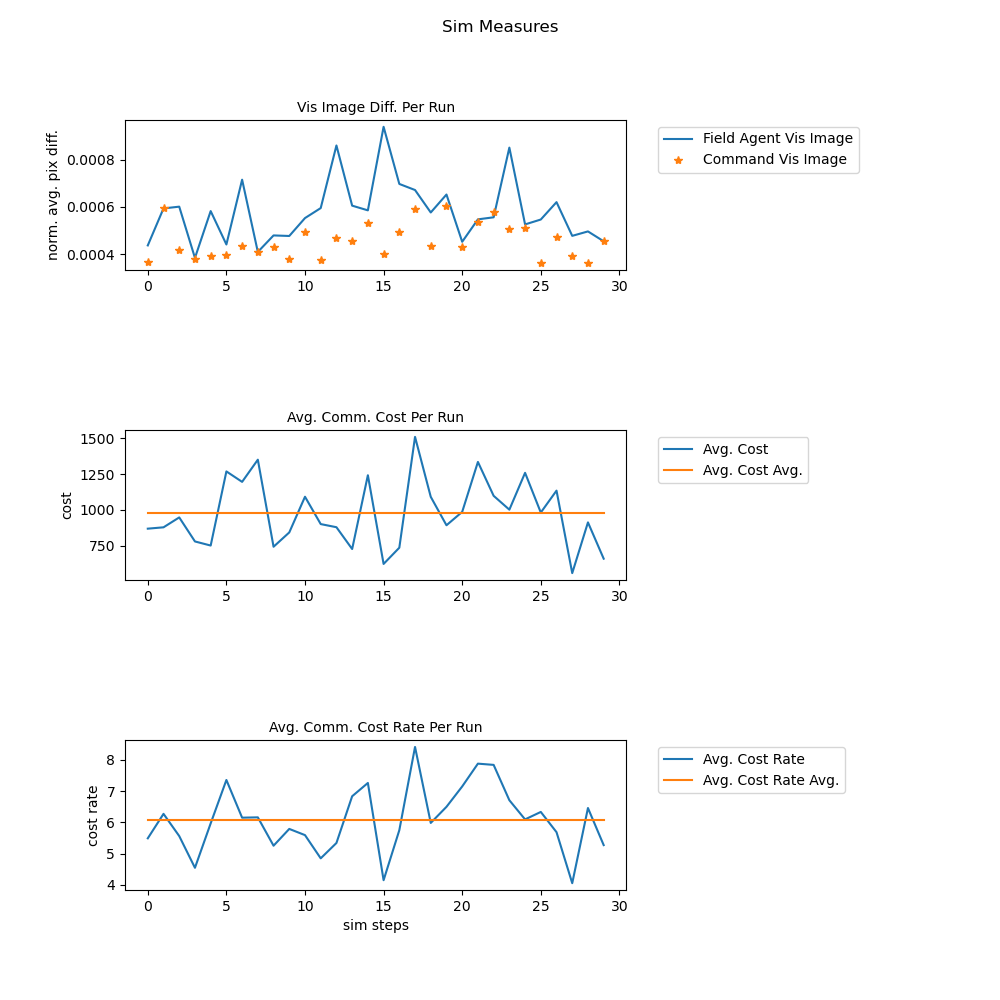

In [ ]:
plt.rcParams[ 'figure.figsize' ] = 10, 10

timeToEndIncidentStackRun2 = timeToEndIncidentStack
avgFieldAgentVisImageDiffStackRun2 = avgFieldAgentVisImageDiffStack
avgCommanderAgentVisImageDiffStackRun2 = avgCommanderAgentVisImageDiffStack
avgCostStackRun2 = avgCostStack
avgCostStackRun2Avg = [ ( sum( avgCostStackRun2 ) / len( avgCostStackRun2 ) ) for x in avgCostStackRun2 ]
avgCostRateStackRun2 = avgCostRateStack
avgCostRateStackRun2Avg = [ ( sum( avgCostRateStackRun2 ) / len( avgCostRateStackRun2 ) ) for x in avgCostRateStackRun2 ]

measFig = plt.figure()
measGs = measFig.add_gridspec( 25, 3 )
measFig.suptitle( 'Sim Measures' )

imageDiffAx = measFig.add_subplot( measGs[ 0:5, 0:2 ] )
imageDiffDiv = make_axes_locatable( imageDiffAx )

costAx = measFig.add_subplot( measGs[ 10:15, 0:2 ] )
costDiv = make_axes_locatable( costAx )

costRateAx = measFig.add_subplot( measGs[ 20:25, 0:2 ] )
costRateDiv = make_axes_locatable( costRateAx )

imageDiffPlot = imageDiffAx.plot( avgFieldAgentVisImageDiffStackRun2, label = 'Field Agent Vis Image' )
imageDiffPlot = imageDiffAx.plot( avgCommanderAgentVisImageDiffStackRun2, '*', label = 'Command Vis Image' )
imageDiffPlotTitle = imageDiffAx.set_title( 'Vis Image Diff. Per Run', fontsize = myFontsize )
imageDiffAx.set_ylabel( 'norm. avg. pix diff.' )
imageDiffAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costPlot = costAx.plot( avgCostStackRun2, label = 'Avg. Cost' )
costPlot = costAx.plot( avgCostStackRun2Avg, label = 'Avg. Cost Avg.' )
costPlotTitle = costAx.set_title( 'Avg. Comm. Cost Per Run', fontsize = myFontsize )
costAx.set_ylabel( 'cost' )
costAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costRatePlot = costRateAx.plot( avgCostRateStackRun2, label = 'Avg. Cost Rate' )
costRatePlot = costRateAx.plot( avgCostRateStackRun2Avg, label = 'Avg. Cost Rate Avg.' )
costRatePlotTitle = costRateAx.set_title( 'Avg. Comm. Cost Rate Per Run', fontsize = myFontsize )
costRateAx.set_ylabel( 'cost rate' )
costRateAx.set_xlabel( 'sim steps' )
costRateAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

In [ ]:
timeToEndIncidentStack = []
avgFieldAgentVisImageDiffStack = []
avgCommanderAgentVisImageDiffStack = []
avgCostStack = []
avgCostRateStack = []
# numSims = 30

for i in range( 0, numSims ):
    
    mapWidth = 125
    mapHeight = 125

    incidentEpicenter = { 'x' : 60, 'y' : 60 }
    emergencyCreationAvgRate = 1 
    emergencySpatialAvg = 5
    emergencyIntensityAvg = 0.5 
    maxNumEmergencies = 30 
    maxEmergencyInteractionDist = 5 
    maxFieldAgentEffect = 0.1

    emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
    incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                        maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

    fieldAgentSize = 1
    reliabilityAvg = 0.5
    moveSpeedAvg = 3 
    tokenDistanceAvg = 10 
    tokenNoiseStdAvg = 0.01 
    maxAgentDist = 10 
    squadSize = 3
    platoonSize = 2 
    companySize = 1

    fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
    fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                              squadSize, platoonSize, companySize, mapWidth, mapHeight )
    fieldAgents.createCompany()
    fieldAgents.createCompany()
    fieldAgents.createCompany()
    fieldAgents.setRandomLocs()


#     nodeSize = 1 
#     minNodeIntensity = 15
#     numTotalNodes = 30
#     numDeployedNodes = 10
#     nodeDeploymentSpeedAvg = 100 
#     nodeDeploymentSpeedMax = 200 
#     nodeDeploymentSpeedMin = 50 
#     nodeDeployedTimeAvg = 200 
#     nodeChargeTimeAvg = 5 
#     linkPricePerDist = 0.000001 
#     incidentSize = 50
#     numTransfersPerStepAvg = 35
#     minNumTransfersPerStep = 20
#     innerNodeNum = 2 
#     middleNodeNum = 3 
#     outerNodeNum = 5

    nodeSize = 1 
    minNodeIntensity = 15
    numTotalNodes = 50
    numDeployedNodes = 20
    nodeDeploymentSpeedAvg = 100 
    nodeDeploymentSpeedMax = 200 
    nodeDeploymentSpeedMin = 50 
    nodeDeployedTimeAvg = 200 
    nodeChargeTimeAvg = 5 
    linkPricePerDist = 0.000001 
    incidentSize = 50
    numTransfersPerStepAvg = 35
    minNumTransfersPerStep = 20
    innerNodeNum = 3 
    middleNodeNum = 7 
    outerNodeNum = 10

    commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

    commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                              nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                              nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                              numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

    fieldAgents.commNodes = commNetwork.nodes

    numOfficers = 4
    interferenceRateAvg = 0.99
    interferenceIntensityAvg = 100
    underspendingRateAvg = 10
    overspendingRateAvg = 1000
    objectiveSizeAvg = 2
    maxObjectiveSize = 5
    minObjectiveSize = 1

    officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                                  overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                                  mapWidth )

    commanderAgent = CommanderAgent()

    simDivider = 10
    simTime = 20
    bigThisTime = 0


    fieldAgentVisImageDiffStack = []
    commanderAgentVisImageDiffStack = []

    while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

        bigThisTime += 1

        thisTime = bigThisTime / simDivider

        incident.companies = fieldAgents.companies

        incident.updateEmergencies( thisTime )

        emergencyMap.emergencies = incident.emergencies

        emergencyMap.updateMap()

        commNetwork.companies = fieldAgents.companies

        commNetwork.updateNodeLoc( thisTime )

        commNetwork.updateDirectedCommNetwork()

        commNetworkMap.nodes = commNetwork.nodes

        commNetworkMap.updateMap()

        fieldAgentMap.companies = fieldAgents.companies

        fieldAgentMap.updateMap()

        fieldAgents.emergencyMap = emergencyMap.currentMap 

        fieldAgents.commNetwork = commNetwork.directedNetwork

        fieldAgents.generateVisMap()

        fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

        officerAgents.visMap = fieldAgents.visMap

        officerAgents.updateObjectives()

        commanderAgent.visMap = officerAgents.alteredVisMap

        commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

        commanderAgent.updateOrderMap()

        fieldAgents.orderMap = commanderAgent.orderMap

        fieldAgents.moveAgents()

        print('thisSim: ', i,', thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

    fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
    commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]
    
    timeToEndIncidentStack.append( thisTime )
    avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
    avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
    avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
    avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

thisSim:  0 , thisTime:  0.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.7 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.8 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.9 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  0 , thisT

thisSim:  0 , thisTime:  7.9 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.0 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.1 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.2 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.3 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.4 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.5 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.6 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.7 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisT

<ipython-input-11-d3ae80301edf>:7: RuntimeWarning: invalid value encountered in true_divide
  normImage2 = image2 / norm2


thisSim:  0 , thisTime:  13.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  13.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  13.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  13.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  14.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  14.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  14.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  14.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  0 , thisTime:  14.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  0 , thisTime:  21.2 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  0 , thisTime:  21.3 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  0 , thisTime:  21.4 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  0 , thisTime:  21.5 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  0 , thisTime:  21.6 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  0 , thisTime:  21.7 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  0 , thisTime:  21.8 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  0 , thisTime:  21.9 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  0 , thisTime:  22.0 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  0 , thisTime:  28.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  0 , thisTime:  28.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  28.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  28.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  29.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  29.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  29.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  29.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  29.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  0 , thisTime:  36.2 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  1 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  1 , th

thisSim:  1 , thisTime:  7.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisTime:  7.7 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisTime:  7.8 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisTime:  7.9 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisTime:  8.0 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisTime:  8.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisTime:  8.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  1 , thisT

thisSim:  1 , thisTime:  15.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  15.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  15.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  15.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  15.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  15.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  15.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  15.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  16.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  22.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  23.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  23.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  23.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  23.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  23.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  23.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  23.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  2 , thisT

thisSim:  2 , thisTime:  7.9 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  8.0 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  8.1 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  8.2 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  8.3 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  8.4 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  8.5 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  8.6 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  8.7 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  2 , thisT

thisSim:  2 , thisTime:  15.7 , totalNumEmergencies:  13 , currentNumEmergencies:  4 , numEmergenciesEnded:  9
thisSim:  2 , thisTime:  15.8 , totalNumEmergencies:  13 , currentNumEmergencies:  4 , numEmergenciesEnded:  9
thisSim:  2 , thisTime:  15.9 , totalNumEmergencies:  13 , currentNumEmergencies:  3 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  16.0 , totalNumEmergencies:  13 , currentNumEmergencies:  3 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  16.1 , totalNumEmergencies:  13 , currentNumEmergencies:  3 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  16.2 , totalNumEmergencies:  13 , currentNumEmergencies:  3 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  16.3 , totalNumEmergencies:  13 , currentNumEmergencies:  3 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  16.4 , totalNumEmergencies:  13 , currentNumEmergencies:  3 , numEmergenciesEnded:  10
thisSim:  2 , thisTime:  16.5 , totalNumEmergencies:  13 , currentNumEmergencies:  3 , numEmergenciesEnded

thisSim:  2 , thisTime:  23.1 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  2 , thisTime:  23.2 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  2 , thisTime:  23.3 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  2 , thisTime:  23.4 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  2 , thisTime:  23.5 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  2 , thisTime:  23.6 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  2 , thisTime:  23.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  2 , thisTime:  23.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  2 , thisTime:  23.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  30.5 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  2 , thisTime:  30.6 , totalNumEmergencies:  26 , currentNumEmergencies:  4 , numEmergenciesEnded:  22
thisSim:  2 , thisTime:  30.7 , totalNumEmergencies:  26 , currentNumEmergencies:  4 , numEmergenciesEnded:  22
thisSim:  2 , thisTime:  30.8 , totalNumEmergencies:  26 , currentNumEmergencies:  4 , numEmergenciesEnded:  22
thisSim:  2 , thisTime:  30.9 , totalNumEmergencies:  26 , currentNumEmergencies:  4 , numEmergenciesEnded:  22
thisSim:  2 , thisTime:  31.0 , totalNumEmergencies:  26 , currentNumEmergencies:  3 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  31.1 , totalNumEmergencies:  27 , currentNumEmergencies:  4 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  31.2 , totalNumEmergencies:  27 , currentNumEmergencies:  3 , numEmergenciesEnded:  24
thisSim:  2 , thisTime:  31.3 , totalNumEmergencies:  27 , currentNumEmergencies:  3 , numEmergenciesEnd

thisSim:  2 , thisTime:  38.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  38.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  38.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  38.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  38.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  38.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  38.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  38.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  39.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  45.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  46.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  46.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  46.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  46.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  46.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  46.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  46.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  46.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  53.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  53.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  53.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  53.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  54.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  54.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  54.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  54.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  54.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  61.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  61.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  61.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  61.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  61.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  61.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  61.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  62.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  62.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  69.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  69.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  69.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  69.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  69.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  69.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  69.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  69.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  69.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  76.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  76.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  76.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  76.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  76.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  76.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  77.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  77.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  77.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  84.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  84.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  84.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  84.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  84.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  84.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  84.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  84.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  84.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  91.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  91.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  91.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  91.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  91.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  92.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  92.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  92.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  92.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  98.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  99.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  99.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  99.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  99.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  99.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  99.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  99.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  99.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  106.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  106.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  106.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  106.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  106.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  106.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  106.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  106.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  107.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  3 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  3 , thisT

thisSim:  3 , thisTime:  7.7 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  7.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  7.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.1 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.2 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  8.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  3 , thisT

thisSim:  3 , thisTime:  15.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  3 , thisTime:  15.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.7 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.8 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.9 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  3 , thisTime:  22.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  3 , thisTime:  22.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  3 , thisTime:  22.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  3 , thisTime:  22.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  3 , thisTime:  22.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  3 , thisTime:  23.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  3 , thisTime:  23.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  3 , thisTime:  23.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  3 , thisTime:  23.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  3.1 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  3.2 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  3.3 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  3.4 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  3.5 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  3.6 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  3.7 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  3.8 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  3.9 , totalNumEmergencies:  6 , currentNumEmergencies:  4 , numEmergenciesEnded:  2
thisSim:  4 , thisT

thisSim:  4 , thisTime:  10.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  10.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  10.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  10.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  11.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  11.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  11.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  11.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  11.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  18.1 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  18.2 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  4 , thisTime:  18.3 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  4 , thisTime:  18.4 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  4 , thisTime:  18.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  4 , thisTime:  18.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  4 , thisTime:  18.7 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  4 , thisTime:  18.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  4 , thisTime:  18.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  25.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  4 , thisTime:  25.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  4 , thisTime:  25.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  4 , thisTime:  26.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  4 , thisTime:  26.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  4 , thisTime:  26.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  4 , thisTime:  26.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  4 , thisTime:  26.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  4 , thisTime:  26.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  5 , thisTime:  4.8 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisTime:  4.9 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisTime:  5.0 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisTime:  5.1 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisTime:  5.2 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisTime:  5.3 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisTime:  5.4 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisTime:  5.5 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisTime:  5.6 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  5 , thisT

thisSim:  5 , thisTime:  12.4 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  12.5 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  12.6 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  12.7 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  12.8 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  12.9 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  13.0 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  13.1 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  13.2 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
this

thisSim:  5 , thisTime:  19.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  20.0 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  20.1 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  20.2 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  20.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  20.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  20.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  20.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  20.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  5 , thisTime:  27.3 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  5 , thisTime:  27.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  5 , thisTime:  27.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  5 , thisTime:  27.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  5 , thisTime:  27.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  5 , thisTime:  27.8 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  5 , thisTime:  27.9 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  5 , thisTime:  28.0 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  5 , thisTime:  28.1 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  5 , thisTime:  34.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  34.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  34.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  35.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  35.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  35.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  35.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  35.4 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  35.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  6 , thisTime:  3.0 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  6 , thisTime:  3.1 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  6 , thisTime:  3.2 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  6 , thisTime:  3.3 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  6 , thisTime:  3.4 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  6 , thisTime:  3.5 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  6 , thisTime:  3.6 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  6 , thisTime:  3.7 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  6 , thisTime:  3.8 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  6 , thisT

thisSim:  6 , thisTime:  10.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  6 , thisTime:  10.9 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  6 , thisTime:  11.0 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  6 , thisTime:  11.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  11.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  11.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  11.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  11.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  6 , thisTime:  11.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  

thisSim:  6 , thisTime:  18.3 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  6 , thisTime:  18.4 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  6 , thisTime:  18.5 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  6 , thisTime:  18.6 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  6 , thisTime:  18.7 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  6 , thisTime:  18.8 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  6 , thisTime:  18.9 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  6 , thisTime:  19.0 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  6 , thisTime:  19.1 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  6 , thisTime:  25.7 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  25.8 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  25.9 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  6 , thisTime:  26.0 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  6 , thisTime:  26.1 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  6 , thisTime:  26.2 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  6 , thisTime:  26.3 , totalNumEmergencies:  29 , currentNumEmergencies:  3 , numEmergenciesEnded:  26
thisSim:  6 , thisTime:  26.4 , totalNumEmergencies:  29 , currentNumEmergencies:  3 , numEmergenciesEnded:  26
thisSim:  6 , thisTime:  26.5 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  7 , thisTime:  4.9 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  5.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  5.1 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  5.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  5.3 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  5.4 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  5.5 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  5.6 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  5.7 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisT

thisSim:  7 , thisTime:  12.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  7 , thisTime:  12.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  7 , thisTime:  12.9 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  7 , thisTime:  13.0 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  7 , thisTime:  13.1 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  7 , thisTime:  13.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  7 , thisTime:  13.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  7 , thisTime:  13.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  7 , thisTime:  13.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  7 , thisTime:  20.1 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.2 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.3 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.4 , totalNumEmergencies:  18 , currentNumEmergencies:  3 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.5 , totalNumEmergencies:  18 , currentNumEmergencies:  3 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.6 , totalNumEmergencies:  18 , currentNumEmergencies:  3 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.7 , totalNumEmergencies:  18 , currentNumEmergencies:  3 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.8 , totalNumEmergencies:  18 , currentNumEmergencies:  3 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.9 , totalNumEmergencies:  18 , currentNumEmergencies:  3 , numEmergenciesEnd

thisSim:  7 , thisTime:  27.8 , totalNumEmergencies:  27 , currentNumEmergencies:  3 , numEmergenciesEnded:  24
thisSim:  7 , thisTime:  27.9 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  7 , thisTime:  28.0 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  28.1 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  28.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  28.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  28.4 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  28.5 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  28.6 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  4.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  4.3 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  4.4 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  4.5 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  4.6 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  4.7 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  4.8 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  4.9 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  5.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  8 , thisT

thisSim:  8 , thisTime:  12.1 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  12.2 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  12.3 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  12.4 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  12.5 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  12.6 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  12.7 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  12.8 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  12.9 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesEnded:  0
thisSim:

thisSim:  8 , thisTime:  19.8 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  19.9 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  20.0 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  20.1 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  20.2 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  20.3 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  20.4 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  20.5 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  20.6 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEn

thisSim:  8 , thisTime:  27.2 , totalNumEmergencies:  22 , currentNumEmergencies:  15 , numEmergenciesEnded:  7
thisSim:  8 , thisTime:  27.3 , totalNumEmergencies:  22 , currentNumEmergencies:  14 , numEmergenciesEnded:  8
thisSim:  8 , thisTime:  27.4 , totalNumEmergencies:  22 , currentNumEmergencies:  14 , numEmergenciesEnded:  8
thisSim:  8 , thisTime:  27.5 , totalNumEmergencies:  23 , currentNumEmergencies:  14 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  27.6 , totalNumEmergencies:  23 , currentNumEmergencies:  13 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  27.7 , totalNumEmergencies:  23 , currentNumEmergencies:  13 , numEmergenciesEnded:  10
thisSim:  8 , thisTime:  27.8 , totalNumEmergencies:  23 , currentNumEmergencies:  12 , numEmergenciesEnded:  11
thisSim:  8 , thisTime:  27.9 , totalNumEmergencies:  23 , currentNumEmergencies:  12 , numEmergenciesEnded:  11
thisSim:  8 , thisTime:  28.0 , totalNumEmergencies:  23 , currentNumEmergencies:  11 , numEmergenci

thisSim:  8 , thisTime:  34.6 , totalNumEmergencies:  29 , currentNumEmergencies:  8 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  34.7 , totalNumEmergencies:  30 , currentNumEmergencies:  9 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  34.8 , totalNumEmergencies:  30 , currentNumEmergencies:  8 , numEmergenciesEnded:  22
thisSim:  8 , thisTime:  34.9 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  8 , thisTime:  35.0 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  8 , thisTime:  35.1 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  8 , thisTime:  35.2 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  8 , thisTime:  35.3 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  8 , thisTime:  35.4 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnd

thisSim:  8 , thisTime:  42.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  42.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  42.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  42.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  42.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  42.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  42.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  42.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  42.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  49.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  49.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  49.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  49.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  50.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  50.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  50.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  50.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  50.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  57.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  57.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  57.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  57.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  57.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  57.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  57.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  57.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  57.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  64.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  64.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  65.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  65.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  65.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  65.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  65.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  65.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  65.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  72.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  72.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  72.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  72.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  72.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  72.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  72.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  73.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  73.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  79.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  79.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  80.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  80.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  80.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  80.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  80.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  80.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  80.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  87.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  87.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  87.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  87.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  87.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  87.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  87.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  87.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  88.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  94.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  94.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  94.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  94.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  95.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  95.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  95.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  95.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  95.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  8 , thisTime:  102.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  102.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  102.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  102.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  102.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  102.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  102.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  102.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  102.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmerg

thisSim:  8 , thisTime:  109.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  109.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  109.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  109.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  109.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  110.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  110.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  110.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  110.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmerg

thisSim:  8 , thisTime:  117.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  117.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  117.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  117.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  117.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  117.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  117.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  117.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  117.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmerg

thisSim:  8 , thisTime:  124.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  124.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  124.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  124.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  124.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  125.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  125.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  125.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  125.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  131.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  131.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  132.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  132.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  132.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  132.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  132.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  132.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  132.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  139.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  139.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  139.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  139.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  139.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  139.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  139.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  139.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  140.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  146.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  146.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  147.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  147.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  147.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  147.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  147.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  147.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  147.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  154.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  154.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  154.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  154.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  154.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  154.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  154.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  155.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  155.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  161.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  161.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  161.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  162.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  162.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  162.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  162.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  162.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  162.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  169.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  169.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  169.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  169.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  169.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  169.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  169.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  169.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  169.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  176.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  176.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  176.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  176.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  177.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  177.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  177.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  177.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  177.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  184.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  184.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  184.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  184.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  184.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  184.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  184.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  184.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  185.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  191.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  191.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  191.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  192.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  192.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  192.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  192.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  192.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  192.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  199.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  199.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  199.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  199.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  199.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  199.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  199.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  200.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  200.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  206.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  206.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  206.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  206.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  207.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  207.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  207.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  207.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  207.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  214.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  214.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  214.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  214.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  214.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  214.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  214.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  214.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  214.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  221.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  221.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  221.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  221.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  222.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  222.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  222.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  222.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  222.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  229.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  229.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  229.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  229.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  229.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  229.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  229.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  229.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  230.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  236.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  236.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  236.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  236.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  237.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  237.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  237.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  237.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  237.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  244.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  244.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  244.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  244.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  244.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  244.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  244.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  244.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  244.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  251.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  251.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  251.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  251.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  251.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  251.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  252.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  252.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  252.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  258.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  258.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  259.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  259.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  259.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  259.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  259.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  259.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  259.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  266.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  266.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  266.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  266.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  266.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  266.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  266.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  266.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  267.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  273.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  273.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  273.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  273.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  274.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  274.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  274.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  274.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  274.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  281.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  281.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  281.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  281.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  281.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  281.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  281.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  281.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  281.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  288.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  288.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  288.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  288.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  289.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  289.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  289.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  289.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  289.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  295.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  296.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  296.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  296.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  296.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  296.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  296.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  296.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  296.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  303.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  303.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  303.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  303.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  303.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  303.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  303.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  303.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  304.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  310.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  310.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  311.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  311.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  311.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  311.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  311.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  311.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  311.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  318.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  318.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  318.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  318.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  318.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  318.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  318.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  318.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  319.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  325.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  325.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  325.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  325.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  326.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  326.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  326.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  326.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  326.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  332.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  333.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  333.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  333.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  333.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  333.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  333.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  333.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  333.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  340.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  340.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  340.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  340.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  340.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  340.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  341.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  341.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  341.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  347.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  347.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  348.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  348.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  348.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  348.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  348.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  348.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  348.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  355.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  355.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  355.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  355.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  355.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  355.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  355.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  356.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  356.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  362.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  362.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  362.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  362.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  363.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  363.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  363.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  363.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  363.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  369.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  370.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  370.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  370.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  370.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  370.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  370.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  370.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  370.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  377.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  377.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  377.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  377.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  377.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  377.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  378.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  378.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  378.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  384.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  384.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  384.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  385.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  385.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  385.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  385.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  385.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  385.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  392.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  392.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  392.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  392.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  392.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  392.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  392.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  393.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  393.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  399.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  399.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  399.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  399.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  400.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  400.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  400.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  400.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  400.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  407.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  407.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  407.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  407.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  407.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  407.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  407.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  407.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  407.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  414.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  414.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  414.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  414.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  414.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  414.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  415.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  415.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  415.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  421.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  421.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  422.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  422.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  422.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  422.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  422.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  422.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  422.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  429.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  429.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  429.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  429.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  429.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  429.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  430.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  430.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  430.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  437.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  437.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  437.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  437.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  437.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  437.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  437.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  437.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  437.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  444.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  444.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  444.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  444.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  444.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  445.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  445.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  445.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  445.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  451.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  451.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  452.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  452.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  452.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  452.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  452.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  452.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  452.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  459.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  459.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  459.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  459.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  459.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  459.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  459.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  459.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  460.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  466.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  466.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  466.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  467.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  467.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  467.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  467.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  467.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  467.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  474.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  474.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  474.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  474.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  474.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  474.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  474.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  474.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  474.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  481.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  481.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  481.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  481.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  482.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  482.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  482.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  482.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  482.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  489.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  489.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  489.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  489.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  489.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  489.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  489.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  489.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  490.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  496.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  496.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  496.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  497.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  497.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  497.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  497.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  497.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  497.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  504.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  504.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  504.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  504.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  504.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  504.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  504.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  504.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  505.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  511.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  511.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  512.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  512.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  512.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  512.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  512.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  512.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  512.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  519.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  519.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  519.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  519.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  519.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  519.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  519.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  519.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  519.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  526.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  526.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  526.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  527.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  527.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  527.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  527.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  527.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  527.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  534.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  534.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  534.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  534.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  534.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  534.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  534.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  534.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  534.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  541.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  541.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  541.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  541.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  541.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  541.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  542.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  542.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  542.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  548.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  548.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  549.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  549.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  549.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  549.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  549.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  549.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  549.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  556.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  556.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  556.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  556.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  556.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  556.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  557.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  557.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  557.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  563.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  563.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  563.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  564.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  564.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  564.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  564.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  564.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  564.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  571.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  571.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  571.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  571.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  571.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  571.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  571.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  571.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  572.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  578.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  578.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  578.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  579.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  579.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  579.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  579.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  579.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  579.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  586.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  586.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  586.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  586.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  586.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  586.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  586.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  587.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  587.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  593.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  593.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  594.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  594.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  594.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  594.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  594.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  594.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  594.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  601.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  601.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  601.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  601.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  601.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  601.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  601.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  602.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  602.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  608.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  608.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  608.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  609.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  609.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  609.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  609.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  609.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  609.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  616.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  616.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  616.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  616.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  616.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  616.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  616.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  617.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  617.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  623.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  623.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  624.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  624.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  624.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  624.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  624.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  624.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  624.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  631.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  631.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  631.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  631.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  631.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  631.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  631.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  631.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  631.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  638.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  638.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  638.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  639.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  639.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  639.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  639.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  639.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  639.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  646.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  646.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  646.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  646.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  646.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  646.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  646.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  646.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  646.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  653.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  653.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  653.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  653.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  653.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  653.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  653.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  654.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  654.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  660.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  660.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  660.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  660.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  661.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  661.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  661.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  661.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  661.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  668.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  668.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  668.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  668.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  668.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  668.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  668.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  668.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  669.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  8 , thisTime:  675.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  675.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  8 , thisTime:  675.7 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  9 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  9 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim

thisSim:  9 , thisTime:  7.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  9 , thisTime:  7.5 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  9 , thisTime:  7.6 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  9 , thisTime:  7.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  9 , thisTime:  7.8 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  9 , thisTime:  7.9 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  9 , thisTime:  8.0 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  9 , thisTime:  8.1 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  9 , thisTime:  8.2 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  9 , thisT

thisSim:  9 , thisTime:  15.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  15.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  15.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  15.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  15.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  15.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  15.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  15.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  9 , thisTime:  15.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  9 , thisTime:  22.6 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  22.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  22.8 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  9 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  9 , thisTime:  23.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  9 , thisTime:  23.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  9 , thisTime:  23.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  9 , thisTime:  23.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  9 , thisTime:  23.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  9 , thisTime:  30.2 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  30.3 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  30.4 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  30.5 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  30.6 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  9 , thisTime:  30.7 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  9 , thisTime:  30.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  9 , thisTime:  30.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  9 , thisTime:  31.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  10 , thisTime:  3.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  10 , thisTime:  3.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  10 , thisTime:  3.8 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  10 , thisTime:  3.9 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  10 , thisTime:  4.0 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  10 , thisTime:  4.1 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  10 , thisTime:  4.2 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  10 , thisTime:  4.3 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  10 , thisTime:  4.4 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  

thisSim:  10 , thisTime:  11.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  11.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  11.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  11.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  11.5 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  11.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  11.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  11.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  11.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmerg

thisSim:  10 , thisTime:  18.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  18.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  18.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  18.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  19.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  19.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  19.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  19.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  10 , thisTime:  19.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  25.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  10 , thisTime:  26.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  26.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  26.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  26.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  10 , thisTime:  26.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  26.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  26.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  26.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmerg

thisSim:  11 , thisTime:  1.1 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  1.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  1.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  1.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  1.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  1.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  1.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  1.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  1.9 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  

thisSim:  11 , thisTime:  8.9 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  9.0 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  9.1 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  11 , thisTime:  9.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  9.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  9.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  9.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  9.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  9.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded

thisSim:  11 , thisTime:  16.3 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  16.4 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  16.5 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  16.6 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  16.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  16.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  16.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  17.0 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  17.1 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmerg

thisSim:  11 , thisTime:  23.7 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  23.8 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  23.9 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  24.0 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  24.1 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  24.2 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  24.3 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  11 , thisTime:  24.4 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  11 , thisTime:  24.5 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmerg

thisSim:  12 , thisTime:  1.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  1.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  1.9 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  2.0 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  2.1 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  

thisSim:  12 , thisTime:  9.1 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  9.2 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  9.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  9.4 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  9.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  9.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  9.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  9.8 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  12 , thisTime:  9.9 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  12 , thisTime:  16.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  16.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  16.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  16.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  16.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  17.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  17.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  17.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  17.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  23.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  23.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  24.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  24.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  24.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  24.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  24.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  24.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  24.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  1.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  1.7 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  1.8 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  1.9 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.1 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  

thisSim:  13 , thisTime:  8.9 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  13 , thisTime:  9.0 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  13 , thisTime:  9.1 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  13 , thisTime:  9.2 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  13 , thisTime:  9.3 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  13 , thisTime:  9.4 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  13 , thisTime:  9.5 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  13 , thisTime:  9.6 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  13 , thisTime:  9.7 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  

thisSim:  13 , thisTime:  16.5 , totalNumEmergencies:  14 , currentNumEmergencies:  5 , numEmergenciesEnded:  9
thisSim:  13 , thisTime:  16.6 , totalNumEmergencies:  14 , currentNumEmergencies:  4 , numEmergenciesEnded:  10
thisSim:  13 , thisTime:  16.7 , totalNumEmergencies:  14 , currentNumEmergencies:  3 , numEmergenciesEnded:  11
thisSim:  13 , thisTime:  16.8 , totalNumEmergencies:  14 , currentNumEmergencies:  3 , numEmergenciesEnded:  11
thisSim:  13 , thisTime:  16.9 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  17.0 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  13 , thisTime:  17.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  17.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  17.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmerge

thisSim:  13 , thisTime:  23.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  24.0 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  24.1 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  24.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  24.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  24.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  24.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  24.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  13 , thisTime:  24.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmerg

thisSim:  13 , thisTime:  31.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  31.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  31.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  31.7 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  31.8 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  31.9 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  32.0 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  32.1 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  32.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  1.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  

thisSim:  14 , thisTime:  8.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  14 , thisTime:  8.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  14 , thisTime:  8.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  14 , thisTime:  8.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  14 , thisTime:  8.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  14 , thisTime:  8.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  14 , thisTime:  8.6 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  14 , thisTime:  8.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  14 , thisTime:  8.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  

thisSim:  14 , thisTime:  15.5 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  15.6 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  15.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  15.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  15.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  14 , thisTime:  16.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  14 , thisTime:  16.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  14 , thisTime:  16.2 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  14 , thisTime:  16.3 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmerg

thisSim:  14 , thisTime:  22.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  14 , thisTime:  22.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  14 , thisTime:  23.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  14 , thisTime:  23.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  14 , thisTime:  23.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  14 , thisTime:  23.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  14 , thisTime:  23.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  14 , thisTime:  23.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  14 , thisTime:  23.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  14 , thisTime:  30.1 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  14 , thisTime:  30.2 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  14 , thisTime:  30.3 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  14 , thisTime:  30.4 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  14 , thisTime:  30.5 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  14 , thisTime:  30.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  14 , thisTime:  30.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  14 , thisTime:  30.8 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  14 , thisTime:  30.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmerg

thisSim:  15 , thisTime:  3.6 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  3.7 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  3.8 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  3.9 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  4.0 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  4.1 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  15 , thisTime:  4.2 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  15 , thisTime:  4.3 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  15 , thisTime:  4.4 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  

thisSim:  15 , thisTime:  11.1 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  15 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  15 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  15 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  15 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  15 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  15 , thisTime:  11.7 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  15 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  15 , thisTime:  11.9 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  15 , thisTime:  18.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  18.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  18.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  18.8 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  18.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  19.0 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  19.1 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  19.2 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  15 , thisTime:  19.3 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmerg

thisSim:  15 , thisTime:  25.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  26.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  26.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  26.2 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  26.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  26.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  26.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  26.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  15 , thisTime:  26.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmerg

thisSim:  15 , thisTime:  33.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  33.4 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  33.5 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  15 , thisTime:  33.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  15 , thisTime:  33.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  15 , thisTime:  33.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  15 , thisTime:  33.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  15 , thisTime:  34.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  15 , thisTime:  34.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmerg

thisSim:  16 , thisTime:  3.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  4.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  4.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  4.2 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  4.3 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  4.4 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  4.5 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  4.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  16 , thisTime:  4.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  

thisSim:  16 , thisTime:  11.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  16 , thisTime:  11.6 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  16 , thisTime:  11.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  16 , thisTime:  11.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  16 , thisTime:  11.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  16 , thisTime:  12.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  16 , thisTime:  12.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  16 , thisTime:  12.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  16 , thisTime:  12.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
t

thisSim:  16 , thisTime:  18.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  16 , thisTime:  19.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  16 , thisTime:  19.1 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  16 , thisTime:  19.2 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  16 , thisTime:  19.3 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  16 , thisTime:  19.4 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  16 , thisTime:  19.5 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  16 , thisTime:  19.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  16 , thisTime:  19.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmerg

thisSim:  16 , thisTime:  26.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  26.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  26.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  26.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  26.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  26.8 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  26.9 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  27.0 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  16 , thisTime:  27.1 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmerg

thisSim:  16 , thisTime:  33.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  16 , thisTime:  33.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  33.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  33.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  34.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  34.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  34.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  34.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  34.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmerg

thisSim:  17 , thisTime:  5.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  17 , thisTime:  5.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  17 , thisTime:  5.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  17 , thisTime:  5.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  17 , thisTime:  5.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  17 , thisTime:  5.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  17 , thisTime:  5.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  17 , thisTime:  5.9 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  17 , thisTime:  6.0 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  

thisSim:  17 , thisTime:  12.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  17 , thisTime:  13.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  17 , thisTime:  13.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  17 , thisTime:  13.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  17 , thisTime:  13.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  17 , thisTime:  13.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  17 , thisTime:  13.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  17 , thisTime:  13.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  17 , thisTime:  13.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
t

thisSim:  17 , thisTime:  20.4 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  17 , thisTime:  20.5 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  17 , thisTime:  20.6 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  17 , thisTime:  20.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  20.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  20.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  21.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  21.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  17 , thisTime:  21.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmerg

thisSim:  17 , thisTime:  27.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  27.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.1 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.3 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  17 , thisTime:  28.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  17 , thisTime:  28.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  17 , thisTime:  28.6 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmerg

thisSim:  17 , thisTime:  35.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  17 , thisTime:  35.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  17 , thisTime:  35.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  17 , thisTime:  35.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  17 , thisTime:  35.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  17 , thisTime:  35.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  17 , thisTime:  35.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  17 , thisTime:  35.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  17 , thisTime:  35.9 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmerg

thisSim:  18 , thisTime:  5.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  6.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  6.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  6.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  6.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  6.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  6.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  

thisSim:  18 , thisTime:  13.2 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  13.3 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  18 , thisTime:  13.4 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  18 , thisTime:  13.5 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  18 , thisTime:  13.6 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  18 , thisTime:  13.7 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  18 , thisTime:  13.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  18 , thisTime:  13.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  18 , thisTime:  14.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmerg

thisSim:  18 , thisTime:  20.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  18 , thisTime:  20.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  18 , thisTime:  20.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  18 , thisTime:  20.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  18 , thisTime:  21.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  18 , thisTime:  21.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  18 , thisTime:  21.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  18 , thisTime:  21.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  18 , thisTime:  21.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  19 , thisTime:  2.3 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  19 , thisTime:  2.4 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  19 , thisTime:  2.5 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  19 , thisTime:  2.6 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  19 , thisTime:  2.7 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  19 , thisTime:  2.8 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  19 , thisTime:  2.9 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  19 , thisTime:  3.0 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  19 , thisTime:  3.1 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  

thisSim:  19 , thisTime:  9.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  19 , thisTime:  10.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  19 , thisTime:  10.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  19 , thisTime:  10.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  19 , thisTime:  10.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  19 , thisTime:  10.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  19 , thisTime:  10.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  19 , thisTime:  10.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  19 , thisTime:  10.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
th

thisSim:  19 , thisTime:  17.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  19 , thisTime:  17.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  19 , thisTime:  17.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  19 , thisTime:  17.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  19 , thisTime:  17.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  19 , thisTime:  17.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  19 , thisTime:  17.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  19 , thisTime:  18.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  19 , thisTime:  18.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  19 , thisTime:  24.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  19 , thisTime:  24.8 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  24.9 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  25.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  19 , thisTime:  25.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  19 , thisTime:  25.2 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  19 , thisTime:  25.3 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  19 , thisTime:  25.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  19 , thisTime:  25.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmerg

thisSim:  19 , thisTime:  32.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  19 , thisTime:  32.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  19 , thisTime:  32.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  19 , thisTime:  32.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  19 , thisTime:  32.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  19 , thisTime:  32.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  19 , thisTime:  32.8 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  20 , thisTime:  0.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  20 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergencie

thisSim:  20 , thisTime:  7.1 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  7.2 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  7.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  7.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  7.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  7.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  7.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  7.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  7.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded

thisSim:  20 , thisTime:  14.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  20 , thisTime:  14.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  20 , thisTime:  14.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  20 , thisTime:  14.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  20 , thisTime:  14.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  20 , thisTime:  15.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  20 , thisTime:  15.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  20 , thisTime:  15.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  20 , thisTime:  15.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  20 , thisTime:  21.9 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  22.0 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  22.1 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  22.2 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  22.3 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  22.4 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  22.5 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  22.6 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  22.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmerg

thisSim:  20 , thisTime:  29.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  29.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  29.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  29.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  29.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  20 , thisTime:  29.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  20 , thisTime:  29.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  20 , thisTime:  29.9 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  20 , thisTime:  30.0 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmerg

thisSim:  21 , thisTime:  4.4 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  21 , thisTime:  4.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  4.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  4.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  4.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  4.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  5.0 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  5.1 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  5.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  

thisSim:  21 , thisTime:  11.8 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  21 , thisTime:  11.9 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  21 , thisTime:  12.0 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  21 , thisTime:  12.1 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  21 , thisTime:  12.2 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  21 , thisTime:  12.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  21 , thisTime:  12.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  21 , thisTime:  12.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  21 , thisTime:  12.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmerg

thisSim:  21 , thisTime:  19.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  19.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  19.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  19.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  19.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  19.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  20.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  20.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  21 , thisTime:  20.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmerg

thisSim:  21 , thisTime:  26.7 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  21 , thisTime:  26.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  26.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  27.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  27.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  27.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  27.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  27.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  27.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  1.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  1.3 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  1.4 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  1.5 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  1.6 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  1.7 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  1.8 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  1.9 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  

thisSim:  22 , thisTime:  8.9 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  9.0 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  9.1 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  9.2 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  9.3 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  9.4 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  9.5 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  9.6 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  22 , thisTime:  9.7 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
t

thisSim:  22 , thisTime:  16.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  16.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  16.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  16.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  16.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  16.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  17.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  17.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  17.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  23.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  23.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  23.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  24.0 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  24.1 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  24.2 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  24.3 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  24.4 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  24.5 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmerg

thisSim:  23 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  1.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  1.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  1.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  1.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  

thisSim:  23 , thisTime:  8.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  8.4 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  8.5 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  8.6 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  8.7 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  8.8 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  8.9 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  9.0 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  23 , thisTime:  9.1 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  

thisSim:  23 , thisTime:  15.7 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  23 , thisTime:  15.8 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  23 , thisTime:  15.9 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  23 , thisTime:  16.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  16.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  16.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  16.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  16.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  23 , thisTime:  16.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmerge

thisSim:  23 , thisTime:  23.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  23.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  23 , thisTime:  23.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  23 , thisTime:  23.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  23 , thisTime:  23.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  23 , thisTime:  23.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  23 , thisTime:  23.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  23 , thisTime:  23.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  23 , thisTime:  23.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  30.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  23 , thisTime:  30.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  23 , thisTime:  30.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  30.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  30.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  31.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  31.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  31.2 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  23 , thisTime:  31.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  37.8 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  23 , thisTime:  37.9 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  23 , thisTime:  38.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  38.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  38.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  38.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  38.4 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  38.5 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  38.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  3.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  3.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  3.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  3.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  3.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  4.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  

thisSim:  24 , thisTime:  11.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.4 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.5 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.6 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.7 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.8 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.9 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmerg

thisSim:  24 , thisTime:  18.4 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  18.5 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  18.6 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  18.7 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  18.8 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  18.9 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  19.0 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  19.1 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  24 , thisTime:  19.2 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmerg

thisSim:  24 , thisTime:  26.0 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  24 , thisTime:  26.1 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  24 , thisTime:  26.2 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  24 , thisTime:  26.3 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  24 , thisTime:  26.4 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  24 , thisTime:  26.5 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
thisSim:  24 , thisTime:  26.6 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  26.7 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  26.8 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmerg

thisSim:  25 , thisTime:  5.0 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  25 , thisTime:  5.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  25 , thisTime:  5.2 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  25 , thisTime:  5.3 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  25 , thisTime:  5.4 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  25 , thisTime:  5.5 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  25 , thisTime:  5.6 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  25 , thisTime:  5.7 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  25 , thisTime:  5.8 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:

thisSim:  25 , thisTime:  12.6 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  25 , thisTime:  12.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  25 , thisTime:  12.8 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  25 , thisTime:  12.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  25 , thisTime:  13.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  25 , thisTime:  13.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  25 , thisTime:  13.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  25 , thisTime:  13.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  25 , thisTime:  13.4 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmerg

thisSim:  25 , thisTime:  19.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  20.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  20.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  20.2 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  20.3 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  20.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  25 , thisTime:  20.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  20.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  20.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  25 , thisTime:  27.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  27.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  27.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  27.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  27.6 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  26 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded

thisSim:  26 , thisTime:  7.3 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  26 , thisTime:  7.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  7.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  7.6 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  7.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  7.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  7.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  8.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  8.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  

thisSim:  26 , thisTime:  14.8 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  14.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  26 , thisTime:  15.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  26 , thisTime:  15.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  26 , thisTime:  15.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  26 , thisTime:  15.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  26 , thisTime:  15.4 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  26 , thisTime:  15.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  26 , thisTime:  15.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  26 , thisTime:  22.2 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  22.3 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  22.4 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  22.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  22.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  22.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  22.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  23.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmerg

thisSim:  26 , thisTime:  29.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  29.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  29.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  29.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  29.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  30.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  30.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  30.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  30.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  26 , thisTime:  36.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  37.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  37.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  37.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  37.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  37.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  37.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  37.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  37.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmerg

thisSim:  27 , thisTime:  4.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  4.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  5.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  5.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  5.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  5.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  5.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  5.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  5.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  

thisSim:  27 , thisTime:  12.3 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  27 , thisTime:  12.4 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  27 , thisTime:  12.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  27 , thisTime:  12.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  27 , thisTime:  12.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  27 , thisTime:  12.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  27 , thisTime:  12.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  27 , thisTime:  13.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  27 , thisTime:  13.1 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9


thisSim:  27 , thisTime:  19.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  19.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  19.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  20.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  20.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  20.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  20.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  20.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  20.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  27 , thisTime:  27.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  27 , thisTime:  27.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  27 , thisTime:  27.2 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  27 , thisTime:  27.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  27 , thisTime:  27.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  27 , thisTime:  27.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  27 , thisTime:  27.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  27 , thisTime:  27.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  27 , thisTime:  27.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmerg

thisSim:  27 , thisTime:  34.4 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  27 , thisTime:  34.5 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
thisSim:  27 , thisTime:  34.6 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
thisSim:  27 , thisTime:  34.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  34.8 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  34.9 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  35.0 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  35.1 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  35.2 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmerg

thisSim:  27 , thisTime:  41.9 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  28 , thisTime:  0.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  0.8 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim

thisSim:  28 , thisTime:  7.6 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  28 , thisTime:  7.7 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  28 , thisTime:  7.8 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
thisSim:  28 , thisTime:  7.9 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  28 , thisTime:  8.0 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  28 , thisTime:  8.1 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  28 , thisTime:  8.2 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  28 , thisTime:  8.3 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  28 , thisTime:  8.4 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thi

thisSim:  28 , thisTime:  14.9 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  15.0 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  15.1 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  15.2 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  15.3 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  15.4 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  15.5 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  15.6 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  15.7 , totalNumEmergencies:  17 , currentNumEmergencies:  4 , numEmerg

thisSim:  28 , thisTime:  22.4 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  28 , thisTime:  22.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  28 , thisTime:  22.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  28 , thisTime:  22.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  28 , thisTime:  22.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  28 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  28 , thisTime:  23.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  28 , thisTime:  23.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  28 , thisTime:  23.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmerg

thisSim:  28 , thisTime:  29.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  29.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  30.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  30.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  30.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  30.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  30.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  30.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  30.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  28 , thisTime:  37.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  37.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  37.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  37.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  37.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  37.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  37.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  37.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  37.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  28 , thisTime:  44.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  44.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  44.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  44.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  44.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  44.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  45.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  45.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  45.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  28 , thisTime:  51.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  51.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  52.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  52.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  52.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  52.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  52.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  52.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  52.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  28 , thisTime:  59.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  59.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  59.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  59.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  59.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  59.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  59.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  60.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  60.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  29 , thisTime:  0.8 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  0.9 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  1.0 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  1.1 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  1.2 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  1.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  1.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  1.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  1.6 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  

thisSim:  29 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  29 , thisTime:  8.5 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  29 , thisTime:  8.6 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  29 , thisTime:  8.7 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  29 , thisTime:  8.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  29 , thisTime:  8.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  29 , thisTime:  9.0 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  29 , thisTime:  9.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  29 , thisTime:  9.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  

thisSim:  29 , thisTime:  16.0 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  29 , thisTime:  16.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  16.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  16.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  16.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  16.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  16.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  16.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  16.8 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmerg

thisSim:  29 , thisTime:  23.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  23.6 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  23.7 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  23.8 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  23.9 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  24.0 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  24.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  24.2 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  24.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  29 , thisTime:  30.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  31.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  31.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  31.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  31.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  31.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  31.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  31.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  31.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmerg

<IPython.core.display.Javascript object>


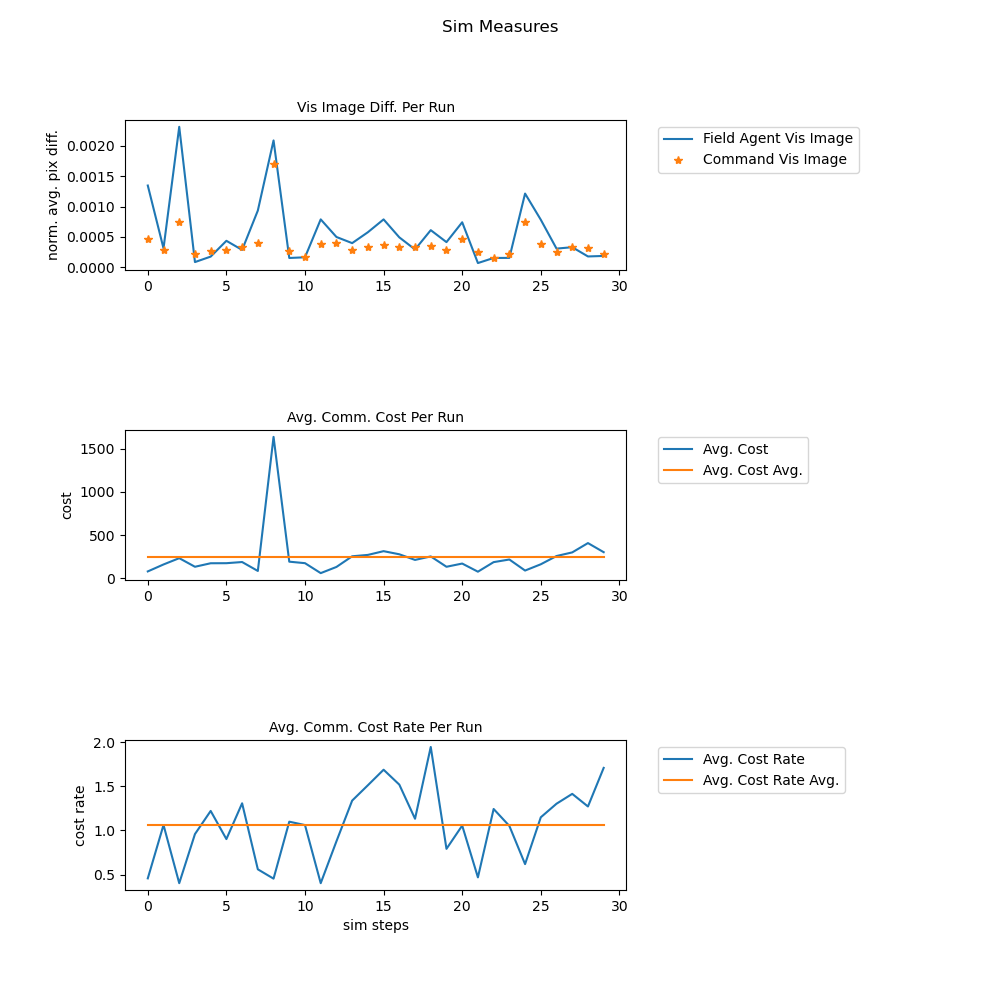

In [ ]:
plt.rcParams[ 'figure.figsize' ] = 10, 10

timeToEndIncidentStackRun3 = timeToEndIncidentStack
avgFieldAgentVisImageDiffStackRun3 = avgFieldAgentVisImageDiffStack
avgCommanderAgentVisImageDiffStackRun3 = avgCommanderAgentVisImageDiffStack
avgCostStackRun3 = avgCostStack
avgCostStackRun3Avg = [ ( sum( avgCostStackRun3 ) / len( avgCostStackRun3 ) ) for x in avgCostStackRun3 ]
avgCostRateStackRun3 = avgCostRateStack
avgCostRateStackRun3Avg = [ ( sum( avgCostRateStackRun3 ) / len( avgCostRateStackRun3 ) ) for x in avgCostRateStackRun3 ]

measFig = plt.figure()
measGs = measFig.add_gridspec( 25, 3 )
measFig.suptitle( 'Sim Measures' )

imageDiffAx = measFig.add_subplot( measGs[ 0:5, 0:2 ] )
imageDiffDiv = make_axes_locatable( imageDiffAx )

costAx = measFig.add_subplot( measGs[ 10:15, 0:2 ] )
costDiv = make_axes_locatable( costAx )

costRateAx = measFig.add_subplot( measGs[ 20:25, 0:2 ] )
costRateDiv = make_axes_locatable( costRateAx )

imageDiffPlot = imageDiffAx.plot( avgFieldAgentVisImageDiffStackRun3, label = 'Field Agent Vis Image' )
imageDiffPlot = imageDiffAx.plot( avgCommanderAgentVisImageDiffStackRun3, '*', label = 'Command Vis Image' )
imageDiffPlotTitle = imageDiffAx.set_title( 'Vis Image Diff. Per Run', fontsize = myFontsize )
imageDiffAx.set_ylabel( 'norm. avg. pix diff.' )
imageDiffAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costPlot = costAx.plot( avgCostStackRun3, label = 'Avg. Cost' )
costPlot = costAx.plot( avgCostStackRun3Avg, label = 'Avg. Cost Avg.' )
costPlotTitle = costAx.set_title( 'Avg. Comm. Cost Per Run', fontsize = myFontsize )
costAx.set_ylabel( 'cost' )
costAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costRatePlot = costRateAx.plot( avgCostRateStackRun3, label = 'Avg. Cost Rate' )
costRatePlot = costRateAx.plot( avgCostRateStackRun3Avg, label = 'Avg. Cost Rate Avg.' )
costRatePlotTitle = costRateAx.set_title( 'Avg. Comm. Cost Rate Per Run', fontsize = myFontsize )
costRateAx.set_ylabel( 'cost rate' )
costRateAx.set_xlabel( 'sim steps' )
costRateAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

In [ ]:
timeToEndIncidentStack = []
avgFieldAgentVisImageDiffStack = []
avgCommanderAgentVisImageDiffStack = []
avgCostStack = []
avgCostRateStack = []
# numSims = 30

for i in range( 0, numSims ):
    
    mapWidth = 125
    mapHeight = 125

    incidentEpicenter = { 'x' : 60, 'y' : 60 }
    emergencyCreationAvgRate = 1 
    emergencySpatialAvg = 5
    emergencyIntensityAvg = 0.5 
    maxNumEmergencies = 30 
    maxEmergencyInteractionDist = 5 
    maxFieldAgentEffect = 0.1

    emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
    incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                        maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

    fieldAgentSize = 1
    reliabilityAvg = 0.5
    moveSpeedAvg = 3 
    tokenDistanceAvg = 10 
    tokenNoiseStdAvg = 0.01 
    maxAgentDist = 10 
    squadSize = 3
    platoonSize = 2 
    companySize = 1

    fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
    fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                              squadSize, platoonSize, companySize, mapWidth, mapHeight )
    fieldAgents.createCompany()
    fieldAgents.createCompany()
    fieldAgents.createCompany()
    fieldAgents.setRandomLocs()


#     nodeSize = 1 
#     minNodeIntensity = 15
#     numTotalNodes = 30
#     numDeployedNodes = 10
#     nodeDeploymentSpeedAvg = 100 
#     nodeDeploymentSpeedMax = 200 
#     nodeDeploymentSpeedMin = 50 
#     nodeDeployedTimeAvg = 200 
#     nodeChargeTimeAvg = 5 
#     linkPricePerDist = 0.000001 
#     incidentSize = 50
#     numTransfersPerStepAvg = 35
#     minNumTransfersPerStep = 20
#     innerNodeNum = 2 
#     middleNodeNum = 3 
#     outerNodeNum = 5

    nodeSize = 1 
    minNodeIntensity = 15
    numTotalNodes = 500
    numDeployedNodes = 200
    nodeDeploymentSpeedAvg = 100 
    nodeDeploymentSpeedMax = 200 
    nodeDeploymentSpeedMin = 50 
    nodeDeployedTimeAvg = 200 
    nodeChargeTimeAvg = 5 
    linkPricePerDist = 0.000001 
    incidentSize = 50
    numTransfersPerStepAvg = 35
    minNumTransfersPerStep = 20
    innerNodeNum = 3 
    middleNodeNum = 7 
    outerNodeNum = 10

    commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

    commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                              nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                              nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                              numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

    fieldAgents.commNodes = commNetwork.nodes

    numOfficers = 4
    interferenceRateAvg = 0.99
    interferenceIntensityAvg = 100
    underspendingRateAvg = 10
    overspendingRateAvg = 1000
    objectiveSizeAvg = 2
    maxObjectiveSize = 5
    minObjectiveSize = 1

    officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                                  overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                                  mapWidth )

    commanderAgent = CommanderAgent()

    simDivider = 10
    simTime = 20
    bigThisTime = 0


    fieldAgentVisImageDiffStack = []
    commanderAgentVisImageDiffStack = []

    while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

        bigThisTime += 1

        thisTime = bigThisTime / simDivider

        incident.companies = fieldAgents.companies

        incident.updateEmergencies( thisTime )

        emergencyMap.emergencies = incident.emergencies

        emergencyMap.updateMap()

        commNetwork.companies = fieldAgents.companies

        commNetwork.updateNodeLoc( thisTime )

        commNetwork.updateDirectedCommNetwork()

        commNetworkMap.nodes = commNetwork.nodes

        commNetworkMap.updateMap()

        fieldAgentMap.companies = fieldAgents.companies

        fieldAgentMap.updateMap()

        fieldAgents.emergencyMap = emergencyMap.currentMap 

        fieldAgents.commNetwork = commNetwork.directedNetwork

        fieldAgents.generateVisMap()

        fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

        officerAgents.visMap = fieldAgents.visMap

        officerAgents.updateObjectives()

        commanderAgent.visMap = officerAgents.alteredVisMap

        commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

        commanderAgent.updateOrderMap()

        fieldAgents.orderMap = commanderAgent.orderMap

        fieldAgents.moveAgents()

        print('thisSim: ', i,', thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

    fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
    commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]
    
    timeToEndIncidentStack.append( thisTime )
    avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
    avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
    avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
    avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

<ipython-input-11-d3ae80301edf>:7: RuntimeWarning: invalid value encountered in true_divide
  normImage2 = image2 / norm2


thisSim:  0 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisT

thisSim:  0 , thisTime:  7.7 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  7.8 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  7.9 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.0 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.1 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.2 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  8.5 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
thisSim:  0 , thisT

thisSim:  0 , thisTime:  15.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.3 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.4 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.5 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.6 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  15.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  0 , thisTime:  15.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  0 , thisTime:  15.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  0 , thisTime:  16.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  0 , thisTime:  22.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  0 , thisTime:  22.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  0 , thisTime:  22.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  0 , thisTime:  22.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  0 , thisTime:  23.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  0 , thisTime:  23.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  0 , thisTime:  23.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  0 , thisTime:  23.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  0 , thisTime:  23.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  0 , thisTime:  30.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  30.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  30.2 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  30.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  0 , thisTime:  30.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  0 , thisTime:  30.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  0 , thisTime:  30.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  0 , thisTime:  30.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  0 , thisTime:  30.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  2.1 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  1 , thisTime:  2.2 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
thisSim:  1 , thisTime:  2.3 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
thisSim:  1 , thisTime:  2.4 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
thisSim:  1 , thisTime:  2.5 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
thisSim:  1 , thisTime:  2.6 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
thisSim:  1 , thisTime:  2.7 , totalNumEmergencies:  6 , currentNumEmergencies:  5 , numEmergenciesEnded:  1
thisSim:  1 , thisTime:  2.8 , totalNumEmergencies:  6 , currentNumEmergencies:  5 , numEmergenciesEnded:  1
thisSim:  1 , thisTime:  2.9 , totalNumEmergencies:  6 , currentNumEmergencies:  5 , numEmergenciesEnded:  1
thisSim:  1 , thisT

thisSim:  1 , thisTime:  9.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  1 , thisTime:  9.8 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  1 , thisTime:  9.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  1 , thisTime:  10.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  1 , thisTime:  10.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  10.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  10.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  10.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  1 , thisTime:  10.5 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:

thisSim:  1 , thisTime:  17.1 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  1 , thisTime:  17.2 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  1 , thisTime:  17.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  1 , thisTime:  17.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  1 , thisTime:  17.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  17.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  17.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  17.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  17.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  24.5 , totalNumEmergencies:  23 , currentNumEmergencies:  3 , numEmergenciesEnded:  20
thisSim:  1 , thisTime:  24.6 , totalNumEmergencies:  23 , currentNumEmergencies:  3 , numEmergenciesEnded:  20
thisSim:  1 , thisTime:  24.7 , totalNumEmergencies:  23 , currentNumEmergencies:  3 , numEmergenciesEnded:  20
thisSim:  1 , thisTime:  24.8 , totalNumEmergencies:  23 , currentNumEmergencies:  3 , numEmergenciesEnded:  20
thisSim:  1 , thisTime:  24.9 , totalNumEmergencies:  24 , currentNumEmergencies:  4 , numEmergenciesEnded:  20
thisSim:  1 , thisTime:  25.0 , totalNumEmergencies:  24 , currentNumEmergencies:  3 , numEmergenciesEnded:  21
thisSim:  1 , thisTime:  25.1 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  25.2 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  25.3 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  1 , thisTime:  31.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  1 , thisTime:  32.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  1 , thisTime:  32.1 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  1 , thisTime:  32.2 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  1 , thisTime:  32.3 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  1 , thisTime:  32.4 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  1 , thisTime:  32.5 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  1 , thisTime:  32.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  1 , thisTime:  32.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  2 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  6.1 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  6.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  6.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  6.6 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  2 , thisTime:  6.7 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  2 , thisT

thisSim:  2 , thisTime:  13.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  2 , thisTime:  13.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  2 , thisTime:  13.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  2 , thisTime:  13.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  2 , thisTime:  13.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  2 , thisTime:  13.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  2 , thisTime:  14.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  2 , thisTime:  14.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  2 , thisTime:  14.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  2 , thisTime:  20.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  20.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  2 , thisTime:  21.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  2 , thisTime:  21.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  2 , thisTime:  21.2 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  2 , thisTime:  21.3 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  2 , thisTime:  21.4 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  2 , thisTime:  21.5 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  2 , thisTime:  21.6 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  3 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  0.9 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  1.0 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  1.1 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  3 , thisT

thisSim:  3 , thisTime:  7.9 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  8.0 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  8.1 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  8.2 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  8.3 , totalNumEmergencies:  8 , currentNumEmergencies:  7 , numEmergenciesEnded:  1
thisSim:  3 , thisTime:  8.4 , totalNumEmergencies:  8 , currentNumEmergencies:  6 , numEmergenciesEnded:  2
thisSim:  3 , thisTime:  8.5 , totalNumEmergencies:  9 , currentNumEmergencies:  6 , numEmergenciesEnded:  3
thisSim:  3 , thisTime:  8.6 , totalNumEmergencies:  9 , currentNumEmergencies:  5 , numEmergenciesEnded:  4
thisSim:  3 , thisTime:  8.7 , totalNumEmergencies:  9 , currentNumEmergencies:  4 , numEmergenciesEnded:  5
thisSim:  3 , thisT

thisSim:  3 , thisTime:  15.3 , totalNumEmergencies:  15 , currentNumEmergencies:  3 , numEmergenciesEnded:  12
thisSim:  3 , thisTime:  15.4 , totalNumEmergencies:  16 , currentNumEmergencies:  4 , numEmergenciesEnded:  12
thisSim:  3 , thisTime:  15.5 , totalNumEmergencies:  16 , currentNumEmergencies:  3 , numEmergenciesEnded:  13
thisSim:  3 , thisTime:  15.6 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  3 , thisTime:  15.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.8 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  15.9 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  16.0 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  16.1 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  3 , thisTime:  22.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  3 , thisTime:  22.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  3 , thisTime:  22.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  3 , thisTime:  23.0 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  3 , thisTime:  23.1 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  3 , thisTime:  23.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  3 , thisTime:  23.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  3 , thisTime:  23.4 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  3 , thisTime:  23.5 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  4 , thisTime:  3.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  3.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  3.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  4.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  4.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  4.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  4.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  4.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisTime:  4.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  4 , thisT

thisSim:  4 , thisTime:  11.3 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  4 , thisTime:  11.4 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  4 , thisTime:  11.5 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  4 , thisTime:  11.6 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  4 , thisTime:  11.7 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  4 , thisTime:  11.8 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  4 , thisTime:  11.9 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  4 , thisTime:  12.0 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  4 , thisTime:  12.1 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
thisSim: 

thisSim:  4 , thisTime:  18.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  4 , thisTime:  18.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  4 , thisTime:  18.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  4 , thisTime:  19.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  4 , thisTime:  19.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  4 , thisTime:  19.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  4 , thisTime:  19.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  4 , thisTime:  19.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  4 , thisTime:  19.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  26.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  26.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  26.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  26.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  26.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  26.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  26.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  26.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  26.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  4 , thisTime:  33.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  4 , thisTime:  33.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  4 , thisTime:  33.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  4 , thisTime:  33.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  4 , thisTime:  33.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  4 , thisTime:  34.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  4 , thisTime:  34.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  34.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  4 , thisTime:  34.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  40.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  4 , thisTime:  41.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  4 , thisTime:  41.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  4 , thisTime:  41.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  4 , thisTime:  41.3 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  5 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
this

thisSim:  5 , thisTime:  7.2 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  5 , thisTime:  7.3 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  5 , thisTime:  7.4 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  5 , thisTime:  7.5 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  5 , thisTime:  7.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  5 , thisTime:  7.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  5 , thisTime:  7.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  5 , thisTime:  7.9 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  5 , thisTime:  8.0 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  5 , thisT

thisSim:  5 , thisTime:  14.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  14.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  14.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  14.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  15.0 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  15.1 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  5 , thisTime:  15.2 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  5 , thisTime:  15.3 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  5 , thisTime:  15.4 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  5 , thisTime:  22.0 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  5 , thisTime:  22.1 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  5 , thisTime:  22.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  22.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  22.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  22.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  22.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  22.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  22.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  6 , thisTime:  5.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  6 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  6 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  6 , thisTime:  6.1 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  6 , thisTime:  6.2 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  6 , thisTime:  6.3 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  6 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisTime:  6.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  6 , thisT

thisSim:  6 , thisTime:  13.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  6 , thisTime:  13.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  6 , thisTime:  13.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  6 , thisTime:  13.6 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  6 , thisTime:  13.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  6 , thisTime:  13.8 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  6 , thisTime:  13.9 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  6 , thisTime:  14.0 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  6 , thisTime:  14.1 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  6 , thisTime:  20.7 , totalNumEmergencies:  20 , currentNumEmergencies:  3 , numEmergenciesEnded:  17
thisSim:  6 , thisTime:  20.8 , totalNumEmergencies:  21 , currentNumEmergencies:  3 , numEmergenciesEnded:  18
thisSim:  6 , thisTime:  20.9 , totalNumEmergencies:  22 , currentNumEmergencies:  3 , numEmergenciesEnded:  19
thisSim:  6 , thisTime:  21.0 , totalNumEmergencies:  23 , currentNumEmergencies:  3 , numEmergenciesEnded:  20
thisSim:  6 , thisTime:  21.1 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  6 , thisTime:  21.2 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  6 , thisTime:  21.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  21.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  21.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  6 , thisTime:  28.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  6 , thisTime:  28.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  6 , thisTime:  28.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  6 , thisTime:  28.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  6 , thisTime:  28.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  6 , thisTime:  28.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  6 , thisTime:  28.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  6 , thisTime:  28.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  6 , thisTime:  28.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  7 , thisTime:  6.5 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  6.6 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  6.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  6.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  6.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  7.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  7.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  7.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  7.3 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  7 , thisT

thisSim:  7 , thisTime:  14.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  7 , thisTime:  14.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  7 , thisTime:  14.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  7 , thisTime:  14.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  7 , thisTime:  14.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  7 , thisTime:  14.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  7 , thisTime:  14.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  7 , thisTime:  14.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  7 , thisTime:  14.8 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  7 , thisTime:  21.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  21.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  21.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  21.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  21.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  21.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  22.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  22.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  22.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  7 , thisTime:  28.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  28.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  29.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  29.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  29.2 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  29.3 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  29.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  29.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  7 , thisTime:  29.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  7 , thisTime:  36.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  7 , thisTime:  36.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  7 , thisTime:  36.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  7 , thisTime:  36.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  7 , thisTime:  36.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  7 , thisTime:  36.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  7 , thisTime:  36.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  7 , thisTime:  36.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  7 , thisTime:  37.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  8 , thisTime:  4.5 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  8 , thisTime:  4.6 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  8 , thisTime:  4.7 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  8 , thisTime:  4.8 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  8 , thisTime:  4.9 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  8 , thisTime:  5.0 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  8 , thisTime:  5.1 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  8 , thisTime:  5.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  8 , thisTime:  5.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  8 , thisT

thisSim:  8 , thisTime:  12.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  12.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  12.2 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  12.3 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  12.4 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  12.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  8 , thisTime:  12.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  8 , thisTime:  12.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  8 , thisTime:  12.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  8 , thisTime:  19.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  8 , thisTime:  19.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  8 , thisTime:  19.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  8 , thisTime:  19.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  8 , thisTime:  19.8 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  8 , thisTime:  19.9 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  8 , thisTime:  20.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  8 , thisTime:  20.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  8 , thisTime:  20.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  9 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  2.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  2.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  2.9 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  3.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  9 , thisTime:  3.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  9 , thisTime:  3.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  9 , thisTime:  3.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  9 , thisT

thisSim:  9 , thisTime:  10.1 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  9 , thisTime:  10.2 , totalNumEmergencies:  11 , currentNumEmergencies:  3 , numEmergenciesEnded:  8
thisSim:  9 , thisTime:  10.3 , totalNumEmergencies:  12 , currentNumEmergencies:  4 , numEmergenciesEnded:  8
thisSim:  9 , thisTime:  10.4 , totalNumEmergencies:  12 , currentNumEmergencies:  4 , numEmergenciesEnded:  8
thisSim:  9 , thisTime:  10.5 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  9 , thisTime:  10.6 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  9 , thisTime:  10.7 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  9 , thisTime:  10.8 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  9 , thisTime:  10.9 , totalNumEmergencies:  13 , currentNumEmergencies:  4 , numEmergenciesEnded:  9
t

thisSim:  9 , thisTime:  17.5 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  9 , thisTime:  17.6 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  9 , thisTime:  17.7 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  9 , thisTime:  17.8 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  9 , thisTime:  17.9 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  9 , thisTime:  18.0 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  9 , thisTime:  18.1 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  9 , thisTime:  18.2 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
thisSim:  9 , thisTime:  18.3 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  9 , thisTime:  24.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  25.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  25.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  25.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  25.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  25.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  25.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  25.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  25.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  9 , thisTime:  32.3 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  9 , thisTime:  32.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  9 , thisTime:  32.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  32.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  9 , thisTime:  32.7 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  10 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0


thisSim:  10 , thisTime:  7.1 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  7.2 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  7.3 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  7.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  7.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  7.6 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  7.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  7.8 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  7.9 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  10 , thisTime:  14.4 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  14.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  14.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  14.7 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  14.8 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  14.9 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  15.0 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  15.1 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  15.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  21.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  10 , thisTime:  21.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  10 , thisTime:  21.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  10 , thisTime:  22.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  10 , thisTime:  22.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  10 , thisTime:  22.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  10 , thisTime:  22.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  10 , thisTime:  22.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  10 , thisTime:  22.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  10 , thisTime:  29.0 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  10 , thisTime:  29.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  10 , thisTime:  29.2 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  10 , thisTime:  29.3 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  10 , thisTime:  29.4 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  10 , thisTime:  29.5 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  10 , thisTime:  29.6 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  10 , thisTime:  29.7 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  10 , thisTime:  29.8 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  36.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  36.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  36.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  36.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  36.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  36.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  36.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  37.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  37.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  43.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  43.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  43.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  43.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  44.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  44.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  44.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  44.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  44.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  50.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  51.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  51.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  51.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  51.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  51.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  51.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  51.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  51.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  58.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  58.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  58.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  58.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  58.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  58.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  58.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  58.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  59.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  11 , thisTime:  4.6 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  4.7 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  4.8 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  4.9 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  5.0 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  5.1 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  5.2 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  5.3 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  11 , thisTime:  5.4 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  

thisSim:  11 , thisTime:  12.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.6 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.8 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmerg

thisSim:  11 , thisTime:  19.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  19.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  19.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  19.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  19.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  19.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  19.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  20.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  11 , thisTime:  20.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmerg

thisSim:  11 , thisTime:  26.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  11 , thisTime:  26.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  11 , thisTime:  26.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  11 , thisTime:  26.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  11 , thisTime:  27.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  11 , thisTime:  27.1 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  11 , thisTime:  27.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  11 , thisTime:  27.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  11 , thisTime:  27.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  3.5 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  3.6 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
thisSim:  12 , thisTime:  3.7 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
thisSim:  12 , thisTime:  3.8 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  12 , thisTime:  3.9 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
thisSim:  12 , thisTime:  4.0 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
thisSim:  12 , thisTime:  4.1 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  12 , thisTime:  4.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  4.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  

thisSim:  12 , thisTime:  11.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  11.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  11.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  11.6 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  11.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  11.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  18.3 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.4 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.5 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.6 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.7 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.8 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  18.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  19.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  19.1 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmerg

thisSim:  12 , thisTime:  25.6 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  25.7 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  25.8 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  25.9 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  26.0 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  12 , thisTime:  26.1 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  12 , thisTime:  26.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  12 , thisTime:  26.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  12 , thisTime:  26.4 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmerg

thisSim:  13 , thisTime:  3.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  13 , thisTime:  3.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  13 , thisTime:  3.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  13 , thisTime:  3.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  13 , thisTime:  3.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  13 , thisTime:  3.9 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  13 , thisTime:  4.0 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  13 , thisTime:  4.1 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  13 , thisTime:  4.2 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  

thisSim:  13 , thisTime:  10.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  10.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  11.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  11.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  11.2 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  11.3 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  11.4 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  13 , thisTime:  11.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  13 , thisTime:  11.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  18.1 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  13 , thisTime:  18.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  18.3 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  18.4 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  18.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  18.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  18.7 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  18.8 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  13 , thisTime:  18.9 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmerg

thisSim:  13 , thisTime:  25.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  25.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  25.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  25.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  25.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  25.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  26.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  26.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  26.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  32.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  13 , thisTime:  32.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  13 , thisTime:  32.9 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  14 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
t

thisSim:  14 , thisTime:  7.3 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  7.4 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  7.5 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  7.6 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  7.7 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  7.8 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  7.9 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  8.0 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  14 , thisTime:  8.1 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  

thisSim:  14 , thisTime:  14.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  14.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  15.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  15.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  15.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  15.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  15.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  15.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  14 , thisTime:  15.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
t

thisSim:  14 , thisTime:  22.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  14 , thisTime:  22.3 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  14 , thisTime:  22.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  22.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  22.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  22.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  22.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  22.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  14 , thisTime:  23.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmerg

thisSim:  14 , thisTime:  29.5 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  29.6 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  29.7 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  29.8 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  29.9 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  30.0 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  30.1 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  30.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  14 , thisTime:  30.3 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmerg

thisSim:  14 , thisTime:  36.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  14 , thisTime:  36.9 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  14 , thisTime:  37.0 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  14 , thisTime:  37.1 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  14 , thisTime:  37.2 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  14 , thisTime:  37.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  14 , thisTime:  37.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  14 , thisTime:  37.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  14 , thisTime:  37.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  44.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  44.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  44.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  44.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  44.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  44.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  44.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  44.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  44.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  51.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  51.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  51.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  51.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  51.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  51.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  52.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  52.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  52.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  58.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  58.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  58.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  59.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  59.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  59.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  59.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  59.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  59.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  66.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  66.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  66.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  66.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  66.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  66.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  66.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  66.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  66.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  73.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  73.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  73.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  73.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  73.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  73.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  73.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  74.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  74.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  80.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  80.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  80.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  80.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  81.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  81.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  81.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  81.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  81.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  87.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  88.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  88.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  88.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  88.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  88.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  88.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  88.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  88.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  95.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  95.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  95.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  95.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  95.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  95.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  95.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  95.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  96.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  14 , thisTime:  102.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  102.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  102.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  102.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  102.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  103.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  103.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  103.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  103.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  14 , thisTime:  109.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  109.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  109.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  110.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  110.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  110.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  110.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  110.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  14 , thisTime:  110.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  15 , thisTime:  6.6 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  15 , thisTime:  6.7 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  15 , thisTime:  6.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  15 , thisTime:  6.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  15 , thisTime:  7.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  15 , thisTime:  7.1 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  15 , thisTime:  7.2 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  15 , thisTime:  7.3 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  15 , thisTime:  7.4 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  

thisSim:  15 , thisTime:  14.0 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  15 , thisTime:  14.1 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  15 , thisTime:  14.2 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  15 , thisTime:  14.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  14.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  14.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  14.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  14.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  14.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  15 , thisTime:  21.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  21.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  21.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  21.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  21.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  21.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  21.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  22.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  22.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  16 , thisTime:  1.7 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  1.8 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  1.9 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  2.1 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  2.2 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  2.3 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  2.4 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  2.5 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
thisSim:  

thisSim:  16 , thisTime:  9.2 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  16 , thisTime:  9.3 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  16 , thisTime:  9.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  16 , thisTime:  9.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  16 , thisTime:  9.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  16 , thisTime:  9.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  16 , thisTime:  9.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  16 , thisTime:  9.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  16 , thisTime:  10.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEn

thisSim:  16 , thisTime:  16.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  16.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  16.7 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  16.8 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  16.9 , totalNumEmergencies:  22 , currentNumEmergencies:  3 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  17.0 , totalNumEmergencies:  23 , currentNumEmergencies:  4 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  17.1 , totalNumEmergencies:  23 , currentNumEmergencies:  4 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  17.2 , totalNumEmergencies:  24 , currentNumEmergencies:  5 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  17.3 , totalNumEmergencies:  25 , currentNumEmergencies:  4 , numEmerg

thisSim:  17 , thisTime:  1.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  17 , thisTime:  1.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  17 , thisTime:  1.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  17 , thisTime:  1.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  17 , thisTime:  1.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  17 , thisTime:  1.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  17 , thisTime:  1.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  17 , thisTime:  1.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  17 , thisTime:  2.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  

thisSim:  17 , thisTime:  8.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  8.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  8.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  9.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  9.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  9.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  9.3 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  9.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  9.5 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  

thisSim:  17 , thisTime:  16.1 , totalNumEmergencies:  10 , currentNumEmergencies:  6 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  16.2 , totalNumEmergencies:  11 , currentNumEmergencies:  7 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  16.3 , totalNumEmergencies:  11 , currentNumEmergencies:  7 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  16.4 , totalNumEmergencies:  11 , currentNumEmergencies:  7 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  16.5 , totalNumEmergencies:  11 , currentNumEmergencies:  7 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  16.6 , totalNumEmergencies:  11 , currentNumEmergencies:  7 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  16.7 , totalNumEmergencies:  11 , currentNumEmergencies:  7 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  16.8 , totalNumEmergencies:  11 , currentNumEmergencies:  7 , numEmergenciesEnded:  4
thisSim:  17 , thisTime:  16.9 , totalNumEmergencies:  11 , currentNumEmergencies:  7 , numEmergenciesEn

thisSim:  17 , thisTime:  23.5 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  23.6 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  23.7 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  23.8 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  23.9 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  24.0 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  24.1 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  24.2 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmergenciesEnded:  5
thisSim:  17 , thisTime:  24.3 , totalNumEmergencies:  17 , currentNumEmergencies:  12 , numEmer

thisSim:  17 , thisTime:  30.8 , totalNumEmergencies:  19 , currentNumEmergencies:  8 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  30.9 , totalNumEmergencies:  19 , currentNumEmergencies:  8 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  31.0 , totalNumEmergencies:  20 , currentNumEmergencies:  9 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  31.1 , totalNumEmergencies:  20 , currentNumEmergencies:  9 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  31.2 , totalNumEmergencies:  20 , currentNumEmergencies:  9 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  31.3 , totalNumEmergencies:  20 , currentNumEmergencies:  9 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  31.4 , totalNumEmergencies:  21 , currentNumEmergencies:  10 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  31.5 , totalNumEmergencies:  21 , currentNumEmergencies:  10 , numEmergenciesEnded:  11
thisSim:  17 , thisTime:  31.6 , totalNumEmergencies:  21 , currentNumEmergencies:  10 , numEm

thisSim:  17 , thisTime:  38.1 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  17 , thisTime:  38.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  38.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  17 , thisTime:  38.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  17 , thisTime:  38.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  17 , thisTime:  38.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  17 , thisTime:  38.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  17 , thisTime:  38.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  17 , thisTime:  38.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmerg

thisSim:  18 , thisTime:  0.6 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  0.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  18 , thisTime:  0.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  18 , thisTime:  0.9 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  18 , thisTime:  1.0 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  18 , thisTime:  1.1 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  18 , thisTime:  1.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  18 , thisTime:  1.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  18 , thisTime:  1.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  

thisSim:  18 , thisTime:  8.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  8.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  8.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  8.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  8.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  8.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  8.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  8.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  18 , thisTime:  8.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  

thisSim:  18 , thisTime:  15.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  15.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  15.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  15.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  15.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  16.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  16.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  16.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  18 , thisTime:  16.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
t

thisSim:  18 , thisTime:  22.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  18 , thisTime:  23.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  18 , thisTime:  23.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  18 , thisTime:  23.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  18 , thisTime:  23.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  18 , thisTime:  23.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  18 , thisTime:  23.5 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  18 , thisTime:  23.6 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  18 , thisTime:  23.7 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmerg

thisSim:  18 , thisTime:  30.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  30.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  30.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  30.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  30.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  30.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  30.8 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  30.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  18 , thisTime:  31.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  19 , thisTime:  1.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  1.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  

thisSim:  19 , thisTime:  8.6 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  8.7 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  8.8 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  8.9 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  9.0 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  9.1 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  9.2 , totalNumEmergencies:  14 , currentNumEmergencies:  3 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  9.3 , totalNumEmergencies:  14 , currentNumEmergencies:  3 , numEmergenciesEnded:  11
thisSim:  19 , thisTime:  9.4 , totalNumEmergencies:  14 , currentNumEmergencies:  3 , numEmergenciesEnd

thisSim:  19 , thisTime:  15.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  16.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  16.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  16.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  16.3 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  16.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  16.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  16.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  16.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmerg

thisSim:  20 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  20 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  20 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  20 , thisTime:  2.8 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  20 , thisTime:  2.9 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  20 , thisTime:  3.0 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  20 , thisTime:  3.1 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  20 , thisTime:  3.2 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  20 , thisTime:  3.3 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  

thisSim:  20 , thisTime:  10.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  10.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  10.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  10.3 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  10.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  10.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  10.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  10.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  10.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesE

thisSim:  20 , thisTime:  17.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  17.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  17.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  17.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  17.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  17.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  17.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  18.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  18.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmerg

thisSim:  20 , thisTime:  24.6 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  24.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  24.8 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  20 , thisTime:  24.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  25.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  25.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  25.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  25.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  20 , thisTime:  25.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  20 , thisTime:  31.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  32.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  32.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  32.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  32.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  32.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  32.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  32.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  32.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmerg

thisSim:  20 , thisTime:  39.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  20 , thisTime:  39.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  20 , thisTime:  39.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  20 , thisTime:  39.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  20 , thisTime:  39.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  20 , thisTime:  39.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  20 , thisTime:  39.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  20 , thisTime:  39.9 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  21 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergen

thisSim:  21 , thisTime:  6.8 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  6.9 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  7.0 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  7.1 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  7.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  7.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  7.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  7.5 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  21 , thisTime:  7.6 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  

thisSim:  21 , thisTime:  14.2 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  14.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  14.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  14.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  14.6 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  14.7 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  21 , thisTime:  14.8 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  21 , thisTime:  14.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  21 , thisTime:  15.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmerg

thisSim:  21 , thisTime:  21.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  21 , thisTime:  21.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  21 , thisTime:  21.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  21 , thisTime:  21.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  21 , thisTime:  21.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  21 , thisTime:  22.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  21 , thisTime:  22.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  21 , thisTime:  22.2 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  21 , thisTime:  22.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  21 , thisTime:  28.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  21 , thisTime:  28.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  21 , thisTime:  29.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  21 , thisTime:  29.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  21 , thisTime:  29.2 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  21 , thisTime:  29.3 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  21 , thisTime:  29.4 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  21 , thisTime:  29.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  21 , thisTime:  29.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmerg

thisSim:  22 , thisTime:  3.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  3.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  4.0 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  22 , thisTime:  4.1 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  22 , thisTime:  4.2 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  22 , thisTime:  4.3 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  22 , thisTime:  4.4 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  22 , thisTime:  4.5 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  22 , thisTime:  4.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  

thisSim:  22 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  11.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  11.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  12.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  22 , thisTime:  12.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  18.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  22 , thisTime:  18.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  22 , thisTime:  18.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  22 , thisTime:  18.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  22 , thisTime:  19.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  22 , thisTime:  19.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  22 , thisTime:  19.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  22 , thisTime:  19.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  22 , thisTime:  19.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmerg

thisSim:  22 , thisTime:  25.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  26.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  26.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  26.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  26.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  26.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  26.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  26.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  26.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  23 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  23 , thisTime:  1.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  

thisSim:  23 , thisTime:  7.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  23 , thisTime:  7.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  23 , thisTime:  7.9 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  23 , thisTime:  8.0 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  23 , thisTime:  8.1 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  23 , thisTime:  8.2 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  23 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  23 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  23 , thisTime:  8.5 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  

thisSim:  23 , thisTime:  15.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  15.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  15.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  15.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  15.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  15.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  15.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  15.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  23 , thisTime:  15.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmerg

thisSim:  23 , thisTime:  22.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  22.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  22.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  22.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  22.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  23 , thisTime:  22.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  23 , thisTime:  23.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  23 , thisTime:  23.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  23 , thisTime:  23.2 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmerg

thisSim:  24 , thisTime:  3.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  3.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  3.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  3.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  3.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  3.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  3.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  3.9 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  4.0 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  

thisSim:  24 , thisTime:  10.7 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  24 , thisTime:  10.8 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  24 , thisTime:  10.9 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  24 , thisTime:  11.0 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  24 , thisTime:  11.1 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  24 , thisTime:  11.2 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  24 , thisTime:  11.3 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  24 , thisTime:  11.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  24 , thisTime:  11.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  18.0 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  24 , thisTime:  18.1 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  24 , thisTime:  18.2 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  24 , thisTime:  18.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  24 , thisTime:  18.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  24 , thisTime:  18.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  24 , thisTime:  18.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  24 , thisTime:  18.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  24 , thisTime:  18.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  25.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  25.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  25.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  25.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  25.7 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  25.8 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  25.9 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  26.0 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  26.1 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmerg

thisSim:  24 , thisTime:  32.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  32.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  32.8 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  32.9 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  33.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  33.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  33.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  33.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  33.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  25 , thisTime:  6.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  25 , thisTime:  6.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  25 , thisTime:  6.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  25 , thisTime:  6.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  25 , thisTime:  6.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  25 , thisTime:  6.6 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  25 , thisTime:  6.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  25 , thisTime:  6.8 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  

thisSim:  25 , thisTime:  13.4 , totalNumEmergencies:  19 , currentNumEmergencies:  3 , numEmergenciesEnded:  16
thisSim:  25 , thisTime:  13.5 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenciesEnded:  17
thisSim:  25 , thisTime:  13.6 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  13.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  13.8 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  13.9 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  14.0 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  14.1 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  25 , thisTime:  14.2 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  20.7 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  25 , thisTime:  20.8 , totalNumEmergencies:  29 , currentNumEmergencies:  3 , numEmergenciesEnded:  26
thisSim:  25 , thisTime:  20.9 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  25 , thisTime:  21.0 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  25 , thisTime:  21.1 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  25 , thisTime:  21.2 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  25 , thisTime:  21.3 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  25 , thisTime:  21.4 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  25 , thisTime:  21.5 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmerg

thisSim:  25 , thisTime:  28.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  28.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  28.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  28.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  28.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  28.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  28.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  28.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  28.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  35.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  35.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  35.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  35.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  35.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  35.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  35.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  36.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  36.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  42.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  42.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  42.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  42.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  43.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  43.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  43.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  43.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  43.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  49.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  50.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  50.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  50.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  50.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  50.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  50.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  50.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  50.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  26 , thisTime:  5.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  5.6 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  5.7 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  5.8 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  6.1 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  6.2 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  26 , thisTime:  6.3 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  

thisSim:  26 , thisTime:  12.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  13.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  13.1 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  13.2 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  13.3 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  13.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  26 , thisTime:  13.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  26 , thisTime:  13.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  26 , thisTime:  13.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmerg

thisSim:  26 , thisTime:  20.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  26 , thisTime:  20.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  26 , thisTime:  20.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  26 , thisTime:  20.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  26 , thisTime:  20.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  26 , thisTime:  20.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  26 , thisTime:  20.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  26 , thisTime:  20.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  26 , thisTime:  21.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  26 , thisTime:  27.5 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  27.6 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  27.7 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  27.8 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  26 , thisTime:  27.9 , totalNumEmergencies:  25 , currentNumEmergencies:  2 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  28.0 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  28.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  28.2 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  26 , thisTime:  28.3 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmerg

thisSim:  27 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  

thisSim:  27 , thisTime:  8.4 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  27 , thisTime:  8.5 , totalNumEmergencies:  9 , currentNumEmergencies:  3 , numEmergenciesEnded:  6
thisSim:  27 , thisTime:  8.6 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
thisSim:  27 , thisTime:  8.7 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
thisSim:  27 , thisTime:  8.8 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
thisSim:  27 , thisTime:  8.9 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  27 , thisTime:  9.0 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  27 , thisTime:  9.1 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  27 , thisTime:  9.2 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thi

thisSim:  27 , thisTime:  15.8 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  15.9 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.0 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.1 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.2 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.3 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.4 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.5 , totalNumEmergencies:  16 , currentNumEmergencies:  3 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.6 , totalNumEmergencies:  16 , currentNumEmergencies:  3 , numEmerg

thisSim:  27 , thisTime:  23.1 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  23.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  27 , thisTime:  23.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  27 , thisTime:  23.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  27 , thisTime:  23.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  27 , thisTime:  23.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  27 , thisTime:  23.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  27 , thisTime:  23.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  27 , thisTime:  23.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmerg

thisSim:  28 , thisTime:  2.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  2.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  2.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  2.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  2.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  2.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  2.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  2.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  28 , thisTime:  2.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  

thisSim:  28 , thisTime:  9.6 , totalNumEmergencies:  8 , currentNumEmergencies:  4 , numEmergenciesEnded:  4
thisSim:  28 , thisTime:  9.7 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  28 , thisTime:  9.8 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  28 , thisTime:  9.9 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  28 , thisTime:  10.0 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  28 , thisTime:  10.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  28 , thisTime:  10.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  28 , thisTime:  10.3 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  28 , thisTime:  10.4 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisS

thisSim:  28 , thisTime:  16.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  28 , thisTime:  17.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  28 , thisTime:  17.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  28 , thisTime:  17.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  28 , thisTime:  17.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  28 , thisTime:  17.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  28 , thisTime:  17.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  28 , thisTime:  17.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  28 , thisTime:  17.7 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmerg

thisSim:  28 , thisTime:  24.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  28 , thisTime:  24.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  28 , thisTime:  24.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  28 , thisTime:  24.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  28 , thisTime:  24.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  28 , thisTime:  24.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  24.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  24.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  25.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmerg

thisSim:  28 , thisTime:  31.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  31.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  31.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  31.8 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  29 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  

thisSim:  29 , thisTime:  7.2 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  29 , thisTime:  7.3 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  29 , thisTime:  7.4 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  29 , thisTime:  7.5 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  29 , thisTime:  7.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  29 , thisTime:  7.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  29 , thisTime:  7.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  29 , thisTime:  7.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  29 , thisTime:  8.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  

thisSim:  29 , thisTime:  14.5 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  29 , thisTime:  14.6 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  29 , thisTime:  14.7 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  29 , thisTime:  14.8 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  29 , thisTime:  14.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  29 , thisTime:  15.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  29 , thisTime:  15.1 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  29 , thisTime:  15.2 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  29 , thisTime:  15.3 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmerg

thisSim:  29 , thisTime:  21.8 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  21.9 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  22.0 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  22.1 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  22.2 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  22.3 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  22.4 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  22.5 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  22.6 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmerg

thisSim:  29 , thisTime:  29.1 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  29.2 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  29.3 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  29.4 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  29.5 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  29.6 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  29.7 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  29.8 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  29.9 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmerg

thisSim:  29 , thisTime:  36.4 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  36.5 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  36.6 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  36.7 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  36.8 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  36.9 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  37.0 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  37.1 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  37.2 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmerg

<IPython.core.display.Javascript object>


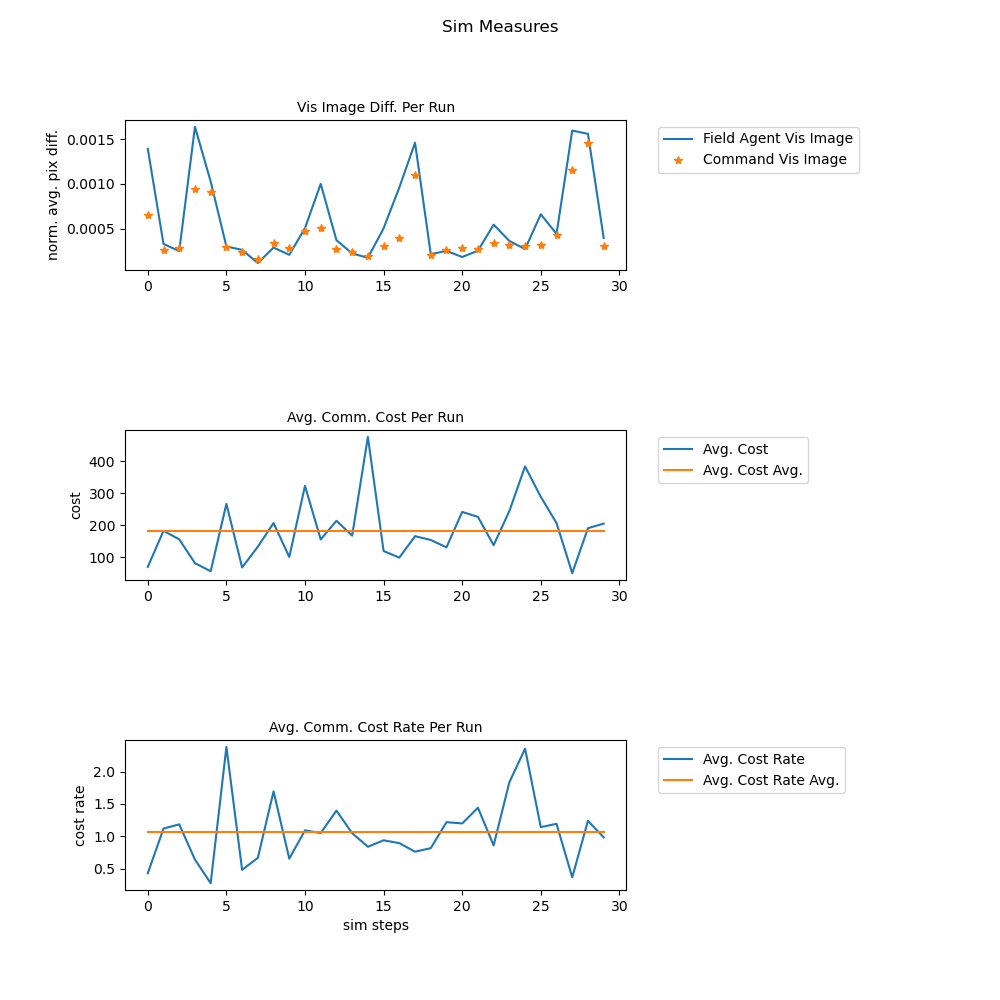

In [ ]:
plt.rcParams[ 'figure.figsize' ] = 10, 10

timeToEndIncidentStackRun4 = timeToEndIncidentStack
avgFieldAgentVisImageDiffStackRun4 = avgFieldAgentVisImageDiffStack
avgCommanderAgentVisImageDiffStackRun4 = avgCommanderAgentVisImageDiffStack
avgCostStackRun4 = avgCostStack
avgCostStackRun4Avg = [ ( sum( avgCostStackRun4 ) / len( avgCostStackRun4 ) ) for x in avgCostStackRun4 ]
avgCostRateStackRun4 = avgCostRateStack
avgCostRateStackRun4Avg = [ ( sum( avgCostRateStackRun4 ) / len( avgCostRateStackRun4 ) ) for x in avgCostRateStackRun4 ]

measFig = plt.figure()
measGs = measFig.add_gridspec( 25, 3 )
measFig.suptitle( 'Sim Measures' )

imageDiffAx = measFig.add_subplot( measGs[ 0:5, 0:2 ] )
imageDiffDiv = make_axes_locatable( imageDiffAx )

costAx = measFig.add_subplot( measGs[ 10:15, 0:2 ] )
costDiv = make_axes_locatable( costAx )

costRateAx = measFig.add_subplot( measGs[ 20:25, 0:2 ] )
costRateDiv = make_axes_locatable( costRateAx )

imageDiffPlot = imageDiffAx.plot( avgFieldAgentVisImageDiffStackRun4, label = 'Field Agent Vis Image' )
imageDiffPlot = imageDiffAx.plot( avgCommanderAgentVisImageDiffStackRun4, '*', label = 'Command Vis Image' )
imageDiffPlotTitle = imageDiffAx.set_title( 'Vis Image Diff. Per Run', fontsize = myFontsize )
imageDiffAx.set_ylabel( 'norm. avg. pix diff.' )
imageDiffAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costPlot = costAx.plot( avgCostStackRun4, label = 'Avg. Cost' )
costPlot = costAx.plot( avgCostStackRun4Avg, label = 'Avg. Cost Avg.' )
costPlotTitle = costAx.set_title( 'Avg. Comm. Cost Per Run', fontsize = myFontsize )
costAx.set_ylabel( 'cost' )
costAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costRatePlot = costRateAx.plot( avgCostRateStackRun4, label = 'Avg. Cost Rate' )
costRatePlot = costRateAx.plot( avgCostRateStackRun4Avg, label = 'Avg. Cost Rate Avg.' )
costRatePlotTitle = costRateAx.set_title( 'Avg. Comm. Cost Rate Per Run', fontsize = myFontsize )
costRateAx.set_ylabel( 'cost rate' )
costRateAx.set_xlabel( 'sim steps' )
costRateAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

In [ ]:
timeToEndIncidentStack = []
avgFieldAgentVisImageDiffStack = []
avgCommanderAgentVisImageDiffStack = []
avgCostStack = []
avgCostRateStack = []
# numSims = 30

for i in range( 0, numSims ):
    
    mapWidth = 125
    mapHeight = 125

    incidentEpicenter = { 'x' : 60, 'y' : 60 }
    emergencyCreationAvgRate = 1 
    emergencySpatialAvg = 5
    emergencyIntensityAvg = 0.5 
    maxNumEmergencies = 30 
    maxEmergencyInteractionDist = 5 
    maxFieldAgentEffect = 0.1

    emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
    incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                        maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

    fieldAgentSize = 1
    reliabilityAvg = 0.5
    moveSpeedAvg = 3 
    tokenDistanceAvg = 10 
    tokenNoiseStdAvg = 0.01 
    maxAgentDist = 10 
    squadSize = 10
    platoonSize = 5 
    companySize = 3

    fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
    fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                              squadSize, platoonSize, companySize, mapWidth, mapHeight )
    fieldAgents.createCompany()
    fieldAgents.setRandomLocs()


    # nodeSize = 1 
    # minNodeIntensity = 15
    # numTotalNodes = 30
    # numDeployedNodes = 10
    # nodeDeploymentSpeedAvg = 100 
    # nodeDeploymentSpeedMax = 200 
    # nodeDeploymentSpeedMin = 50 
    # nodeDeployedTimeAvg = 200 
    # nodeChargeTimeAvg = 5 
    # linkPricePerDist = 0.000001 
    # incidentSize = 50
    # numTransfersPerStepAvg = 35
    # minNumTransfersPerStep = 20
    # innerNodeNum = 2 
    # middleNodeNum = 3 
    # outerNodeNum = 5

    nodeSize = 1 
    minNodeIntensity = 15
    numTotalNodes = 50
    numDeployedNodes = 20
    nodeDeploymentSpeedAvg = 100 
    nodeDeploymentSpeedMax = 200 
    nodeDeploymentSpeedMin = 50 
    nodeDeployedTimeAvg = 200 
    nodeChargeTimeAvg = 5 
    linkPricePerDist = 0.000001 
    incidentSize = 50
    numTransfersPerStepAvg = 15
    minNumTransfersPerStep = 5
    innerNodeNum = 3 
    middleNodeNum = 7 
    outerNodeNum = 10

    commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

    commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                              nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                              nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                              numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

    fieldAgents.commNodes = commNetwork.nodes

    numOfficers = 4
    interferenceRateAvg = 0.99
    interferenceIntensityAvg = 100
    underspendingRateAvg = 10
    overspendingRateAvg = 1000
    objectiveSizeAvg = 2
    maxObjectiveSize = 5
    minObjectiveSize = 1

    officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                                  overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                                  mapWidth )

    commanderAgent = CommanderAgent()

    simDivider = 10
    simTime = 20
    bigThisTime = 0


    fieldAgentVisImageDiffStack = []
    commanderAgentVisImageDiffStack = []

    while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

        bigThisTime += 1

        thisTime = bigThisTime / simDivider

        incident.companies = fieldAgents.companies

        incident.updateEmergencies( thisTime )

        emergencyMap.emergencies = incident.emergencies

        emergencyMap.updateMap()

        commNetwork.companies = fieldAgents.companies

        commNetwork.updateNodeLoc( thisTime )

        commNetwork.updateDirectedCommNetwork()

        commNetworkMap.nodes = commNetwork.nodes

        commNetworkMap.updateMap()

        fieldAgentMap.companies = fieldAgents.companies

        fieldAgentMap.updateMap()

        fieldAgents.emergencyMap = emergencyMap.currentMap 

        fieldAgents.commNetwork = commNetwork.directedNetwork

        fieldAgents.generateVisMap()

        fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

        officerAgents.visMap = fieldAgents.visMap

        officerAgents.updateObjectives()

        commanderAgent.visMap = officerAgents.alteredVisMap

        commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

        commanderAgent.updateOrderMap()

        fieldAgents.orderMap = commanderAgent.orderMap

        fieldAgents.moveAgents()

        print('thisSim: ', i,', thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

    fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
    commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]
    
    timeToEndIncidentStack.append( thisTime )
    avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
    avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
    avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
    avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  0.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0


<ipython-input-11-d3ae80301edf>:4: RuntimeWarning: invalid value encountered in true_divide
  normImage1 = image1 / norm1


cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  1.0 , totalNumEmer

<ipython-input-11-d3ae80301edf>:7: RuntimeWarning: invalid value encountered in true_divide
  normImage2 = image2 / norm2


thisSim:  0 , thisTime:  1.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  0 , thisTime:  1.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  0 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  1.8 , totalNumEmergencies:  1 , current

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  5.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  5.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  5.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  6.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  6.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  6.2 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  6.3 , totalNumEmergencies:  5 , 

cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  11.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  11.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  11.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  11.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  11.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  11.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  11.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEn

cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  16.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  0 , thisTime:  16.6 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  0 , thisTime:  16.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  0 , thisTime:  16.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  0 , thisTime:  16.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  17.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  0 , thisTime:  17.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  0 

cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  21.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  21.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  0 , thisTime:  22.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  0 , thisTime:  22.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  22.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  22.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  22.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:

cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisS

cannot transfer!
thisSim:  0 , thisTime:  33.4 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!


cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  3.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  3.3 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  3.4 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot tra

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  6.1 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  6.2 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  6.3 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  6.4 , totalNumEmergencies:  7 , currentNumEmergencies

thisSim:  1 , thisTime:  10.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  1 , thisTime:  11.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  1 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  1 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  1 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  1 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  1 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  1 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  1 , thisTime:  11.7 , totalNumEmergencies: 

thisSim:  1 , thisTime:  17.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  1 , thisTime:  18.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  1 , thisTime:  18.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  1 , thisTime:  18.2 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  1 , thisTime:  18.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  1 , thisTime:  18.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  1 , thisTime:  18.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  1 , thisTime:  18.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
ca

cannot transfer!
thisSim:  1 , thisTime:  24.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  1 , thisTime:  24.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  1 , thisTime:  24.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  1 , thisTime:  24.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  1 , thisTime:  24.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  1 , thisTime:  25.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  25.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot trans

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  2.5 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  2.6 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  2.8 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  2.9 , totalNumEmergencies:  3

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  6.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  6.5 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  6.6 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  6.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
can

cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  11.2 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  11.3 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  11.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  2 , thisTime:  11.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  2 , thisTime:  11.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  2 , thisTime:  11.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  2 , thisTime:  11.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot trans

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  16.0 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  16.1 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  16.2 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  16.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  16.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  16.5 , totalNumEmergencies:  16 , current

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  20.2 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  20.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  20.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  20.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  20.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.0 , totalNumEmergencies:  24 , currentNumEmergencies:  2 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.5 , totalNumEmergencies:  24 , current

cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  28.9 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  29.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  29.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  29.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  29.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  29.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  29.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , num

thisSim:  3 , thisTime:  2.1 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot

thisSim:  3 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  6.6 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  6.7 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  6.8 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  6.9 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  7.0 ,

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  10.8 , totalNumEmergencies:  12 , currentNumEmergencies:  12 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  10.9 , totalNumEmergencies:  12 , currentNumEmergencies:  12 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  11.0 , totalNumEmergencies:  12 , currentNumEmergencies:  12 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  11.1 , totalNumEmergencies:  12 , currentNumEmergencies:  12 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  11.2 , totalNumEmergencies:  12 , currentNumEmergencies:  12 , numEmergenciesEnded:  0
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  15.1 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  15.2 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  15.3 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  15.4 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  15.5 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
cannot transfer

thisSim:  3 , thisTime:  19.3 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  19.4 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  19.5 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  19.6 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  19.7 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  19.8 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
canno

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  23.6 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  23.7 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  23.8 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  23.9 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  24.0 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  27.9 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  28.0 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  28.1 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  28.2 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  28.3 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer

thisSim:  3 , thisTime:  32.1 , totalNumEmergencies:  26 , currentNumEmergencies:  26 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  32.2 , totalNumEmergencies:  26 , currentNumEmergencies:  26 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  32.3 , totalNumEmergencies:  26 , currentNumEmergencies:  26 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  32.4 , totalNumEmergencies:  27 , currentNumEmergencies:  27 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  32.5 , totalNumEmergencies:  27 , currentNumEmergencies:  27 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  36.5 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  36.6 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  36.7 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  36.8 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  36.9 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  40.8 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  40.9 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  41.0 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  41.1 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  41.2 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  45.1 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  45.2 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  45.3 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  45.4 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  45.5 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  49.3 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  49.4 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  49.5 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  49.6 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  49.7 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer

thisSim:  3 , thisTime:  53.5 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  53.6 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  53.7 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  53.8 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  53.9 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , t

thisSim:  3 , thisTime:  57.8 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  57.9 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  58.0 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  58.1 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  58.2 , totalNumEmergencies:  30 , currentNumEmergencies:  23 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  62.3 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  62.4 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  62.5 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  62.6 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  62.7 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  66.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  66.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  66.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  67.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  67.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  71.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  71.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  71.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  71.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  71.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  75.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  75.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  75.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  75.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  75.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  79.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  79.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  79.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  80.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  80.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  84.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  84.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  84.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  84.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  84.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  88.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  88.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  88.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  88.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  88.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  92.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  92.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  92.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  92.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  92.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  96.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  96.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  97.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  97.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  97.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  101.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  101.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  101.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  101.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  101.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot tra

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  105.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  105.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  105.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  105.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  108.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  108.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  108.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  108.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  111.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  111.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  112.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  112.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  115.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  115.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  115.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  115.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  118.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  118.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  118.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  118.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  121.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  122.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  122.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  122.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  125.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  125.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  125.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  125.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  128.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  128.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  128.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  129.0 , totalNumEmergencies:  30 , curren

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  131.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  132.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  132.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  132.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  135.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  135.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  135.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  135.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  138.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  138.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  138.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  138.8 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  141.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  142.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  142.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  142.2 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  145.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  145.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  145.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  145.3 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  148.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  148.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  148.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  148.5 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  151.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  151.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  151.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  151.7 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  154.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  154.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  154.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  154.9 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  157.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  157.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  158.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  158.1 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  161.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  161.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  161.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  161.3 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  164.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  164.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  164.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  164.5 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  167.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  167.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  167.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  167.7 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  170.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  170.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  170.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  170.9 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  173.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  174.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  174.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  174.2 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  177.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  177.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  177.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  177.4 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  180.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  180.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  180.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  180.6 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  183.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  183.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  183.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  183.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  187.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  187.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  187.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  187.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  190.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  190.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  190.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  190.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  193.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  194.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  194.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  194.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  197.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  197.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  197.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  197.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  200.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  200.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  200.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  200.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  204.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  204.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  204.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  204.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  207.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  207.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  207.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  207.6 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  210.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  210.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  210.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  210.8 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  213.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  213.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  213.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  213.9 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  216.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  216.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  216.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  217.0 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  219.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  220.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  220.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  220.2 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  223.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  223.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  223.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  223.3 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  226.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  226.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  226.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  226.5 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  229.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  229.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  229.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  229.6 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  232.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  232.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  232.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  232.8 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  235.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  235.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  235.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  235.9 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  238.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  239.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  239.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  239.2 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  242.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  242.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  242.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  242.4 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  245.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  245.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  245.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  245.6 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  248.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  248.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  248.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  248.7 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  251.6 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  251.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  251.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  251.9 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  254.7 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  254.8 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  254.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  255.0 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  257.9 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  258.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  258.1 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  258.2 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  261.2 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  261.3 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  261.4 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  261.5 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  261.6 , total

cannot transfer!
thisSim:  4 , thisTime:  4.0 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  4 , thisTime:  4.1 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  4.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  4.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  4.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transf

cannot transfer!
thisSim:  4 , thisTime:  8.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  4 , thisTime:  8.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  4 , thisTime:  9.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  4 , thisTime:  9.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  4 , thisTime:  9.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  4 , thisTime:  9.3 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  4 , thisTime:  9.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  4 , thisTime:  9.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEn

thisSim:  4 , thisTime:  14.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  14.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  14.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  15.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  15.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  15.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  15.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  15.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  4 , thisTime:  15.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  21.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  4 , thisTime:  21.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  21.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  21.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  22.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  22.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  4 , thisTime:  22.2 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  4 , thisTime:  22.3 , totalNumEmerge

cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  28.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  4 , thisTime:  28.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  28.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  4 , thisTime:  28.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  4 , thisTime:  28.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  4 , thisTime:  28.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  28.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  4 , thisTime:  28.7 , totalNumEmerge

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
can

thisSim:  5 , thisTime:  5.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  5.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  5 , thisTime:  5.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  6.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  6.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  6.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  6.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  6.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEn

thisSim:  5 , thisTime:  12.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  5 , thisTime:  12.8 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  12.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  5 , thisTime:  13.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  5 , thisTime:  13.1 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  13.2 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  5 , thisTime:  13.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  5 , thisTime:  13.4 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  5 , thisTime:  13.5 , tota

thisSim:  5 , thisTime:  19.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  19.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  19.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  20.0 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  20.1 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  20.2 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  20.3 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  20.4 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
th

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  26.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  5 , thisTime:  26.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  26.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  26.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  5 , thisTime:  26.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  5 , thisTime:  26.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  5 , thisTime:  26.9 , totalNumEmergencies:  25 , currentNumEmer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  1.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  1.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
can

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  4.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  4.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  4.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot tra

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  7.2 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  7.3 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  7.4 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot tra

thisSim:  6 , thisTime:  10.0 , totalNumEmergencies:  9 , currentNumEmergencies:  6 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  10.1 , totalNumEmergencies:  9 , currentNumEmergencies:  6 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  10.2 , totalNumEmergencies:  9 , currentNumEmergencies:  6 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  10.3 , totalNumEmergencies:  9 , currentNumEmergencies:  6 , numEmergenciesEnded:  3

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  12.9 , totalNumEmergencies:  12 , currentNumEmergencies:  5 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  13.0 , totalNumEmergencies:  12 , currentNumEmergencies:  5 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  13.1 , totalNumEmergencies:  12 , currentNumEmergencies:  5 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  15.8 , totalNumEmergencies:  16 , currentNumEmergencies:  3 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  15.9 , totalNumEmergencies:  16 , currentNumEmergencies:  3 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  16.0 , totalNumEmergencies:  16 , currentNumEmergencies:  3 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  18.7 , totalNumEmergencies:  19 , currentNumEmergencies:  4 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  18.8 , totalNumEmergencies:  19 , currentNumEmergencies:  4 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  18.9 , totalNumEmergencies:  19 , currentNumEmergencies:  4 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , this

thisSim:  6 , thisTime:  22.2 , totalNumEmergencies:  23 , currentNumEmergencies:  3 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  22.3 , totalNumEmergencies:  23 , currentNumEmergencies:  3 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  22.4 , totalNumEmergencies:  24 , currentNumEmergencies:  4 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  22.5 , totalNumEmergencies:  25 , currentNumEmergencies:  5 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  22.6 , totalNumEmergencies:  25 , currentNumEmergen

thisSim:  6 , thisTime:  25.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  25.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  26.0 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  26.1 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  26.2 , totalNumEmergencies:  28 , currentNumEmergen

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  29.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  29.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  29.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  29.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot t

thisSim:  7 , thisTime:  6.2 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  6.3 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  6.4 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  7 , thisTime:  6.5 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  7 , thisTime:  6.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  7 , thisTime:  6.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  7 , thisTime:  6.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  7 , thisTime:  6.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  7 , thisTime:  7.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  7 , thisT

cannot transfer!
thisSim:  7 , thisTime:  13.4 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  13.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  13.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  13.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  13.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  13.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  14.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  7 , thisTime:  14.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  7 , thisTime:  14.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , 

cannot transfer!
thisSim:  7 , thisTime:  20.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  7 , thisTime:  20.1 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.2 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  7 , thisTime:  20.3 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  20.4 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  20.5 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnded:  16
thisSim:  7 , thisTime:  20.6 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  20.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
th

cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  26.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  26.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  26.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  26.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  26.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  26.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  26.7 , totalNumEmergencies:  23

cannot transfer!
thisSim:  8 , thisTime:  1.4 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  8 , thisTime:  1.5 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  8 , thisTime:  1.6 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  8 , thisTime:  1.7 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  8 , thisTime:  1.8 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  8 , thisTime:  1.9 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  8 , thisTime:  2.0 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  8 , thisTime:  2.1 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEn

cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  7.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  7.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  7.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  7.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  7.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  7.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  8.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  12.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  12.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  12.9 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  13.0 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  13.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  13.2 , totalNumEmergencies:  15 , current

cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  17.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  17.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  17.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  18.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  18.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  18.2 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  18.3 , totalNumEmergencies:  20

cannot transfer!
thisSim:  8 , thisTime:  23.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  23.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  23.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  8 , thisTime:  23.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  8 , thisTime:  23.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  8 , thisTime:  23.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  8 , thisTime:  23.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  8 , thisTime:  23.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
th

cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  28.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  8 , thisTime:  28.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  28.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  29.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  29.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  8 , thisTime:  29.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  29.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  4.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  4.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  4.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  4.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  4.5 , totalN

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  7.3 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  7.4 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  7.5 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime: 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  13.3 , totalNumEmergencies:  13 , currentNumEmergencies:  5 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  13.4 , totalNumEmergencies:  13 , currentNumEmergencies:  5 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  13.5 , totalNumEmergencies:  13 , currentNumEmergencies:  5 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  13.6 , totalNumEmergencies:  1

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  16.5 , totalNumEmergencies:  17 , currentNumEmergencies:  9 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  16.6 , totalNumEmergencies:  17 , currentNumEmergencies:  9 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  16.7 , totalNumEmergencies:  17 , currentNumEmergencies:  9 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  16.8 , totalNumEmergencies:  17 , currentNumEmergencies:  9 , numEmergenciesEnded:  8
cannot transfer!
cannot trans

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  19.8 , totalNumEmergencies:  19 , currentNumEmergencies:  11 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  19.9 , totalNumEmergencies:  19 , currentNumEmergencies:  11 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  20.0 , totalNumEmergencies:  19 , currentNumEmergencies:  11 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , this

thisSim:  9 , thisTime:  23.1 , totalNumEmergencies:  24 , currentNumEmergencies:  16 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  23.2 , totalNumEmergencies:  25 , currentNumEmergencies:  17 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  23.3 , totalNumEmergencies:  25 , currentNumEmergencies:  17 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  23.4 , totalNumEmergencies:  25 , currentNumEmergencies:  17 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  23.5 , totalNumEmergencies:  25 , currentNumEmergen

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  26.6 , totalNumEmergencies:  28 , currentNumEmergencies:  20 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  26.7 , totalNumEmergencies:  29 , currentNumEmergencies:  21 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  26.8 , totalNumEmergencies:  29 , currentNumEmergencies:  21 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  26.9 , totalNumEmergencies:  29 , currentNumEmergencies:  21 , numEmergenciesEnded:  8
cannot t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  30.0 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  30.1 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  30.2 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  30.3 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  33.4 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  33.5 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  33.6 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  33.7 , totalNumEmergencies:  30 , currentNumEmergencies:  22 

thisSim:  9 , thisTime:  36.6 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  36.7 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  36.8 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  36.9 , totalNumEmergencies:  30 , currentNumEmergencies:  22 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  40.2 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  40.3 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  40.4 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  43.0 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  43.1 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  43.2 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

thisSim:  9 , thisTime:  45.7 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  45.8 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  45.9 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  46.0 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesE

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  48.5 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  48.6 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  48.7 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , this

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  51.3 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  51.4 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  51.5 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  54.1 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  54.2 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  54.3 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  56.9 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  57.0 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  57.1 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  59.7 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  59.8 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  59.9 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  62.5 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  62.6 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  62.7 , totalNumEmergencies:  30 , currentNumEmergencies:  21 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  65.7 , totalNumEmergencies:  30 , currentNumEmergencies:  19 , numEmergenciesEnded:  11
thisSim:  9 , thisTime:  65.8 , totalNumEmergencies:  30 , currentNumEmergencies:  19 , numEmergenciesEnded:  11
thisSim:  9 , thisTime:  65.9 , totalNumEmergencies:  30 , currentNumEmergencies:  19 , numEmergenciesEnded:  11
thisSim:  9 , thisTime:  66.0 , totalNumEmergencies:  30 , currentNumEmergencies:  19 , numEmergenciesEnded:  11
thisSim:  9 , thisTime:  66.1 , totalNumEmergencies:  30 , currentNumEmergencies:  19 , numEmergenciesEnded:  11
thisSim:  9 , thisTime:  66.2 , totalNumEmergencies:  30 , currentNumEmergencies:  19 , numEmergenciesEnded:  11
thisSim:  9 , thisTime:  66.3 , totalNumEmergencies:  30 , currentNumEmergencies:  19 , numEmergenciesEnded:  11
thisSim:  9 , thisTime:  66.4 , totalNumEmergencies:  30 , currentNumEmer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  2.1 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  2.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  5.0 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  5.1 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  5.2 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  5.3 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  5.4 , totalNumEmergencies:  7 , currentNumEmergencies:  7 

thisSim:  10 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot tra

thisSim:  10 , thisTime:  15.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  15.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  15.8 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  15.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  16.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  

thisSim:  10 , thisTime:  19.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  19.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  19.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  20.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  20.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  20.2 , totalNumEmergencies:  16 , currentNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  24.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  24.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  10 , thisTime:  24.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  24.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  24.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  24.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  24.8 , totalNumEmergenci

cannot transfer!
thisSim:  10 , thisTime:  29.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  29.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  29.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  29.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  29.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  29.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  10 , thisTime:  29.7 , totalNumEmergencies:  27 , current

thisSim:  10 , thisTime:  34.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  34.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  34.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  34.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  34.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  34.6 , totalNumEmergencies:  28 , c

cannot transfer!
thisSim:  11 , thisTime:  1.8 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  11 , thisTime:  1.9 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  11 , thisTime:  2.0 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  2.1 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  2.2 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  2.3 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , th

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  6.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  6.8 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  6.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  7.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  7.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
c

thisSim:  11 , thisTime:  12.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  12.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  11 , thisTime:  12.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  13.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  13.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  13.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  13.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  13.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  11 , thisTime:  13.5 , totalNumEmergencies:  15 , currentNumEmergenci

thisSim:  11 , thisTime:  19.6 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  11 , thisTime:  19.7 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  11 , thisTime:  19.8 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  11 , thisTime:  19.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  11 , thisTime:  20.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  11 , thisTime:  20.1 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  11 , thisTime:  20.2 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  11 , thisTime:  20.3 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  11 , thisTime:  20.4 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmerg

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  25.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  26.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  26.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  26.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  26.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  26.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!

cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  32.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  32.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  32.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  32.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  11 , thisTime:  32.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  32.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  11 , thisTime:  32.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
canno

thisSim:  12 , thisTime:  1.1 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  1.2 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  1.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  1.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  4.0 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  4.1 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  4.2 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot 

thisSim:  12 , thisTime:  6.7 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  6.8 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  6.9 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  7.0 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0

thisSim:  12 , thisTime:  9.5 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  9.6 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  9.7 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  9.8 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesE

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  12.4 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  12.5 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  12.6 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  15.1 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  15.2 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  15.3 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  15.4 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  17.9 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  18.0 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  18.1 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  20.7 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  20.8 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  20.9 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  23.5 , totalNumEmergencies:  28 , currentNumEmergencies:  28 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  23.6 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  23.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  23.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  26.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  26.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  26.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  29.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  29.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  29.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  31.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  32.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  32.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  34.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  34.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  34.8 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  34.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

thisSim:  12 , thisTime:  37.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  37.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  37.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  37.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  40.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  40.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  40.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  43.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  43.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  43.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  45.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  45.8 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  45.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  46.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  48.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  48.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  48.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  51.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  51.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  51.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  54.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  54.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  54.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  56.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  57.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  57.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  57.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  59.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  59.8 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  59.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  62.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  62.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  62.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  65.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  65.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  65.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  65.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  68.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  68.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  68.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  70.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  71.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  71.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  71.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

thisSim:  12 , thisTime:  73.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  73.8 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  73.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  74.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  76.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  76.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  76.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  79.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  79.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  79.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  79.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

thisSim:  12 , thisTime:  82.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  82.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  82.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  82.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

thisSim:  12 , thisTime:  84.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  85.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  85.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  85.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cann

thisSim:  12 , thisTime:  87.8 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  87.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  88.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  88.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  90.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  90.8 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  90.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  91.0 , totalNumEmergencies:  30 , curren

cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  93.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  93.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  93.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  93.8 , totalNumEmergencies:  30 , curren

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  96.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  96.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  96.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  12 , thisTime:  99.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  99.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  99.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  99.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  101.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  102.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  102.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot trans

thisSim:  12 , thisTime:  104.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  104.7 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  104.8 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  104.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


thisSim:  13 , thisTime:  1.9 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.0 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  2.1 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  13 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  13 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  13 , thisTime:  2.4 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  13 , thisTime:  2.5 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  13 , thisTime:  2.6 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  13 , thisTime:  2.7 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  

thisSim:  13 , thisTime:  9.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  13 , thisTime:  9.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  13 , thisTime:  9.6 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  13 , thisTime:  9.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  13 , thisTime:  9.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  13 , thisTime:  9.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  13 , thisTime:  10.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  13 , thisTime:  10.1 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  13 , thisTime:  10.2 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergencies

thisSim:  13 , thisTime:  16.7 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  16.8 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  16.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  17.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  17.1 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  17.2 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  17.3 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  17.4 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  13 , thisTime:  17.5 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  23.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  23.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  24.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  13 , thisTime:  24.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  24.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  24.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  24.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  24.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  13 , thisTime:  24.6 , totalNumEmergencies:  25 , currentNumEmergenci

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  0.6 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  0.7 , totalNumE

thisSim:  14 , thisTime:  3.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  3.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  3.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  4.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  4.1 , totalNumEmergencie

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  7.3 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  7.4 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  7.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  7.6 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot tra

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  15.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  15.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  15.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  15.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  15.5 , totalNumEmergencies:  14 , currentNumEm

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  19.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  19.4 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  19.5 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  19.6 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.7 , totalNumEmergencies:  19 , currentNumEmergencies:  

cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  29.3 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  29.4 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  29.5 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  29.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  29.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  29.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!

cannot transfer!
thisSim:  15 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  1.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  1.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  2.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  2.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  2.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  2.3 , totalNumEmergencies:  1 , currentNumE

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  6.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  6.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  6.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  6.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  7.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  7.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  15 , th

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  11.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  12.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  12.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  15 , thisTi

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  15.9 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  16.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  16.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  16.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  20.2 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  20.3 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  20.4 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
thisSim:  15 , thisTime:  20.5 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  20.6 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  20.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  24.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  24.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  24.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  16 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  1.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  1.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  1.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  1.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  1.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  16 , thisTime:  1.6 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  16 , thisTime:  1.7 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  4.6 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  4.7 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  4.8 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot 

thisSim:  16 , thisTime:  7.4 , totalNumEmergencies:  9 , currentNumEmergencies:  4 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  7.5 , totalNumEmergencies:  9 , currentNumEmergencies:  4 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  7.6 , totalNumEmergencies:  9 , currentNumEmergencies:  4 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  7.7 , totalNumEmergencies:  9 , currentNumEmergencies:  4 , numEmergenciesEnded:  5

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  10.4 , totalNumEmergencies:  11 , currentNumEmergencies:  6 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  10.5 , totalNumEmergencies:  11 , currentNumEmergencies:  6 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  10.6 , totalNumEmergencies:  11 , currentNumEmergencies:  6 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  13.2 , totalNumEmergencies:  13 , currentNumEmergencies:  8 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  13.3 , totalNumEmergencies:  13 , currentNumEmergencies:  8 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  13.4 , totalNumEmergencies:  13 , currentNumEmergencies:  8 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  16.1 , totalNumEmergencies:  15 , currentNumEmergencies:  10 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  16.2 , totalNumEmergencies:  15 , currentNumEmergencies:  10 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  16.3 , totalNumEmergencies:  15 , currentNumEmergencies:  10 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  18.9 , totalNumEmergencies:  18 , currentNumEmergencies:  13 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  19.0 , totalNumEmergencies:  18 , currentNumEmergencies:  13 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  19.1 , totalNumEmergencies:  18 , currentNumEmergencies:  13 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  16 , thisTime:  21.6 , totalNumEmergencies:  21 , currentNumEmergencies:  16 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  21.7 , totalNumEmergencies:  21 , currentNumEmergencies:  16 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  21.8 , totalNumEmergencies:  21 , currentNumEmergencies:  16 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  21.9 , totalNumEmergencies:  21 , currentNumEmergencies:  16 , numEmergenc

thisSim:  16 , thisTime:  24.4 , totalNumEmergencies:  26 , currentNumEmergencies:  21 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  24.5 , totalNumEmergencies:  26 , currentNumEmergencies:  21 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  24.6 , totalNumEmergencies:  26 , currentNumEmergencies:  21 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  24.7 , totalNumEmergencies:  26 , currentNumEmergencies:  21 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

thisSim:  16 , thisTime:  27.5 , totalNumEmergencies:  26 , currentNumEmergencies:  21 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  27.6 , totalNumEmergencies:  26 , currentNumEmergencies:  21 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  27.7 , totalNumEmergencies:  26 , currentNumEmergencies:  21 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  27.8 , totalNumEmergencies:  26 , currentNumEmergencies:  21 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  30.6 , totalNumEmergencies:  28 , currentNumEmergencies:  23 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  30.7 , totalNumEmergencies:  29 , currentNumEmergencies:  24 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  30.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  30.9 , totalNumEmergencies:  30 , currentNumEmergencies: 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  33.6 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  33.7 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  33.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  16 , thisTime:  36.6 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  36.7 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  36.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  36.9 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  39.7 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  39.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  39.9 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  40.0 , totalNumEmergenc

thisSim:  16 , thisTime:  42.7 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  42.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  42.9 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  43.0 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cann

thisSim:  16 , thisTime:  45.6 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  45.7 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  45.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  45.9 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  48.7 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  48.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  48.9 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  16 , thisTime:  51.7 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  51.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  51.9 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  52.0 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cann

thisSim:  16 , thisTime:  54.6 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  54.7 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  54.8 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  54.9 , totalNumEmergencies:  30 , currentNumEmergencies:  25 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  57.7 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  57.8 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  57.9 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  58.0 ,

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  60.7 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  60.8 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  60.9 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  63.8 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  63.9 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  64.0 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  64.1 , totalNumEmergenc

thisSim:  16 , thisTime:  66.8 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  66.9 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  67.0 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  67.1 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  69.9 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  70.0 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  70.1 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  70.2 , totalNumEmergenc

thisSim:  16 , thisTime:  73.2 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  73.3 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  73.4 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  73.5 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  73.6 , totalNumEmergencies:  30 , currentNumEm

thisSim:  16 , thisTime:  76.8 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  76.9 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  77.0 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  77.1 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  77.2 , totalNumEmergencies:  30 , currentNumEm

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  80.5 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  80.6 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  80.7 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  80.8 , totalNumEmergencies:  30 , currentNumEmergencies:  24 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  83.9 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  84.0 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  84.1 , totalNumEmergencies:  30 , currentNumEmergencies:  7 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  84.2 , totalNumEmergencies:  30 , currentNumEmergencies: 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  87.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  87.5 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , this

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  3.1 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  3.2 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  3.3 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  5.9 , totalNumEmergencies:  7 , currentNumEmergencies:  3 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  6.0 , totalNumEmergencies:  7 , currentNumEmergencies:  3 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  6.1 , totalNumEmergencies:  7 , currentNumEmergencies:  3 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  9.1 , totalNumEmergencies:  12 , currentNumEmergencies:  4 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  9.2 , totalNumEmergencies:  12 , currentNumEmergencies:  4 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  9.3 , totalNumEmergencies:  12 , currentNumEmergencies:  4 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  9.4 , totalNumEmergencies:  12 , currentNumEmergencies:  4 , numEmergenciesEnded:  8
cannot trans

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  12.5 , totalNumEmergencies:  19 , currentNumEmergencies:  10 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  12.6 , totalNumEmergencies:  19 , currentNumEmergencies:  10 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  12.7 , totalNumEmergencies:  19 , currentNumEmergencies:  10 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  12.8 , totalNumEmergencies:  19 , currentNumEmergencies:  10 , numEmergenciesEnded:  9
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  16.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  16.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  16.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  16.7 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  20.0 , totalNumEmergencies:  28 , currentNumEmergencies:  6 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  20.1 , totalNumEmergencies:  28 , currentNumEmergencies:  6 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  20.2 , totalNumEmergencies:  29 , currentNumEmergencies:  7 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  20.3 , totalNumEmergencies:  29 , currentNumEmergencies:  7 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  23.6 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  23.7 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  23.8 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  23.9 , totalNumEmergencies:  30 , currentNumEmergencies:  6 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  27.2 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  27.3 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  27.4 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  27.5 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  30.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  30.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  31.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  31.1 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  34.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  34.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  34.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  34.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  38.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  38.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  38.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  38.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
thisSim:  17 , thisTime:  41.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  41.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  41.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  41.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  41.9 , totalNumEmergencies:  

cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  1.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  18 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  18 , thisTime:  2.1 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  18 , thisTime:  2.2 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  2.3 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  18 , thisTime:  2.4 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  18 , thisTime:  2.5 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  18 , thisTime:  2.6 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmerg

thisSim:  18 , thisTime:  8.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  18 , thisTime:  8.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  18 , thisTime:  8.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  18 , thisTime:  8.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  18 , thisTime:  8.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  18 , thisTime:  8.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  18 , thisTime:  8.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  8.7 , totalNumEmergencies:  10 , currentNumEmergencies

cannot transfer!
thisSim:  18 , thisTime:  14.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  14.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  14.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  14.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  18 , thisTime:  14.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  14.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  14.7 , totalNumEmergencies:  17 , current

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  19.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  19.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  19.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  18 , thisTime:  20.0 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  18 , thisTime:  20.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  18 , thisTime:  20.2 , totalNumEmergencies:  20 , currentNumEmergenc

cannot transfer!
thisSim:  18 , thisTime:  25.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  18 , thisTime:  25.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  18 , thisTime:  25.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  25.8 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  18 , thisTime:  25.9 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  18 , thisTime:  26.0 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  26.1 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
thisSim:  18 , thisTim

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  2.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot 

thisSim:  19 , thisTime:  7.3 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  19 , thisTime:  7.4 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  19 , thisTime:  7.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  7.6 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  7.7 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  19 , thisTime:  7.8 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  7.9 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
thisSim:  19 , thisTime:  8.0 , totalNumEmergencies:  6 , currentNumEmergenci

cannot transfer!
thisSim:  19 , thisTime:  13.8 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  19 , thisTime:  13.9 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  14.0 , totalNumEmergencies:  16 , currentNumEmergencies:  3 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  14.1 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  14.2 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  19 , thisTime:  14.3 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  19 , thisTime:  14.4 , totalNumEmergencies:  18 , currentNumEmergencies:  3 , numEmergenciesEnded:  15
thisSim:  19 , thisTime:  14.5 , totalNumEmergencies:  1

cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  19.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  19 , thisTime:  20.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  20.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  20.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  20.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  20.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  19 , t

cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  25.3 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  25.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  19 , thisTime:  25.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  19 , thisTime:  25.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  19 , thisTime:  25.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  19 , thisTime:  25.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  25.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisS

cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  31.4 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  19 , thisTime:  31.5 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  19 , thisTime:  31.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  31.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  31.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  19 , thisTime:  31.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  32.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  19 , thisTim

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  3.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  3.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  3.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  3.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!

thisSim:  20 , thisTime:  7.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  7.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  7.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  7.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  7.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesE

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  10.9 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  11.0 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  11.1 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  11.2 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot trans

thisSim:  20 , thisTime:  14.6 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  14.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  14.8 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  14.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  15.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot tran

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  18.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  18.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  18.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  18.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  18.9 , total

cannot transfer!
thisSim:  20 , thisTime:  22.4 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  22.5 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  22.6 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  22.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  22.8 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot tra

thisSim:  20 , thisTime:  26.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  26.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  26.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  26.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  26.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot tra

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  30.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  30.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  30.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  30.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  30.6 , total

cannot transfer!
thisSim:  20 , thisTime:  33.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  34.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  34.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  34.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  34.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot tra

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  37.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  37.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  38.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  38.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  38.2 , total

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  1.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot 

cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  5.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  5.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  6.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  6.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  6.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  6.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!


cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  12.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  12.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  12.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  12.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  12.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  12.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  13.0 , totalNumEmergencies:  10 , currentNumEmergencies:  

cannot transfer!
thisSim:  21 , thisTime:  18.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  21 , thisTime:  18.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  21 , thisTime:  18.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  21 , thisTime:  18.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  21 , thisTime:  18.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  18.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  18.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergencie

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  22.4 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  22.5 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  22.6 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  22.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  22.8 , total

cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  27.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  27.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  27.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  27.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  27.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  27.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  27.7 , totalNumEmergencies:  23 , currentNumEmergencies:  

thisSim:  21 , thisTime:  33.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  21 , thisTime:  33.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  21 , thisTime:  33.9 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  4.6 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  4.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  4.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  4.9 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  5.0 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  5.1 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmer

cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  9.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  9.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  9.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  10.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  10.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  10.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  10.3 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  14.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  14.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  14.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  14.3 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  14.4 , total

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  18.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  18.3 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  18.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  18.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  18.6 , total

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  22.6 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  22.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  22.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  23.0 , total

cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  26.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  26.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  26.7 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
cannot transfer!
thisSim:  22 , thisTime:  26.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  26.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  27.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  31.4 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  31.5 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  31.6 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  31.7 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  31.8 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , n

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  2.1 , totalNumEmergencies:  6 , currentNumEmergencies:  2 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  2.2 , totalNumEmergencies:  7 , currentNumEmergencies:  3 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  2.3 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  2.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  2.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  6.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  7.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  7.1 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  7.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  7.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  7.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
canno

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  11.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  11.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  11.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  12.0 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  12.1 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  12.2 , totalNumEme

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  16.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  16.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  16.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  16.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  17.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  17.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!

cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  3.2 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  3.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  3.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  3.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  3.6 , totalNumEmergencies:  2 , currentNumEmergencies:  1 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  8.2 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  8.3 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  8.4 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  8.5 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  8.6 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
thisSim:

cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  12.8 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  12.9 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  13.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  13.1 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  13.2 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  13.3 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  13.4 , totalNumEmergencies:  12 , currentNumEmergencies:  

thisSim:  24 , thisTime:  19.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  19.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  19.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  19.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  19.8 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  19.9 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  20.0 , totalNumEmergencies:  19 , currentNumEmergencies:  3 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  20.1 , totalNumEmergencies:  19 , currentNumEmergencies:  3 , numEmergenciesEnded:  16
thisSim:  24 , thisTime:  20.2 , totalNumEmergencies:  19 , currentNumEmergencies:  3 , numEmerg

thisSim:  24 , thisTime:  26.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  24 , thisTime:  26.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  24 , thisTime:  26.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  24 , thisTime:  26.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  24 , thisTime:  26.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  24 , thisTime:  27.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  24 , thisTime:  27.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  24 , thisTime:  27.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  24 , thisTime:  27.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmerg

thisSim:  24 , thisTime:  33.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  33.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  34.0 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  34.1 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  34.2 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  24 , thisTime:  34.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  34.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  34.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  34.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  2.6 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  2.8 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot 

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  5.4 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  5.5 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  5.6 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  5.7 , totalNumEmergencies:  5 , 

cannot transfer!
thisSim:  25 , thisTime:  8.3 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  8.4 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  8.5 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  8.6 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEme

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  11.3 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  11.4 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  11.5 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

thisSim:  25 , thisTime:  14.4 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  14.5 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  14.6 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  14.7 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  17.8 , totalNumEmergencies:  14 , currentNumEmergencies:  14 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  17.9 , totalNumEmergencies:  14 , currentNumEmergencies:  14 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  18.0 , totalNumEmergencies:  14 , currentNumEmergencies:  14 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  18.1 , totalNumEmergencies:  14 , currentNumEmergencies:  14 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  21.1 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  21.2 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  21.3 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  21.4 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  24.5 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  24.6 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  24.7 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  24.8 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  27.9 , totalNumEmergencies:  23 , currentNumEmergencies:  23 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  28.0 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  28.1 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  28.2 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  31.2 , totalNumEmergencies:  27 , currentNumEmergencies:  27 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  31.3 , totalNumEmergencies:  27 , currentNumEmergencies:  27 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  31.4 , totalNumEmergencies:  27 , currentNumEmergencies:  27 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  31.5 , totalNumEmergencies:  28 , currentNumEmergencies:  28 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  34.6 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  34.7 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  34.8 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  34.9 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  37.9 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  38.0 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  38.1 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  38.2 , totalNumEmergencies:  29 , currentNumEmergencies:  29 , numEmergenciesEnded:  0
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  41.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  41.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  41.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  41.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cann

thisSim:  25 , thisTime:  44.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  44.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  44.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  44.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  47.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  48.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  48.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  48.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cann

thisSim:  25 , thisTime:  51.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  51.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  51.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  51.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  54.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  54.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  54.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  54.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  58.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  58.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  58.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  58.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  61.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  61.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  61.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  61.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  64.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  64.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  64.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  65.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  68.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  68.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  68.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  68.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cann

thisSim:  25 , thisTime:  71.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  71.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  71.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  71.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  74.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  74.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  74.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  75.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  78.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  78.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  78.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  78.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  81.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  81.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  81.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  81.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cann

thisSim:  25 , thisTime:  84.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  84.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  84.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  85.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  88.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  88.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  88.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  88.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cann

thisSim:  25 , thisTime:  91.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  91.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  91.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  91.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  94.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  94.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  94.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  95.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

thisSim:  25 , thisTime:  98.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  98.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  98.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  98.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
this

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  101.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  101.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  101.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  101.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0


cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  104.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  104.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  105.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  105.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


thisSim:  25 , thisTime:  108.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  108.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  108.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  108.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


thisSim:  25 , thisTime:  111.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  111.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  111.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  111.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


thisSim:  25 , thisTime:  114.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  114.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  115.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  115.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  118.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  118.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  118.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  118.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0


thisSim:  25 , thisTime:  121.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  121.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  121.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  121.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


thisSim:  25 , thisTime:  124.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  124.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  125.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  125.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  128.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  128.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  128.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  128.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29


cannot transfer!
thisSim:  25 , thisTime:  132.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  25 , thisTime:  132.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  25 , thisTime:  132.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  25 , thisTime:  133.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  25 , thisTime:  133.1 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  26 , thisTime:  0.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSi

cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  5.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  5.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  6.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  6.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  6.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  6.3 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  26 , thisTime:  6.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot tr

cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.6 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.9 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  11.0 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  26 , thisTime:  11.1 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot tran

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  14.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  14.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  14.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  14.7 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  17.5 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  17.6 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  17.7 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  20.4 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  20.5 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  20.6 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  23.2 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  23.3 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  23.4 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  26 , thisTime:  26.0 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  26.1 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  26.2 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  26.3 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenci

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  28.8 , totalNumEmergencies:  23 , currentNumEmergencies:  5 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  28.9 , totalNumEmergencies:  23 , currentNumEmergencies:  5 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  29.0 , totalNumEmergencies:  23 , currentNumEmergencies:  5 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

thisSim:  26 , thisTime:  31.5 , totalNumEmergencies:  23 , currentNumEmergencies:  5 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  31.6 , totalNumEmergencies:  23 , currentNumEmergencies:  5 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  31.7 , totalNumEmergencies:  23 , currentNumEmergencies:  5 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  31.8 , totalNumEmergencies:  23 , currentNumEmergencies:  5 , numEmergenci

thisSim:  26 , thisTime:  34.3 , totalNumEmergencies:  25 , currentNumEmergencies:  6 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  34.4 , totalNumEmergencies:  25 , currentNumEmergencies:  6 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  34.5 , totalNumEmergencies:  25 , currentNumEmergencies:  6 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  34.6 , totalNumEmergencies:  25 , currentNumEmergencies:  6 , numEmergenci

thisSim:  26 , thisTime:  37.2 , totalNumEmergencies:  26 , currentNumEmergencies:  7 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  37.3 , totalNumEmergencies:  26 , currentNumEmergencies:  7 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  37.4 , totalNumEmergencies:  26 , currentNumEmergencies:  7 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  37.5 , totalNumEmergencies:  26 , currentNumEmergencies:  7 , numEmergenci

cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  42.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  42.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  42.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  42.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  42.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  42.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  26 , thisTime:  42.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  42.8 , totalN

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  3.9 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  4.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  4.1 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  4.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!

thisSim:  27 , thisTime:  7.5 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  7.6 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  7.7 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  7.8 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  7.9 , t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  5 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
cannot t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  14.8 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  14.9 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  15.0 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  15.1 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  15.2 , total

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  18.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  18.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  18.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  19.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  22.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  22.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  22.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  22.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  26.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  26.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  26.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  26.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  26.6 , total

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  30.1 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  30.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  30.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  30.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  30.5 , total

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  34.0 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  34.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  34.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  34.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  34.4 , total

thisSim:  28 , thisTime:  3.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  3.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  3.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  4.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  4.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesE

thisSim:  28 , thisTime:  7.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  7.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  7.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  28 , thisTime:  7.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  28 , thisTime:  7.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  28 , thisTime:  8.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  8.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot tr

thisSim:  28 , thisTime:  13.3 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  13.4 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  13.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  13.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  13.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot tra

cannot transfer!
thisSim:  28 , thisTime:  17.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  17.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  17.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  17.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  17.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot tra

thisSim:  28 , thisTime:  20.8 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  20.9 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  21.0 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  21.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cann

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  24.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  24.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  24.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , 

thisSim:  28 , thisTime:  27.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  27.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  27.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  27.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  27.7 , totalNumEmergencies:  25 , currentNumEm

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  31.2 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  0.3 , totalN

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  3.2 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  3.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  3.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  3.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
cannot transfer!
thisSim:  29 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  6.6 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  6.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  29 , thisTime:  6.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  6.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  7.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
thisSim: 

thisSim:  29 , thisTime:  11.0 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
thisSim:  29 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  29 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  29 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  29 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  29 , thisTime

cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  16.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  16.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  16.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  16.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  16.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  16.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  21.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  21.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  21.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  21.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  29 , thisTime:  21.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  29 , thisTime:  21.7 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19

cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  26.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  26.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  26.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  26.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  26.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  26.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmer

cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  32.0 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  29 , thisTime:  32.1 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  32.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  29 , thisTime:  32.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  32.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  32.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!

<IPython.core.display.Javascript object>


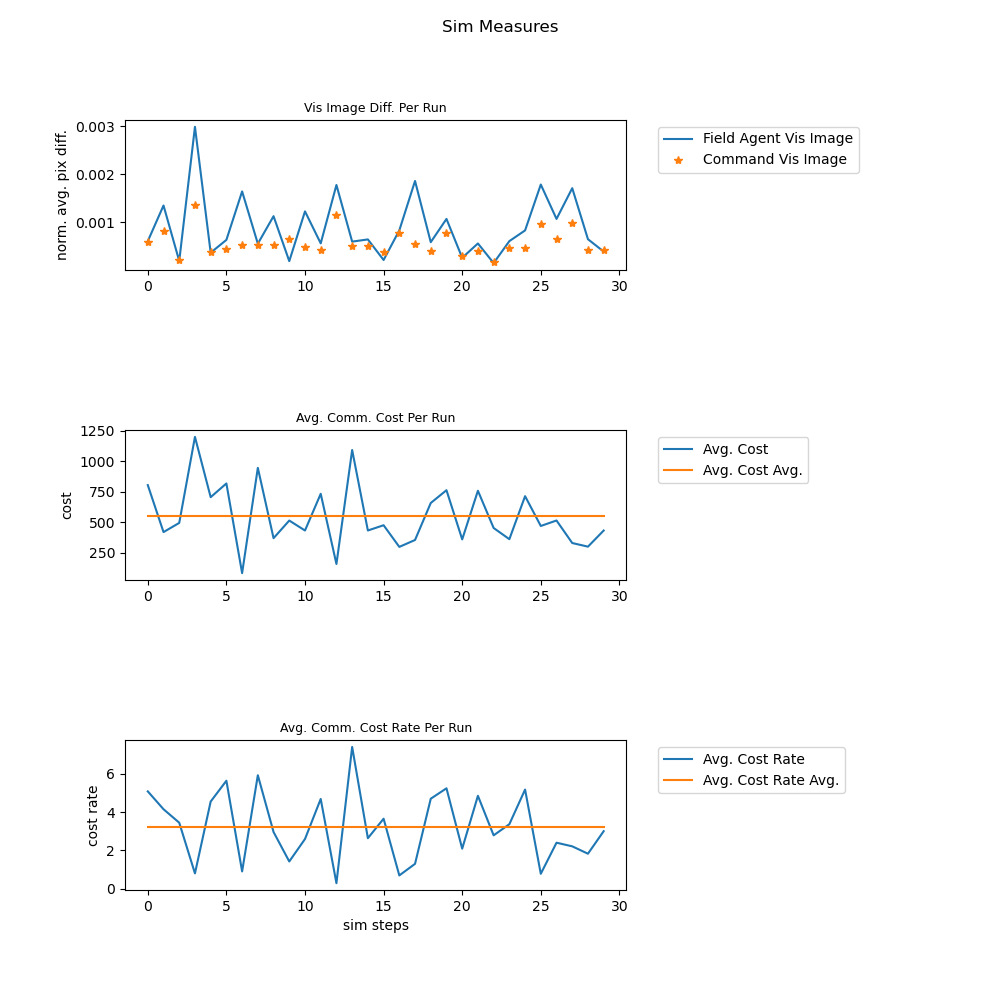

In [ ]:
plt.rcParams[ 'figure.figsize' ] = 10, 10

timeToEndIncidentStackRun5 = timeToEndIncidentStack
avgFieldAgentVisImageDiffStackRun5 = avgFieldAgentVisImageDiffStack
avgCommanderAgentVisImageDiffStackRun5 = avgCommanderAgentVisImageDiffStack
avgCostStackRun5 = avgCostStack
avgCostStackRun5Avg = [ ( sum( avgCostStackRun5 ) / len( avgCostStackRun5 ) ) for x in avgCostStackRun5 ]
avgCostRateStackRun5 = avgCostRateStack
avgCostRateStackRun5Avg = [ ( sum( avgCostRateStackRun5 ) / len( avgCostRateStackRun5 ) ) for x in avgCostRateStackRun5 ]

measFig = plt.figure()
measGs = measFig.add_gridspec( 25, 3 )
measFig.suptitle( 'Sim Measures' )

imageDiffAx = measFig.add_subplot( measGs[ 0:5, 0:2 ] )
imageDiffDiv = make_axes_locatable( imageDiffAx )

costAx = measFig.add_subplot( measGs[ 10:15, 0:2 ] )
costDiv = make_axes_locatable( costAx )

costRateAx = measFig.add_subplot( measGs[ 20:25, 0:2 ] )
costRateDiv = make_axes_locatable( costRateAx )

imageDiffPlot = imageDiffAx.plot( avgFieldAgentVisImageDiffStackRun5, label = 'Field Agent Vis Image' )
imageDiffPlot = imageDiffAx.plot( avgCommanderAgentVisImageDiffStackRun5, '*', label = 'Command Vis Image' )
imageDiffPlotTitle = imageDiffAx.set_title( 'Vis Image Diff. Per Run', fontsize = myFontsize )
imageDiffAx.set_ylabel( 'norm. avg. pix diff.' )
imageDiffAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costPlot = costAx.plot( avgCostStackRun5, label = 'Avg. Cost' )
costPlot = costAx.plot( avgCostStackRun5Avg, label = 'Avg. Cost Avg.' )
costPlotTitle = costAx.set_title( 'Avg. Comm. Cost Per Run', fontsize = myFontsize )
costAx.set_ylabel( 'cost' )
costAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costRatePlot = costRateAx.plot( avgCostRateStackRun5, label = 'Avg. Cost Rate' )
costRatePlot = costRateAx.plot( avgCostRateStackRun5Avg, label = 'Avg. Cost Rate Avg.' )
costRatePlotTitle = costRateAx.set_title( 'Avg. Comm. Cost Rate Per Run', fontsize = myFontsize )
costRateAx.set_ylabel( 'cost rate' )
costRateAx.set_xlabel( 'sim steps' )
costRateAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

In [ ]:
timeToEndIncidentStack = []
avgFieldAgentVisImageDiffStack = []
avgCommanderAgentVisImageDiffStack = []
avgCostStack = []
avgCostRateStack = []
# numSims = 30

for i in range( 0, numSims ):
    
    mapWidth = 125
    mapHeight = 125

    incidentEpicenter = { 'x' : 60, 'y' : 60 }
    emergencyCreationAvgRate = 1 
    emergencySpatialAvg = 5
    emergencyIntensityAvg = 0.5 
    maxNumEmergencies = 30 
    maxEmergencyInteractionDist = 5 
    maxFieldAgentEffect = 0.1

    emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
    incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                        maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

    fieldAgentSize = 1
    reliabilityAvg = 0.5
    moveSpeedAvg = 3 
    tokenDistanceAvg = 10 
    tokenNoiseStdAvg = 0.01 
    maxAgentDist = 10 
    squadSize = 10
    platoonSize = 5 
    companySize = 3

    fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
    fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                              squadSize, platoonSize, companySize, mapWidth, mapHeight )
    fieldAgents.createCompany()
    fieldAgents.setRandomLocs()


    # nodeSize = 1 
    # minNodeIntensity = 15
    # numTotalNodes = 30
    # numDeployedNodes = 10
    # nodeDeploymentSpeedAvg = 100 
    # nodeDeploymentSpeedMax = 200 
    # nodeDeploymentSpeedMin = 50 
    # nodeDeployedTimeAvg = 200 
    # nodeChargeTimeAvg = 5 
    # linkPricePerDist = 0.000001 
    # incidentSize = 50
    # numTransfersPerStepAvg = 35
    # minNumTransfersPerStep = 20
    # innerNodeNum = 2 
    # middleNodeNum = 3 
    # outerNodeNum = 5

    nodeSize = 1 
    minNodeIntensity = 15
    numTotalNodes = 500
    numDeployedNodes = 200
    nodeDeploymentSpeedAvg = 100 
    nodeDeploymentSpeedMax = 200 
    nodeDeploymentSpeedMin = 50 
    nodeDeployedTimeAvg = 200 
    nodeChargeTimeAvg = 5 
    linkPricePerDist = 0.000001 
    incidentSize = 50
    numTransfersPerStepAvg = 15
    minNumTransfersPerStep = 5
    innerNodeNum = 30 
    middleNodeNum = 70 
    outerNodeNum = 100

    commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

    commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                              nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                              nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                              numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

    fieldAgents.commNodes = commNetwork.nodes

    numOfficers = 4
    interferenceRateAvg = 0.99
    interferenceIntensityAvg = 100
    underspendingRateAvg = 10
    overspendingRateAvg = 1000
    objectiveSizeAvg = 2
    maxObjectiveSize = 5
    minObjectiveSize = 1

    officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                                  overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                                  mapWidth )

    commanderAgent = CommanderAgent()

    simDivider = 10
    simTime = 20
    bigThisTime = 0


    fieldAgentVisImageDiffStack = []
    commanderAgentVisImageDiffStack = []

    while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

        bigThisTime += 1

        thisTime = bigThisTime / simDivider

        incident.companies = fieldAgents.companies

        incident.updateEmergencies( thisTime )

        emergencyMap.emergencies = incident.emergencies

        emergencyMap.updateMap()

        commNetwork.companies = fieldAgents.companies

        commNetwork.updateNodeLoc( thisTime )

        commNetwork.updateDirectedCommNetwork()

        commNetworkMap.nodes = commNetwork.nodes

        commNetworkMap.updateMap()

        fieldAgentMap.companies = fieldAgents.companies

        fieldAgentMap.updateMap()

        fieldAgents.emergencyMap = emergencyMap.currentMap 

        fieldAgents.commNetwork = commNetwork.directedNetwork

        fieldAgents.generateVisMap()

        fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

        officerAgents.visMap = fieldAgents.visMap

        officerAgents.updateObjectives()

        commanderAgent.visMap = officerAgents.alteredVisMap

        commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

        commanderAgent.updateOrderMap()

        fieldAgents.orderMap = commanderAgent.orderMap

        fieldAgents.moveAgents()

        print('thisSim: ', i,', thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

    fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
    commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]
    
    timeToEndIncidentStack.append( thisTime )
    avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
    avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
    avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
    avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0


<ipython-input-11-d3ae80301edf>:7: RuntimeWarning: invalid value encountered in true_divide
  normImage2 = image2 / norm2


cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


<ipython-input-11-d3ae80301edf>:4: RuntimeWarning: invalid value encountered in true_divide
  normImage1 = image1 / norm1


thisSim:  0 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transf

thisSim:  0 , thisTime:  6.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisTime:  6.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisTime:  6.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisTime:  6.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisTime:  7.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisTime:  7.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisTime:  7.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisTime:  7.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisTime:  7.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  0 , thisT

thisSim:  0 , thisTime:  13.9 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  14.0 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  14.1 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  14.2 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
thisSim:  0 , thisTime:  14.3 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  14.4 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  14.5 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  14.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  0 , thisTime:  14.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmerg

cannot transfer!
thisSim:  0 , thisTime:  20.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  0 , thisTime:  21.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  0 , thisTime:  21.1 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  0 , thisTime:  21.2 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
thisSim:  0 , thisTime:  21.3 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  21.4 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  0 , thisTime:  21.5 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  0 , thisTime:  21.6 , totalNumEmergencies:  16 , currentNumEmergencies:  2 , numEmergen

cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  0 , thisTime:  27.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  0 , thisTime:  27.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  0 , thisTime:  27.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  27.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:

thisSim:  0 , thisTime:  33.3 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  33.4 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  0 , thisTime:  33.5 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  0 , thisTime:  33.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  0 , thisTime:  33.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  0 , thisTime:  33.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  0 , thisTime:  33.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  0 , thisTime:  34.0 , totalNumEmergencies:  30 , currentNumEmergencies

cannot transfer!
thisSim:  1 , thisTime:  5.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  1 , thisTime:  5.2 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  1 , thisTime:  5.3 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  1 , thisTime:  5.4 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  1 , thisTime:  5.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  1 , thisTime:  5.6 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  5.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!

cannot transfer!
thisSim:  1 , thisTime:  11.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  1 , thisTime:  11.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  1 , thisTime:  11.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  1 , thisTime:  11.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  1 , thisTime:  11.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  1 , thisTime:  11.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  1 , thisTime:  12.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  1 , thisTime:  12.1 , totalNumEmergencies:  12 , currentNumEmergencies

thisSim:  1 , thisTime:  17.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  1 , thisTime:  18.0 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  1 , thisTime:  18.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  18.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  1 , thisTime:  18.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  1 , thisTime:  18.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  1 , thisTime:  18.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  1 , thisTime:  18.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  1 , thisTime:  18.7 , tota

cannot transfer!
thisSim:  1 , thisTime:  24.4 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  1 , thisTime:  24.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  24.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  24.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  1 , thisTime:  24.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  24.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  1 , thisTime:  25.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  1 , thisTime:  25.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergen

thisSim:  1 , thisTime:  30.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  1 , thisTime:  31.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  1 , thisTime:  31.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  1 , thisTime:  31.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  1 , thisTime:  31.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  1 , thisTime:  31.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  1 , thisTime:  31.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  1 , thisTime:  31.6 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  1 , thisTime:  31.7 , totalNumEmergencies: 

cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  3.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  2 , thisTime:  3.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  3.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  2 , thisTime:  3.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  3.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  2 , thisTime:  4.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  2 , thisTime:  4.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  2 , thisTime:  4.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEn

thisSim:  2 , thisTime:  10.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  10.4 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  2 , thisTime:  10.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  2 , thisTime:  10.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  2 , thisTime:  10.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  2 , thisTime:  10.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  2 , thisTime:  10.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  2 , thisTime:  11.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  2 , thisTime:  11.1 , totalNumEmergencies: 

thisSim:  2 , thisTime:  16.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  2 , thisTime:  17.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  2 , thisTime:  17.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  2 , thisTime:  17.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  2 , thisTime:  17.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  2 , thisTime:  17.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  2 , thisTime:  17.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  2 , thisTime:  17.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
th

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  22.5 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  22.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  22.7 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  22.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  2 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  2 , thisTime:  23.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergencie

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  3 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  3 , thisTime:  1.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  1.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  3 , thisTime:  1.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  3 , thisTime:  1.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
thisSim:  3 , th

thisSim:  3 , thisTime:  7.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  7.5 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  3 , thisTime:  7.6 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  7.7 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  7.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  3 , thisTime:  7.9 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  3 , thisTime:  8.0 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  3 , thisTime:  8.1 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
thisSim:  3 , thisTime:  8.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmerge

cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  14.0 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  3 , thisTime:  14.1 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  14.2 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  3 , thisTime:  14.3 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  3 , thisTime:  14.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  3 , thisTime:  14.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  14.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  14.7 , totalNumEmergencies:  13 , curr

thisSim:  3 , thisTime:  20.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  3 , thisTime:  20.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  20.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  20.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  20.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  20.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  3 , thisTime:  20.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  3 , thisTime:  21.0

cannot transfer!
thisSim:  3 , thisTime:  26.1 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  26.2 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  3 , thisTime:  26.3 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  26.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  26.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  3 , thisTime:  26.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  3 , thisTime:  26.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:

thisSim:  4 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  4 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  4 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  4 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  4 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  4 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  4 , th

cannot transfer!
thisSim:  4 , thisTime:  6.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  6.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  6.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  4 , thisTime:  6.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  6.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  6.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  6.8 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  6.9 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
thisSim:  4 , thisTime:  7.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmerge

thisSim:  4 , thisTime:  13.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.6 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  13.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  14.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  14.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  14.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  4 , thisTime:  14.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot tra

thisSim:  4 , thisTime:  20.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  20.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  20.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  20.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  21.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  21.1 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  4 , thisTime:  21.2 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  21.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  4 , thisTime:  21.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , 

cannot transfer!
thisSim:  4 , thisTime:  27.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  4 , thisTime:  27.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  4 , thisTime:  27.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  4 , thisTime:  27.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  4 , thisTime:  27.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  4 , thisTime:  28.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  4 , thisTime:  28.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  4 , thisTime:  28.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  4 , thisTime:  28.3 , tota

thisSim:  4 , thisTime:  34.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  4 , thisTime:  34.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  34.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  4 , thisTime:  34.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  34.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  4 , thisTime:  34.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  34.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  35.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  4 , thisTime:  35.1 , totalNumEmergencies: 

cannot transfer!
thisSim:  5 , thisTime:  4.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  4.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  5 , thisTime:  5.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  5.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  5.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  5.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  5.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  5 , thisTime:  5.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  5 , thisTime:  5.6 , totalNumEmergencies:  8 , currentNumEmergencie

cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  11.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  5 , thisTime:  11.5 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  5 , thisTime:  11.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  5 , thisTime:  11.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  11.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  11.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  12.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:

cannot transfer!
thisSim:  5 , thisTime:  17.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  5 , thisTime:  18.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  5 , thisTime:  18.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  5 , thisTime:  18.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  5 , thisTime:  18.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  5 , thisTime:  18.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  5 , thisTime:  18.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  5 , thisTime:  18.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
ca

thisSim:  5 , thisTime:  24.1 , totalNumEmergencies:  21 , currentNumEmergencies:  3 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  24.2 , totalNumEmergencies:  21 , currentNumEmergencies:  3 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  5 , thisTime:  24.3 , totalNumEmergencies:  21 , currentNumEmergencies:  3 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  24.4 , totalNumEmergencies:  21 , currentNumEmergencies:  3 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  5 , thisTime:  24.5 , totalNumEmergencies:  21 , currentNumEmergencies:  3 , numEmergenciesEnded:  18
thisSim:  5 , thisTime:  24.6 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  5 , thisTime:  24.7 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  5 , thisTime:  24.8 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
th

cannot transfer!
thisSim:  5 , thisTime:  30.6 , totalNumEmergencies:  26 , currentNumEmergencies:  2 , numEmergenciesEnded:  24
thisSim:  5 , thisTime:  30.7 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  5 , thisTime:  30.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  30.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  5 , thisTime:  31.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  5 , thisTime:  31.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  31.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  31.3 , totalNumEmergencies:  27 , currentNumEmergencies

thisSim:  5 , thisTime:  37.4 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  5 , thisTime:  37.5 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  5 , thisTime:  37.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  5 , thisTime:  37.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  5 , thisTime:  37.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  5 , thisTime:  37.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  5 , thisTime:  38.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  5 , thisTime:  38.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  5 , thisTime:  38.2 , tota

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  2.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  2.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
can

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  5.4 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  5.5 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  5.6 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot tra

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  8.2 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot tra

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  11.0 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  11.1 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  11.2 , totalNumEmergencies:  9 , currentNumEmergencies:  9 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  13.8 , totalNumEmergencies:  11 , currentNumEmergencies:  11 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  13.9 , totalNumEmergencies:  11 , currentNumEmergencies:  11 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  14.0 , totalNumEmergencies:  12 , currentNumEmergencies:  12 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  16.6 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  16.7 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  16.8 , totalNumEmergencies:  13 , currentNumEmergencies:  13 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  19.4 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  19.5 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  19.6 , totalNumEmergencies:  17 , currentNumEmergencies:  17 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  22.2 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  22.3 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  22.4 , totalNumEmergencies:  18 , currentNumEmergencies:  18 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  25.0 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  25.1 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  25.2 , totalNumEmergencies:  24 , currentNumEmergencies:  24 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  27.8 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  27.9 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  28.0 , totalNumEmergencies:  25 , currentNumEmergencies:  25 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  30.6 , totalNumEmergencies:  26 , currentNumEmergencies:  26 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  30.7 , totalNumEmergencies:  26 , currentNumEmergencies:  26 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  30.8 , totalNumEmergencies:  26 , currentNumEmergencies:  26 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  33.4 , totalNumEmergencies:  28 , currentNumEmergencies:  28 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  33.5 , totalNumEmergencies:  28 , currentNumEmergencies:  28 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  33.6 , totalNumEmergencies:  28 , currentNumEmergencies:  28 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  36.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  36.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  36.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  39.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  39.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  39.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  41.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  41.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  42.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  44.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  44.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  44.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  47.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  47.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  47.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  50.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  50.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  50.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  53.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  53.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  53.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  55.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  55.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  56.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  58.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  58.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  58.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  61.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  61.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  61.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  64.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  64.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  64.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  67.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  67.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  67.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  69.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  69.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  70.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  72.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  72.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  72.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  75.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  75.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  75.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

thisSim:  6 , thisTime:  78.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  78.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  78.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  78.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesE

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  81.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  81.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  81.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  83.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  83.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  84.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  86.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  86.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  86.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  89.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  89.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  89.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  92.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  92.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  92.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  95.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  95.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  95.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  97.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  97.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  98.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
c

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  100.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  100.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  100.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  103.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  103.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  103.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  106.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  106.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  106.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  109.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  109.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  109.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  111.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  111.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  112.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  114.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  114.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  114.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  117.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  117.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  117.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  120.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  120.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  120.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  123.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  123.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  123.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  125.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  125.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  126.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  128.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  128.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  128.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  131.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  131.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  131.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  134.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  134.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  134.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  137.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  137.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  137.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  139.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  139.9 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  140.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  142.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  142.7 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  142.8 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  145.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  145.5 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  145.6 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  148.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  148.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  148.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  151.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  151.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  151.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  154.0 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  154.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  154.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  157.1 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  157.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  157.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  157.4 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  160.2 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  160.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  160.4 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  160.5 , totalNumEmergenc

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  163.3 , totalNumEmergencies:  30 , currentNumEmergencies:  30 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  163.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  163.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  163.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  6 , thisTime:  163.7 , totalNumEmergencies:  30 , currentNumEmergencies:  27 , 

cannot transfer!
thisSim:  7 , thisTime:  3.1 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  7 , thisTime:  3.2 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  7 , thisTime:  3.3 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
thisSim:  7 , thisTime:  3.4 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  7 , thisTime:  3.5 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  3.6 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  7 , thisTime:  3.7 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  3.8 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  7 , thisTime:  3.9 , totalNumEmer

cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  9.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  9.4 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  9.5 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  7 , thisTime:  9.6 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  9.7 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  7 , thisTime:  9.8 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  9.9 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
ca

thisSim:  7 , thisTime:  14.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  7 , thisTime:  14.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  7 , thisTime:  15.0 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  7 , thisTime:  15.1 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  15.2 , totalNumEmergencies:  22 , currentNumEmergencies:  3 , numEmergenciesEnded:  19
thisSim:  7 , thisTime:  15.3 , totalNumEmergencies:  22 , currentNumEmergencies:  3 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  7 , thisTime:  15.4 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  7 , thisTime:  15.5 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergen

thisSim:  7 , thisTime:  21.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  21.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  21.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  7 , thisTime:  21.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  7 , thisTime:  21.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  7 , thisTime:  21.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  7 , thisTime:  22.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  7 , thisTime:  22.1 , totalNumEmergencies:  26 , currentNumEmergencies

thisSim:  8 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  8 , thisTime:  2.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  2.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  2.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  2.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  8 , thisTime:  2.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  2.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  8 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNum

thisSim:  8 , thisTime:  8.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  8 , thisTime:  8.7 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  8 , thisTime:  8.8 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  8 , thisTime:  8.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  9.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  9.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  9.2 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  8 , thisTime:  9.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  8 , thisTime:  9.4 , totalNumEmergencies:  13 , currentNumEmergencie

cannot transfer!
thisSim:  8 , thisTime:  15.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  15.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  8 , thisTime:  15.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  8 , thisTime:  15.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  8 , thisTime:  15.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  8 , thisTime:  15.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  8 , thisTime:  15.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  8 , thisTime:  16.0 , totalNumEmergencies:  18 , currentNumEmergencies

thisSim:  8 , thisTime:  21.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  21.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  21.8 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  8 , thisTime:  21.9 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  22.0 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  8 , thisTime:  22.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  8 , thisTime:  22.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  22.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  8 , thisTime:  22.4 , totalNumEmergencies:  28 , currentNumE

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  2.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  2.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  2.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  9 , thisTime:  2.7 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  9 , thisTime:  2.8 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  9 , thisTime:  2.9 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  9 , thisTime:  3.0 , totalNumEmergencies:  3 , currentNumEmergencies:  1 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  9 , thisTime:  3.1 , totalNumEmergencies:  4 , currentNum

cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  8.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  9 , thisTime:  8.7 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  9 , thisTime:  8.8 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  9 , thisTime:  8.9 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  9 , thisTime:  9.0 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  9 , thisTime:  9.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  9 , thisTime:  9.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  9 , thisTime:  9.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEn

cannot transfer!
thisSim:  9 , thisTime:  15.3 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  15.4 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  15.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  15.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  9 , thisTime:  15.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  15.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  15.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:

thisSim:  9 , thisTime:  21.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  9 , thisTime:  21.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  9 , thisTime:  21.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  9 , thisTime:  21.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  9 , thisTime:  21.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  9 , thisTime:  21.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  9 , thisTime:  22.0 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  9 , thisTime:  22.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  9 , thisTime:  22.2 , totalNumEmergencies:  16 , currentNumE

cannot transfer!
thisSim:  9 , thisTime:  27.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  9 , thisTime:  28.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  9 , thisTime:  28.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  28.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  28.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  28.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  9 , thisTime:  28.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  9 , thisTime:  28.6 , totalNumEmerge

thisSim:  10 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  10 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  1.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  10 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  10 , thi

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  6.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  6.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  10 , thisTime:  6.9 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  10 , thisTime:  7.0 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  10 , thisTime:  7.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
thisSim:  10 , thisTime:  7.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
thisSim:  10 , thisTime:  7.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
thisSim:  10 , thisTime:  7.4 , totalNumEme

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  11.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  11.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  12.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  12.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  12.2 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmerge

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  16.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  16.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  16.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  16.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  16.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot tra

cannot transfer!
thisSim:  10 , thisTime:  22.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  10 , thisTime:  22.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  10 , thisTime:  22.2 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  10 , thisTime:  22.3 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  10 , thisTime:  22.4 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  22.5 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  22.6 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
canno

cannot transfer!
thisSim:  10 , thisTime:  27.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  27.9 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  10 , thisTime:  28.0 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  10 , thisTime:  28.1 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  10 , thisTime:  28.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  10 , thisTime:  28.3 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  10 , thisTime:  28.4 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  10 , thisTime:  28.5 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , nu

thisSim:  10 , thisTime:  33.6 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  10 , thisTime:  33.7 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  33.8 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  33.9 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  10 , thisTime:  34.0 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  10 , thisTime:  34.1 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
thisSim:  10 , thisTime:  34.2 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  10 , thisTime:  34.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded

thisSim:  11 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  1.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  11 , thisTime:  1.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  11 , thisTime:  2.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  11 , thisTime:  2.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  11 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot tr

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  6.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  6.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  6.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  6.5 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  6.6 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime: 

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  11.0 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  11.2 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  11.5 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  11.6 , tot

cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  16.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  11 , thisTime:  16.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  16.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  17.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  11 , thisTime:  17.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  11 , thisTime:  17.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  17.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisS

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  22.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  11 , thisTime:  22.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  22.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  22.7 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  22.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  22.9 , totalNumEme

cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  28.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  28.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  28.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  28.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  28.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  28.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  11 , thisTime:  28.6 , totalNumEmergencies:  27 , currentNumEmergencies:  

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  1.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  1.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  2.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  2.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  5.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  6.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  6.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  6.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  6.3 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  6.4 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1


cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  11.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  11.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  12.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  12.1 , totalNumEmergencies:  10 , currentNumEmergenc

cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  16.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  12 , thisTime:  16.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  16.7 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  16.8 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  16.9 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  17.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
thisSim:  12 , t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  21.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  21.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  22.0 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  22.1 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  22.2 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  22.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22

thisSim:  12 , thisTime:  27.1 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  12 , thisTime:  27.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  12 , thisTime:  27.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  27.4 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  12 , thisTime:  27.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  12 , thisTime:  27.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  12 , thisTime:  27.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  12 , thisTime:  27.8 , totalNumEmergencies:  28 , currentNumEme

cannot transfer!
thisSim:  13 , thisTime:  2.1 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  13 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  13 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  13 , thisTime:  2.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  13 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  13 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  13 , thisTime:  2.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  13 , thisTime:  2.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  8.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  13 , thisTime:  9.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  13 , thisTime:  9.6 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  9.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , 

thisSim:  13 , thisTime:  16.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  13 , thisTime:  16.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  13 , thisTime:  16.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  13 , thisTime:  16.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  13 , thisTime:  16.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  13 , thisTime:  16.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  13 , thisTime:  16.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  13 , thisTime:  16.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  13 , thisTime:  16

cannot transfer!
cannot transfer!
thisSim:  13 , thisTime:  21.5 , totalNumEmergencies:  23 , currentNumEmergencies:  3 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  13 , thisTime:  21.6 , totalNumEmergencies:  24 , currentNumEmergencies:  3 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  13 , thisTime:  21.7 , totalNumEmergencies:  25 , currentNumEmergencies:  4 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  13 , thisTime:  21.8 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  13 , thisTime:  21.9 , totalNumEmergencies:  27 , currentNumEmergencies:  6 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  13 , thisTime:  22.0 , totalNumEmergencies:  27 , currentNumEmergencies:  5 , numEmergenciesEnded:  22
thisSim:  13 , thisTime:  22.1 , totalNumEmergencies:  27 , currentNumEmergencies:  4 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  22.2 , totalNumEmergencies:  2

cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  2.1 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  2.2 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  2.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  2.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  2.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEn

cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  8.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  8.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  14 , thisTime:  8.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  8.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  14 , thisTime:  8.7 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEn

thisSim:  14 , thisTime:  13.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  13.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  14 , thisTime:  13.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  13.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  14 , thisTime:  13.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  14.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  14 , thisTime:  14.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  14 , thisTime:  14.2 , totalN

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  18.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  18.9 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  19.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  19.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  19.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  19.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  14 , t

cannot transfer!
thisSim:  14 , thisTime:  24.3 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  14 , thisTime:  24.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  24.8 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  14 , thisTime:  24.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
canno

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  30.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  30.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  14 , thisTime:  30.3 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  14 , thisTime:  30.4 , totalNumEmergencies:  28 , currentNumEmergencies:  2 , numEmergenciesEnded:  26
thisSim:  14 , thisTime:  30.5 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
thisSim:  14 , thisTime:  30.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  14 , thisTime:  30.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  14 , thisTime:  30.8 , totalNumEmergencies:  28 , currentNumEme

cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  2.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  2.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  15 , thisTime:  2.9 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  15 , thisTime:  3.0 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  15 , thisTime:  3.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  15 , thisTime:  3.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  15 , thisTime:  3.3 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  15 , thisTime:  3.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmerg

cannot transfer!
thisSim:  15 , thisTime:  8.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  9.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  15 , thisTime:  9.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  9.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  9.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  9.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  9.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot tr

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  14.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  14.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  15 , thisTime:  14.8 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  14.9 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  15 , thisTime:  15.0 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  15.1 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  15 , t

cannot transfer!
thisSim:  15 , thisTime:  21.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  21.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  21.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  21.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  21.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  21.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  21.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  15 , thisTime:  21.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  15 , thisTime:  21.9 , totalNumEmergencies:  19 , cu

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  27.7 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
cannot transfer!
thisSim:  15 , thisTime:  27.8 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  15 , thisTime:  27.9 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  15 , thisTime:  28.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  28.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  28.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  28.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  15 , thisTime:  28.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  0.9 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  1.0 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  1.1 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  1.2 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  1.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot t

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  6.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  6.5 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  6.6 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  6.7 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  6.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  6.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  7.0 , totalNumEmergencies:  7 , currentNum

cannot transfer!
thisSim:  16 , thisTime:  12.3 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  16 , thisTime:  12.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  12.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  16 , thisTime:  12.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  16 , thisTime:  12.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  16 , thisTime:  12.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  12.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
thisSim:  16 , thisTime:  13.0 , totalN

cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  17.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  17.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  17.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  16 , thisTime:  17.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  16 , thisTime:  18.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  16 , thisTime:  18.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  16 , thisTime:  18.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  16 , thisTim

cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  22.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  22.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  23.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  23.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  23.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  23.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  16 , thisTime:  23.4 , totalNumEmergencies:  23 , currentNumEmergencies:  

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEme

cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  5.4 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  5.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.6 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  17 , thisTime:  5.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  17 , thisTime:  5.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  17 , thisTime:  5.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  17 , thisTime:  6.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  6.1 , totalNumEmergencies:  4 , cu

thisSim:  17 , thisTime:  11.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  17 , thisTime:  11.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  17 , thisTime:  11.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  17 , thisTime:  11.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  17 , thisTime:  11.7 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  17 , thisTime:  11.8 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  17 , thisTime:  11.9 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  17 , thisTime:  12.0 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  17 , thisTime:  12.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmerg

cannot transfer!
thisSim:  17 , thisTime:  18.1 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  17 , thisTime:  18.2 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  17 , thisTime:  18.3 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  17 , thisTime:  18.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  17 , thisTime:  18.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  18.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  17 , thisTime:  18.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  18.8 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , nu

thisSim:  17 , thisTime:  24.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  17 , thisTime:  24.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  17 , thisTime:  24.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  24.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  17 , thisTime:  24.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  17 , thisTime:  25.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  17 , thisTime:  25.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  17 , thisTime:  25.2 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  0.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  0.6 , totalNumE

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  3.6 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  3.7 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  3.8 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  3.9 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , t

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  8.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  8.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  8.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  8.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  8.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesE

cannot transfer!
thisSim:  18 , thisTime:  12.5 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  12.6 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  12.7 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  12.8 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  12.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transf

thisSim:  18 , thisTime:  17.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  17.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  17.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  18 , thisTime:  17.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  17.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  17.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  17.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergencie

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  21.8 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  21.9 , totalNumEmergencies:  17 , currentNumEmergencies:  1 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  22.0 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  22.1 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
thisSim:  18 , thisTime:  22.2 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot tra

cannot transfer!
thisSim:  18 , thisTime:  26.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  26.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  18 , thisTime:  26.9 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  18 , thisTime:  27.0 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  18 , thisTime:  27.1 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  18 , thisTime:  27.2 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  18 , thisTime:  27.3 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  27.4 , totalN

thisSim:  18 , thisTime:  31.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  31.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  31.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  31.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  31.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  3

thisSim:  19 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  19 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  1.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  1.1 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  1.2 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  1.3 , totalNumEmergencies

thisSim:  19 , thisTime:  7.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  19 , thisTime:  7.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  19 , thisTime:  8.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  19 , thisTime:  8.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  19 , thisTime:  8.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  8.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  8.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  19 , thisTime:  8.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
c

thisSim:  19 , thisTime:  14.8 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  19 , thisTime:  14.9 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  19 , thisTime:  15.0 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  19 , thisTime:  15.1 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  19 , thisTime:  15.2 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  19 , thisTime:  15.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  19 , thisTime:  15.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  19 , thisTime:  15.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  19 , thisTime:  15.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmerg

thisSim:  19 , thisTime:  22.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  22.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  22.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  22.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  22.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  22.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  22.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  22.8 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  19 , thisTime:  22.9 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmerg

thisSim:  20 , thisTime:  0.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  20 , thisTime:  0.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  20 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  1.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  20 , thisTime:  1.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  1.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  1.3 , totalNumEme

thisSim:  20 , thisTime:  7.3 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  20 , thisTime:  7.4 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  20 , thisTime:  7.5 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
thisSim:  20 , thisTime:  7.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  20 , thisTime:  7.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  20 , thisTime:  7.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  7.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  20 , thisTime:  8.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  20 , thisTime:  8.1 , totalNumE

cannot transfer!
thisSim:  20 , thisTime:  13.4 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  13.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
thisSim:  20 , thisTime:  13.6 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  20 , thisTime:  13.7 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  20 , thisTime:  13.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  13.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  14.0 , totalNumEmergencies:  21 , current

cannot transfer!
thisSim:  20 , thisTime:  19.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  19.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  19.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  20 , thisTime:  19.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  20 , thisTime:  20.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  20 , thisTime:  20.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  3.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  3.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  21 , thisTime:  3.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  4.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  21 , thisTime:  4.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  4.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  4.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEn

cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  9.9 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  21 , thisTime:  10.0 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  21 , thisTime:  10.1 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  21 , thisTime:  10.2 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  21 , thisTime:  10.3 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  10.4 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  21 , thisTime:  10.5 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  10.6 , t

thisSim:  21 , thisTime:  15.8 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  15.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  21 , thisTime:  16.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  16.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  16.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  16.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  16.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  16.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded

cannot transfer!
thisSim:  21 , thisTime:  22.4 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  22.5 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
cannot transfer!
thisSim:  21 , thisTime:  22.6 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  22.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  21 , thisTime:  22.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  21 , thisTime:  22.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  21 , thisTime:  23.0 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  21 , thisTime:  23.1 , totalN

cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  28.2 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  28.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  28.4 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  28.5 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  28.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  28.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  21 , thisTime:  28.8 , totalNumEmergenci

cannot transfer!
thisSim:  21 , thisTime:  34.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  21 , thisTime:  34.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  21 , thisTime:  34.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  34.4 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  34.5 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  21 , thisTime:  34.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  21 , thisTime:  34.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
canno

thisSim:  22 , thisTime:  5.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  22 , thisTime:  5.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  22 , thisTime:  5.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  22 , thisTime:  5.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  22 , thisTime:  5.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  22 , thisTime:  5.6 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  22 , thisTime:  5.7 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  22 , thisTime:  5.8 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  22 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  

thisSim:  22 , thisTime:  12.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  22 , thisTime:  12.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  22 , thisTime:  12.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  22 , thisTime:  12.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  12.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  12.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  22 , thisTime:  12.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  22 , thisTime:  13.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded

cannot transfer!
thisSim:  22 , thisTime:  19.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  22 , thisTime:  19.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
cannot transfer!
thisSim:  22 , thisTime:  19.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  22 , thisTime:  19.9 , totalNumEmer

thisSim:  22 , thisTime:  25.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  22 , thisTime:  25.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  22 , thisTime:  25.9 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  22 , thisTime:  26.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  22 , thisTime:  26.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  22 , thisTime:  26.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  22 , thisTime:  26.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  22 , thisTime:  26.4 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  22 , thisTime:  26

thisSim:  23 , thisTime:  3.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  23 , thisTime:  3.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  23 , thisTime:  3.9 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  23 , thisTime:  4.0 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  23 , thisTime:  4.1 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  23 , thisTime:  4.2 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  23 , thisTime:  4.3 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  23 , thisTime:  4.4 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
thisSim:  23 , thisTime:  4.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , 

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  10.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  23 , thisTime:  10.5 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  23 , thisTime:  10.6 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  23 , thisTime:  10.7 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  23 , thisTime:  10.8 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  23 , thisTime:  10.9 , totalNumEmergencies:  8 , currentNumEmergencies:  1 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  23 , thisTime:  11.0 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
thisSim:  23 , thisTime:  11.1 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  23 , thisTime:  

cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  16.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  16.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  16.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  17.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  17.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  17.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  23 , thisTime:  17.3 , totalNumEmergencies:  16 , currentNumEmergencies:  

cannot transfer!
thisSim:  23 , thisTime:  22.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  23 , thisTime:  23.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  23.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  23.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  23.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  23.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  23 , thisTime:  23.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
canno

cannot transfer!
thisSim:  23 , thisTime:  28.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  29.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  23 , thisTime:  29.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  23 , thisTime:  29.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  29.3 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  29.4 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  23 , thisTime:  29.5 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  23 , thisTime:  29.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  23 , thisTime:  29

cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  4.2 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  24 , thisTime:  4.3 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  4.4 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  24 , thisTime:  4.5 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  4.6 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  24 , thisTime:  4.7 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  4.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot tr

cannot transfer!
thisSim:  24 , thisTime:  11.0 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  24 , thisTime:  11.1 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  24 , thisTime:  11.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  24 , thisTime:  11.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  24 , thisTime:  11.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  24 , thisTime:  11.5 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  24 , thisTime:  11.6 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
thisSim:  24 , thisTime:  11.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded

thisSim:  24 , thisTime:  17.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  24 , thisTime:  17.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  24 , thisTime:  17.9 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  24 , thisTime:  18.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  18.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  24 , thisTime:  18.2 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
cannot transfer!
thisSim:  24 , thisTime:  18.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  18.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  24 , thisTime:  18.5 , totalNumEmer

cannot transfer!
thisSim:  25 , thisTime:  3.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  25 , thisTime:  3.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  25 , thisTime:  3.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  25 , thisTime:  3.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  3.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  4.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  4.1 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEn

thisSim:  25 , thisTime:  9.7 , totalNumEmergencies:  11 , currentNumEmergencies:  3 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  25 , thisTime:  9.8 , totalNumEmergencies:  11 , currentNumEmergencies:  3 , numEmergenciesEnded:  8
thisSim:  25 , thisTime:  9.9 , totalNumEmergencies:  11 , currentNumEmergencies:  3 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  10.0 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  10.1 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  10.2 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  10.3 , totalNu

cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  15.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  25 , thisTime:  15.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
cannot transfer!
thisSim:  25 , thisTime:  15.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  25 , thisTime:  16.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  25 , thisTime:  16.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  25 , thisTime:  16.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  25 , thisTime:  16.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  25 , thisTim

cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  21.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  25 , thisTime:  21.8 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  21.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  25 , thisTime:  22.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  25 , thisTime:  22.1 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  22.2 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  22.3 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisS

cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  27.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  27.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  25 , thisTime:  27.9 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  25 , thisTime:  28.0 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  25 , thisTime:  28.1 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  28.2 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  25 , thisTime:  28.3 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
canno

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  1.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  1.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  1.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  4.4 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  4.5 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  4.6 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  4.7 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  26 , thisTime:  10.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.5 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  26 , thisTime:  10.6 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  26 , thisTime:  10.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmerge

thisSim:  26 , thisTime:  16.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  16.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  16.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  16.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  16.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  16.6 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  16.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  26 , thisTime:  16.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  26 , thisTime:  16.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmerg

cannot transfer!
thisSim:  26 , thisTime:  22.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  26 , thisTime:  22.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  26 , thisTime:  22.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  26 , thisTime:  22.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  26 , thisTime:  22.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  26 , thisTime:  23.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  26 , thisTime:  23.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  26 , thisTime:  23.2 , totalNumEmergencies:  16 , currentNumEme

thisSim:  26 , thisTime:  29.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  29.2 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  29.3 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
cannot transfer!
thisSim:  26 , thisTime:  29.4 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  29.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  26 , thisTime:  29.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  29.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  29.8 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  26 , thisTime:  29.9 , totalNumEmergencies:  24 , cu

cannot transfer!
thisSim:  26 , thisTime:  35.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  26 , thisTime:  35.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  26 , thisTime:  35.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  26 , thisTime:  35.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  26 , thisTime:  35.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  26 , thisTime:  35.9 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  26 , thisTime:  36.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  26 , thisTime:  36.1 , totalNumEmergencies:  27 , currentNumEme

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  2.7 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  2.8 , totalNumEmergencies:  2 , currentNumEmergencies:  0 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!

cannot transfer!
thisSim:  27 , thisTime:  7.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  27 , thisTime:  7.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  27 , thisTime:  7.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  27 , thisTime:  7.7 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  27 , thisTime:  7.8 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  27 , thisTime:  7.9 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  8.0 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  27 , thisTime:  8.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmerg

cannot transfer!
thisSim:  27 , thisTime:  13.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  27 , thisTime:  13.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  13.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  27 , thisTime:  13.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  27 , thisTime:  13.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  27 , thisTime:  13.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  27 , thisTime:  13.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  27 , thisTime:  14.0 , totalNumEmergencies:  12 , currentNumEme

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  19.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  27 , thisTime:  19.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  27 , thisTime:  19.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  27 , thisTime:  19.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  27 , thisTime:  19.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  19.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  19.8 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
canno

cannot transfer!
thisSim:  27 , thisTime:  24.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  25.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  25.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  25.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  27 , thisTime:  25.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  25.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  27 , thisTime:  25.5 , 

cannot transfer!
thisSim:  28 , thisTime:  3.9 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
cannot transfer!
thisSim:  28 , thisTime:  4.0 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
cannot transfer!
thisSim:  28 , thisTime:  4.1 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
cannot transfer!
thisSim:  28 , thisTime:  4.2 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
cannot transfer!
thisSim:  28 , thisTime:  4.3 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  4.4 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  28 , thisTime:  4.5 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  28 , thisTime:  4.6 , totalNumEmergencies:  7 , currentNumEmergenci

thisSim:  28 , thisTime:  10.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  28 , thisTime:  10.5 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  28 , thisTime:  10.6 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  28 , thisTime:  10.7 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  28 , thisTime:  10.8 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  28 , thisTime:  10.9 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  28 , thisTime:  11.0 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  11.1 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
cannot transfer!
cannot tran

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  16.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  28 , thisTime:  16.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  16.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  16.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  16.7 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  16.8 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  16.9 , 

cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  22.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  28 , thisTime:  22.5 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  22.6 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  22.7 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  22.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
thisSim:  28 , thisTime:  22.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
thisSim:  28 , thisTime:  23.0 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  28 , thisTime:  23.1 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEme

cannot transfer!
thisSim:  29 , thisTime:  5.4 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  5.5 , totalNumEmergencies:  5 , currentNumEmergencies:  2 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  29 , thisTime:  5.6 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  5.7 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  5.8 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
thisSim:  29 , thisTime:  5.9 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  6.0 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEn

cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  11.7 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  29 , thisTime:  11.9 , 

cannot transfer!
thisSim:  29 , thisTime:  16.6 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  16.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  29 , thisTime:  16.8 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  16.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  17.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  29 , thisTime:  17.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  17.2 , totalNumEmergencies:  15 , current

cannot transfer!
thisSim:  29 , thisTime:  22.3 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  22.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  22.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  22.6 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  22.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  29 , thisTime:  22.8 , totalNumEmergencies:  21 , currentNumEmergenc

thisSim:  29 , thisTime:  28.5 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  29 , thisTime:  28.6 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  29 , thisTime:  28.7 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  29 , thisTime:  28.8 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  29 , thisTime:  28.9 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  29 , thisTime:  29.0 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  29 , thisTime:  29.1 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
cannot transfer!
thisSim:  29 , thisTime:  29.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
cannot tran

thisSim:  29 , thisTime:  34.6 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  34.7 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  29 , thisTime:  34.8 , totalNumEmergencies:  29 , currentNumEmergencies:  0 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  34.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  29 , thisTime:  35.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  29 , thisTime:  35.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  29 , thisTime:  35.2 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30


<IPython.core.display.Javascript object>


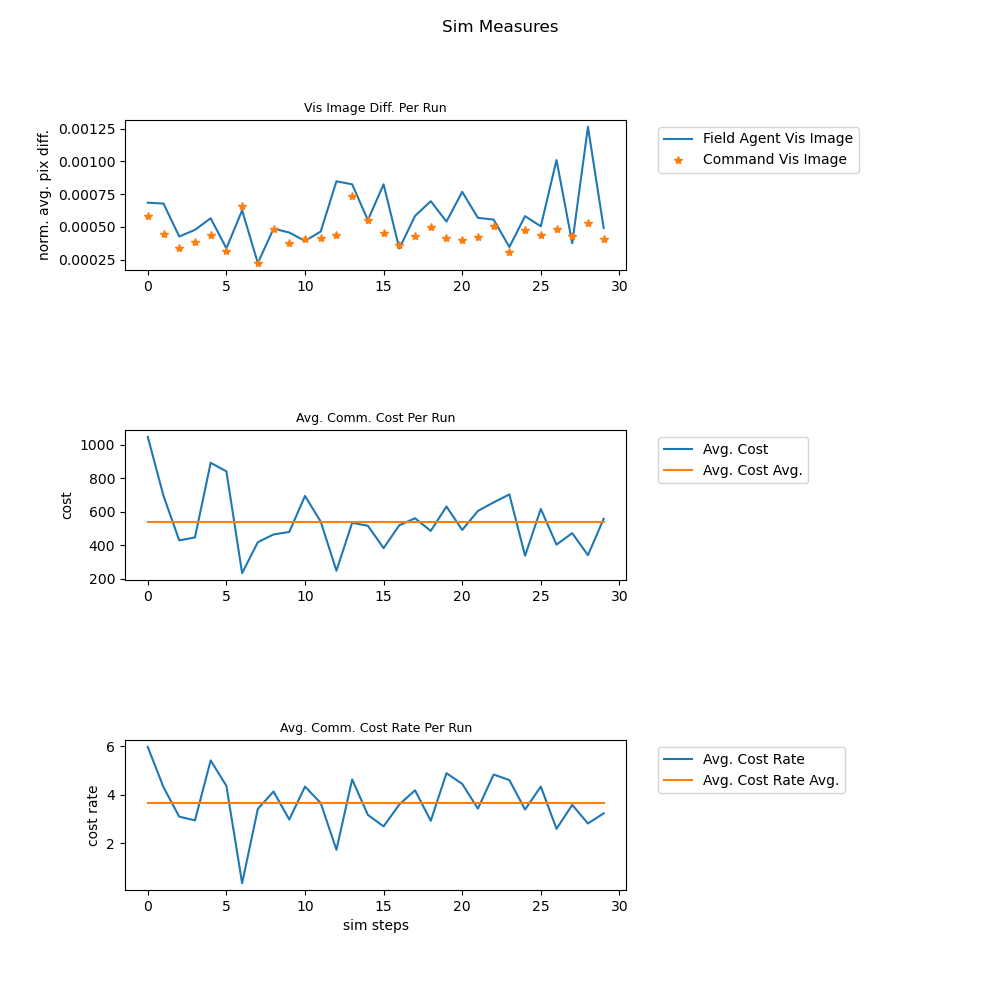

In [ ]:
plt.rcParams[ 'figure.figsize' ] = 10, 10

timeToEndIncidentStackRun6 = timeToEndIncidentStack
avgFieldAgentVisImageDiffStackRun6 = avgFieldAgentVisImageDiffStack
avgCommanderAgentVisImageDiffStackRun6 = avgCommanderAgentVisImageDiffStack
avgCostStackRun6 = avgCostStack
avgCostStackRun6Avg = [ ( sum( avgCostStackRun6 ) / len( avgCostStackRun6 ) ) for x in avgCostStackRun6 ]
avgCostRateStackRun6 = avgCostRateStack
avgCostRateStackRun6Avg = [ ( sum( avgCostRateStackRun6 ) / len( avgCostRateStackRun6 ) ) for x in avgCostRateStackRun6 ]

measFig = plt.figure()
measGs = measFig.add_gridspec( 25, 3 )
measFig.suptitle( 'Sim Measures' )

imageDiffAx = measFig.add_subplot( measGs[ 0:5, 0:2 ] )
imageDiffDiv = make_axes_locatable( imageDiffAx )

costAx = measFig.add_subplot( measGs[ 10:15, 0:2 ] )
costDiv = make_axes_locatable( costAx )

costRateAx = measFig.add_subplot( measGs[ 20:25, 0:2 ] )
costRateDiv = make_axes_locatable( costRateAx )

imageDiffPlot = imageDiffAx.plot( avgFieldAgentVisImageDiffStackRun6, label = 'Field Agent Vis Image' )
imageDiffPlot = imageDiffAx.plot( avgCommanderAgentVisImageDiffStackRun6, '*', label = 'Command Vis Image' )
imageDiffPlotTitle = imageDiffAx.set_title( 'Vis Image Diff. Per Run', fontsize = myFontsize )
imageDiffAx.set_ylabel( 'norm. avg. pix diff.' )
imageDiffAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costPlot = costAx.plot( avgCostStackRun6, label = 'Avg. Cost' )
costPlot = costAx.plot( avgCostStackRun6Avg, label = 'Avg. Cost Avg.' )
costPlotTitle = costAx.set_title( 'Avg. Comm. Cost Per Run', fontsize = myFontsize )
costAx.set_ylabel( 'cost' )
costAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costRatePlot = costRateAx.plot( avgCostRateStackRun6, label = 'Avg. Cost Rate' )
costRatePlot = costRateAx.plot( avgCostRateStackRun6Avg, label = 'Avg. Cost Rate Avg.' )
costRatePlotTitle = costRateAx.set_title( 'Avg. Comm. Cost Rate Per Run', fontsize = myFontsize )
costRateAx.set_ylabel( 'cost rate' )
costRateAx.set_xlabel( 'sim steps' )
costRateAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

In [ ]:
timeToEndIncidentStack = []
avgFieldAgentVisImageDiffStack = []
avgCommanderAgentVisImageDiffStack = []
avgCostStack = []
avgCostRateStack = []
# numSims = 30

for i in range( 0, numSims ):
    
    mapWidth = 125
    mapHeight = 125

    incidentEpicenter = { 'x' : 60, 'y' : 60 }
    emergencyCreationAvgRate = 1 
    emergencySpatialAvg = 5
    emergencyIntensityAvg = 0.5 
    maxNumEmergencies = 30 
    maxEmergencyInteractionDist = 5 
    maxFieldAgentEffect = 0.1

    emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
    incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                        maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

    fieldAgentSize = 1
    reliabilityAvg = 0.5
    moveSpeedAvg = 3 
    tokenDistanceAvg = 10 
    tokenNoiseStdAvg = 0.01 
    maxAgentDist = 10 
    squadSize = 3
    platoonSize = 2 
    companySize = 1

    fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
    fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                              squadSize, platoonSize, companySize, mapWidth, mapHeight )
    fieldAgents.createCompany()
    fieldAgents.createCompany()
    fieldAgents.createCompany()
    fieldAgents.setRandomLocs()


    # nodeSize = 1 
    # minNodeIntensity = 15
    # numTotalNodes = 30
    # numDeployedNodes = 10
    # nodeDeploymentSpeedAvg = 100 
    # nodeDeploymentSpeedMax = 200 
    # nodeDeploymentSpeedMin = 50 
    # nodeDeployedTimeAvg = 200 
    # nodeChargeTimeAvg = 5 
    # linkPricePerDist = 0.000001 
    # incidentSize = 50
    # numTransfersPerStepAvg = 35
    # minNumTransfersPerStep = 20
    # innerNodeNum = 2 
    # middleNodeNum = 3 
    # outerNodeNum = 5

    nodeSize = 1 
    minNodeIntensity = 15
    numTotalNodes = 50
    numDeployedNodes = 20
    nodeDeploymentSpeedAvg = 100 
    nodeDeploymentSpeedMax = 200 
    nodeDeploymentSpeedMin = 50 
    nodeDeployedTimeAvg = 200 
    nodeChargeTimeAvg = 5 
    linkPricePerDist = 0.000001 
    incidentSize = 50
    numTransfersPerStepAvg = 15
    minNumTransfersPerStep = 5
    innerNodeNum = 3 
    middleNodeNum = 7 
    outerNodeNum = 10

    commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

    commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                              nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                              nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                              numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

    fieldAgents.commNodes = commNetwork.nodes

    numOfficers = 4
    interferenceRateAvg = 0.99
    interferenceIntensityAvg = 100
    underspendingRateAvg = 10
    overspendingRateAvg = 1000
    objectiveSizeAvg = 2
    maxObjectiveSize = 5
    minObjectiveSize = 1

    officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                                  overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                                  mapWidth )

    commanderAgent = CommanderAgent()

    simDivider = 10
    simTime = 20
    bigThisTime = 0


    fieldAgentVisImageDiffStack = []
    commanderAgentVisImageDiffStack = []

    while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

        bigThisTime += 1

        thisTime = bigThisTime / simDivider

        incident.companies = fieldAgents.companies

        incident.updateEmergencies( thisTime )

        emergencyMap.emergencies = incident.emergencies

        emergencyMap.updateMap()

        commNetwork.companies = fieldAgents.companies

        commNetwork.updateNodeLoc( thisTime )

        commNetwork.updateDirectedCommNetwork()

        commNetworkMap.nodes = commNetwork.nodes

        commNetworkMap.updateMap()

        fieldAgentMap.companies = fieldAgents.companies

        fieldAgentMap.updateMap()

        fieldAgents.emergencyMap = emergencyMap.currentMap 

        fieldAgents.commNetwork = commNetwork.directedNetwork

        fieldAgents.generateVisMap()

        fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

        officerAgents.visMap = fieldAgents.visMap

        officerAgents.updateObjectives()

        commanderAgent.visMap = officerAgents.alteredVisMap

        commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

        commanderAgent.updateOrderMap()

        fieldAgents.orderMap = commanderAgent.orderMap

        fieldAgents.moveAgents()

        print('thisSim: ', i,', thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

    fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
    commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]
    
    timeToEndIncidentStack.append( thisTime )
    avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
    avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
    avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
    avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

<ipython-input-10-d3ae80301edf>:7: RuntimeWarning: invalid value encountered in true_divide
  normImage2 = image2 / norm2


thisSim:  0 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisT

<ipython-input-10-d3ae80301edf>:4: RuntimeWarning: invalid value encountered in true_divide
  normImage1 = image1 / norm1


thisSim:  0 , thisTime:  2.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  2.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  2.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  2.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  3.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  3.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  3.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  3.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisTime:  3.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  0 , thisT

thisSim:  0 , thisTime:  10.3 , totalNumEmergencies:  4 , currentNumEmergencies:  2 , numEmergenciesEnded:  2
thisSim:  0 , thisTime:  10.4 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  0 , thisTime:  10.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  0 , thisTime:  10.6 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  0 , thisTime:  10.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  0 , thisTime:  10.8 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  0 , thisTime:  10.9 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  0 , thisTime:  11.0 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  0 , thisTime:  11.1 , totalNumEmergencies:  4 , currentNumEmergencies:  0 , numEmergenciesEnded:  4
thisSim:  

thisSim:  0 , thisTime:  17.5 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  0 , thisTime:  17.6 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  0 , thisTime:  17.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  0 , thisTime:  17.8 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  0 , thisTime:  17.9 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  0 , thisTime:  18.0 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  0 , thisTime:  18.1 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  0 , thisTime:  18.2 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  0 , thisTime:  18.3 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  

thisSim:  0 , thisTime:  24.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  24.8 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  24.9 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  25.0 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  25.1 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmergenciesEnded:  13
thisSim:  0 , thisTime:  25.2 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  0 , thisTime:  25.3 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  0 , thisTime:  25.4 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  0 , thisTime:  25.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  0 , thisTime:  32.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  0 , thisTime:  32.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  0 , thisTime:  32.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  0 , thisTime:  32.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  0 , thisTime:  32.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  0 , thisTime:  32.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  0 , thisTime:  32.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  0 , thisTime:  32.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  0 , thisTime:  32.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  1 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  1 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  1 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  1 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  1 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  1 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  1 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  1 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot tr

thisSim:  1 , thisTime:  7.2 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  1 , thisTime:  7.3 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  1 , thisTime:  7.4 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  1 , thisTime:  7.5 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  1 , thisTime:  7.6 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
thisSim:  1 , thisTime:  7.7 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
thisSim:  1 , thisTime:  7.8 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
thisSim:  1 , thisTime:  7.9 , totalNumEmergencies:  10 , currentNumEmergencies:  4 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  1 , thisTime:  8.0 , tota

thisSim:  1 , thisTime:  14.1 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  1 , thisTime:  14.2 , totalNumEmergencies:  17 , currentNumEmergencies:  0 , numEmergenciesEnded:  17
thisSim:  1 , thisTime:  14.3 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  1 , thisTime:  14.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  1 , thisTime:  14.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  1 , thisTime:  14.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  1 , thisTime:  14.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  1 , thisTime:  14.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  1 , thisTime:  14.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  1 , thisTime:  21.3 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  1 , thisTime:  21.4 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  1 , thisTime:  21.5 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
thisSim:  1 , thisTime:  21.6 , totalNumEmergencies:  26 , currentNumEmergencies:  1 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  1 , thisTime:  21.7 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  1 , thisTime:  21.8 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  1 , thisTime:  21.9 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  1 , thisTime:  22.0 , totalNumEmergencies:  29 , currentNumEmergencies:  4 , numEmergenciesEnded:  25
thisSim:  1 , thisTime:  22.1 , totalNumEmergencies:  30 , currentNumE

thisSim:  2 , thisTime:  4.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  4.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  4.9 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  5.0 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  5.1 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  5.2 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  5.3 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  5.4 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  2 , thisTime:  5.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
cannot transfer!
th

thisSim:  2 , thisTime:  11.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  11.9 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  12.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  2 , thisTime:  12.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  2 , thisTime:  12.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  2 , thisTime:  12.3 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  2 , thisTime:  12.4 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  12.5 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmerg

thisSim:  2 , thisTime:  17.8 , totalNumEmergencies:  13 , currentNumEmergencies:  5 , numEmergenciesEnded:  8
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  17.9 , totalNumEmergencies:  13 , currentNumEmergencies:  5 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  18.0 , totalNumEmergencies:  13 , currentNumEmergencies:  5 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  18.1 , totalNumEmergencies:  13 , currentNumEmergencies:  5 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  18.2 , totalNumEmergencies:  14 , currentNumEmergencies:  6 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  18.3 , totalNumEmergencies:  14 , currentNumEmergencies:  6 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  18.4 , totalNumEmergencies:  14 , currentNumEmergencies:  6 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  18.5 , totalNumEmergencies:  14 , currentNumEmergencies:  6 , numEmergenciesEnded:  8
thisSim:  2 , thisTime:  18.6 , totalNumEmergencies:  14 , currentNumEmergenci

thisSim:  2 , thisTime:  24.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.6 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  24.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
cannot transfer!
canno

cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  30.0 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  30.1 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  30.2 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  30.3 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  30.4 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
thisSim:  2 , thisTime:  30.5 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
cannot transfer!
cannot transfer!
cannot transfer!
canno

thisSim:  2 , thisTime:  37.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  37.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  37.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  2 , thisTime:  37.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  2 , thisTime:  37.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  2 , thisTime:  37.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  2 , thisTime:  37.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  2 , thisTime:  37.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisT

thisSim:  2 , thisTime:  43.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  43.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  43.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  44.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  44.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  44.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  44.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  44.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  44.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  51.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  51.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  51.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  51.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  51.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  51.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  51.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  51.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  51.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  58.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  58.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  58.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  58.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  58.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  58.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  59.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  59.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  59.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  2 , thisTime:  65.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  65.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  66.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  66.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  66.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  66.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  66.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  66.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  2 , thisTime:  66.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  3 , thisTime:  2.4 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.5 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.6 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.7 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  2.8 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  2.9 , totalNumEmergencies:  4 , currentNumEmergencies:  4 , numEmergenciesEnded:  0
thisSim:  3 , thisTime:  3.0 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  3.1 , totalNumEmergencies:  5 , currentNum

thisSim:  3 , thisTime:  9.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  3 , thisTime:  9.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  3 , thisTime:  9.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  3 , thisTime:  9.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  3 , thisTime:  9.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  3 , thisTime:  9.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  3 , thisTime:  10.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  3 , thisTime:  10.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEn

thisSim:  3 , thisTime:  15.8 , totalNumEmergencies:  22 , currentNumEmergencies:  4 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  15.9 , totalNumEmergencies:  22 , currentNumEmergencies:  4 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  16.0 , totalNumEmergencies:  22 , currentNumEmergencies:  4 , numEmergenciesEnded:  18
thisSim:  3 , thisTime:  16.1 , totalNumEmergencies:  22 , currentNumEmergencies:  4 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  16.2 , totalNumEmergencies:  22 , currentNumEmergencies:  4 , numEmergenciesEnded:  18
thisSim:  3 , thisTime:  16.3 , totalNumEmergencies:  22 , currentNumEmergencies:  4 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  3 , thisTime:  16.4 , totalNumEmergencies:  22 , currentNumEmergencies:  4 , numEmergenciesEnded:  18
thisSim:  3 , thisTime:  16.5 , totalNumEmergencies:  22 , currentNumEmergencies

thisSim:  3 , thisTime:  22.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  3 , thisTime:  22.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  3 , thisTime:  23.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  3 , thisTime:  23.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  3 , thisTime:  23.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  3 , thisTime:  23.3 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  3 , thisTime:  23.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  3 , thisTime:  23.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  3 , thisTime:  23.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  4 , thisTime:  2.4 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  2.5 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  4 , thisTime:  2.6 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  2.7 , totalNumEmergencies:  6 , currentNumEmergencies:  3 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  4 , thisTime:  2.8 , totalNumEmergencies:  7 , currentNumEmergencies:  4 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  4 , thisTime:  2.9 , totalNumEmergencies:  7 , currentNumEmergencies:  4 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  3.0 , totalNumEmergencies:  7 , currentNumEmergencies:  4 , numEmergenciesEnded:  3
thisSim:  4 , thisTime:  3.1 , totalNumEmergencies:  7 , currentNumEmergencies:  4 ,

thisSim:  4 , thisTime:  9.1 , totalNumEmergencies:  14 , currentNumEmergencies:  4 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  9.2 , totalNumEmergencies:  14 , currentNumEmergencies:  4 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  4 , thisTime:  9.3 , totalNumEmergencies:  14 , currentNumEmergencies:  4 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  4 , thisTime:  9.4 , totalNumEmergencies:  14 , currentNumEmergencies:  4 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  4 , thisTime:  9.5 , totalNumEmergencies:  14 , currentNumEmergencies:  4 , numEmergenciesEnded:  10
cannot transfer!
thisSim:  4 , thisTime:  9.6 , totalNumEmergencies:  14 , currentNumEmergencies:  4 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  9.7 , totalNumEmergencies:  14 , currentNumEmergencies:  4 , numEmergenciesEnded:  10
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  9.8 , totalNumEmergencies:  

thisSim:  4 , thisTime:  15.4 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  4 , thisTime:  15.5 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  4 , thisTime:  15.6 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  4 , thisTime:  15.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  15.8 , totalNumEmergencies:  19 , currentNumEmergencies:  2 , numEmergenciesEnded:  17
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  15.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  4 , thisTime:  16.0 , totalNumEmergencies:  20 , currentNumEmergencies:  2 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  4 

thisSim:  4 , thisTime:  22.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  22.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  22.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  22.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  22.8 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  22.9 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  23.0 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  23.1 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  23.2 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  4 , thisTime:  29.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  4 , thisTime:  29.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  4 , thisTime:  29.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  4 , thisTime:  29.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  4 , thisTime:  29.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  29.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  29.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  4 , thisTime:  29.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
thisSim:  4 , thisT

thisSim:  5 , thisTime:  3.3 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  3.4 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  3.5 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  3.6 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  3.7 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  3.8 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  3.9 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  4.0 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  5 , thisTime:  4.1 , totalNumEmergencies:  6 , currentNumEmergencies:  6 , numEmergenciesEnded:  0
thisSim:  5 , thisT

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  9.4 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  9.5 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  9.6 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  9.7 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  9.8 , totalNumEmergencies:  7 , currentNumEmergencies:  7 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  9.9 , totalNumEmergenc

thisSim:  5 , thisTime:  14.3 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  14.4 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  14.5 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  14.6 , totalNumEmergencies:  10 , currentNumEmergencies:  10 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  14.7 , totalNumEmergencies:  11 , currentNumEmergencies:  11 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  14.8 , totalNumEmergencies:  11 , currentNumEmergencies:  11 , numEmergenci

thisSim:  5 , thisTime:  19.3 , totalNumEmergencies:  15 , currentNumEmergencies:  15 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  19.4 , totalNumEmergencies:  15 , currentNumEmergencies:  15 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  19.5 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  19.6 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  19.7 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  19.8 , totalNumEmergencies:  16 , currentNumEmergencies:  16 , numEmergenci

thisSim:  5 , thisTime:  24.1 , totalNumEmergencies:  19 , currentNumEmergencies:  19 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  24.2 , totalNumEmergencies:  20 , currentNumEmergencies:  20 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  24.3 , totalNumEmergencies:  20 , currentNumEmergencies:  20 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  24.4 , totalNumEmergencies:  20 , currentNumEmergencies:  20 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  24.5 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  24.6 , totalNumEmergencies:  21 , currentNumEmergencies:  21 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
canno

thisSim:  5 , thisTime:  29.2 , totalNumEmergencies:  26 , currentNumEmergencies:  24 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  29.3 , totalNumEmergencies:  26 , currentNumEmergencies:  24 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  5 , thisTime:  29.4 , totalNumEmergencies:  26 , currentNumEmergencies:  24 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  5 , thisTime:  29.5 , totalNumEmergencies:  26 , currentNumEmergencies:  24 , numEmergenciesEnded:  2
cannot transfer!
thisSim:  5 , thisTime:  29.6 , totalNumEmergencies:  26 , currentNumEmergencies:  24 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  29.7 , totalNumEmergencies:  26 , currentNumEmergencies:  24 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  5 , thisTime:  29.8 , totalNumEmergencies:  26 , currentNumEmergencies:  24 , numEmergenciesEnded

thisSim:  5 , thisTime:  35.4 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
thisSim:  5 , thisTime:  35.5 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
thisSim:  5 , thisTime:  35.6 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
thisSim:  5 , thisTime:  35.7 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
thisSim:  5 , thisTime:  35.8 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
thisSim:  5 , thisTime:  35.9 , totalNumEmergencies:  30 , currentNumEmergencies:  5 , numEmergenciesEnded:  25
thisSim:  5 , thisTime:  36.0 , totalNumEmergencies:  30 , currentNumEmergencies:  4 , numEmergenciesEnded:  26
thisSim:  5 , thisTime:  36.1 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  5 , thisTime:  36.2 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , 

thisSim:  6 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  6 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  6 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  6 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  6 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  6 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  6 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  6 , thisTime:  0.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  6 , thisTime:  0.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  6 , thisT

thisSim:  6 , thisTime:  7.7 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  6 , thisTime:  7.8 , totalNumEmergencies:  5 , currentNumEmergencies:  1 , numEmergenciesEnded:  4
thisSim:  6 , thisTime:  7.9 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  8.0 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  8.1 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  8.2 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  8.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  8.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisTime:  8.5 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  6 , thisT

thisSim:  6 , thisTime:  15.2 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  15.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  15.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  15.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  15.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  15.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  15.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  15.9 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  6 , thisTime:  16.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  6 , thisTime:  22.7 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  6 , thisTime:  22.8 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  6 , thisTime:  22.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  6 , thisTime:  23.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  6 , thisTime:  23.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  6 , thisTime:  23.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  6 , thisTime:  23.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  6 , thisTime:  23.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  6 , thisTime:  23.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  6 , thisTime:  30.2 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  6 , thisTime:  30.3 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  6 , thisTime:  30.4 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  6 , thisTime:  30.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  6 , thisTime:  30.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  30.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  30.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  30.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  6 , thisTime:  31.0 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  7 , thisTime:  1.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  1.3 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  1.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  1.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  1.6 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  1.7 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  1.8 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  1.9 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  7 , thisT

thisSim:  7 , thisTime:  9.0 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  9.1 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  9.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  9.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  9.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  9.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  9.6 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  9.7 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisTime:  9.8 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  7 , thisT

thisSim:  7 , thisTime:  16.7 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  16.8 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  16.9 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  17.0 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  7 , thisTime:  17.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  17.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  17.3 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  7 , thisTime:  17.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  7 , thisTime:  17.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  7 , thisTime:  24.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  24.2 , totalNumEmergencies:  27 , currentNumEmergencies:  1 , numEmergenciesEnded:  26
thisSim:  7 , thisTime:  24.3 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  7 , thisTime:  24.4 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  7 , thisTime:  24.5 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  7 , thisTime:  24.6 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  7 , thisTime:  24.7 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  7 , thisTime:  24.8 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnded:  27
thisSim:  7 , thisTime:  24.9 , totalNumEmergencies:  27 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  8 , thisTime:  2.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  2.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
thisSim:  8 , thisTime:  2.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  2.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  2.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  2.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  2.7 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  8 , thisTime:  2.8 , totalNumEmergencies:  2 , cur

thisSim:  8 , thisTime:  9.7 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  9.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  9.9 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  10.0 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  10.1 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  10.2 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  10.3 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  10.4 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 , thisTime:  10.5 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
thisSim:  8 ,

thisSim:  8 , thisTime:  17.1 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  17.2 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  17.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  17.4 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  17.5 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  17.6 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  17.7 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  17.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  8 , thisTime:  17.9 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  8 , thisTime:  24.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  24.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  24.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  24.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  24.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  25.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  25.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  25.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  8 , thisTime:  25.3 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnd

thisSim:  9 , thisTime:  2.4 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  2.5 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  2.6 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  2.7 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  2.8 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  2.9 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  3.0 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  3.1 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  3.2 , totalNumEmergencies:  1 , currentNumEmergencies:  0 , numEmergenciesEnded:  1
thisSim:  9 , thisT

thisSim:  9 , thisTime:  10.0 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  10.1 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  10.2 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  10.3 , totalNumEmergencies:  6 , currentNumEmergencies:  5 , numEmergenciesEnded:  1
thisSim:  9 , thisTime:  10.4 , totalNumEmergencies:  6 , currentNumEmergencies:  4 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  10.5 , totalNumEmergencies:  6 , currentNumEmergencies:  4 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  10.6 , totalNumEmergencies:  6 , currentNumEmergencies:  4 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  10.7 , totalNumEmergencies:  6 , currentNumEmergencies:  4 , numEmergenciesEnded:  2
thisSim:  9 , thisTime:  10.8 , totalNumEmergencies:  6 , currentNumEmergencies:  4 , numEmergenciesEnded:  2
thisSim:  

thisSim:  9 , thisTime:  17.6 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  17.7 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  17.8 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  17.9 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  18.0 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  18.1 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  18.2 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  18.3 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  9 , thisTime:  18.4 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnd

thisSim:  9 , thisTime:  25.1 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  9 , thisTime:  25.2 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  9 , thisTime:  25.3 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  9 , thisTime:  25.4 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  9 , thisTime:  25.5 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  9 , thisTime:  25.6 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  9 , thisTime:  25.7 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  9 , thisTime:  25.8 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  9 , thisTime:  25.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  9 , thisTime:  32.5 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  32.6 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  32.7 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  32.8 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  32.9 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  33.0 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  33.1 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  33.2 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnded:  24
thisSim:  9 , thisTime:  33.3 , totalNumEmergencies:  25 , currentNumEmergencies:  1 , numEmergenciesEnd

thisSim:  10 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  10 , thisTime:  1.6 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  

thisSim:  10 , thisTime:  8.3 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  8.4 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  8.5 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  8.6 , totalNumEmergencies:  7 , currentNumEmergencies:  2 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  8.7 , totalNumEmergencies:  8 , currentNumEmergencies:  3 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  8.8 , totalNumEmergencies:  8 , currentNumEmergencies:  3 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  8.9 , totalNumEmergencies:  8 , currentNumEmergencies:  3 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  9.0 , totalNumEmergencies:  8 , currentNumEmergencies:  3 , numEmergenciesEnded:  5
thisSim:  10 , thisTime:  9.1 , totalNumEmergencies:  8 , currentNumEmergencies:  3 , numEmergenciesEnded:  5
thisSim:  

thisSim:  10 , thisTime:  15.8 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  15.9 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  16.0 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  10 , thisTime:  16.1 , totalNumEmergencies:  12 , currentNumEmergencies:  2 , numEmergenciesEnded:  10
thisSim:  10 , thisTime:  16.2 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  10 , thisTime:  16.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  10 , thisTime:  16.4 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  10 , thisTime:  16.5 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  10 , thisTime:  16.6 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenc

thisSim:  10 , thisTime:  23.1 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  23.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  23.3 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  23.4 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  23.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  23.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  10 , thisTime:  23.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  23.8 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  10 , thisTime:  23.9 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  30.6 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  30.7 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  30.8 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  30.9 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  31.0 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  31.1 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  31.2 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  31.3 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmergenciesEnded:  25
thisSim:  10 , thisTime:  31.4 , totalNumEmergencies:  28 , currentNumEmergencies:  3 , numEmerg

thisSim:  10 , thisTime:  38.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  38.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  45.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  45.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  45.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  45.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  45.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  45.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  46.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  46.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  46.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  52.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  53.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  53.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  53.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  53.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  53.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  53.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  53.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  53.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  60.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  60.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  60.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  60.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  60.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  60.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  60.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  60.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , nu

thisSim:  10 , thisTime:  66.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  66.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  66.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  66.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  67.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  67.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  67.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  67.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded

thisSim:  10 , thisTime:  74.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  74.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  74.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  74.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  74.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  74.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  74.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  74.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  74.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  81.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  81.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  81.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  81.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  81.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  81.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  81.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  82.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  82.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  88.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  88.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  88.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  89.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  89.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  89.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  89.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  89.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  89.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  10 , thisTime:  95.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  95.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  95.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  95.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  95.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  96.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  96.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  96.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , nu

thisSim:  10 , thisTime:  102.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  102.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  102.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  102.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  102.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  102.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  102.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  103.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  103.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  109.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  109.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  109.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  109.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  109.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  109.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  109.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  110.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisT

cannot transfer!
thisSim:  10 , thisTime:  116.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  116.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  116.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  116.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  116.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  116.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  116.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  116.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  116.8 , totalNumEmergencies:

thisSim:  10 , thisTime:  123.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  123.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  123.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  123.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  123.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  123.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  123.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  123.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  123.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  130.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  130.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  130.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  130.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  130.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  130.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  130.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  130.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  131.0 , tot

thisSim:  10 , thisTime:  137.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  137.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  137.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  137.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  137.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  137.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  138.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  138.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  138.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  144.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  144.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  144.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  144.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  144.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  144.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  144.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  144.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  145.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  151.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  151.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  151.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  151.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  151.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  152.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  152.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  152.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  152.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  158.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  159.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  159.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  159.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  159.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  159.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  159.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  159.6 , totalNumEmergencies:  30 , currentNumEmergencies:

cannot transfer!
thisSim:  10 , thisTime:  165.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  165.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  165.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  165.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  165.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  166.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  166.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  10 , thisTime:  166.2 , totalNumEmergencies:  30 , curre

thisSim:  10 , thisTime:  172.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  172.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  172.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  172.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  173.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  173.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  173.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  173.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  173.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  179.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  179.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  180.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  180.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  180.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  180.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  180.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  180.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  180.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  187.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  187.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  187.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  187.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  187.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  187.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  187.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  187.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  187.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  194.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  194.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  194.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  194.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  194.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  194.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  194.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  195.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  195.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  10 , thisTime:  201.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  201.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  201.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  201.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  201.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  202.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  202.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  202.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  10 , thisTime:  202.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 ,

thisSim:  11 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  11 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  11 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  11 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  11 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  11 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  11 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  11 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  11 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  

thisSim:  11 , thisTime:  7.6 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  7.7 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  7.8 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  7.9 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  8.0 , totalNumEmergencies:  11 , currentNumEmergencies:  2 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  8.1 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  8.2 , totalNumEmergencies:  12 , currentNumEmergencies:  3 , numEmergenciesEnded:  9
thisSim:  11 , thisTime:  8.3 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  11 , thisTime:  8.4 , totalNumEmergencies:  12 , currentNumEmergencies:  0 , numEmergenciesEnded:  12

thisSim:  11 , thisTime:  15.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  15.2 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  15.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  15.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  15.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  15.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  15.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  15.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  11 , thisTime:  15.9 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmerg

thisSim:  11 , thisTime:  22.5 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
thisSim:  11 , thisTime:  22.6 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
thisSim:  11 , thisTime:  22.7 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
thisSim:  11 , thisTime:  22.8 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
thisSim:  11 , thisTime:  22.9 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
thisSim:  11 , thisTime:  23.0 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
thisSim:  11 , thisTime:  23.1 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
thisSim:  11 , thisTime:  23.2 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmergenciesEnded:  21
thisSim:  11 , thisTime:  23.3 , totalNumEmergencies:  26 , currentNumEmergencies:  5 , numEmerg

thisSim:  11 , thisTime:  29.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  30.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  30.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  30.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  30.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  30.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  30.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  30.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  30.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  11 , thisTime:  37.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  11 , thisTime:  37.3 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  12 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  12 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  12 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  12 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  12 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  12 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  12 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
this

thisSim:  12 , thisTime:  7.3 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  7.4 , totalNumEmergencies:  5 , currentNumEmergencies:  0 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  7.5 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  7.6 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  7.7 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  7.8 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  7.9 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  8.0 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  12 , thisTime:  8.1 , totalNumEmergencies:  6 , currentNumEmergencies:  1 , numEmergenciesEnded:  5
thisSim:  

thisSim:  12 , thisTime:  14.8 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  14.9 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  15.0 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  15.1 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  15.2 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  15.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  15.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  15.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  12 , thisTime:  15.6 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmerg

thisSim:  12 , thisTime:  22.1 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnded:  16
thisSim:  12 , thisTime:  22.2 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  12 , thisTime:  22.3 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  22.4 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  22.5 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  22.6 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  22.7 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  22.8 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  12 , thisTime:  22.9 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmerg

thisSim:  12 , thisTime:  29.5 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  12 , thisTime:  29.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  12 , thisTime:  29.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  12 , thisTime:  29.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  12 , thisTime:  29.9 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  13 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  13 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded

thisSim:  13 , thisTime:  7.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  7.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  7.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  7.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  7.5 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  13 , thisTime:  7.6 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  13 , thisTime:  7.7 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  13 , thisTime:  7.8 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
thisSim:  13 , thisTime:  7.9 , totalNumEmergencies:  10 , currentNumEmergencies:  1

thisSim:  13 , thisTime:  14.5 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  14.6 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  14.7 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  14.8 , totalNumEmergencies:  14 , currentNumEmergencies:  0 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  14.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  15.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  15.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  15.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  13 , thisTime:  15.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmerg

thisSim:  13 , thisTime:  21.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  13 , thisTime:  22.0 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  13 , thisTime:  22.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  22.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  22.3 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  22.4 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  22.5 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  22.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  13 , thisTime:  22.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  13 , thisTime:  29.3 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  13 , thisTime:  29.4 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  13 , thisTime:  29.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  13 , thisTime:  29.6 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  14 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  0.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  

thisSim:  14 , thisTime:  7.4 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  7.5 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  7.6 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  7.7 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  7.8 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  7.9 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  8.0 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  8.1 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  14 , thisTime:  8.2 , totalNumEmergencies:  5 , currentNumEmergencies:  5 , numEmergenciesEnded:  0
thisSim:  

thisSim:  14 , thisTime:  14.8 , totalNumEmergencies:  14 , currentNumEmergencies:  13 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  14.9 , totalNumEmergencies:  14 , currentNumEmergencies:  13 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  15.0 , totalNumEmergencies:  15 , currentNumEmergencies:  14 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  15.1 , totalNumEmergencies:  15 , currentNumEmergencies:  14 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  15.2 , totalNumEmergencies:  15 , currentNumEmergencies:  14 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  15.3 , totalNumEmergencies:  15 , currentNumEmergencies:  14 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  15.4 , totalNumEmergencies:  16 , currentNumEmergencies:  15 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  15.5 , totalNumEmergencies:  16 , currentNumEmergencies:  15 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  15.6 , totalNumEmergencies:  17 , currentNumEmergencies:  16 , numEmer

thisSim:  14 , thisTime:  22.1 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  22.2 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  22.3 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  22.4 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  22.5 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  22.6 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  22.7 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  22.8 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  22.9 , totalNumEmergencies:  20 , currentNumEmergencies:  19 , numEmer

thisSim:  14 , thisTime:  29.7 , totalNumEmergencies:  25 , currentNumEmergencies:  24 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  29.8 , totalNumEmergencies:  25 , currentNumEmergencies:  24 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  29.9 , totalNumEmergencies:  25 , currentNumEmergencies:  24 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  30.0 , totalNumEmergencies:  25 , currentNumEmergencies:  24 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  30.1 , totalNumEmergencies:  26 , currentNumEmergencies:  25 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  30.2 , totalNumEmergencies:  26 , currentNumEmergencies:  25 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  30.3 , totalNumEmergencies:  26 , currentNumEmergencies:  25 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  30.4 , totalNumEmergencies:  26 , currentNumEmergencies:  25 , numEmergenciesEnded:  1
thisSim:  14 , thisTime:  30.5 , totalNumEmergencies:  26 , currentNumEmergencies:  25 , numEmer

thisSim:  14 , thisTime:  37.0 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  37.1 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  37.2 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  37.3 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  37.4 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  37.5 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  37.6 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  37.7 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  37.8 , totalNumEmergencies:  30 , currentNumEmergencies:  17 ,

thisSim:  14 , thisTime:  44.3 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  44.4 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  44.5 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  44.6 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  44.7 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  44.8 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  44.9 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  45.0 , totalNumEmergencies:  30 , currentNumEmergencies:  17 , numEmergenciesEnded:  13
thisSim:  14 , thisTime:  45.1 , totalNumEmergencies:  30 , currentNumEmergencies:  17 ,

thisSim:  14 , thisTime:  51.7 , totalNumEmergencies:  30 , currentNumEmergencies:  15 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  51.8 , totalNumEmergencies:  30 , currentNumEmergencies:  15 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  51.9 , totalNumEmergencies:  30 , currentNumEmergencies:  15 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  52.0 , totalNumEmergencies:  30 , currentNumEmergencies:  15 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  52.1 , totalNumEmergencies:  30 , currentNumEmergencies:  15 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  52.2 , totalNumEmergencies:  30 , currentNumEmergencies:  15 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  52.3 , totalNumEmergencies:  30 , currentNumEmergencies:  15 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  52.4 , totalNumEmergencies:  30 , currentNumEmergencies:  15 , numEmergenciesEnded:  15
thisSim:  14 , thisTime:  52.5 , totalNumEmergencies:  30 , currentNumEmergencies:  15 ,

thisSim:  14 , thisTime:  59.1 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  59.2 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  59.3 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  59.4 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  59.5 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  59.6 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  59.7 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  59.8 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  59.9 , totalNumEmergencies:  30 , currentNumEmergencies:  10 ,

thisSim:  14 , thisTime:  66.5 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  66.6 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  66.7 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  66.8 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  66.9 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  67.0 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  67.1 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  67.2 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  67.3 , totalNumEmergencies:  30 , currentNumEmergencies:  10 ,

thisSim:  14 , thisTime:  74.0 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  74.1 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  74.2 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  74.3 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  74.4 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  74.5 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  74.6 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  74.7 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  74.8 , totalNumEmergencies:  30 , currentNumEmergencies:  10 ,

thisSim:  14 , thisTime:  81.4 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  81.5 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  81.6 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  81.7 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  81.8 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  81.9 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  82.0 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  82.1 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  82.2 , totalNumEmergencies:  30 , currentNumEmergencies:  10 ,

thisSim:  14 , thisTime:  88.7 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  88.8 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  88.9 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  89.0 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  89.1 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  89.2 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  89.3 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  89.4 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  89.5 , totalNumEmergencies:  30 , currentNumEmergencies:  10 ,

thisSim:  14 , thisTime:  95.9 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  96.0 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  96.1 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  96.2 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  96.3 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  96.4 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  96.5 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  96.6 , totalNumEmergencies:  30 , currentNumEmergencies:  10 , numEmergenciesEnded:  20
thisSim:  14 , thisTime:  96.7 , totalNumEmergencies:  30 , currentNumEmergencies:  10 ,

thisSim:  15 , thisTime:  5.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  5.1 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  5.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  5.3 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  5.4 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  5.5 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  5.6 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  5.7 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  15 , thisTime:  5.8 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  

thisSim:  15 , thisTime:  12.7 , totalNumEmergencies:  11 , currentNumEmergencies:  10 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  12.8 , totalNumEmergencies:  11 , currentNumEmergencies:  10 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  12.9 , totalNumEmergencies:  11 , currentNumEmergencies:  10 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  13.0 , totalNumEmergencies:  11 , currentNumEmergencies:  10 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  13.1 , totalNumEmergencies:  11 , currentNumEmergencies:  10 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  13.2 , totalNumEmergencies:  11 , currentNumEmergencies:  10 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  13.3 , totalNumEmergencies:  11 , currentNumEmergencies:  10 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  13.4 , totalNumEmergencies:  12 , currentNumEmergencies:  11 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  13.5 , totalNumEmergencies:  12 , currentNumEmergencies:  11 , numEmer

thisSim:  15 , thisTime:  20.2 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  20.3 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  20.4 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  20.5 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  20.6 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  20.7 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  20.8 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  20.9 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  21.0 , totalNumEmergencies:  22 , currentNumEmergencies:  21 , numEmer

thisSim:  15 , thisTime:  27.8 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  27.9 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  28.0 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  28.1 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  28.2 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  28.3 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  28.4 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  28.5 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmergenciesEnded:  1
thisSim:  15 , thisTime:  28.6 , totalNumEmergencies:  30 , currentNumEmergencies:  29 , numEmer

thisSim:  15 , thisTime:  34.5 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  34.6 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  34.7 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  34.8 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  34.9 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  15 , thisTime:  35.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!

thisSim:  16 , thisTime:  2.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  2.1 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  16 , thisTime:  2.2 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  2.3 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  2.4 , totalNumEmergencies:  3 , currentNumEmergencies:  2 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  2.5 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  2.6 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  2.7 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  16 , thisTime:  2.8 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  

thisSim:  16 , thisTime:  9.6 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  9.7 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  9.8 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  9.9 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  10.0 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  10.1 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  10.2 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  10.3 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  16 , thisTime:  10.4 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenci

thisSim:  16 , thisTime:  16.8 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnded:  16
thisSim:  16 , thisTime:  16.9 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmergenciesEnded:  17
thisSim:  16 , thisTime:  17.0 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  16 , thisTime:  17.1 , totalNumEmergencies:  18 , currentNumEmergencies:  0 , numEmergenciesEnded:  18
thisSim:  16 , thisTime:  17.2 , totalNumEmergencies:  19 , currentNumEmergencies:  1 , numEmergenciesEnded:  18
thisSim:  16 , thisTime:  17.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  16 , thisTime:  17.4 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  17.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot tran

thisSim:  16 , thisTime:  23.8 , totalNumEmergencies:  28 , currentNumEmergencies:  1 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  16 , thisTime:  23.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  24.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  24.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  16 , thisTime:  24.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  16 , thisTime:  24.3 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  16 , thisTime:  24.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  16 , thisTim

thisSim:  16 , thisTime:  31.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  31.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  31.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  31.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  31.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  31.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  31.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  31.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  16 , thisTime:  31.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  17 , thisTime:  5.1 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.2 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.3 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.4 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.5 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.6 , totalNumEmergencies:  3 , currentNumEmergencies:  0 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.7 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  17 , thisTime:  5.9 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  

cannot transfer!
thisSim:  17 , thisTime:  11.2 , totalNumEmergencies:  9 , currentNumEmergencies:  2 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  17 , thisTime:  11.3 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
thisSim:  17 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  17 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  17 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  17 , thisTime:  11.7 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
cannot transfer!
thisSim:  17 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  3 , numEmergenciesEnded:  7
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  11.9 , totalNumEmergencies:  10 , currentNumEmergencies

thisSim:  17 , thisTime:  17.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  18.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  18.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  18.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  18.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  18.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  17 , t

thisSim:  17 , thisTime:  23.5 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  17 , thisTime:  23.6 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  17 , thisTime:  23.7 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  23.8 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  17 , thisTime:  23.9 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  24.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  24.1 , totalNumEmergencies:  19 , current

cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  28.6 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  28.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  28.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  17 , thisTime:  28.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  17 , thisTime:  29.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  17 , thisTime:  29.1 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  17 , thisTime:  29.2 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  29.3 , totalNumEmergencies:  23 , currentNumEme

thisSim:  17 , thisTime:  34.0 , totalNumEmergencies:  29 , currentNumEmergencies:  4 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  17 , thisTime:  34.1 , totalNumEmergencies:  29 , currentNumEmergencies:  4 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  17 , thisTime:  34.2 , totalNumEmergencies:  29 , currentNumEmergencies:  4 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  34.3 , totalNumEmergencies:  29 , currentNumEmergencies:  3 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  34.4 , totalNumEmergencies:  29 , currentNumEmergencies:  3 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , thisTime:  34.5 , totalNumEmergencies:  29 , currentNumEmergencies:  3 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  17 , t

thisSim:  18 , thisTime:  4.4 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  18 , thisTime:  4.5 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  4.6 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  4.7 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  4.8 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  4.9 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  5.0 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  5.1 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  18 , thisTime:  5.2 , totalNumEmergencies:  2 , currentNumEmergencies:  1 , numEmergenciesEnded:  1
thisSim:  

thisSim:  18 , thisTime:  12.0 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  18 , thisTime:  12.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  18 , thisTime:  12.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  18 , thisTime:  12.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  18 , thisTime:  12.4 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  18 , thisTime:  12.5 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  18 , thisTime:  12.6 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  18 , thisTime:  12.7 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  18 , thisTime:  12.8 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
t

cannot transfer!
thisSim:  18 , thisTime:  19.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  18 , thisTime:  19.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  18 , thisTime:  19.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  18 , thisTime:  19.4 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  18 , thisTime:  19.5 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  18 , thisTime:  19.6 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  18 , thisTime:  19.7 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  18 , thisTime:  19.8 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  18 , thisTime:  19.9 , totalNumEmer

thisSim:  18 , thisTime:  26.3 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  26.4 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
thisSim:  18 , thisTime:  26.5 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  26.6 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  26.7 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
cannot transfer!
cannot transfer!
thisSim:  18 , thisTime:  26.8 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  18 , thisTime:  26.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  18 , thisTime:  27.0 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , nu

cannot transfer!
thisSim:  19 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  19 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  19 , thisTime:  0.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  19 , thisTime:  0.9 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  19 , thisTime:  1.0 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  19 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  19 , thisTime:  1.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  19 , thisTime:  1.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmerg

thisSim:  19 , thisTime:  7.1 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  19 , thisTime:  7.2 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  19 , thisTime:  7.3 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  19 , thisTime:  7.4 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  19 , thisTime:  7.5 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  19 , thisTime:  7.6 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  19 , thisTime:  7.7 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
cannot transfer!
thisSim:  19 , thisTime:  7.8 , totalNumEmergencies:  9 , currentNumEmergencies:  0 , numEmergenciesEnded:  9
c

cannot transfer!
thisSim:  19 , thisTime:  13.7 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  19 , thisTime:  13.8 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  19 , thisTime:  13.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  19 , thisTime:  14.0 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  19 , thisTime:  14.1 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  19 , thisTime:  14.2 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  19 , thisTime:  14.3 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
cannot transfer!
thisSim:  19 , thisTime:  14.4 , totalNumEmergencies:  15 , currentNumEme

thisSim:  19 , thisTime:  20.7 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  19 , thisTime:  20.8 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  19 , thisTime:  20.9 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  19 , thisTime:  21.0 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  19 , thisTime:  21.1 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  19 , thisTime:  21.2 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  19 , thisTime:  21.3 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  19 , thisTime:  21.4 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  19 , thisTime:  21.5 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmerg

thisSim:  19 , thisTime:  28.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  28.2 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  28.3 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  28.4 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  28.5 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  28.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  28.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  28.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
thisSim:  19 , thisTime:  28.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmerg

thisSim:  20 , thisTime:  3.4 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  3.5 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  20 , thisTime:  3.6 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  20 , thisTime:  3.7 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  20 , thisTime:  3.8 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
thisSim:  20 , thisTime:  3.9 , totalNumEmergencies:  5 , currentNumEmergencies:  4 , numEmergenciesEnded:  1
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  4.0 , totalNumEmergencies:  5 , currentNumEmergencies:  3 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  4.1 , totalNumEmergencies:  5 , currentNumEmergenci

thisSim:  20 , thisTime:  10.3 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  10.4 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  20 , thisTime:  10.5 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  10.6 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  20 , thisTime:  10.7 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  10.8 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  10.9 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
cannot transfer!
thisSim:  20 , thisTime:  11.0 , totalNumEmergencies:  12 , currentNumEmergencies:  1 , numEmergenciesEnded:  11
thisSim:  20 , thisTime:  11.1 , totalNumEmer

thisSim:  20 , thisTime:  16.9 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  20 , thisTime:  17.0 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  20 , thisTime:  17.1 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  20 , thisTime:  17.2 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  20 , thisTime:  17.3 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  20 , thisTime:  17.4 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  20 , thisTime:  17.5 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
thisSim:  20 , thisTime:  17.6 , totalNumEmergencies:  16 , currentNumEmergencies:  0 , numEmergenciesEnded:  16
cannot transfer!
thisSim:  20 , thisTime:  17.7 , totalNumEmergencies:  16 , cu

thisSim:  20 , thisTime:  23.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  23.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  23.7 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  20 , thisTime:  23.8 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  20 , thisTime:  23.9 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  24.0 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  24.1 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  20 , thisTime:  24.2 , totalNumEmergencies:  22 , currentNumEmergencies:  0 , numEmergenciesEnded:  22
thisSim:  2

cannot transfer!
thisSim:  20 , thisTime:  30.6 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  30.7 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  30.8 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  30.9 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  31.0 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
thisSim:  20 , thisTime:  31.1 , totalNumEmergencies:  26 , currentNumEmergencies:  0 , numEmergenciesEnded:  26
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  20 , t

thisSim:  21 , thisTime:  1.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  21 , thisTime:  1.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  21 , thisTime:  1.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
cannot transfer!
thisSim:  21 , thisTime:  1.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.8 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  21 , thisTime:  1.9 , totalNumEmergencies:  0 , currentNumE

thisSim:  21 , thisTime:  8.7 , totalNumEmergencies:  6 , currentNumEmergencies:  0 , numEmergenciesEnded:  6
thisSim:  21 , thisTime:  8.8 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  21 , thisTime:  8.9 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  21 , thisTime:  9.0 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  21 , thisTime:  9.1 , totalNumEmergencies:  7 , currentNumEmergencies:  1 , numEmergenciesEnded:  6
thisSim:  21 , thisTime:  9.2 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  21 , thisTime:  9.3 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  21 , thisTime:  9.4 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  21 , thisTime:  9.5 , totalNumEmergencies:  7 , currentNumEmergencies:  0 , numEmergenciesEnded:  7
thisSim:  

thisSim:  21 , thisTime:  16.3 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.4 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.5 , totalNumEmergencies:  10 , currentNumEmergencies:  0 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.6 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.7 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.8 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  16.9 , totalNumEmergencies:  11 , currentNumEmergencies:  1 , numEmergenciesEnded:  10
thisSim:  21 , thisTime:  17.0 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmergenciesEnded:  11
thisSim:  21 , thisTime:  17.1 , totalNumEmergencies:  11 , currentNumEmergencies:  0 , numEmerg

thisSim:  21 , thisTime:  23.6 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  21 , thisTime:  23.7 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  21 , thisTime:  23.8 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  21 , thisTime:  23.9 , totalNumEmergencies:  15 , currentNumEmergencies:  1 , numEmergenciesEnded:  14
thisSim:  21 , thisTime:  24.0 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  24.1 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  24.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  24.3 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  24.4 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmerg

thisSim:  21 , thisTime:  31.2 , totalNumEmergencies:  15 , currentNumEmergencies:  0 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  31.3 , totalNumEmergencies:  16 , currentNumEmergencies:  1 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  31.4 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  31.5 , totalNumEmergencies:  17 , currentNumEmergencies:  2 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  31.6 , totalNumEmergencies:  18 , currentNumEmergencies:  3 , numEmergenciesEnded:  15
thisSim:  21 , thisTime:  31.7 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnded:  16
thisSim:  21 , thisTime:  31.8 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnded:  16
thisSim:  21 , thisTime:  31.9 , totalNumEmergencies:  18 , currentNumEmergencies:  2 , numEmergenciesEnded:  16
thisSim:  21 , thisTime:  32.0 , totalNumEmergencies:  18 , currentNumEmergencies:  1 , numEmerg

thisSim:  21 , thisTime:  38.5 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  21 , thisTime:  38.6 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  21 , thisTime:  38.7 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  21 , thisTime:  38.8 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  21 , thisTime:  38.9 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  21 , thisTime:  39.0 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  21 , thisTime:  39.1 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  21 , thisTime:  39.2 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  21 , thisTime:  39.3 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmerg

thisSim:  21 , thisTime:  46.0 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  46.1 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  46.2 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  46.3 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  46.4 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  46.5 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  46.6 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  46.7 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmergenciesEnded:  25
thisSim:  21 , thisTime:  46.8 , totalNumEmergencies:  25 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  2.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  2.5 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  2.6 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  2.7 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  2.8 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  2.9 , totalNumEmergencies:  2 , currentNumEmergencies:  2 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  3.0 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  3.1 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  22 , thisTime:  3.2 , totalNumEmergencies:  3 , currentNumEmergencies:  3 , numEmergenciesEnded:  0
thisSim:  

thisSim:  22 , thisTime:  10.0 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  22 , thisTime:  10.1 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  22 , thisTime:  10.2 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  22 , thisTime:  10.3 , totalNumEmergencies:  13 , currentNumEmergencies:  1 , numEmergenciesEnded:  12
thisSim:  22 , thisTime:  10.4 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  22 , thisTime:  10.5 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  22 , thisTime:  10.6 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  22 , thisTime:  10.7 , totalNumEmergencies:  13 , currentNumEmergencies:  0 , numEmergenciesEnded:  13
thisSim:  22 , thisTime:  10.8 , totalNumEmergencies:  14 , currentNumEmergencies:  1 , numEmerg

thisSim:  22 , thisTime:  17.1 , totalNumEmergencies:  21 , currentNumEmergencies:  2 , numEmergenciesEnded:  19
thisSim:  22 , thisTime:  17.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  22 , thisTime:  17.3 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  22 , thisTime:  17.4 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  22 , thisTime:  17.5 , totalNumEmergencies:  23 , currentNumEmergencies:  1 , numEmergenciesEnded:  22
thisSim:  22 , thisTime:  17.6 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  17.7 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  17.8 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmergenciesEnded:  23
thisSim:  22 , thisTime:  17.9 , totalNumEmergencies:  23 , currentNumEmergencies:  0 , numEmerg

thisSim:  22 , thisTime:  23.6 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  22 , thisTime:  23.7 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  22 , thisTime:  23.8 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  22 , thisTime:  23.9 , totalNumEmergencies:  29 , currentNumEmergencies:  1 , numEmergenciesEnded:  28
thisSim:  22 , thisTime:  24.0 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  22 , thisTime:  24.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  22 , thisTime:  24.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  22 , thisTime:  24.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  2

thisSim:  23 , thisTime:  5.7 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  23 , thisTime:  5.8 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  23 , thisTime:  5.9 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  23 , thisTime:  6.0 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  23 , thisTime:  6.1 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  23 , thisTime:  6.2 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  23 , thisTime:  6.3 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
cannot transfer!
thisSim:  23 , thisTime:  6.4 , totalNumEmergencies:  4 , currentNumEmergencies:  3 , numEmergenciesEnded:  1
c

thisSim:  23 , thisTime:  11.4 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  11.5 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  11.6 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  11.7 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  11.8 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  11.9 , totalNumEmergencies:  10 , currentNumEmergencies:  1 , numEmergenciesEnded:  9
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  12.0 , totalNumEmergencies:  1

thisSim:  23 , thisTime:  16.9 , totalNumEmergencies:  17 , currentNumEmergencies:  5 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  23 , thisTime:  17.0 , totalNumEmergencies:  17 , currentNumEmergencies:  5 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  23 , thisTime:  17.1 , totalNumEmergencies:  18 , currentNumEmergencies:  6 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  17.2 , totalNumEmergencies:  18 , currentNumEmergencies:  6 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  17.3 , totalNumEmergencies:  18 , currentNumEmergencies:  5 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  17.4 , totalNumEmergencies:  18 , currentNumEmergencies:  5 , numEmergenciesEnded:  13
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , t

thisSim:  23 , thisTime:  22.2 , totalNumEmergencies:  22 , currentNumEmergencies:  6 , numEmergenciesEnded:  16
thisSim:  23 , thisTime:  22.3 , totalNumEmergencies:  22 , currentNumEmergencies:  6 , numEmergenciesEnded:  16
thisSim:  23 , thisTime:  22.4 , totalNumEmergencies:  22 , currentNumEmergencies:  6 , numEmergenciesEnded:  16
thisSim:  23 , thisTime:  22.5 , totalNumEmergencies:  22 , currentNumEmergencies:  6 , numEmergenciesEnded:  16
thisSim:  23 , thisTime:  22.6 , totalNumEmergencies:  22 , currentNumEmergencies:  6 , numEmergenciesEnded:  16
thisSim:  23 , thisTime:  22.7 , totalNumEmergencies:  23 , currentNumEmergencies:  7 , numEmergenciesEnded:  16
thisSim:  23 , thisTime:  22.8 , totalNumEmergencies:  23 , currentNumEmergencies:  7 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  22.9 , totalNumEmergencies:  23 , currentNumEmergencies:  7 , numEmergenciesEnded:  16
cannot transfer!
cannot transfer!
cannot transfer!
cannot tran

thisSim:  23 , thisTime:  28.1 , totalNumEmergencies:  24 , currentNumEmergencies:  6 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  28.2 , totalNumEmergencies:  24 , currentNumEmergencies:  6 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  28.3 , totalNumEmergencies:  24 , currentNumEmergencies:  6 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  28.4 , totalNumEmergencies:  24 , currentNumEmergencies:  6 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  28.5 , totalNumEmergencies:  25 , currentNumEmergencies:  7 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  28.6 , totalNumEmergencies:  25 , currentNumEmergencies:  7 , numEmergenciesEnded:  18
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  28.7 , totalNumEmergencies:  25 , current

thisSim:  23 , thisTime:  34.4 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
cannot transfer!
thisSim:  23 , thisTime:  34.5 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  23 , thisTime:  34.6 , totalNumEmergencies:  29 , currentNumEmergencies:  2 , numEmergenciesEnded:  27
thisSim:  23 , thisTime:  34.7 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  23 , thisTime:  34.8 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  23 , thisTime:  34.9 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  23 , thisTime:  35.0 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  23 , thisTime:  35.1 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  23 , thisTime:  35.2 , totalNumEmergencies:  30 , currentNumEmergenci

thisSim:  23 , thisTime:  39.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  39.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  40.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  40.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  40.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  40.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmer

cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  46.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  46.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  46.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  46.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  46.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  23 , thisTime:  47.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!

cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  51.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  51.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  52.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  52.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  52.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  23 , thisTime:  52.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
cannot transfer!

thisSim:  23 , thisTime:  58.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  58.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  58.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  59.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  59.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  59.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  59.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  59.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  59.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  23 , thisTime:  66.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  66.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  66.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  66.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  66.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  66.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  66.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  66.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  66.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  23 , thisTime:  73.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  73.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  23 , thisTime:  73.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  23 , thisTime:  73.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
cannot transfer!
thisSim:  23 , thisTime:  73.6 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  24 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEme

thisSim:  24 , thisTime:  7.1 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  7.2 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  7.3 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  7.4 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  7.5 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  7.6 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  7.7 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  7.8 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  24 , thisTime:  7.9 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  

thisSim:  24 , thisTime:  14.7 , totalNumEmergencies:  13 , currentNumEmergencies:  12 , numEmergenciesEnded:  1
thisSim:  24 , thisTime:  14.8 , totalNumEmergencies:  13 , currentNumEmergencies:  11 , numEmergenciesEnded:  2
thisSim:  24 , thisTime:  14.9 , totalNumEmergencies:  14 , currentNumEmergencies:  11 , numEmergenciesEnded:  3
thisSim:  24 , thisTime:  15.0 , totalNumEmergencies:  14 , currentNumEmergencies:  11 , numEmergenciesEnded:  3
thisSim:  24 , thisTime:  15.1 , totalNumEmergencies:  14 , currentNumEmergencies:  9 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  15.2 , totalNumEmergencies:  15 , currentNumEmergencies:  10 , numEmergenciesEnded:  5
thisSim:  24 , thisTime:  15.3 , totalNumEmergencies:  15 , currentNumEmergencies:  9 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  15.4 , totalNumEmergencies:  16 , currentNumEmergencies:  10 , numEmergenciesEnded:  6
thisSim:  24 , thisTime:  15.5 , totalNumEmergencies:  16 , currentNumEmergencies:  10 , numEmerge

thisSim:  24 , thisTime:  22.0 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  24 , thisTime:  22.1 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  24 , thisTime:  22.2 , totalNumEmergencies:  23 , currentNumEmergencies:  2 , numEmergenciesEnded:  21
thisSim:  24 , thisTime:  22.3 , totalNumEmergencies:  24 , currentNumEmergencies:  3 , numEmergenciesEnded:  21
thisSim:  24 , thisTime:  22.4 , totalNumEmergencies:  24 , currentNumEmergencies:  3 , numEmergenciesEnded:  21
thisSim:  24 , thisTime:  22.5 , totalNumEmergencies:  24 , currentNumEmergencies:  3 , numEmergenciesEnded:  21
thisSim:  24 , thisTime:  22.6 , totalNumEmergencies:  24 , currentNumEmergencies:  3 , numEmergenciesEnded:  21
thisSim:  24 , thisTime:  22.7 , totalNumEmergencies:  24 , currentNumEmergencies:  3 , numEmergenciesEnded:  21
thisSim:  24 , thisTime:  22.8 , totalNumEmergencies:  24 , currentNumEmergencies:  3 , numEmerg

thisSim:  24 , thisTime:  29.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  29.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  29.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  29.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  29.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  29.9 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  30.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  30.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  24 , thisTime:  30.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  2.8 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  2.9 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  3.0 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  3.1 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  3.2 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  3.3 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  3.4 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  3.5 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  25 , thisTime:  3.6 , totalNumEmergencies:  4 , currentNumEmergencies:  1 , numEmergenciesEnded:  3
thisSim:  

thisSim:  25 , thisTime:  10.5 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  10.6 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  10.7 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  10.8 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  10.9 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  11.0 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  11.1 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  11.2 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  11.3 , totalNumEmergencies:  8 , currentNumEmergencies:  2 , numEmergenciesEnded:  6
t

thisSim:  25 , thisTime:  17.7 , totalNumEmergencies:  14 , currentNumEmergencies:  8 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  17.8 , totalNumEmergencies:  14 , currentNumEmergencies:  8 , numEmergenciesEnded:  6
cannot transfer!
thisSim:  25 , thisTime:  17.9 , totalNumEmergencies:  14 , currentNumEmergencies:  8 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  18.0 , totalNumEmergencies:  14 , currentNumEmergencies:  8 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  18.1 , totalNumEmergencies:  15 , currentNumEmergencies:  9 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  18.2 , totalNumEmergencies:  15 , currentNumEmergencies:  9 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  18.3 , totalNumEmergencies:  15 , currentNumEmergencies:  9 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  18.4 , totalNumEmergencies:  15 , currentNumEmergencies:  9 , numEmergenciesEnded:  6
thisSim:  25 , thisTime:  18.5 , totalNumEmergencies:  15 , currentNumEmergencies:  9 ,

thisSim:  25 , thisTime:  25.1 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  25 , thisTime:  25.2 , totalNumEmergencies:  21 , currentNumEmergencies:  1 , numEmergenciesEnded:  20
thisSim:  25 , thisTime:  25.3 , totalNumEmergencies:  22 , currentNumEmergencies:  2 , numEmergenciesEnded:  20
thisSim:  25 , thisTime:  25.4 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  25 , thisTime:  25.5 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  25 , thisTime:  25.6 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  25 , thisTime:  25.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  25 , thisTime:  25.8 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  25 , thisTime:  25.9 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmerg

thisSim:  25 , thisTime:  32.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  25 , thisTime:  32.6 , totalNumEmergencies:  30 , currentNumEmergencies:  0 , numEmergenciesEnded:  30
thisSim:  26 , thisTime:  0.1 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.2 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.3 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.4 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.5 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.6 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
thisSim:  26 , thisTime:  0.7 , totalNumEmergencies:  0 , currentNumEmergencies:  0 , numEmergenciesEnded:  0
this

thisSim:  26 , thisTime:  7.6 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  7.7 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  7.8 , totalNumEmergencies:  8 , currentNumEmergencies:  0 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  7.9 , totalNumEmergencies:  9 , currentNumEmergencies:  1 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  8.0 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  8.1 , totalNumEmergencies:  10 , currentNumEmergencies:  2 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  8.2 , totalNumEmergencies:  11 , currentNumEmergencies:  3 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  8.3 , totalNumEmergencies:  11 , currentNumEmergencies:  3 , numEmergenciesEnded:  8
thisSim:  26 , thisTime:  8.4 , totalNumEmergencies:  11 , currentNumEmergencies:  3 , numEmergenciesEnded:  8
thisS

thisSim:  26 , thisTime:  15.0 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  15.1 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  15.2 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  15.3 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  15.4 , totalNumEmergencies:  21 , currentNumEmergencies:  0 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  15.5 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  15.6 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  15.7 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmergenciesEnded:  21
thisSim:  26 , thisTime:  15.8 , totalNumEmergencies:  22 , currentNumEmergencies:  1 , numEmerg

thisSim:  26 , thisTime:  22.4 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  22.5 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  22.6 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  22.7 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  22.8 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  22.9 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  23.0 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  23.1 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmergenciesEnded:  28
thisSim:  26 , thisTime:  23.2 , totalNumEmergencies:  28 , currentNumEmergencies:  0 , numEmerg

thisSim:  27 , thisTime:  1.7 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.8 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  1.9 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.0 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.1 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.2 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.3 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.4 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  2.5 , totalNumEmergencies:  1 , currentNumEmergencies:  1 , numEmergenciesEnded:  0
thisSim:  

thisSim:  27 , thisTime:  9.2 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  9.3 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  9.4 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  9.5 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  9.6 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  9.7 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  9.8 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  9.9 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  27 , thisTime:  10.0 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim: 

thisSim:  27 , thisTime:  16.7 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.8 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  16.9 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  17.0 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  17.1 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  17.2 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  17.3 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  17.4 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmergenciesEnded:  13
thisSim:  27 , thisTime:  17.5 , totalNumEmergencies:  15 , currentNumEmergencies:  2 , numEmerg

thisSim:  27 , thisTime:  24.2 , totalNumEmergencies:  25 , currentNumEmergencies:  4 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  24.3 , totalNumEmergencies:  25 , currentNumEmergencies:  4 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  24.4 , totalNumEmergencies:  25 , currentNumEmergencies:  4 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  24.5 , totalNumEmergencies:  25 , currentNumEmergencies:  4 , numEmergenciesEnded:  21
thisSim:  27 , thisTime:  24.6 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  24.7 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  24.8 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  24.9 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmergenciesEnded:  22
thisSim:  27 , thisTime:  25.0 , totalNumEmergencies:  25 , currentNumEmergencies:  3 , numEmerg

thisSim:  27 , thisTime:  31.6 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  31.7 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  31.8 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  31.9 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  32.0 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  32.1 , totalNumEmergencies:  30 , currentNumEmergencies:  3 , numEmergenciesEnded:  27
thisSim:  27 , thisTime:  32.2 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  27 , thisTime:  32.3 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmergenciesEnded:  28
thisSim:  27 , thisTime:  32.4 , totalNumEmergencies:  30 , currentNumEmergencies:  2 , numEmerg

cannot transfer!
thisSim:  28 , thisTime:  4.4 , totalNumEmergencies:  6 , currentNumEmergencies:  4 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  4.5 , totalNumEmergencies:  6 , currentNumEmergencies:  4 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  4.6 , totalNumEmergencies:  7 , currentNumEmergencies:  5 , numEmergenciesEnded:  2
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  4.7 , totalNumEmergencies:  7 , currentNumEmergencies:  4 , numEmergenciesEnded:  3
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  4.8 , totalNumEmergencies:  7 , currentNumEmergencies:  4 , numEmergenciesEnded:  3
cannot transfer!
thisSim:  28 , thisTime:  4.9 , totalNumEmergencies:  7 , currentNumEmergencies:  3 , numEmergenciesEnded:  4
thisSim:  28 , thisTime:  5.0 , to

cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  10.1 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  10.2 , totalNumEmergencies:  15 , currentNumEmergencies:  3 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  10.3 , totalNumEmergencies:  15 , currentNumEmergencies:  3 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  10.4 , totalNumEmergencies:  15 , currentNumEmergencies:  3 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  10.5 , totalNumEmergencies:  15 , currentNumEmergencies:  3 , numEmergenciesEnded:  12
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  10.6 , totalNumEmergencies:  16 , currentNumEmergencies:  4 , numEmergenciesEnded:  12
thisSim:  28 , thisTime:  10.7 , totalNumEmergencies:  16 , currentNumEmergencies:  3 , numEmergencie

thisSim:  28 , thisTime:  15.9 , totalNumEmergencies:  27 , currentNumEmergencies:  3 , numEmergenciesEnded:  24
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  16.0 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  28 , thisTime:  16.1 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  28 , thisTime:  16.2 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisSim:  28 , thisTime:  16.3 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
cannot transfer!
thisSim:  28 , thisTime:  16.4 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  28 , thisTime:  16.5 , totalNumEmergencies:  27 , currentNumEmergencies:  2 , numEmergenciesEnded:  25
thisSim:  28 , thisTime:  16.6 , totalNumEmergencies:  2

thisSim:  28 , thisTime:  23.0 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  23.1 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  23.2 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  23.3 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  23.4 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  23.5 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  23.6 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  23.7 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmergenciesEnded:  29
thisSim:  28 , thisTime:  23.8 , totalNumEmergencies:  30 , currentNumEmergencies:  1 , numEmerg

thisSim:  29 , thisTime:  5.8 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  5.9 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  6.0 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  6.1 , totalNumEmergencies:  8 , currentNumEmergencies:  8 , numEmergenciesEnded:  0
thisSim:  29 , thisTime:  6.2 , totalNumEmergencies:  8 , currentNumEmergencies:  7 , numEmergenciesEnded:  1
thisSim:  29 , thisTime:  6.3 , totalNumEmergencies:  8 , currentNumEmergencies:  7 , numEmergenciesEnded:  1
thisSim:  29 , thisTime:  6.4 , totalNumEmergencies:  8 , currentNumEmergencies:  7 , numEmergenciesEnded:  1
thisSim:  29 , thisTime:  6.5 , totalNumEmergencies:  9 , currentNumEmergencies:  8 , numEmergenciesEnded:  1
thisSim:  29 , thisTime:  6.6 , totalNumEmergencies:  9 , currentNumEmergencies:  7 , numEmergenciesEnded:  2
thisSim:  

thisSim:  29 , thisTime:  11.8 , totalNumEmergencies:  13 , currentNumEmergencies:  2 , numEmergenciesEnded:  11
thisSim:  29 , thisTime:  11.9 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  29 , thisTime:  12.0 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  29 , thisTime:  12.1 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  29 , thisTime:  12.2 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
thisSim:  29 , thisTime:  12.3 , totalNumEmergencies:  14 , currentNumEmergencies:  2 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  29 , thisTime:  12.4 , totalNumEmergencies:  15 , currentNumEmergencies:  3 , numEmergenciesEnded:  12
thisSim:  29 , thisTime:  12.5 , totalNumEmergencies:  15 , currentNumEmergencies:  3 , numEmergenciesEnded:  12
cannot transfer!
thisSim:  29 , thisTime:  12

thisSim:  29 , thisTime:  19.0 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
cannot transfer!
thisSim:  29 , thisTime:  19.1 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  19.2 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  19.3 , totalNumEmergencies:  19 , currentNumEmergencies:  0 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  19.4 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  19.5 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  19.6 , totalNumEmergencies:  20 , currentNumEmergencies:  1 , numEmergenciesEnded:  19
thisSim:  29 , thisTime:  19.7 , totalNumEmergencies:  20 , currentNumEmergencies:  0 , numEmergenciesEnded:  20
thisSim:  29 , thisTime:  19.8 , totalNumEmergencies:  20 , currentNumEmergenci

thisSim:  29 , thisTime:  26.2 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  29 , thisTime:  26.3 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  29 , thisTime:  26.4 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  29 , thisTime:  26.5 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  29 , thisTime:  26.6 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
thisSim:  29 , thisTime:  26.7 , totalNumEmergencies:  24 , currentNumEmergencies:  1 , numEmergenciesEnded:  23
cannot transfer!
thisSim:  29 , thisTime:  26.8 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
thisSim:  29 , thisTime:  26.9 , totalNumEmergencies:  24 , currentNumEmergencies:  0 , numEmergenciesEnded:  24
cannot transfer!
thisSim:  29 , thisTime:  27.0 , totalNumEmergencies:  25 , cu

<IPython.core.display.Javascript object>


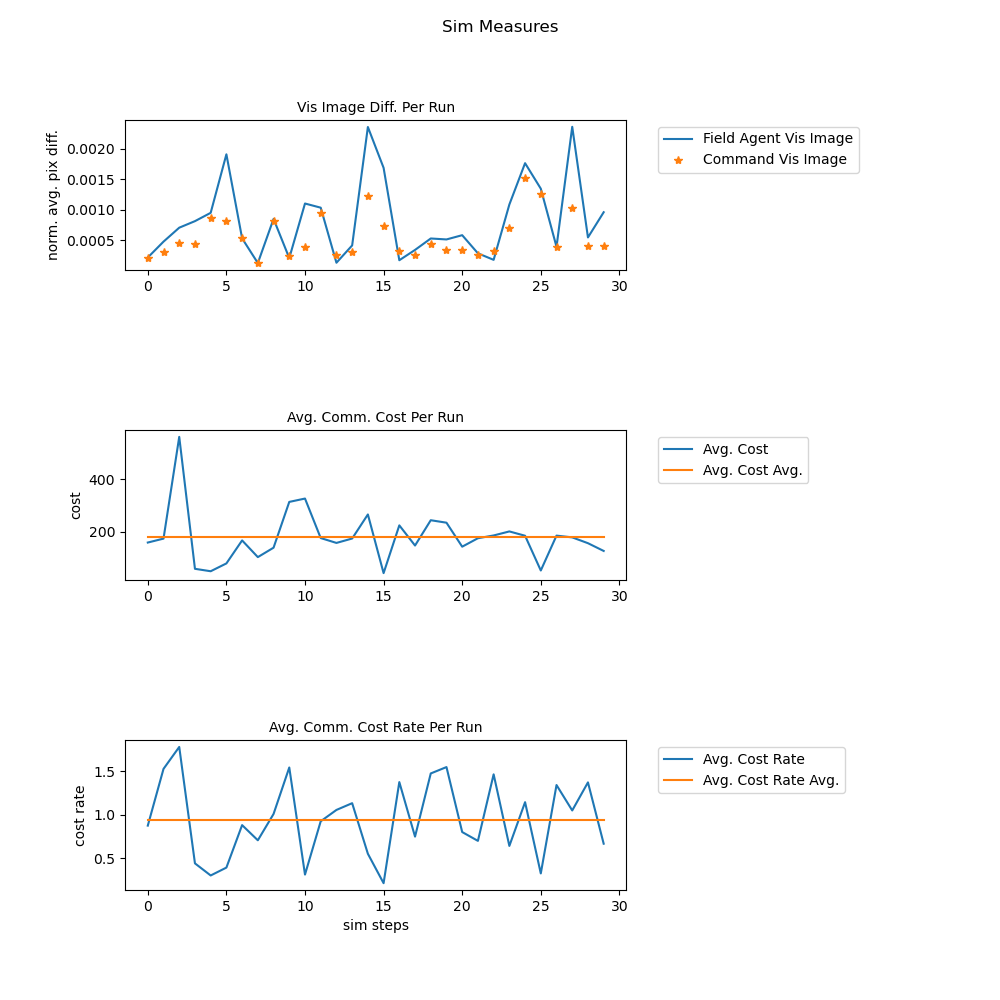

In [ ]:
plt.rcParams[ 'figure.figsize' ] = 10, 10
myFontsize = 10

timeToEndIncidentStackRun7 = timeToEndIncidentStack
avgFieldAgentVisImageDiffStackRun7 = avgFieldAgentVisImageDiffStack
avgCommanderAgentVisImageDiffStackRun7 = avgCommanderAgentVisImageDiffStack
avgCostStackRun7 = avgCostStack
avgCostStackRun7Avg = [ ( sum( avgCostStackRun7 ) / len( avgCostStackRun7 ) ) for x in avgCostStackRun7 ]
avgCostRateStackRun7 = avgCostRateStack
avgCostRateStackRun7Avg = [ ( sum( avgCostRateStackRun7 ) / len( avgCostRateStackRun7 ) ) for x in avgCostRateStackRun7 ]

measFig = plt.figure()
measGs = measFig.add_gridspec( 25, 3 )
measFig.suptitle( 'Sim Measures' )

imageDiffAx = measFig.add_subplot( measGs[ 0:5, 0:2 ] )
imageDiffDiv = make_axes_locatable( imageDiffAx )

costAx = measFig.add_subplot( measGs[ 10:15, 0:2 ] )
costDiv = make_axes_locatable( costAx )

costRateAx = measFig.add_subplot( measGs[ 20:25, 0:2 ] )
costRateDiv = make_axes_locatable( costRateAx )

imageDiffPlot = imageDiffAx.plot( avgFieldAgentVisImageDiffStackRun7, label = 'Field Agent Vis Image' )
imageDiffPlot = imageDiffAx.plot( avgCommanderAgentVisImageDiffStackRun7, '*', label = 'Command Vis Image' )
imageDiffPlotTitle = imageDiffAx.set_title( 'Vis Image Diff. Per Run', fontsize = myFontsize )
imageDiffAx.set_ylabel( 'norm. avg. pix diff.' )
imageDiffAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costPlot = costAx.plot( avgCostStackRun7, label = 'Avg. Cost' )
costPlot = costAx.plot( avgCostStackRun7Avg, label = 'Avg. Cost Avg.' )
costPlotTitle = costAx.set_title( 'Avg. Comm. Cost Per Run', fontsize = myFontsize )
costAx.set_ylabel( 'cost' )
costAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costRatePlot = costRateAx.plot( avgCostRateStackRun7, label = 'Avg. Cost Rate' )
costRatePlot = costRateAx.plot( avgCostRateStackRun7Avg, label = 'Avg. Cost Rate Avg.' )
costRatePlotTitle = costRateAx.set_title( 'Avg. Comm. Cost Rate Per Run', fontsize = myFontsize )
costRateAx.set_ylabel( 'cost rate' )
costRateAx.set_xlabel( 'sim steps' )
costRateAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

In [ ]:
timeToEndIncidentStack = []
avgFieldAgentVisImageDiffStack = []
avgCommanderAgentVisImageDiffStack = []
avgCostStack = []
avgCostRateStack = []
# numSims = 30

for i in range( 0, numSims ):
    
    mapWidth = 125
    mapHeight = 125

    incidentEpicenter = { 'x' : 60, 'y' : 60 }
    emergencyCreationAvgRate = 1 
    emergencySpatialAvg = 5
    emergencyIntensityAvg = 0.5 
    maxNumEmergencies = 30 
    maxEmergencyInteractionDist = 5 
    maxFieldAgentEffect = 0.1

    emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
    incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                        maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

    fieldAgentSize = 1
    reliabilityAvg = 0.5
    moveSpeedAvg = 3 
    tokenDistanceAvg = 10 
    tokenNoiseStdAvg = 0.01 
    maxAgentDist = 10 
    squadSize = 3
    platoonSize = 2 
    companySize = 1

    fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
    fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                              squadSize, platoonSize, companySize, mapWidth, mapHeight )
    fieldAgents.createCompany()
    fieldAgents.createCompany()
    fieldAgents.createCompany()
    fieldAgents.setRandomLocs()


    # nodeSize = 1 
    # minNodeIntensity = 15
    # numTotalNodes = 30
    # numDeployedNodes = 10
    # nodeDeploymentSpeedAvg = 100 
    # nodeDeploymentSpeedMax = 200 
    # nodeDeploymentSpeedMin = 50 
    # nodeDeployedTimeAvg = 200 
    # nodeChargeTimeAvg = 5 
    # linkPricePerDist = 0.000001 
    # incidentSize = 50
    # numTransfersPerStepAvg = 35
    # minNumTransfersPerStep = 20
    # innerNodeNum = 2 
    # middleNodeNum = 3 
    # outerNodeNum = 5

    nodeSize = 1 
    minNodeIntensity = 15
    numTotalNodes = 500
    numDeployedNodes = 200
    nodeDeploymentSpeedAvg = 100 
    nodeDeploymentSpeedMax = 200 
    nodeDeploymentSpeedMin = 50 
    nodeDeployedTimeAvg = 200 
    nodeChargeTimeAvg = 5 
    linkPricePerDist = 0.000001 
    incidentSize = 50
    numTransfersPerStepAvg = 15
    minNumTransfersPerStep = 5
    innerNodeNum = 30 
    middleNodeNum = 70 
    outerNodeNum = 100

    commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

    commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                              nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                              nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                              numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

    fieldAgents.commNodes = commNetwork.nodes

    numOfficers = 4
    interferenceRateAvg = 0.99
    interferenceIntensityAvg = 100
    underspendingRateAvg = 10
    overspendingRateAvg = 1000
    objectiveSizeAvg = 2
    maxObjectiveSize = 5
    minObjectiveSize = 1

    officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                                  overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                                  mapWidth )

    commanderAgent = CommanderAgent()

    simDivider = 10
    simTime = 20
    bigThisTime = 0


    fieldAgentVisImageDiffStack = []
    commanderAgentVisImageDiffStack = []

    while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

        bigThisTime += 1

        thisTime = bigThisTime / simDivider

        incident.companies = fieldAgents.companies

        incident.updateEmergencies( thisTime )

        emergencyMap.emergencies = incident.emergencies

        emergencyMap.updateMap()

        commNetwork.companies = fieldAgents.companies

        commNetwork.updateNodeLoc( thisTime )

        commNetwork.updateDirectedCommNetwork()

        commNetworkMap.nodes = commNetwork.nodes

        commNetworkMap.updateMap()

        fieldAgentMap.companies = fieldAgents.companies

        fieldAgentMap.updateMap()

        fieldAgents.emergencyMap = emergencyMap.currentMap 

        fieldAgents.commNetwork = commNetwork.directedNetwork

        fieldAgents.generateVisMap()

        fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

        officerAgents.visMap = fieldAgents.visMap

        officerAgents.updateObjectives()

        commanderAgent.visMap = officerAgents.alteredVisMap

        commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

        commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

        commanderAgent.updateOrderMap()

        fieldAgents.orderMap = commanderAgent.orderMap

        fieldAgents.moveAgents()

        print('thisSim: ', i,', thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

    fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
    commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]
    
    timeToEndIncidentStack.append( thisTime )
    avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
    avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
    avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
    avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

NameError: name 'numSims' is not defined

In [ ]:
plt.rcParams[ 'figure.figsize' ] = 10, 10

timeToEndIncidentStackRun8 = timeToEndIncidentStack
avgFieldAgentVisImageDiffStackRun8 = avgFieldAgentVisImageDiffStack
avgCommanderAgentVisImageDiffStackRun8 = avgCommanderAgentVisImageDiffStack
avgCostStackRun8 = avgCostStack
avgCostStackRun8Avg = [ ( sum( avgCostStackRun8 ) / len( avgCostStackRun8 ) ) for x in avgCostStackRun8 ]
avgCostRateStackRun8 = avgCostRateStack
avgCostRateStackRun8Avg = [ ( sum( avgCostRateStackRun8 ) / len( avgCostRateStackRun8 ) ) for x in avgCostRateStackRun8 ]

measFig = plt.figure()
measGs = measFig.add_gridspec( 25, 3 )
measFig.suptitle( 'Sim Measures' )

imageDiffAx = measFig.add_subplot( measGs[ 0:5, 0:2 ] )
imageDiffDiv = make_axes_locatable( imageDiffAx )

costAx = measFig.add_subplot( measGs[ 10:15, 0:2 ] )
costDiv = make_axes_locatable( costAx )

costRateAx = measFig.add_subplot( measGs[ 20:25, 0:2 ] )
costRateDiv = make_axes_locatable( costRateAx )

imageDiffPlot = imageDiffAx.plot( avgFieldAgentVisImageDiffStackRun8, label = 'Field Agent Vis Image' )
imageDiffPlot = imageDiffAx.plot( avgCommanderAgentVisImageDiffStackRun8, '*', label = 'Command Vis Image' )
imageDiffPlotTitle = imageDiffAx.set_title( 'Vis Image Diff. Per Run', fontsize = myFontsize )
imageDiffAx.set_ylabel( 'norm. avg. pix diff.' )
imageDiffAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costPlot = costAx.plot( avgCostStackRun8, label = 'Avg. Cost' )
costPlot = costAx.plot( avgCostStackRun8Avg, label = 'Avg. Cost Avg.' )
costPlotTitle = costAx.set_title( 'Avg. Comm. Cost Per Run', fontsize = myFontsize )
costAx.set_ylabel( 'cost' )
costAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

costRatePlot = costRateAx.plot( avgCostRateStackRun8, label = 'Avg. Cost Rate' )
costRatePlot = costRateAx.plot( avgCostRateStackRun8Avg, label = 'Avg. Cost Rate Avg.' )
costRatePlotTitle = costRateAx.set_title( 'Avg. Comm. Cost Rate Per Run', fontsize = myFontsize )
costRateAx.set_ylabel( 'cost rate' )
costRateAx.set_xlabel( 'sim steps' )
costRateAx.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )

In [ ]:
# mapWidth = 125
# mapHeight = 125

# incidentEpicenter = { 'x' : 60, 'y' : 60 }
# emergencyCreationAvgRate = 1 
# emergencySpatialAvg = 5
# emergencyIntensityAvg = 0.5 
# maxNumEmergencies = 15 
# maxEmergencyInteractionDist = 5 
# maxFieldAgentEffect = 0.1

# emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
# incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
#                     maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

# fieldAgentSize = 1
# reliabilityAvg = 0.5
# moveSpeedAvg = 10 
# tokenDistanceAvg = 10 
# tokenNoiseStdAvg = 0.01 
# maxAgentDist = 10 
# squadSize = 10
# platoonSize = 5 
# companySize = 3

# fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
# fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
#                           squadSize, platoonSize, companySize, mapWidth, mapHeight )
# fieldAgents.createCompany()
# fieldAgents.setRandomLocs()


# nodeSize = 1 
# minNodeIntensity = 15
# numTotalNodes = 30
# numDeployedNodes = 10
# nodeDeploymentSpeedAvg = 100 
# nodeDeploymentSpeedMax = 200 
# nodeDeploymentSpeedMin = 50 
# nodeDeployedTimeAvg = 200 
# nodeChargeTimeAvg = 5 
# linkPricePerDist = 0.000001 
# incidentSize = 50
# numTransfersPerStepAvg = 15
# minNumTransfersPerStep = 5
# innerNodeNum = 2 
# middleNodeNum = 3 
# outerNodeNum = 5

# # nodeSize = 1 
# # minNodeIntensity = 15
# # numTotalNodes = 50
# # numDeployedNodes = 20
# # nodeDeploymentSpeedAvg = 100 
# # nodeDeploymentSpeedMax = 200 
# # nodeDeploymentSpeedMin = 50 
# # nodeDeployedTimeAvg = 200 
# # nodeChargeTimeAvg = 5 
# # linkPricePerDist = 0.000001 
# # incidentSize = 50
# # numTransfersPerStepAvg = 35
# # minNumTransfersPerStep = 20
# # innerNodeNum = 3 
# # middleNodeNum = 7 
# # outerNodeNum = 10

# commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

# commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
#                           nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
#                           nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
#                           numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

# fieldAgents.commNodes = commNetwork.nodes

# numOfficers = 4
# interferenceRateAvg = 0.99
# interferenceIntensityAvg = 100
# underspendingRateAvg = 10
# overspendingRateAvg = 1000
# objectiveSizeAvg = 2
# maxObjectiveSize = 5
# minObjectiveSize = 1

# officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
#                               overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
#                               mapWidth )

# commanderAgent = CommanderAgent()

# simDivider = 10
# simTime = 20
# bigThisTime = 0

# #for i in range( 1, ( simTime * simDivider )):

# fieldAgentVisImageDiffStack = []
# commanderAgentVisImageDiffStack = []

# while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):
    
#     bigThisTime += 1
    
#     thisTime = bigThisTime / simDivider
    
#     incident.companies = fieldAgents.companies
    
#     incident.updateEmergencies( thisTime )
    
#     emergencyMap.emergencies = incident.emergencies
    
#     emergencyMap.updateMap()
    
#     commNetwork.companies = fieldAgents.companies
    
#     commNetwork.updateNodeLoc( thisTime )
    
#     commNetwork.updateDirectedCommNetwork()
    
#     commNetworkMap.nodes = commNetwork.nodes
    
#     commNetworkMap.updateMap()
    
#     fieldAgentMap.companies = fieldAgents.companies

#     fieldAgentMap.updateMap()
    
#     fieldAgents.emergencyMap = emergencyMap.currentMap 
    
#     fieldAgents.commNetwork = commNetwork.directedNetwork
    
#     fieldAgents.generateVisMap()
    
#     fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )
    
#     fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )
    
#     officerAgents.visMap = fieldAgents.visMap

#     officerAgents.updateObjectives()
    
#     commanderAgent.visMap = officerAgents.alteredVisMap
    
#     commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )
    
#     commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

#     commanderAgent.updateOrderMap()
    
#     fieldAgents.orderMap = commanderAgent.orderMap

#     fieldAgents.moveAgents()
    
#     print('thisTime: ', thisTime, 'totalNumEmergencies: ', incident.totalNumEmergencies, 'currentNumEmergencies: ', len( incident.emergencies ), 'numEmergenciesEnded: ', incident.numEmergenciesEnded )

# timeToEndIncident = thisTime

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  0.1 totalNumEmergencies:  0 currentNumEmergencies:  0 numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!


<ipython-input-11-d3ae80301edf>:4: RuntimeWarning: invalid value encountered in true_divide
  normImage1 = image1 / norm1
<ipython-input-11-d3ae80301edf>:7: RuntimeWarning: invalid value encountered in true_divide
  normImage2 = image2 / norm2


thisTime:  0.2 totalNumEmergencies:  0 currentNumEmergencies:  0 numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  0.3 totalNumEmergencies:  0 currentNumEmergencies:  0 numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  0.4 totalNumEmergencies:  0 currentNumEmergencies:  0 numEmergenciesEnded:  0
cannot transfer!
thisTime:  0.5 totalNumEmergencies:  0 currentNumEmergencies:  0 numEmergenciesEnded:  0
cannot transfer!
thisTime:  0.6 totalNumEmergencies:  0 currentNumEmergencies:  0 numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  0.7 totalNumEmergencies:  0 currentNumEmergencies:  0 numEmergenciesEnded:  0
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  0.8 totalNumE

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  6.4 totalNumEmergencies:  4 currentNumEmergencies:  0 numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  6.5 totalNumEmergencies:  4 currentNumEmergencies:  0 numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  6.6 totalNumEmergencies:  5 currentNumEmergencies:  1 numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  6.7 totalNumEmergencies:  5 currentNumEmergencies:  1 numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  6.8 totalNumEmergencies:  5 currentNumEmergencies:  1 numEmergenciesEnded:  4
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  6.9 totalNumEmergencies:  5 curren

cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  11.3 totalNumEmergencies:  8 currentNumEmergencies:  3 numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  11.4 totalNumEmergencies:  8 currentNumEmergencies:  3 numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  11.5 totalNumEmergencies:  8 currentNumEmergencies:  3 numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  11.6 totalNumEmergencies:  8 currentNumEmergencies:  3 numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  11.7 totalNumEmergencies:  8 currentNumEmergencies:  3 numEmergenciesEnded:  5
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
cannot transfer!
thisTime:  11.8 totalNumEmergencies:  8 currentNumEmergencies:  3 numEmerg

In [ ]:
# framesPerSec = 30
# myFontsize = 9

# mapFig = plt.figure()
# mapGs = mapFig.add_gridspec( 20, 20 )
# mapFig.suptitle( 'Time: 0' )

# mapAxEmergency = mapFig.add_subplot( mapGs[ 0:5, 0:3 ] )
# mapDivEmergency = make_axes_locatable( mapAxEmergency )

# mapAxFieldAgents = mapFig.add_subplot( mapGs[ 0:5, 5:8 ] )
# mapDivFieldAgents = make_axes_locatable( mapAxFieldAgents )

# mapAxCommNetwork = mapFig.add_subplot( mapGs[ 0:5, 10:13 ] )
# mapDivCommNetwork = make_axes_locatable( mapAxCommNetwork )

# mapAxAgentVis = mapFig.add_subplot( mapGs[ 7:12, 0:3 ] )
# mapDivAgentVis = make_axes_locatable( mapAxAgentVis )

# mapAxAlteredVis = mapFig.add_subplot( mapGs[ 7:12, 5:8 ] )
# mapDivAlteredVis = make_axes_locatable( mapAxAlteredVis )

# mapAxOrders = mapFig.add_subplot( mapGs[ 7:12, 10:13 ] )
# mapDivOrders = make_axes_locatable( mapAxOrders )

# axBarCommCosts = mapFig.add_subplot( mapGs[ 15:20, 0:3 ])
# axBarCommCostRate = mapFig.add_subplot( mapGs[ 15:20, 5:8 ])
# axBarTotalEmergencies = mapFig.add_subplot( mapGs[ 15:20, 10:13 ])
# axBarEmergenciesEnded = mapFig.add_subplot( mapGs[ 15:20, 14:17 ])

# firstMapEmergency = emergencyMap.mapStack[ 0 ]
# mapImageEmergency = mapAxEmergency.imshow( firstMapEmergency, origin = 'lower' )
# mapImageEmergency.set_cmap( 'Blues_r' )
# mapAxTitleEmergency = mapAxEmergency.set_title( 'Emergency Locs', fontsize = myFontsize )

# firstMapFieldAgents = fieldAgentMap.mapStack[ 0 ]
# mapImageFieldAgents = mapAxFieldAgents.imshow( firstMapFieldAgents, origin = 'lower' )
# mapImageFieldAgents.set_cmap( 'Blues_r' )
# mapAxTitleFieldAgents = mapAxFieldAgents.set_title( 'Field Agent Locs', fontsize = myFontsize )

# firstMapCommNetwork = commNetworkMap.mapStack[ 0 ]
# mapImageCommNetwork = mapAxCommNetwork.imshow( firstMapCommNetwork, origin = 'lower' )
# mapImageCommNetwork.set_cmap( 'Blues_r' )
# mapAxTitleCommNetwork = mapAxCommNetwork.set_title( 'Comm Node Locs', fontsize = myFontsize )

# firstMapAgentVis = fieldAgents.visMapStack[ 0 ]
# mapImageAgentVis = mapAxAgentVis.imshow( firstMapAgentVis, origin = 'lower' )
# mapImageAgentVis.set_cmap( 'Blues_r' )
# mapAxTitleAgentVis = mapAxAgentVis.set_title( 'Field Agent Vis', fontsize = myFontsize )

# firstMapAlteredVis = officerAgents.alteredVisMapStack[ 0 ]
# mapImageAlteredVis = mapAxAlteredVis.imshow( firstMapAlteredVis, origin = 'lower' )
# mapImageAlteredVis.set_cmap( 'Blues_r' )
# mapAxTitleAlteredVis = mapAxAlteredVis.set_title( 'Officer Agent Vis', fontsize = myFontsize )

# firstMapOrders = commanderAgent.orderMapStack[ 0 ]
# mapImageOrders = mapAxOrders.imshow( firstMapOrders, origin = 'lower' )
# mapImageOrders.set_cmap( 'Blues_r' )
# mapAxTitleOrders = mapAxOrders.set_title( 'Commander Orders', fontsize = myFontsize )

# firstCommCosts = fieldAgents.commCostStack[ 0 ] 
# firstCommCostRate = fieldAgents.commCostRateStack[ 0 ] 
# firstTotalEmergencies = incident.totalNumEmergenciesStack[ 0 ]
# firstEmergenciesEnded = incident.numEmergenciesEndedStack [ 0 ] 

# barPlotCommCosts = axBarCommCosts.bar( 'Comm. Costs' , firstCommCosts )
# barPlotCommCostRate = axBarCommCostRate.bar( 'Comm. Cost Rate' , firstCommCostRate )
# barPlotTotalEmergencies = axBarTotalEmergencies.bar( 'Total Emergen.', firstTotalEmergencies )
# barPlotEmergenciesEnded = axBarEmergenciesEnded.bar( 'Emergen. Ended', firstEmergenciesEnded )

# axBarCommCosts.set_ylim( [0, max( fieldAgents.commCostStack ) ] )
# axBarCommCostRate.set_ylim( [0, max( fieldAgents.commCostRateStack ) ] )
# axBarTotalEmergencies.set_ylim( [0, max( incident.totalNumEmergenciesStack ) ] ) 
# axBarEmergenciesEnded.set_ylim( [0, max( incident.numEmergenciesEndedStack ) ] ) 

# axBarCommCosts.yaxis.set_ticks( [] )
# axBarCommCostRate.yaxis.set_ticks( [] )
# axBarTotalEmergencies.yaxis.set_ticks( [] )
# axBarEmergenciesEnded.yaxis.set_ticks( [] )

# axBarCommCosts.set_xticklabels( [ 'Comm. Costs' ], fontsize = myFontsize )
# axBarCommCostRate.set_xticklabels( [ 'Comm. Cost Rate' ], fontsize = myFontsize )
# axBarTotalEmergencies.set_xticklabels( [ 'Total Emer.' ], fontsize = myFontsize )
# axBarEmergenciesEnded.set_xticklabels( [ 'Emer. Ended' ], fontsize = myFontsize )

# axBarCommCosts.set_title( str( "${:.2f}".format( firstCommCosts ) ), fontsize = myFontsize )
# axBarCommCostRate.set_title( str( "${:.2f}".format( firstCommCostRate ) ), fontsize = myFontsize )
# axBarTotalEmergencies.set_title( str( "{:.2f}".format( firstTotalEmergencies ) ), fontsize = myFontsize )
# axBarEmergenciesEnded.set_title( str( "{:.2f}".format( firstEmergenciesEnded ) ), fontsize = myFontsize )

# def animateMap( i ):
    
#     mapFig.suptitle( 'Time: {0}'.format( i / 10 ) )
    
#     thisMapEmergency  = emergencyMap.mapStack[ i ]   
#     maxCountEmergency = np.max( thisMapEmergency )
#     minCountEmergency = np.min( thisMapEmergency )
#     mapImageEmergency.set_data( thisMapEmergency ) 
#     mapImageEmergency.set_clim( minCountEmergency, maxCountEmergency )
    
#     thisMapFieldAgents  = fieldAgentMap.mapStack[ i ]   
#     maxCountFieldAgents = np.max( thisMapFieldAgents )
#     minCountFieldAgents = np.min( thisMapFieldAgents )
#     mapImageFieldAgents.set_data( thisMapFieldAgents )  
#     mapImageFieldAgents.set_clim( minCountFieldAgents, maxCountFieldAgents )
    
#     thisMapCommNetwork  = commNetworkMap.mapStack[ i ]
#     maxCountCommNetwork = np.max( thisMapCommNetwork )
#     minCountCommNetwork = np.min( thisMapCommNetwork )
#     mapImageCommNetwork.set_data( thisMapCommNetwork )
#     mapImageCommNetwork.set_clim( minCountCommNetwork, maxCountCommNetwork )
    
#     thisMapAgentVis  = fieldAgents.visMapStack[ i ]
#     maxCountAgentVis = np.max( thisMapAgentVis )
#     minCountAgentVis = np.min( thisMapAgentVis )
#     mapImageAgentVis.set_data( thisMapAgentVis )
#     mapImageAgentVis.set_clim( minCountAgentVis, maxCountAgentVis )
    
#     thisMapAlteredVis  = officerAgents.alteredVisMapStack[ i ]
#     maxCountAlteredVis = np.max( thisMapAlteredVis )
#     minCountAlteredVis = np.min( thisMapAlteredVis )
#     mapImageAlteredVis.set_data( thisMapAlteredVis )
#     mapImageAlteredVis.set_clim( minCountAlteredVis, maxCountAlteredVis )
    
#     thisMapOrders  = commanderAgent.orderMapStack[ i ]
#     maxCountOrders = np.max( thisMapOrders )
#     minCountOrders = np.min( thisMapOrders )
#     mapImageOrders.set_data( thisMapOrders )
#     mapImageOrders.set_clim( minCountOrders, maxCountOrders )
    
#     commCosts = fieldAgents.commCostStack[ i ] 
#     commCostRate = fieldAgents.commCostRateStack[ i ] 
#     totalEmergencies = incident.totalNumEmergenciesStack[ i ]
#     emergenciesEnded = incident.numEmergenciesEndedStack [ i ]

#     axBarCommCosts.clear()
#     axBarCommCostRate.clear()
#     axBarTotalEmergencies.clear()
#     axBarEmergenciesEnded.clear()
    
#     barPlotCommCosts = axBarCommCosts.bar( 'commCosts' , commCosts )
#     barPlotCommCostRate = axBarCommCostRate.bar( 'commCostRate' , commCostRate )
#     barPlotTotalEmergencies = axBarTotalEmergencies.bar( 'Total Emergen.', totalEmergencies )
#     barPlotEmergenciesEnded = axBarEmergenciesEnded.bar( 'Emergen. Ended', emergenciesEnded )
    
#     axBarCommCosts.set_ylim( [0, max( fieldAgents.commCostStack ) ] )
#     axBarCommCostRate.set_ylim( [0, max( fieldAgents.commCostRateStack ) ] )
#     axBarTotalEmergencies.set_ylim( [0, max( incident.totalNumEmergenciesStack ) ] ) 
#     axBarEmergenciesEnded.set_ylim( [0, max( incident.numEmergenciesEndedStack ) ] ) 
    
#     axBarCommCosts.yaxis.set_ticks( [] )
#     axBarCommCostRate.yaxis.set_ticks( [] )
#     axBarTotalEmergencies.yaxis.set_ticks( [] )
#     axBarEmergenciesEnded.yaxis.set_ticks( [] )
    
#     axBarCommCosts.set_xticklabels( [ 'Comm. Costs' ], fontsize = myFontsize )
#     axBarCommCostRate.set_xticklabels( [ 'Comm. Cost Rate' ], fontsize = myFontsize )
#     axBarTotalEmergencies.set_xticklabels( [ 'Total Emer.' ], fontsize = myFontsize )
#     axBarEmergenciesEnded.set_xticklabels( [ 'Emer. Ended' ], fontsize = myFontsize )
    
#     axBarCommCosts.set_title( str( "${:.2f}".format( commCosts ) ), fontsize = myFontsize )
#     axBarCommCostRate.set_title( str( "${:.2f}".format( commCostRate ) ), fontsize = myFontsize )
#     axBarTotalEmergencies.set_title( str( "{:.2f}".format( totalEmergencies ) ), fontsize = myFontsize )
#     axBarEmergenciesEnded.set_title( str( "{:.2f}".format( emergenciesEnded ) ), fontsize = myFontsize )
    
#     return ( mapImageEmergency, mapImageFieldAgents, mapImageCommNetwork, mapImageAgentVis, mapImageAlteredVis, mapImageOrders, barPlotTotalEmergencies, barPlotEmergenciesEnded, barPlotCommCostRate, barPlotCommCosts )

# anim = animation.FuncAnimation( mapFig, animateMap, frames = len( emergencyMap.mapStack ), interval = ( 1000 / framesPerSec), blit = True )


In [ ]:
mapWidth = 125
mapHeight = 125

incidentEpicenter = { 'x' : 60, 'y' : 60 }
emergencyCreationAvgRate = 1 
emergencySpatialAvg = 5
emergencyIntensityAvg = 0.5 
maxNumEmergencies = 30 
maxEmergencyInteractionDist = 5 
maxFieldAgentEffect = 0.1

emergencyMap = EmergencyMap(mapWidth, mapHeight, 1, 3)
incident = Incident( incidentEpicenter, emergencyCreationAvgRate, emergencySpatialAvg, emergencyIntensityAvg, \
                    maxNumEmergencies, maxEmergencyInteractionDist, maxFieldAgentEffect, mapWidth, mapHeight )

fieldAgentSize = 1
reliabilityAvg = 0.5
moveSpeedAvg = 3 
tokenDistanceAvg = 10 
tokenNoiseStdAvg = 0.01 
maxAgentDist = 10 
squadSize = 5
platoonSize = 3 
companySize = 2

fieldAgentMap = FieldAgentMap( mapWidth, mapHeight, fieldAgentSize )
fieldAgents = FieldAgents( reliabilityAvg, moveSpeedAvg, tokenDistanceAvg, tokenNoiseStdAvg, maxAgentDist, \
                          squadSize, platoonSize, companySize, mapWidth, mapHeight )
fieldAgents.createCompany()
fieldAgents.createCompany()
fieldAgents.createCompany()
fieldAgents.setRandomLocs()


# nodeSize = 1 
# minNodeIntensity = 15
# numTotalNodes = 30
# numDeployedNodes = 10
# nodeDeploymentSpeedAvg = 100 
# nodeDeploymentSpeedMax = 200 
# nodeDeploymentSpeedMin = 50 
# nodeDeployedTimeAvg = 200 
# nodeChargeTimeAvg = 5 
# linkPricePerDist = 0.000001 
# incidentSize = 50
# numTransfersPerStepAvg = 35
# minNumTransfersPerStep = 20
# innerNodeNum = 2 
# middleNodeNum = 3 
# outerNodeNum = 5

nodeSize = 1 
minNodeIntensity = 15
numTotalNodes = 500
numDeployedNodes = 200
nodeDeploymentSpeedAvg = 100 
nodeDeploymentSpeedMax = 200 
nodeDeploymentSpeedMin = 50 
nodeDeployedTimeAvg = 200 
nodeChargeTimeAvg = 5 
linkPricePerDist = 0.000001 
incidentSize = 50
numTransfersPerStepAvg = 15
minNumTransfersPerStep = 5
innerNodeNum = 30 
middleNodeNum = 70 
outerNodeNum = 100

commNetworkMap = CommNetworkMap(mapWidth, mapHeight, nodeSize, minNodeIntensity)

commNetwork = CommNetwork( numTotalNodes, numDeployedNodes, nodeDeploymentSpeedAvg, \
                          nodeDeploymentSpeedMax, nodeDeploymentSpeedMin, nodeDeployedTimeAvg, \
                          nodeChargeTimeAvg, linkPricePerDist, incidentEpicenter, incidentSize, \
                          numTransfersPerStepAvg, minNumTransfersPerStep, innerNodeNum, middleNodeNum, outerNodeNum )

fieldAgents.commNodes = commNetwork.nodes

numOfficers = 4
interferenceRateAvg = 0.99
interferenceIntensityAvg = 100
underspendingRateAvg = 10
overspendingRateAvg = 1000
objectiveSizeAvg = 2
maxObjectiveSize = 5
minObjectiveSize = 1

officerAgents = OfficerAgents( numOfficers, interferenceRateAvg, interferenceIntensityAvg, underspendingRateAvg, \
                              overspendingRateAvg, objectiveSizeAvg, maxObjectiveSize, minObjectiveSize, mapHeight, \
                              mapWidth )

commanderAgent = CommanderAgent()

simDivider = 10
simTime = 20
bigThisTime = 0


fieldAgentVisImageDiffStack = []
commanderAgentVisImageDiffStack = []

while ( not( incident.numEmergenciesEnded >= incident.maxNumEmergencies ) ):

    bigThisTime += 1

    thisTime = bigThisTime / simDivider

    incident.companies = fieldAgents.companies

    incident.updateEmergencies( thisTime )

    emergencyMap.emergencies = incident.emergencies

    emergencyMap.updateMap()

    commNetwork.companies = fieldAgents.companies

    commNetwork.updateNodeLoc( thisTime )

    commNetwork.updateDirectedCommNetwork()

    commNetworkMap.nodes = commNetwork.nodes

    commNetworkMap.updateMap()

    fieldAgentMap.companies = fieldAgents.companies

    fieldAgentMap.updateMap()

    fieldAgents.emergencyMap = emergencyMap.currentMap 

    fieldAgents.commNetwork = commNetwork.directedNetwork

    fieldAgents.generateVisMap()

    fieldAgentVisImageDiff = imageDiff( fieldAgents.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

    fieldAgentVisImageDiffStack.append( fieldAgentVisImageDiff )

    officerAgents.visMap = fieldAgents.visMap

    officerAgents.updateObjectives()

    commanderAgent.visMap = officerAgents.alteredVisMap

    commanderAgentVisImageDiff = imageDiff( commanderAgent.visMap, emergencyMap.currentMap, mapWidth, mapHeight )

    commanderAgentVisImageDiffStack.append( commanderAgentVisImageDiff )

    commanderAgent.updateOrderMap()

    fieldAgents.orderMap = commanderAgent.orderMap

    fieldAgents.moveAgents()

    print('thisTime: ', thisTime, ', totalNumEmergencies: ', incident.totalNumEmergencies, ', currentNumEmergencies: ', len( incident.emergencies ), ', numEmergenciesEnded: ', incident.numEmergenciesEnded )

fieldAgentVisImageDiffStack = [ x for x in fieldAgentVisImageDiffStack if str( x ) != 'nan' ]
commanderAgentVisImageDiffStack = [ x for x in commanderAgentVisImageDiffStack if str( x ) != 'nan' ]

timeToEndIncidentStack.append( thisTime )
avgFieldAgentVisImageDiffStack.append( sum( fieldAgentVisImageDiffStack ) / len( fieldAgentVisImageDiffStack ) )
avgCommanderAgentVisImageDiffStack.append( sum( commanderAgentVisImageDiffStack ) / len( commanderAgentVisImageDiffStack ) )
avgCostStack.append( sum( fieldAgents.commCostStack ) / len( fieldAgents.commCostStack ) )
avgCostRateStack.append( sum( fieldAgents.commCostRateStack ) / len( fieldAgents.commCostRateStack ) )

<IPython.core.display.Javascript object>


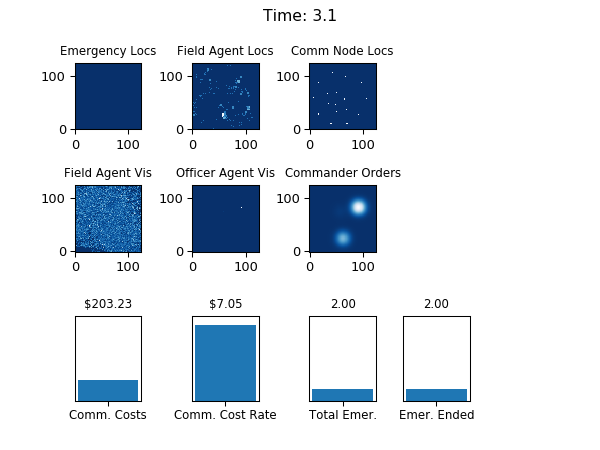

In [ ]:
framesPerSec = 30
myFontsize = 9

mapFig = plt.figure()
mapGs = mapFig.add_gridspec( 20, 20 )
mapFig.suptitle( 'Time: 0' )

mapAxEmergency = mapFig.add_subplot( mapGs[ 0:5, 0:3 ] )
mapDivEmergency = make_axes_locatable( mapAxEmergency )

mapAxFieldAgents = mapFig.add_subplot( mapGs[ 0:5, 5:8 ] )
mapDivFieldAgents = make_axes_locatable( mapAxFieldAgents )

mapAxCommNetwork = mapFig.add_subplot( mapGs[ 0:5, 10:13 ] )
mapDivCommNetwork = make_axes_locatable( mapAxCommNetwork )

mapAxAgentVis = mapFig.add_subplot( mapGs[ 7:12, 0:3 ] )
mapDivAgentVis = make_axes_locatable( mapAxAgentVis )

mapAxAlteredVis = mapFig.add_subplot( mapGs[ 7:12, 5:8 ] )
mapDivAlteredVis = make_axes_locatable( mapAxAlteredVis )

mapAxOrders = mapFig.add_subplot( mapGs[ 7:12, 10:13 ] )
mapDivOrders = make_axes_locatable( mapAxOrders )

axBarCommCosts = mapFig.add_subplot( mapGs[ 15:20, 0:3 ])
axBarCommCostRate = mapFig.add_subplot( mapGs[ 15:20, 5:8 ])
axBarTotalEmergencies = mapFig.add_subplot( mapGs[ 15:20, 10:13 ])
axBarEmergenciesEnded = mapFig.add_subplot( mapGs[ 15:20, 14:17 ])

firstMapEmergency = emergencyMap.mapStack[ 0 ]
mapImageEmergency = mapAxEmergency.imshow( firstMapEmergency, origin = 'lower' )
mapImageEmergency.set_cmap( 'Blues_r' )
mapAxTitleEmergency = mapAxEmergency.set_title( 'Emergency Locs', fontsize = myFontsize )

firstMapFieldAgents = fieldAgentMap.mapStack[ 0 ]
mapImageFieldAgents = mapAxFieldAgents.imshow( firstMapFieldAgents, origin = 'lower' )
mapImageFieldAgents.set_cmap( 'Blues_r' )
mapAxTitleFieldAgents = mapAxFieldAgents.set_title( 'Field Agent Locs', fontsize = myFontsize )

firstMapCommNetwork = commNetworkMap.mapStack[ 0 ]
mapImageCommNetwork = mapAxCommNetwork.imshow( firstMapCommNetwork, origin = 'lower' )
mapImageCommNetwork.set_cmap( 'Blues_r' )
mapAxTitleCommNetwork = mapAxCommNetwork.set_title( 'Comm Node Locs', fontsize = myFontsize )

firstMapAgentVis = fieldAgents.visMapStack[ 0 ]
mapImageAgentVis = mapAxAgentVis.imshow( firstMapAgentVis, origin = 'lower' )
mapImageAgentVis.set_cmap( 'Blues_r' )
mapAxTitleAgentVis = mapAxAgentVis.set_title( 'Field Agent Vis', fontsize = myFontsize )

firstMapAlteredVis = officerAgents.alteredVisMapStack[ 0 ]
mapImageAlteredVis = mapAxAlteredVis.imshow( firstMapAlteredVis, origin = 'lower' )
mapImageAlteredVis.set_cmap( 'Blues_r' )
mapAxTitleAlteredVis = mapAxAlteredVis.set_title( 'Officer Agent Vis', fontsize = myFontsize )

firstMapOrders = commanderAgent.orderMapStack[ 0 ]
mapImageOrders = mapAxOrders.imshow( firstMapOrders, origin = 'lower' )
mapImageOrders.set_cmap( 'Blues_r' )
mapAxTitleOrders = mapAxOrders.set_title( 'Commander Orders', fontsize = myFontsize )

firstCommCosts = fieldAgents.commCostStack[ 0 ] 
firstCommCostRate = fieldAgents.commCostRateStack[ 0 ] 
firstTotalEmergencies = incident.totalNumEmergenciesStack[ 0 ]
firstEmergenciesEnded = incident.numEmergenciesEndedStack [ 0 ] 

barPlotCommCosts = axBarCommCosts.bar( 'Comm. Costs' , firstCommCosts )
barPlotCommCostRate = axBarCommCostRate.bar( 'Comm. Cost Rate' , firstCommCostRate )
barPlotTotalEmergencies = axBarTotalEmergencies.bar( 'Total Emergen.', firstTotalEmergencies )
barPlotEmergenciesEnded = axBarEmergenciesEnded.bar( 'Emergen. Ended', firstEmergenciesEnded )

axBarCommCosts.set_ylim( [0, max( fieldAgents.commCostStack ) ] )
axBarCommCostRate.set_ylim( [0, max( fieldAgents.commCostRateStack ) ] )
axBarTotalEmergencies.set_ylim( [0, max( incident.totalNumEmergenciesStack ) ] ) 
axBarEmergenciesEnded.set_ylim( [0, max( incident.numEmergenciesEndedStack ) ] ) 

axBarCommCosts.yaxis.set_ticks( [] )
axBarCommCostRate.yaxis.set_ticks( [] )
axBarTotalEmergencies.yaxis.set_ticks( [] )
axBarEmergenciesEnded.yaxis.set_ticks( [] )

axBarCommCosts.set_xticklabels( [ 'Comm. Costs' ], fontsize = myFontsize )
axBarCommCostRate.set_xticklabels( [ 'Comm. Cost Rate' ], fontsize = myFontsize )
axBarTotalEmergencies.set_xticklabels( [ 'Total Emer.' ], fontsize = myFontsize )
axBarEmergenciesEnded.set_xticklabels( [ 'Emer. Ended' ], fontsize = myFontsize )

axBarCommCosts.set_title( str( "${:.2f}".format( firstCommCosts ) ), fontsize = myFontsize )
axBarCommCostRate.set_title( str( "${:.2f}".format( firstCommCostRate ) ), fontsize = myFontsize )
axBarTotalEmergencies.set_title( str( "{:.2f}".format( firstTotalEmergencies ) ), fontsize = myFontsize )
axBarEmergenciesEnded.set_title( str( "{:.2f}".format( firstEmergenciesEnded ) ), fontsize = myFontsize )

def animateMap( i ):
    
    mapFig.suptitle( 'Time: {0}'.format( i / 10 ) )
    
    thisMapEmergency  = emergencyMap.mapStack[ i ]   
    maxCountEmergency = np.max( thisMapEmergency )
    minCountEmergency = np.min( thisMapEmergency )
    mapImageEmergency.set_data( thisMapEmergency ) 
    mapImageEmergency.set_clim( minCountEmergency, maxCountEmergency )
    
    thisMapFieldAgents  = fieldAgentMap.mapStack[ i ]   
    maxCountFieldAgents = np.max( thisMapFieldAgents )
    minCountFieldAgents = np.min( thisMapFieldAgents )
    mapImageFieldAgents.set_data( thisMapFieldAgents )  
    mapImageFieldAgents.set_clim( minCountFieldAgents, maxCountFieldAgents )
    
    thisMapCommNetwork  = commNetworkMap.mapStack[ i ]
    maxCountCommNetwork = np.max( thisMapCommNetwork )
    minCountCommNetwork = np.min( thisMapCommNetwork )
    mapImageCommNetwork.set_data( thisMapCommNetwork )
    mapImageCommNetwork.set_clim( minCountCommNetwork, maxCountCommNetwork )
    
    thisMapAgentVis  = fieldAgents.visMapStack[ i ]
    maxCountAgentVis = np.max( thisMapAgentVis )
    minCountAgentVis = np.min( thisMapAgentVis )
    mapImageAgentVis.set_data( thisMapAgentVis )
    mapImageAgentVis.set_clim( minCountAgentVis, maxCountAgentVis )
    
    thisMapAlteredVis  = officerAgents.alteredVisMapStack[ i ]
    maxCountAlteredVis = np.max( thisMapAlteredVis )
    minCountAlteredVis = np.min( thisMapAlteredVis )
    mapImageAlteredVis.set_data( thisMapAlteredVis )
    mapImageAlteredVis.set_clim( minCountAlteredVis, maxCountAlteredVis )
    
    thisMapOrders  = commanderAgent.orderMapStack[ i ]
    maxCountOrders = np.max( thisMapOrders )
    minCountOrders = np.min( thisMapOrders )
    mapImageOrders.set_data( thisMapOrders )
    mapImageOrders.set_clim( minCountOrders, maxCountOrders )
    
    commCosts = fieldAgents.commCostStack[ i ] 
    commCostRate = fieldAgents.commCostRateStack[ i ] 
    totalEmergencies = incident.totalNumEmergenciesStack[ i ]
    emergenciesEnded = incident.numEmergenciesEndedStack [ i ]

    axBarCommCosts.clear()
    axBarCommCostRate.clear()
    axBarTotalEmergencies.clear()
    axBarEmergenciesEnded.clear()
    
    barPlotCommCosts = axBarCommCosts.bar( 'commCosts' , commCosts )
    barPlotCommCostRate = axBarCommCostRate.bar( 'commCostRate' , commCostRate )
    barPlotTotalEmergencies = axBarTotalEmergencies.bar( 'Total Emergen.', totalEmergencies )
    barPlotEmergenciesEnded = axBarEmergenciesEnded.bar( 'Emergen. Ended', emergenciesEnded )
    
    axBarCommCosts.set_ylim( [0, max( fieldAgents.commCostStack ) ] )
    axBarCommCostRate.set_ylim( [0, max( fieldAgents.commCostRateStack ) ] )
    axBarTotalEmergencies.set_ylim( [0, max( incident.totalNumEmergenciesStack ) ] ) 
    axBarEmergenciesEnded.set_ylim( [0, max( incident.numEmergenciesEndedStack ) ] ) 
    
    axBarCommCosts.yaxis.set_ticks( [] )
    axBarCommCostRate.yaxis.set_ticks( [] )
    axBarTotalEmergencies.yaxis.set_ticks( [] )
    axBarEmergenciesEnded.yaxis.set_ticks( [] )
    
    axBarCommCosts.set_xticklabels( [ 'Comm. Costs' ], fontsize = myFontsize )
    axBarCommCostRate.set_xticklabels( [ 'Comm. Cost Rate' ], fontsize = myFontsize )
    axBarTotalEmergencies.set_xticklabels( [ 'Total Emer.' ], fontsize = myFontsize )
    axBarEmergenciesEnded.set_xticklabels( [ 'Emer. Ended' ], fontsize = myFontsize )
    
    axBarCommCosts.set_title( str( "${:.2f}".format( commCosts ) ), fontsize = myFontsize )
    axBarCommCostRate.set_title( str( "${:.2f}".format( commCostRate ) ), fontsize = myFontsize )
    axBarTotalEmergencies.set_title( str( "{:.2f}".format( totalEmergencies ) ), fontsize = myFontsize )
    axBarEmergenciesEnded.set_title( str( "{:.2f}".format( emergenciesEnded ) ), fontsize = myFontsize )
    
    return ( mapImageEmergency, mapImageFieldAgents, mapImageCommNetwork, mapImageAgentVis, mapImageAlteredVis, mapImageOrders, barPlotTotalEmergencies, barPlotEmergenciesEnded, barPlotCommCostRate, barPlotCommCosts )

anim = animation.FuncAnimation( mapFig, animateMap, frames = len( emergencyMap.mapStack ), interval = ( 1000 / framesPerSec), blit = True )
